In [1]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib import cm
import numpy as np
import struct
import sys
from array import array
import itertools
import os
from scipy import signal
from scipy.optimize import curve_fit
import subprocess
import shutil
from scipy.signal import find_peaks
import pandas as pd
pi = np.pi
clight = 299792458
E0Au = 196.9665687*931.5e6
E0Elec = 0.51099895000e6
clight = 299792458

In [2]:
def func_exp_fit(x, a, b, c):
    return a*np.exp(b*x)+c

In [3]:
def get_folders(folders,cwd):
    new_folders = []
    for folder in folders:
        if os.path.isdir(os.path.join(cwd,folder)):
            print(folder)
            new_folders.append(folder)
    return new_folders

In [4]:
#os.chdir('/home/txin/Dropbox/code/Cpp/APES_pack/APES8.4/bench/')
#working_folder = '/home/txin/Dropbox/code/Cpp/APES_pack/APES8.4/bench/case19_7_map_2/'
#working_folder = '/home/txin/Dropbox/code/Cpp/APES_pack/APES8.4/bench/case_studies/case19_8_1/'
#working_folder = '/media/dataHD/APES_sim_data/CBI/APES/case19_8/' # 18cav1cell case
#working_folder = '/media/dataHD/APES_sim_data/EIC/eSR/case_studies/case1/'
#working_folder = '/home/txin/Dropbox/code/Cpp/APES_pack/APES8.4/bench/case19_7_map_591_3rf_1cell/'
#working_folder = '/home/txin/Dropbox/code/Cpp/CBI_Iterative/bench/1RF/APES/case1/' # toy case
#working_folder = '/home/txin/Dropbox/code/Cpp/CBI_Iterative/bench/1RF/APES/case2/' # toy case2
#working_folder = '/media/dataHD/APES_sim_data/EIC/eSR/case_studies/case11_scan_Ib_3_1macro/'
#working_folder = '/media/dataHD/APES_sim_data/EIC/eSR/case_studies/case11_scan_Ib_fine_1macro/'
#working_folder = '/media/dataHD/APES_sim_data/EIC/eSR/case_studies/case11_scan_Ib_fine'
#working_folder = '/media/dataHD/APES_sim_data/EIC/eSR/case_studies/case11_scan_Ib_'
#working_folder = '/home/txin/Dropbox/code/Cpp/APES_pack/APES8.4/bench/case_studies/case11_2.7A/'
#working_folder = '/media/dataHD/APES_sim_data/EIC/eSR/case_studies/case12_2_3/case12_2_3/'
#working_folder = 'case19_7_2.5A_scan_gain/'
#working_folder = 'case19_7_2.5A_less_defocus/'
#working_folder = 'case19_7_2.5A_stablize_centroid_14400_gain//'
#working_folder = '5GeV/1cell_13F5D/'
#working_folder = '/media/dataHD/APES_sim_data/CBI/APES/case19_8' # 18cav1cell case
#working_folder = '5GeV/1cell_12F6D_gap_trad_25ms//'
#working_folder = '18GeV/1cell_18F/' # 
#working_folder = '10GeV/1cell_13F5D/' # 
#working_folder = '/media/dataHD/APES_sim_data/EIC/eSR/5GeV/1cell_12F6D_gap_trad_35ms_nogain'
#working_folder = '../3rd/gain/'
#working_folder = '/media/dataHD/APES_sim_data/EIC/eSR/3rd/Ib/'
#working_folder = '/media/dataHD/APES_sim_data/EIC/eSR/3rd/QL/'
#working_folder = '/media/dataHD/APES_sim_data/EIC/eSR/3rd/Vq3rd/'
#working_folder = '/media/dataHD/APES_sim_data/EIC/eSR/3rd/Vq3rd_active//'
#working_folder = '/media/dataHD/APES_sim_data/EIC/eSR/3rd/Ek_damp_100_passive/'
#working_folder = '/media/dataHD/APES_sim_data/EIC/eSR/3rd/Ek_damp_10_passive/'
#working_folder = '/media/dataHD/APES_sim_data/NSLSII_OL/'
#working_folder = '/home/tianmu/Documents/Projects/2.CEPC/Sims/CEPC/Z/'
working_folder = 'CEPC/TDR_Z_counter_2rf_40F20D_scan//'
home0 = os.getcwd()
home1 = os.path.join(home0,working_folder)
cwd = working_folder#os.path.join(home0,working_folder)

In [5]:
folders = os.listdir(cwd);
new_folders = get_folders(folders,cwd);
new_folders = np.sort(new_folders);


#get the starting index in the folder name string that represent the substring of current
i_start_current = new_folders[0].find('Idc')+3

#get the starting index in the folder name string that represent the substring of loading angle
i_start_thetaL = new_folders[0].find('ThetaL1')+6

#get the starting index in the folder name string that represent the sbustring of delay
i_start_delay = new_folders[0].find('delay')+5
##get the starting index in the folder name string that represent the sbustring of gain
i_start_gain = new_folders[0].find('gain')+4


current = [float(folder[folder.find('Idc')+3:folder.find('Idc')+3+4]) for folder in new_folders]
#thetaL = [float(folder[folder.find('ThetaL1_')+8:folder.find('ThetaL1_')+8+3]) for folder in new_folders]
#thetaL1 = [float(folder[folder.find('ThetaL')+6:folder.find('ThetaL')+6+3]) for folder in new_folders]
thetaL1 = [float(folder[folder.find('ThetaL1_')+8:folder.find('ThetaL1_')+8+3]) for folder in new_folders]
thetaL2 = [float(folder[folder.find('ThetaL2_')+8:folder.find('ThetaL2_')+8+3]) for folder in new_folders]
thetaL1 = np.unique(thetaL1)
thetaL2 = np.unique(thetaL2)
#delay = [float(folder[folder.find('delay')+5:folder.find('delay')+5+3]) for folder in new_folders]
#gain = [float(folder[folder.find('gain')+4:folder.find('gain')+4+3]) for folder in new_folders]
gain = np.zeros(len(new_folders))


002806nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_-38.0degree
001519nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_-12.0degree
000821nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-8.0degree
003802nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_-46.0degree
000933nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_16.0degree
003909nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_-32.0degree
002203nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-44.0degree
004339nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_28.0degree
002137nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_24.0degree
004607nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_-36.0degree
003632nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_14.0degree
002120nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_-10.0degree
000734nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_18.0degree
002233nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_16.0deg

In [7]:
gain = np.array([0 for i in range(len(gain))])

In [8]:
inputfile = 'input.txt'
temppath = os.path.join(cwd,new_folders[0])
inputfile = os.path.join(temppath,inputfile)
tempinput = {}
with open(inputfile) as inputfile:
    for line in inputfile:
        if len(line.split())>1:
            tempinput[line.split()[0]] = line.split()[1:]
for i in tempinput:
    for j in range(len(tempinput[i])):
        tempinput[i][j] = float(tempinput[i][j])


In [62]:
nRF = int(tempinput['nRF'][0])
nRF1 = int(tempinput['nRF1'][0])
nRF2 = int(tempinput['nRF2'][0])
nRFc = int(tempinput['nRFc'][0])

E0Au = 196.9665687*931.5e6
E0Elec = 0.51099895000e6
nTurns = int(tempinput['n_turns'][0])
nDynamic = int(tempinput['n_dynamicOn'][0])
nfill = int(tempinput['n_fill'][0])
n_q_ramp = int(tempinput['n_q_ramp'][0])
NpRF = int(tempinput['N_bins'][0])
h = [int(i) for i in tempinput['h']]
detune_ini = np.array([i for i in tempinput['detune_ini']])
detune_final = np.array([i for i in tempinput['detune_final']])

step = int(tempinput['step_store'][0])
fill_step = int(tempinput['fill_step'][0])
nBeam = int(tempinput['nBeam'][0])
beam_shift = int(tempinput['beam_shift'][0])
nBunch = int(tempinput['n_bunches'][0])
nGap = h[0]/fill_step-nBunch
nPar = int(tempinput['Npar'][0])
NperBunch = int(tempinput['NperBunch'][0])
nTot = nBunch*nPar*nBeam
Gamma0 = tempinput['Gamma'][0]
Rring = tempinput['R'][0]
n_record = nTurns/step
clight = 299792458
beta = np.sqrt(1-1/Gamma0**2)
T0 = 2*np.pi*Rring/(clight*beta)
f0 = 1/T0
V0 = [i for i in tempinput['Vref_I']]
V0Q = [i for i in tempinput['Vref_Q']]
II = [i for i in tempinput['Iref_I']]
IQ = [i for i in tempinput['Iref_Q']]
mainRF = int(tempinput['mainRF'][0])
t_rad_long = tempinput['t_rad_long'][0]
if int(tempinput['type'][0]==2):
    atomicZ = 79
    Ek = Gamma0*E0Au
else:
    atomicZ =1
if int(tempinput['type'][0]==1):  
    Ek = Gamma0*E0Elec
    
GMTSQ = tempinput['GMTSQ'][0]
Ek_damp = tempinput['Ek_damp'][0]

eta = 1/GMTSQ-1/Gamma0**2
if nRF ==1:
    Qs = np.sqrt(h[mainRF]*atomicZ*np.abs(V0[mainRF])*eta/(2*np.pi*Ek))
elif nRF == 2 :
    Qs = np.sqrt(h[mainRF]*atomicZ*np.abs(V0[mainRF]+V0[1])*eta/(2*np.pi*Ek))
    
elif nRF == 3 :
    Qs = np.sqrt(h[mainRF]*atomicZ*np.abs(V0[mainRF]+V0[1]+V0[2]*h[2]/h[0])*eta/(2*np.pi*Ek))
omega0 = f0*2*pi
omegarf = 2*np.pi*(np.array(h)*f0)
omegac = 2*np.pi*(np.array(h)*f0+detune_final)
Trf = 2*np.pi/omegarf

RoQ0 = [i for i in tempinput['RoQ']]

RoQ = np.array(RoQ0)/1
QL0 = [i for i in tempinput['QL']]
QL = np.array(QL0)*1
R = [RoQ[i]*QL[i] for i in range(nRF)]

Th = 2*np.pi/omegarf[0]
dthat =Th/NpRF

pattern = 'd'+'dd'*nBeam+3*nRF*'d'
n_stride = 1+2*nBeam+3*nRF
stride = len(pattern)*8
test = array('d')
bucket_height = 2*Qs/(h[mainRF]*eta)

thetaL = np.ndarray((2,len(thetaL1)))
thetaL[0] = thetaL1
thetaL[1] = thetaL2
thetaL=thetaL.T

print(Qs)
print(bucket_height)

0.0323733888425998
0.020177567889081798


In [63]:
thetaL1

array([-50., -48., -46., -44., -42., -40., -38., -36., -34., -32., -30.,
       -28., -26., -24., -22., -20., -18., -16., -14., -12., -10.,  -8.,
        -6.,  -4.,  -2.,   0.,   2.,   4.,   6.,   8.,  10.,  12.,  14.,
        16.,  18.,  20.,  22.,  24.,  26.,  28.,  30.,  32.,  34.,  36.,
        38.,  40.,  42.,  44.,  46.,  48.])

In [64]:
thetaL2

array([-50., -48., -46., -44., -42., -40., -38., -36., -34., -32., -30.,
       -28., -26., -24., -22., -20., -18., -16., -14., -12., -10.,  -8.,
        -6.,  -4.,  -2.,   0.,   2.,   4.,   6.,   8.,  10.,  12.,  14.,
        16.,  18.,  20.,  22.,  24.,  26.,  28.,  30.,  32.,  34.,  36.,
        38.,  40.,  42.,  44.,  46.,  48.])

In [65]:
thetaL

array([[-50., -50.],
       [-48., -48.],
       [-46., -46.],
       [-44., -44.],
       [-42., -42.],
       [-40., -40.],
       [-38., -38.],
       [-36., -36.],
       [-34., -34.],
       [-32., -32.],
       [-30., -30.],
       [-28., -28.],
       [-26., -26.],
       [-24., -24.],
       [-22., -22.],
       [-20., -20.],
       [-18., -18.],
       [-16., -16.],
       [-14., -14.],
       [-12., -12.],
       [-10., -10.],
       [ -8.,  -8.],
       [ -6.,  -6.],
       [ -4.,  -4.],
       [ -2.,  -2.],
       [  0.,   0.],
       [  2.,   2.],
       [  4.,   4.],
       [  6.,   6.],
       [  8.,   8.],
       [ 10.,  10.],
       [ 12.,  12.],
       [ 14.,  14.],
       [ 16.,  16.],
       [ 18.,  18.],
       [ 20.,  20.],
       [ 22.,  22.],
       [ 24.,  24.],
       [ 26.,  26.],
       [ 28.,  28.],
       [ 30.,  30.],
       [ 32.,  32.],
       [ 34.,  34.],
       [ 36.,  36.],
       [ 38.,  38.],
       [ 40.,  40.],
       [ 42.,  42.],
       [ 44.,

In [80]:
IbDC = nBunch*f0*1.6e-19*NperBunch
f = f0*np.array(h)
Vbr = IbDC*2*np.array(RoQ)*np.array(QL)
Vc = np.sqrt(np.array(V0)**2+np.array(V0Q)**2)
Phis = np.arctan(np.array(V0)/np.abs(np.array(V0Q)))
tanpsi = -(Vbr/Vc*np.sin(Phis)+np.tan(np.array(thetaL)/180*pi)*(1+Vbr/Vc*np.cos(Phis)))
#tanpsi = -(Vbr/Vc*np.sin(Phis)+np.tan(np.array(thetaL)/180*pi)*(1+Vbr/Vc*np.cos(Phis)))
df = tanpsi/2/QL*f
df_opt = -(Vbr/Vc*np.sin(Phis))/2/QL*f
ddf = df-df_opt
df1 = df.T[0]
df2 = df.T[1]

In [89]:
df.T

array([[-4250.84500733, -4377.62762837, -4494.94327789, -4604.07041316,
        -4706.07755277, -4801.86546181, -4892.19962111, -4977.73550137,
        -5059.03844311, -5136.59944685, -5210.84783031, -5282.16146291,
        -5350.87511062, -5417.28729551, -5481.66597952, -5544.25331184,
        -5605.2696269 , -5664.91683977, -5723.38135625, -5780.83659125,
        -5837.44517176, -5893.36088686, -5948.7304368 , -6003.69502505,
        -6058.39183136, -6112.955399  , -6167.51896664, -6222.21577294,
        -6277.1803612 , -6332.54991114, -6388.46562624, -6445.07420675,
        -6502.52944175, -6560.99395823, -6620.6411711 , -6681.65748616,
        -6744.24481848, -6808.62350248, -6875.03568738, -6943.74933509,
        -7015.06296769, -7089.31135115, -7166.87235489, -7248.17529663,
        -7333.71117689, -7424.04533619, -7519.83324523, -7621.84038484,
        -7730.96752011, -7848.28316963],
       [ 7975.06579067,  7848.28316963,  7730.96752011,  7621.84038484,
         7519.83324523,

In [81]:
df1

array([-4250.84500733, -4377.62762837, -4494.94327789, -4604.07041316,
       -4706.07755277, -4801.86546181, -4892.19962111, -4977.73550137,
       -5059.03844311, -5136.59944685, -5210.84783031, -5282.16146291,
       -5350.87511062, -5417.28729551, -5481.66597952, -5544.25331184,
       -5605.2696269 , -5664.91683977, -5723.38135625, -5780.83659125,
       -5837.44517176, -5893.36088686, -5948.7304368 , -6003.69502505,
       -6058.39183136, -6112.955399  , -6167.51896664, -6222.21577294,
       -6277.1803612 , -6332.54991114, -6388.46562624, -6445.07420675,
       -6502.52944175, -6560.99395823, -6620.6411711 , -6681.65748616,
       -6744.24481848, -6808.62350248, -6875.03568738, -6943.74933509,
       -7015.06296769, -7089.31135115, -7166.87235489, -7248.17529663,
       -7333.71117689, -7424.04533619, -7519.83324523, -7621.84038484,
       -7730.96752011, -7848.28316963])

In [82]:
df2

array([7975.06579067, 7848.28316963, 7730.96752011, 7621.84038484,
       7519.83324523, 7424.04533619, 7333.71117689, 7248.17529663,
       7166.87235489, 7089.31135115, 7015.06296769, 6943.74933509,
       6875.03568738, 6808.62350248, 6744.24481848, 6681.65748616,
       6620.6411711 , 6560.99395823, 6502.52944175, 6445.07420675,
       6388.46562624, 6332.54991114, 6277.1803612 , 6222.21577294,
       6167.51896664, 6112.955399  , 6058.39183136, 6003.69502505,
       5948.7304368 , 5893.36088686, 5837.44517176, 5780.83659125,
       5723.38135625, 5664.91683977, 5605.2696269 , 5544.25331184,
       5481.66597952, 5417.28729551, 5350.87511062, 5282.16146291,
       5210.84783031, 5136.59944685, 5059.03844311, 4977.73550137,
       4892.19962111, 4801.86546181, 4706.07755277, 4604.07041316,
       4494.94327789, 4377.62762837])

In [15]:
# plot first bunch centroid

inputfn = 'input.txt'
for folder in new_folders[:1]:
    print(folder)
    os.chdir(os.path.join(home1,folder))
    cwd = os.getcwd()
    inputfile = os.path.join(cwd,inputfn)
    tempinput = {}
    with open(inputfile) as inputfile:
        for line in inputfile:
            if len(line.split())>1:
                tempinput[line.split()[0]] = line.split()[1:]
    for i in tempinput:
        for j in range(len(tempinput[i])):
            tempinput[i][j] = float(tempinput[i][j])
   
    nTurns = int(tempinput['n_turns'][0])
    
    nBunch = int(tempinput['n_bunches'][0])
    
    M1_all = array('d')
    M1_fn = 'M1_all.bin'
    datafile = os.path.join(cwd,M1_fn)    
    with open(datafile, mode='rb') as file: # b is important -> binary
        M1_all.fromfile(file,2*nTurns*nBeam*nBunch)
    M1_1_0 = []
    M1_2_0 = []
    for i in range(nTurns):
        M1_1_0.append(M1_all[i*nBunch*2])
        M1_2_0.append(M1_all[i*nBunch*2+nBunch]-Gamma0)
    turns = np.array([i for i in range(nTurns)])

    
    fig1,axes1 = plt.subplots(1,1)
    fig1.set_figheight(10)
    fig1.set_figwidth(30)
    
    turns = 4000
    n_turn_disp = 10000#int(1/Qs)*7000
    rng1 = turns
    rng2 = rng1+n_turn_disp
    
    axes1.plot(np.array(M1_1_0[rng1:rng2])/T0*h[0]*360,np.array(M1_2_0[rng1:rng2]),'rx-')
    axes1.plot(np.array(M1_1_0[rng1:rng1+10])/T0*h[0]*360,np.array(M1_2_0[rng1:rng1+10]),'gx-')
    axes1.plot(np.array(M1_1_0[rng2-10:rng2])/T0*h[0]*360,np.array(M1_2_0[rng2-10:rng2]),'bx-')
    #axes1.plot(np.array(M1_2_0[rng1:rng2]),'rx-')
    #axes1.axvline(x = 0)
    #axes1.axvline(x = 360)
    #axes1.axvline(x = 180)
    axes1.set_ylabel('first_centroid(Gamma)',fontsize=30)
    fn_after = os.path.join(cwd,'Centroids_first.jpg')
    plt.savefig(fn_after,bbox_inches='tight')
    plt.show()
os.chdir(home0)

000000nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-50.0degree


FileNotFoundError: [Errno 2] No such file or directory: '/home/tianmu/Documents/Code/APES_dev/run_scripts/CEPC/TDR_Z_counter_2rf_40F20D_scan/000000nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-50.0degree/M1_all.bin'

In [16]:
# Plot Centroids d_gamma
centroids = [(i*fill_step+0.5)*Trf[mainRF] for i in range(nBunch)]

inputfn = 'input.txt'
for folder in new_folders[:1]:
    print(folder)
    os.chdir(os.path.join(home1,folder))
    cwd = os.getcwd()
    inputfile = os.path.join(cwd,inputfn)
    tempinput = {}
    with open(inputfile) as inputfile:
        for line in inputfile:
            if len(line.split())>1:
                tempinput[line.split()[0]] = line.split()[1:]
    for i in tempinput:
        for j in range(len(tempinput[i])):
            tempinput[i][j] = float(tempinput[i][j])
   
    nTurns = int(tempinput['n_turns'][0])
    
    nBunch = int(tempinput['n_bunches'][0])
    
    M1_all = array('d')
    M1_fn = 'M1_all.bin'
    datafile = os.path.join(cwd,M1_fn)    
    with open(datafile, mode='rb') as file: # b is important -> binary
        M1_all.fromfile(file,2*nTurns*nBeam*nBunch)
    M1_2 = []
    for i in range(nTurns):
        for j in range(nBunch):
            M1_2.append(M1_all[i*nBunch*2+nBunch+j]-Gamma0)
    turns = np.array([i for i in range(nTurns*nBeam*nBunch)])

    fig1,axes1 = plt.subplots(1,1)
    fig1.set_figheight(10)
    fig1.set_figwidth(30)
    
    turns = 400
    rng1 = turns*nBunch
    rng2 = rng1+nBunch*200
    
    axes1.plot((np.array(M1_2[rng1:rng2])),'r.')
    #axes1.axvline(x = nfill*nBunch)
    #axes1.axvline(x = (nfill+n_q_ramp)*nBunch)
    
    axes1.set_ylabel('centroid (d_gamma)',fontsize=30)
    axes1.set_xlabel('Bunch # ',fontsize=30)
    axes1.tick_params(labelsize=30)
    fn_after = os.path.join(cwd,'Centroids_gamma_'+str(turns)+'_'+str((rng2-rng1)/nBunch)+'.jpg')
    plt.savefig(fn_after,bbox_inches='tight')
    plt.show()
os.chdir(home0)

000000nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-50.0degree


FileNotFoundError: [Errno 2] No such file or directory: '/home/tianmu/Documents/Code/APES_dev/run_scripts/CEPC/TDR_Z_counter_2rf_40F20D_scan/000000nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-50.0degree/M1_all.bin'

In [17]:
# Plot lengthes, delta_gamma and emittance
centroids = [(i*fill_step+0.5)*Trf[mainRF] for i in range(nBunch)]

for folder in new_folders[:1]:
    print(folder)
    os.chdir(os.path.join(home1,folder))
    cwd = os.getcwd()
    inputfile = os.path.join(cwd,inputfn)
    tempinput = {}
    with open(inputfile) as inputfile:
        for line in inputfile:
            if len(line.split())>1:
                tempinput[line.split()[0]] = line.split()[1:]
    for i in tempinput:
        for j in range(len(tempinput[i])):
            tempinput[i][j] = float(tempinput[i][j])
    
    nTurns = int(tempinput['n_turns'][0])
    
    nBunch = int(tempinput['n_bunches'][0])
    
    M2_all = array('d')
    M2_fn = 'M2_all.bin'
    datafile = os.path.join(cwd,M2_fn)    
    print("Tot data ",3*nTurns*nBeam*nBunch)
    with open(datafile, mode='rb') as file: # b is important -> binary
        M2_all.fromfile(file,3*nTurns*nBeam*nBunch)
    M2_1 = []
    M2_2 = []
    M2_3 = []
    for i in range(nTurns):
        for j in range(nBunch):
            M2_1.append(M2_all[i*nBunch*3+j])
            M2_2.append(M2_all[i*nBunch*3+nBunch+j])
            M2_3.append(M2_all[i*nBunch*3+nBunch*2+j])
    Emittance = np.sqrt(np.array(M2_1)*np.array(M2_2)-np.array(M2_3)**2)/Gamma0*Ek
    M2_1 = np.sqrt(np.array(M2_1))
    M2_2 = np.sqrt(np.array(M2_2))
    M2_3 = np.array(M2_3)
    
    turns = np.array([i for i in range(nTurns*nBeam*nBunch)])
    
    fig1,axes1 = plt.subplots(3,1)
    fig1.set_figheight(10*3)
    fig1.set_figwidth(30)
    
    turns = 400
    rng1 = turns*nBunch
    rng2 = rng1+nBunch*1
    
    idx_stop = np.where(np.array(M2_1[:])*clight*1000>100)
    #print("first bad idx : ",idx_stop)
    if len(idx_stop[0])>0:
        rng2 = nBunch*int(idx_stop[0][0]/nBunch)
        print("rng2: ",rng2)
    else:
        print("2")
        #rng2 = rng1+nBunch*2000
        rng2 = rng1+nBunch*1
    rng2 = rng1+nBunch*200
    axes1[0].plot(np.array(M2_1[rng1:rng2])*clight*1000,'r.')
    #axes1[0].set_title("Plot at turn # "+str(turns),fontsize=30)
    axes1[0].set_ylabel('sig_length [mm]',fontsize=30)
    #axes1[0].set_xlabel('Bunch # x Turn #',fontsize=30)
    axes1[0].set_xlabel('Bunch # ',fontsize=30)
    axes1[0].tick_params(labelsize=30)
    
    axes1[1].plot(np.array(M2_2[rng1:rng2])/Gamma0,'r.')
    axes1[1].set_ylabel('sig_dGamma/Gamma0',fontsize=30)
    axes1[1].set_xlabel('Bunch # x Turn #',fontsize=30)
    axes1[1].set_xlabel('Bunch # ',fontsize=30)
    axes1[1].tick_params(labelsize=30)
    
    axes1[2].plot(Emittance[rng1:rng2],'r.')
    axes1[2].set_ylabel('Emittance [eV.sec]',fontsize=30)
    axes1[2].set_xlabel('Bunch # x Turn #',fontsize=30)
    axes1[2].set_xlabel('Bunch # ',fontsize=30)
    axes1[2].tick_params(labelsize=30)
    
    fn_after = os.path.join(cwd,'Logitudinal_'+str(turns)+'_'+str((rng2-rng1)/nBunch)+'.jpg')
    plt.savefig(fn_after,bbox_inches='tight')
    plt.show()
os.chdir(home0)

000000nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-50.0degree
Tot data  406530000


FileNotFoundError: [Errno 2] No such file or directory: '/home/tianmu/Documents/Code/APES_dev/run_scripts/CEPC/TDR_Z_counter_2rf_40F20D_scan/000000nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-50.0degree/M2_all.bin'

In [18]:
def get_the_turn_number(c,value):
    print(len(c))
    for i in range(len(c)):
        if c[i]>=value:
            print(i,",",c[i])
            return i
    return i

inputfn = 'input.txt'
N_mode = 4 # number of mode to look
mu_danger = 0 # the mode we think is the most dangers
mus = np.array([i for i in range(N_mode)])

In [19]:
# get the fitted growth rate
# first, find the turn number where the mu=1 mode amplitude exceed certain value

centroids = [(i*fill_step+0.5)*Trf[mainRF] for i in range(nBunch)]
qs = np.zeros(len(new_folders)) # to calculate the growth rate of mu=1
taus = np.zeros(len(new_folders)) # to calculate the growth rate of mu=1
qs = np.ndarray([N_mode,len(new_folders)])
taus = np.ndarray([N_mode,len(new_folders)])
centroids = np.array([(i*fill_step+0.5)*Trf[mainRF] for i in range(nBunch)])
ids = np.array([i for i in range(nBunch)])

q_guess = 0.01
qidx = 0
N_samp_disp = 50
for folder in new_folders[:]:
    print(folder)
    os.chdir(os.path.join(home1,folder))
    cwd = os.getcwd()
    inputfile = os.path.join(cwd,inputfn)
    tempinput = {}
    with open(inputfile) as inputfile:
        for line in inputfile:
            if len(line.split())>1:
                tempinput[line.split()[0]] = line.split()[1:]
    for i in tempinput:
        for j in range(len(tempinput[i])):
            tempinput[i][j] = float(tempinput[i][j])
    nRF = int(tempinput['nRF'][0])
    nRF1 = int(tempinput['nRF1'][0])
    nRF2 = int(tempinput['nRF2'][0])
    nRFc = int(tempinput['nRFc'][0])

    
    nTurns = int(tempinput['n_turns'][0])
    nfill = int(tempinput['n_fill'][0])
    n_q_ramp = int(tempinput['n_q_ramp'][0])
    NpRF = int(tempinput['N_bins'][0])
    h = [int(i) for i in tempinput['h']]
    detune_ini = np.array([i for i in tempinput['detune_ini']])
    detune_final = np.array([i for i in tempinput['detune_final']])

    step = int(tempinput['step_store'][0])
    fill_step = int(tempinput['fill_step'][0])
    nBeam = int(tempinput['nBeam'][0])
    beam_shift = int(tempinput['beam_shift'][0])
    nBunch = int(tempinput['n_bunches'][0])
    nPar = int(tempinput['Npar'][0])
    NperBunch = int(tempinput['NperBunch'][0])
    nTot = nBunch*nPar*nBeam
    Gamma0 = tempinput['Gamma'][0]
    Rring = tempinput['R'][0]
    n_record = nTurns/step
    beta = np.sqrt(1-1/Gamma0**2)
    T0 = 2*np.pi*Rring/(clight*beta)
    f0 = 1/T0
    V0 = [i for i in tempinput['Vref_I']]
    V0Q = [i for i in tempinput['Vref_Q']]
    II = [i for i in tempinput['Iref_I']]
    IQ = [i for i in tempinput['Iref_Q']]
    mainRF = int(tempinput['mainRF'][0])
    Pbeam = tempinput['Prad'][0]
    if int(tempinput['type'][0]==2):
        atomicZ = 79
        Ek = Gamma0*E0Au
    else:
        atomicZ =1
    if int(tempinput['type'][0]==1):  
        Ek = Gamma0*E0Elec

    GMTSQ = tempinput['GMTSQ'][0]
    Ek_damp = tempinput['Ek_damp'][0]

    eta = 1/GMTSQ-1/Gamma0**2
    if nRF ==1:
        Qs = np.sqrt(h[mainRF]*atomicZ*np.abs(V0[mainRF])*eta/(2*np.pi*Ek))
    elif nRF == 2 or nRF == 3:
        Qs = np.sqrt(h[mainRF]*atomicZ*np.abs(V0[mainRF]+V0[1])*eta/(2*np.pi*Ek))

    omegarf = 2*np.pi*(np.array(h)*f0)
    omegac = 2*np.pi*(np.array(h)*f0+detune_final)
    Trf = 2*np.pi/omegarf
    RoQ = [i for i in tempinput['RoQ']]
    QL = [i for i in tempinput['QL']]
    R = [RoQ[i]*QL[i] for i in range(nRF)]

    Th = 2*np.pi/omegarf[0]
    dthat =Th/NpRF

    pattern = 'd'+'dd'*nBeam+3*nRF*'d'
    n_stride = 1+2*nBeam+3*nRF
    stride = len(pattern)*8
    test = array('d')
    bucket_height = 2*Qs/(h[mainRF]*eta)*Gamma0

    M1_all = array('d')
    M1_fn = 'M1_all.bin'
    datafile = os.path.join(cwd,M1_fn)    
    with open(datafile, mode='rb') as file: # b is important -> binary
        M1_all.fromfile(file,2*nTurns*nBeam*nBunch)
    M1_1 = []
    M1_2 = []
    for i in range(nTurns):
        for j in range(nBunch):
            M1_1.append(M1_all[i*nBunch*2+j])
            M1_2.append(M1_all[i*nBunch*2+nBunch+j]-Gamma0)
    turns = np.array([i for i in range(nTurns*nBeam*nBunch)])
    for turn in range(nTurns):
        M1_1[turn*nBunch:(turn+1)*nBunch] = np.array(M1_1[turn*nBunch:(turn+1)*nBunch]-centroids)
# calculate the components
    sincomp = []
    coscomp = []
    a1 = np.ndarray([N_mode,nTurns])
    b1 = np.ndarray([N_mode,nTurns])
    a2 = np.ndarray([N_mode,nTurns])
    b2 = np.ndarray([N_mode,nTurns])
    
    c = np.ndarray([N_mode,nTurns])
    d = np.ndarray([N_mode,nTurns])
    e = np.ndarray([N_mode,nTurns])
    
    value = 80 # the value where we stop the plotting
    
    idx = np.zeros(N_mode)
    
    fig1,axes1 = plt.subplots(N_mode+1,1)
    fig1.set_figheight(10*(N_mode))
    fig1.set_figwidth(30)
    
    for mu in range(N_mode):
        #sincomp.append(np.sin((nBunch-mu)*2*pi*f0*np.array(centroids)))
        #coscomp.append(np.cos((nBunch-mu)*2*pi*f0*np.array(centroids)))
        sincomp.append(np.sin((nBunch+mu)*2*pi/nBunch*ids))
        coscomp.append(np.cos((nBunch+mu)*2*pi/nBunch*ids))
        for i in range(nTurns):
            a1[mu][i] = np.sum(sincomp[mu]*M1_2[i*nBunch:(i+1)*nBunch])/len(sincomp[mu])*2
            b1[mu][i] = np.sum(coscomp[mu]*M1_2[i*nBunch:(i+1)*nBunch])/len(coscomp[mu])*2
            a2[mu][i] = np.sum(sincomp[mu]*M1_1[i*nBunch:(i+1)*nBunch])/len(sincomp[mu])*2
            b2[mu][i] = np.sum(coscomp[mu]*M1_1[i*nBunch:(i+1)*nBunch])/len(coscomp[mu])*2
        c[mu] = np.sqrt(np.array(a1[mu])**2+np.array(b1[mu])**2) #gamma
        d[mu] = np.sqrt(np.array(a2[mu])**2+np.array(b2[mu])**2)*Gamma0/eta*Qs*2*pi/T0 #time
        e[mu] = np.sqrt(c[mu]**2+d[mu]**2)
        
        idx[mu] = get_the_turn_number(c[mu],value)
        print("The turn number when amplitude reach ",value,":",idx[mu])
        
        # fit the growth rate
        rng1 = nDynamic
        rng2 = int(idx[mu])
        if rng1>rng2:
            rng1 = 0
        if c[mu][rng2]<c[mu][0]:
            rng2 = nTurns
        #rng2 = rng1+7000
        cNew = c[mu][rng1:rng2]
        turn_temp = range(rng2-rng1)
        # the guessed value of growth rate
        if qidx<=len(thetaL1)/2:
            q_guess = 1.8
        else:
            q_guess = 0.6
        popt, pcov = curve_fit(func_exp_fit, turn_temp, \
                               cNew,bounds=([-cNew[0]*20,-q_guess,-cNew[0]*0.5], [cNew[0]*20, q_guess, cNew[0]*0.5]),\
                               maxfev=200000000)
        print(popt)
        print(pcov)
        qs[mu][qidx] = popt[1]
        c_fit =  popt[0]*np.exp(popt[1]*turn_temp)+popt[2]
        axes1[mu].plot(c[mu][rng1:rng2],'gx')
        axes1[mu].plot(c_fit,'r-')
        axes1[mu].tick_params(labelsize=50)

        axes1[mu].set_xlabel('# of Turn',fontsize=30)
        axes1[mu].set_ylabel('Amp mu = '+str(-mu),fontsize=30)

        axes1[mu].tick_params(labelsize=30)
        y_labels = axes1[mu].get_yticks()
        axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.6f'))
    qidx+=1 # for each parameter sample point
    fn_after = os.path.join(cwd,'CB_Modes.jpg')
    plt.savefig(fn_after,bbox_inches='tight')
    plt.show()
os.chdir(home0)
fig1,axes1 = plt.subplots(N_mode+1,1)
fig1.set_figheight(20)
fig1.set_figwidth(30)
for mu in mus:
    axes1[mu].plot(current,qs[mu],'rx-')
plt.show()
os.chdir(home0)

000000nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-50.0degree


FileNotFoundError: [Errno 2] No such file or directory: '/home/tianmu/Documents/Code/APES_dev/run_scripts/CEPC/TDR_Z_counter_2rf_40F20D_scan/000000nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-50.0degree/M1_all.bin'

In [20]:
# Omega_Im = qs/T0 vs thetaL
os.chdir(home1)
cwd = os.getcwd()
rng1 = 0
rng2 = len(thetaL)
fig1,axes1 = plt.subplots(N_mode+1,1)
fig1.set_figheight(30)
fig1.set_figwidth(30)
for mu in mus:
    axes1[mu].plot(thetaL[rng1:rng2],qs[mu][rng1:rng2]/T0,'r.', ms=30)
    axes1[mu].axhline(y=0)
    axes1[mu].set_ylabel('Im(OMEGA)',fontsize=30)
    axes1[mu].set_xlabel('ThetaL [degree]',fontsize=30)
    axes1[mu].legend(["Fitted from simulation"],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.5f'))

fn_growth_rate = os.path.join(cwd,'growth_rate_vs_thetaL.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()

NameError: name 'thetaL' is not defined

In [21]:
# Omega_Im = qs/T0 vs current
os.chdir(home1)
cwd = os.getcwd()
rng1 = 0
rng2 = len(thetaL)-1
fig1,axes1 = plt.subplots(N_mode+1,1)
fig1.set_figheight(15)
fig1.set_figwidth(30)
for mu in mus:
    axes1[mu].plot(current,qs[mu]/T0,'rx-')
    axes1[mu].set_xlabel('IbDC [A]',fontsize=30)
    axes1[mu].set_ylabel('Im(OMEGA)',fontsize=30)
    axes1[mu].set_xlabel('IbDC [A]',fontsize=30)
    axes1[mu].legend(["Fitted from simulation"],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.5f'))

fn_growth_rate = os.path.join(cwd,'growth_rate_vs_thetaL.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()

NameError: name 'thetaL' is not defined

In [22]:
# Omega_Im = qs/T0 vs gain
os.chdir(home1)
cwd = os.getcwd()
rng1 = 0
rng2 = len(thetaL)
fig1,axes1 = plt.subplots(N_mode+1,1)
fig1.set_figheight(15)
fig1.set_figwidth(30)
for mu in mus:
    axes1[mu].plot(gain,qs[mu]/T0,'rx-')
    axes1[mu].set_xlabel('gain',fontsize=30)
    axes1[mu].set_ylabel('Im(OMEGA)',fontsize=30)
    axes1[mu].legend(["Fitted from simulation"],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.5f'))

fn_growth_rate = os.path.join(cwd,'growth_rate_vs_gain.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()

NameError: name 'thetaL' is not defined

In [23]:
# get analitical number from simple formula (Chao's book)
def Zparallel(Rsh, QL, omega0, omega,gain):
    return Rsh/(1+gain)*omega/(omega+1j*QL/(1+gain)*(omega0-omega**2/omega0)) # using the convention from A. Chao's book
# Small tune shift approximation
r0 = (1*1.6e-19)**2/(1*9.10938356e-31*3e8*3e8)
sigz =  2.5e-3#clight/(f0*h[0])/NpRF # rms bunch length
sigt = sigz/clight #33e-12
sigPhi = 2*pi*f0*sigt

#pmax = 1*64 # number of samples in frequency domain
pmax = int(5*np.sqrt(2)/sigt/nBunch/omega0)
omegas = Qs*f0*2*pi
delta_omega_Re = np.zeros(len(new_folders))
delta_omega_Im = np.zeros(len(new_folders))

delta_omega_Re = np.ndarray([N_mode,len(new_folders)])
delta_omega_Im = np.ndarray([N_mode,len(new_folders)])
ps = np.array([float(i) for i in range(-pmax,pmax+1)])

p_M_omega0 = ps*nBunch*2*np.pi*f0
print("fs = ",omegas/2/pi)
omegas = Qs*2*pi*f0
for mu in mus:
    print("mu = ",mu)
    qidx=0
    for folder in new_folders[:]:
        #print(folder)
        os.chdir(os.path.join(home1,folder))
        cwd = os.getcwd()
        inputfile = os.path.join(cwd,inputfn)
        tempinput = {}
        with open(inputfile) as inputfile:
            for line in inputfile:
                if len(line.split())>1:
                    tempinput[line.split()[0]] = line.split()[1:]
        for i in tempinput:
            for j in range(len(tempinput[i])):
                tempinput[i][j] = float(tempinput[i][j])
        nRF = int(tempinput['nRF'][0])
        nRF1 = int(tempinput['nRF1'][0])
        nRF2 = int(tempinput['nRF2'][0])
        nRFc = int(tempinput['nRFc'][0])


        nTurns = int(tempinput['n_turns'][0])
        nfill = int(tempinput['n_fill'][0])
        n_q_ramp = int(tempinput['n_q_ramp'][0])
        NpRF = int(tempinput['N_bins'][0])
        h = [int(i) for i in tempinput['h']]
        detune_ini = np.array([i for i in tempinput['detune_ini']])
        detune_final = np.array([i for i in tempinput['detune_final']])

        step = int(tempinput['step_store'][0])
        fill_step = int(tempinput['fill_step'][0])
        nBeam = int(tempinput['nBeam'][0])
        beam_shift = int(tempinput['beam_shift'][0])
        nBunch = int(tempinput['n_bunches'][0])
        nPar = int(tempinput['Npar'][0])
        NperBunch = int(tempinput['NperBunch'][0])
        nTot = nBunch*nPar*nBeam
        Gamma0 = tempinput['Gamma'][0]
        Rring = tempinput['R'][0]
        n_record = nTurns/step
        beta = np.sqrt(1-1/Gamma0**2)
        T0 = 2*np.pi*Rring/(clight*beta)
        f0 = 1/T0
        V0 = [i for i in tempinput['Vref_I']]
        V0Q = [i for i in tempinput['Vref_Q']]
        II = [i for i in tempinput['Iref_I']]
        IQ = [i for i in tempinput['Iref_Q']]
        mainRF = int(tempinput['mainRF'][0])
        Pbeam = tempinput['Prad'][0]
        if int(tempinput['type'][0]==2):
            atomicZ = 79
            Ek = Gamma0*E0Au
        else:
            atomicZ =1
        if int(tempinput['type'][0]==1):  
            Ek = Gamma0*E0Elec

        GMTSQ = tempinput['GMTSQ'][0]
        Ek_damp = tempinput['Ek_damp'][0]

        eta = 1/GMTSQ-1/Gamma0**2
        if nRF ==1:
            Qs = np.sqrt(h[mainRF]*atomicZ*np.abs(V0[mainRF])*eta/(2*np.pi*Ek))
        elif nRF == 2 :
            Qs = np.sqrt(h[mainRF]*atomicZ*np.abs(V0[mainRF]+V0[1])*eta/(2*np.pi*Ek))
        print("Qs: ",Qs)
        omegarf = 2*np.pi*(np.array(h)*f0)
        omegac = 2*np.pi*(np.array(h)*f0+detune_final)
        Trf = 2*np.pi/omegarf
        
        RoQ0 = [i for i in tempinput['RoQ']]
        RoQ = np.array(RoQ0)/2
        QL0 = [i for i in tempinput['QL']]
        QL = np.array(QL0)*2
        R = [RoQ[i]*QL[i] for i in range(nRF)]

        Th = 2*np.pi/omegarf[0]
        dthat =Th/NpRF

        pattern = 'd'+'dd'*nBeam+3*nRF*'d'
        n_stride = 1+2*nBeam+3*nRF
        stride = len(pattern)*8

        # for the calculation of real part of Omega

        omegas1 = ((ps*nBunch-mu)*2*np.pi*f0+omegas) # using incoherent omegas for approximation
        Zs1 = np.array([Zparallel(R[i],QL[i],omegac[i],omegas1,gain[qidx]) for i in range(nRF)])
        factor1 = nBunch*NperBunch*r0*eta/(2*Gamma0*T0**2*omegas) # using incoherent omegas for approximation
        deltaOmegaRe = -factor1*np.sum(omegas1*np.imag(Zs1))
        # for the calculation of the imaginary part of Omega
        omegas2 = ((ps*nBunch-mu)*2*np.pi*f0+(omegas))

        factor2 = nBunch*NperBunch*r0*eta/(2*Gamma0*T0**2*(omegas))

        Zs2 = np.array([Zparallel(R[i],QL[i],omegac[i],omegas2,gain[qidx]) for i in range(nRF)])
        deltaOmegaIm = factor2*np.sum(omegas2*np.real(Zs2))
        delta_omega_Re[mu][qidx] = deltaOmegaRe
        delta_omega_Im[mu][qidx] = deltaOmegaIm
        print("re_delta_fs = ",deltaOmegaRe/2/pi,"im_delta_omegas = ",deltaOmegaIm)
        qidx+=1


fs =  97.05297814300705
mu =  0
Qs:  0.0323733888425998
re_delta_fs =  -55.972489528742564 im_delta_omegas =  -1.6949737246199525
Qs:  0.0323733888425998
re_delta_fs =  -55.67006739852576 im_delta_omegas =  -1.6880726863414772
Qs:  0.0323733888425998
re_delta_fs =  -55.381454326884175 im_delta_omegas =  -1.6812790427815139
Qs:  0.0323733888425998
re_delta_fs =  -55.105068253218306 im_delta_omegas =  -1.6745801309450226
Qs:  0.0323733888425998
re_delta_fs =  -54.839515626622855 im_delta_omegas =  -1.6679632739207766
Qs:  0.0323733888425998
re_delta_fs =  -54.58356091911853 im_delta_omegas =  -1.661415832297033
Qs:  0.0323733888425998
re_delta_fs =  -54.336101540962744 im_delta_omegas =  -1.6549252214036703
Qs:  0.0323733888425998
re_delta_fs =  -54.09614703762094 im_delta_omegas =  -1.6484789033380467
Qs:  0.0323733888425998
re_delta_fs =  -53.86280169121206 im_delta_omegas =  -1.6420643595153737
Qs:  0.0323733888425998
re_delta_fs =  -53.63524985591501 im_delta_omegas =  -1.63566904886

Qs:  0.0323733888425998
re_delta_fs =  -36.97135449803984 im_delta_omegas =  -0.7177916156969124
Qs:  0.0323733888425998
re_delta_fs =  -36.34615952899582 im_delta_omegas =  -0.678326264821763
Qs:  0.0323733888425998
re_delta_fs =  -35.65233902454925 im_delta_omegas =  -0.6326501401736083
Qs:  0.0323733888425998
re_delta_fs =  -34.87595281141453 im_delta_omegas =  -0.5791412079079244
Qs:  0.0323733888425998
re_delta_fs =  -33.99908232335967 im_delta_omegas =  -0.5155852405191296
Qs:  0.0323733888425998
re_delta_fs =  -48.02637556135324 im_delta_omegas =  -1.13716984912535
Qs:  0.0323733888425998
re_delta_fs =  -47.72395343113644 im_delta_omegas =  -1.1302688108468748
Qs:  0.0323733888425998
re_delta_fs =  -47.43534035949485 im_delta_omegas =  -1.1234751672869108
Qs:  0.0323733888425998
re_delta_fs =  -47.15895428582898 im_delta_omegas =  -1.11677625545042
Qs:  0.0323733888425998
re_delta_fs =  -46.89340165923354 im_delta_omegas =  -1.1101593984261742
Qs:  0.0323733888425998
re_delta_fs

Qs:  0.0323733888425998
re_delta_fs =  -34.12652224581864 im_delta_omegas =  -0.544616191982029
Qs:  0.0323733888425998
re_delta_fs =  -33.71616008711767 im_delta_omegas =  -0.5227406401166427
Qs:  0.0323733888425998
re_delta_fs =  -33.27483943135359 im_delta_omegas =  -0.4985098256248843
Qs:  0.0323733888425998
re_delta_fs =  -32.79771569315142 im_delta_omegas =  -0.47147839578524203
Qs:  0.0323733888425998
re_delta_fs =  -32.27893560538252 im_delta_omegas =  -0.4410860643730272
Qs:  0.0323733888425998
re_delta_fs =  -31.711355579954173 im_delta_omegas =  -0.4066187881406652
Qs:  0.0323733888425998
re_delta_fs =  -31.086160610910163 im_delta_omegas =  -0.36715343726551575
Qs:  0.0323733888425998
re_delta_fs =  -30.392340106463582 im_delta_omegas =  -0.3214773126173612
Qs:  0.0323733888425998
re_delta_fs =  -29.61595389332888 im_delta_omegas =  -0.26796838035167736
Qs:  0.0323733888425998
re_delta_fs =  -28.739083405274027 im_delta_omegas =  -0.20441241296288248
Qs:  0.0323733888425998

Qs:  0.0323733888425998
re_delta_fs =  -31.90183330799399 im_delta_omegas =  -0.43067326286787966
Qs:  0.0323733888425998
re_delta_fs =  -31.58061381450002 im_delta_omegas =  -0.4152368505831206
Qs:  0.0323733888425998
re_delta_fs =  -31.24126893676679 im_delta_omegas =  -0.3985313658435459
Qs:  0.0323733888425998
re_delta_fs =  -30.88131943677027 im_delta_omegas =  -0.38035888206553614
Qs:  0.0323733888425998
re_delta_fs =  -30.49786867113752 im_delta_omegas =  -0.36048043005776903
Qs:  0.0323733888425998
re_delta_fs =  -30.087506512436555 im_delta_omegas =  -0.3386048781923829
Qs:  0.0323733888425998
re_delta_fs =  -29.646185856672464 im_delta_omegas =  -0.31437406370062443
Qs:  0.0323733888425998
re_delta_fs =  -29.169062118470297 im_delta_omegas =  -0.2873426338609822
Qs:  0.0323733888425998
re_delta_fs =  -28.650282030701398 im_delta_omegas =  -0.25695030244876743
Qs:  0.0323733888425998
re_delta_fs =  -28.082702005273052 im_delta_omegas =  -0.2224830262164054
Qs:  0.0323733888425

re_delta_fs =  -28.780402471775812 im_delta_omegas =  -0.2890111143099194
Qs:  0.0323733888425998
re_delta_fs =  -28.44105759404259 im_delta_omegas =  -0.27230562957034476
Qs:  0.0323733888425998
re_delta_fs =  -28.081108094046066 im_delta_omegas =  -0.2541331457923349
Qs:  0.0323733888425998
re_delta_fs =  -27.69765732841332 im_delta_omegas =  -0.23425469378456784
Qs:  0.0323733888425998
re_delta_fs =  -27.28729516971235 im_delta_omegas =  -0.21237914191918167
Qs:  0.0323733888425998
re_delta_fs =  -26.845974513948256 im_delta_omegas =  -0.1881483274274232
Qs:  0.0323733888425998
re_delta_fs =  -26.368850775746093 im_delta_omegas =  -0.16111689758778097
Qs:  0.0323733888425998
re_delta_fs =  -25.850070687977194 im_delta_omegas =  -0.1307245661755662
Qs:  0.0323733888425998
re_delta_fs =  -25.28249066254885 im_delta_omegas =  -0.09625728994320419
Qs:  0.0323733888425998
re_delta_fs =  -24.657295693504835 im_delta_omegas =  -0.056791939068054687
Qs:  0.0323733888425998
re_delta_fs =  -2

Qs:  0.0323733888425998
re_delta_fs =  -27.890404855308244 im_delta_omegas =  -0.260455459162239
Qs:  0.0323733888425998
re_delta_fs =  -27.622900899269467 im_delta_omegas =  -0.24868010315850544
Qs:  0.0323733888425998
re_delta_fs =  -27.344312770735428 im_delta_omegas =  -0.23615876656553347
Qs:  0.0323733888425998
re_delta_fs =  -27.053213794100316 im_delta_omegas =  -0.2227907561319931
Qs:  0.0323733888425998
re_delta_fs =  -26.74798230507791 im_delta_omegas =  -0.20845811187795535
Qs:  0.0323733888425998
re_delta_fs =  -26.426762811583934 im_delta_omegas =  -0.1930216995931963
Qs:  0.0323733888425998
re_delta_fs =  -26.087417933850713 im_delta_omegas =  -0.1763162148536217
Qs:  0.0323733888425998
re_delta_fs =  -25.727468433854188 im_delta_omegas =  -0.15814373107561194
Qs:  0.0323733888425998
re_delta_fs =  -25.344017668221444 im_delta_omegas =  -0.13826527906784483
Qs:  0.0323733888425998
re_delta_fs =  -24.933655509520474 im_delta_omegas =  -0.11638972720245869
Qs:  0.032373388

re_delta_fs =  -29.080677989621243 im_delta_omegas =  -0.3081366549417602
Qs:  0.0323733888425998
re_delta_fs =  -28.876734993350667 im_delta_omegas =  -0.3013118407409973
Qs:  0.0323733888425998
re_delta_fs =  -28.672744960302925 im_delta_omegas =  -0.2943628127545633
Qs:  0.0323733888425998
re_delta_fs =  -28.468209912349863 im_delta_omegas =  -0.2872709561098822
Qs:  0.0323733888425998
re_delta_fs =  -28.262626543144524 im_delta_omegas =  -0.2800162340433121
Qs:  0.0323733888425998
re_delta_fs =  -28.05548122527566 im_delta_omegas =  -0.2725769508545839
Qs:  0.0323733888425998
re_delta_fs =  -27.84624481567143 im_delta_omegas =  -0.26492947881362466
Qs:  0.0323733888425998
re_delta_fs =  -27.63436711378487 im_delta_omegas =  -0.2570479402891412
Qs:  0.0323733888425998
re_delta_fs =  -27.41927088236899 im_delta_omegas =  -0.24890383749361958
Qs:  0.0323733888425998
re_delta_fs =  -27.20034525436983 im_delta_omegas =  -0.24046561735365668
Qs:  0.0323733888425998
re_delta_fs =  -26.976

Qs:  0.0323733888425998
re_delta_fs =  -27.445527504286723 im_delta_omegas =  -0.25180582808847385
Qs:  0.0323733888425998
re_delta_fs =  -27.240181630883058 im_delta_omegas =  -0.24517827790027785
Qs:  0.0323733888425998
re_delta_fs =  -27.035788157774036 im_delta_omegas =  -0.2384602782179504
Qs:  0.0323733888425998
re_delta_fs =  -26.831845161503463 im_delta_omegas =  -0.23163546401718757
Qs:  0.0323733888425998
re_delta_fs =  -26.627855128455717 im_delta_omegas =  -0.2246864360307535
Qs:  0.0323733888425998
re_delta_fs =  -26.423320080502656 im_delta_omegas =  -0.21759457938607243
Qs:  0.0323733888425998
re_delta_fs =  -26.217736711297324 im_delta_omegas =  -0.2103398573195024
Qs:  0.0323733888425998
re_delta_fs =  -26.010591393428456 im_delta_omegas =  -0.20290057413077411
Qs:  0.0323733888425998
re_delta_fs =  -25.80135498382422 im_delta_omegas =  -0.1952531020898149
Qs:  0.0323733888425998
re_delta_fs =  -25.589477281937665 im_delta_omegas =  -0.1873715635653314
Qs:  0.032373388

Qs:  0.0323733888425998
re_delta_fs =  -24.329860264792867 im_delta_omegas =  -0.15252937365824765
Qs:  0.0323733888425998
re_delta_fs =  -24.124276895587535 im_delta_omegas =  -0.14527465159167763
Qs:  0.0323733888425998
re_delta_fs =  -23.917131577718674 im_delta_omegas =  -0.13783536840294933
Qs:  0.0323733888425998
re_delta_fs =  -23.707895168114437 im_delta_omegas =  -0.13018789636199013
Qs:  0.0323733888425998
re_delta_fs =  -23.496017466227883 im_delta_omegas =  -0.12230635783750664
Qs:  0.0323733888425998
re_delta_fs =  -23.280921234811995 im_delta_omegas =  -0.11416225504198511
Qs:  0.0323733888425998
re_delta_fs =  -23.061995606812843 im_delta_omegas =  -0.10572403490202213
Qs:  0.0323733888425998
re_delta_fs =  -22.83858873330234 im_delta_omegas =  -0.09695657350685231
Qs:  0.0323733888425998
re_delta_fs =  -22.609999464854017 im_delta_omegas =  -0.08782056532704546
Qs:  0.0323733888425998
re_delta_fs =  -22.375467843690178 im_delta_omegas =  -0.07827179139380612
Qs:  0.0323

Qs:  0.0323733888425998
re_delta_fs =  -20.77897548088718 im_delta_omegas =  -0.04164509317836505
Qs:  0.0323733888425998
re_delta_fs =  -20.55556860737669 im_delta_omegas =  -0.032877631783195194
Qs:  0.0323733888425998
re_delta_fs =  -20.326979338928364 im_delta_omegas =  -0.023741623603388384
Qs:  0.0323733888425998
re_delta_fs =  -20.092447717764525 im_delta_omegas =  -0.014192849670148992
Qs:  0.0323733888425998
re_delta_fs =  -19.851143966526607 im_delta_omegas =  -0.004181297082615479
Qs:  0.0323733888425998
re_delta_fs =  -19.602155644958305 im_delta_omegas =  0.006349906828588741
Qs:  0.0323733888425998
re_delta_fs =  -19.344472516174577 im_delta_omegas =  0.017465793883888477
Qs:  0.0323733888425998
re_delta_fs =  -19.076968560135796 im_delta_omegas =  0.029241149887622025
Qs:  0.0323733888425998
re_delta_fs =  -18.798380431601764 im_delta_omegas =  0.04176248648059403
Qs:  0.0323733888425998
re_delta_fs =  -18.50728145496665 im_delta_omegas =  0.055130496914134394
Qs:  0.032

Qs:  0.0323733888425998
re_delta_fs =  -16.13044872673479 im_delta_omegas =  0.10805689939388995
Qs:  0.0323733888425998
re_delta_fs =  -15.839349750099666 im_delta_omegas =  0.1214249098274303
Qs:  0.0323733888425998
re_delta_fs =  -15.534118261077264 im_delta_omegas =  0.13575755408146808
Qs:  0.0323733888425998
re_delta_fs =  -15.21289876758329 im_delta_omegas =  0.1511939663662271
Qs:  0.0323733888425998
re_delta_fs =  -14.873553889850065 im_delta_omegas =  0.1678994511058017
Qs:  0.0323733888425998
re_delta_fs =  -14.513604389853542 im_delta_omegas =  0.1860719348838115
Qs:  0.0323733888425998
re_delta_fs =  -14.130153624220796 im_delta_omegas =  0.2059503868915786
Qs:  0.0323733888425998
re_delta_fs =  -13.719791465519828 im_delta_omegas =  0.22782593875696475
Qs:  0.0323733888425998
re_delta_fs =  -13.278470809755735 im_delta_omegas =  0.25205675324872323
Qs:  0.0323733888425998
re_delta_fs =  -12.801347071553572 im_delta_omegas =  0.2790881830883655
Qs:  0.0323733888425998
re_d

Qs:  0.0323733888425998
re_delta_fs =  -62.989562038972736 im_delta_omegas =  70.98351644396533
Qs:  0.0323733888425998
re_delta_fs =  -61.915220519258895 im_delta_omegas =  68.83297785565506
Qs:  0.0323733888425998
re_delta_fs =  -60.72538862752556 im_delta_omegas =  66.35129720720559
Qs:  0.0323733888425998
re_delta_fs =  -59.39699950157163 im_delta_omegas =  63.45454494913353
Qs:  0.0323733888425998
re_delta_fs =  -57.900581640667404 im_delta_omegas =  60.029189547724066
Qs:  0.0323733888425998
re_delta_fs =  -56.197894784785575 im_delta_omegas =  55.91827877554351
Qs:  0.0323733888425998
re_delta_fs =  -54.23846384999622 im_delta_omegas =  50.89935409935265
Qs:  0.0323733888425998
re_delta_fs =  -51.954387579913686 im_delta_omegas =  44.64788155401856
Qs:  0.0323733888425998
re_delta_fs =  -49.252393541835424 im_delta_omegas =  36.67417895390839
Qs:  0.0323733888425998
re_delta_fs =  -46.00143680968854 im_delta_omegas =  26.209334955817628
Qs:  0.0323733888425998
re_delta_fs =  -78

re_delta_fs =  -48.61315826135981 im_delta_omegas =  36.99856872783893
Qs:  0.0323733888425998
re_delta_fs =  -47.635999516290084 im_delta_omegas =  35.11592723003153
Qs:  0.0323733888425998
re_delta_fs =  -46.56165799657624 im_delta_omegas =  32.96538864172128
Qs:  0.0323733888425998
re_delta_fs =  -45.37182610484291 im_delta_omegas =  30.48370799327181
Qs:  0.0323733888425998
re_delta_fs =  -44.04343697888898 im_delta_omegas =  27.586955735199744
Qs:  0.0323733888425998
re_delta_fs =  -42.54701911798475 im_delta_omegas =  24.161600333790297
Qs:  0.0323733888425998
re_delta_fs =  -40.844332262102924 im_delta_omegas =  20.050689561609726
Qs:  0.0323733888425998
re_delta_fs =  -38.884901327313585 im_delta_omegas =  15.03176488541887
Qs:  0.0323733888425998
re_delta_fs =  -36.60082505723103 im_delta_omegas =  8.780292340084781
Qs:  0.0323733888425998
re_delta_fs =  -33.89883101915277 im_delta_omegas =  0.8065897399746237
Qs:  0.0323733888425998
re_delta_fs =  -30.647874287005887 im_delta

Qs:  0.0323733888425998
re_delta_fs =  -41.2642266002348 im_delta_omegas =  23.128243837131528
Qs:  0.0323733888425998
re_delta_fs =  -40.44003831765765 im_delta_omegas =  21.646730495288555
Qs:  0.0323733888425998
re_delta_fs =  -39.545347171442835 im_delta_omegas =  19.98351253797656
Qs:  0.0323733888425998
re_delta_fs =  -38.568188426373105 im_delta_omegas =  18.10087104016916
Qs:  0.0323733888425998
re_delta_fs =  -37.49384690665927 im_delta_omegas =  15.950332451858914
Qs:  0.0323733888425998
re_delta_fs =  -36.30401501492594 im_delta_omegas =  13.468651803409442
Qs:  0.0323733888425998
re_delta_fs =  -34.97562588897201 im_delta_omegas =  10.571899545337375
Qs:  0.0323733888425998
re_delta_fs =  -33.479208028067774 im_delta_omegas =  7.14654414392793
Qs:  0.0323733888425998
re_delta_fs =  -31.776521172185955 im_delta_omegas =  3.035633371747358
Qs:  0.0323733888425998
re_delta_fs =  -29.81709023739661 im_delta_omegas =  -1.9832913044434979
Qs:  0.0323733888425998
re_delta_fs =  -2

re_delta_fs =  -37.10062539212847 im_delta_omegas =  16.631487591524156
Qs:  0.0323733888425998
re_delta_fs =  -36.43530543250174 im_delta_omegas =  15.539130742964808
Qs:  0.0323733888425998
re_delta_fs =  -35.72430201093441 im_delta_omegas =  14.337764123523081
Qs:  0.0323733888425998
re_delta_fs =  -34.960785008496934 im_delta_omegas =  13.008203219395496
Qs:  0.0323733888425998
re_delta_fs =  -34.13659672591979 im_delta_omegas =  11.526689877552528
Qs:  0.0323733888425998
re_delta_fs =  -33.24190557970496 im_delta_omegas =  9.863471920240524
Qs:  0.0323733888425998
re_delta_fs =  -32.26474683463525 im_delta_omegas =  7.980830422433128
Qs:  0.0323733888425998
re_delta_fs =  -31.190405314921396 im_delta_omegas =  5.830291834122875
Qs:  0.0323733888425998
re_delta_fs =  -30.00057342318807 im_delta_omegas =  3.3486111856734078
Qs:  0.0323733888425998
re_delta_fs =  -28.672184297234136 im_delta_omegas =  0.45185892760134677
Qs:  0.0323733888425998
re_delta_fs =  -27.175766436329916 im_d

re_delta_fs =  -40.012357481623795 im_delta_omegas =  20.303116614921187
Qs:  0.0323733888425998
re_delta_fs =  -39.64122029849082 im_delta_omegas =  19.88828305641994
Qs:  0.0323733888425998
re_delta_fs =  -39.265914077132 im_delta_omegas =  19.460011251765682
Qs:  0.0323733888425998
re_delta_fs =  -38.88541938830289 im_delta_omegas =  19.01676000847685
Qs:  0.0323733888425998
re_delta_fs =  -38.49866254885022 im_delta_omegas =  18.55681725708698
Qs:  0.0323733888425998
re_delta_fs =  -38.104502799131645 im_delta_omegas =  18.078272399126188
Qs:  0.0323733888425998
re_delta_fs =  -37.7017179359227 im_delta_omegas =  17.57898341396061
Qs:  0.0323733888425998
re_delta_fs =  -37.28898793650214 im_delta_omegas =  17.056537451231975
Qs:  0.0323733888425998
re_delta_fs =  -36.86487615284795 im_delta_omegas =  16.508203465467144
Qs:  0.0323733888425998
re_delta_fs =  -36.427807410375436 im_delta_omegas =  15.930874862367343
Qs:  0.0323733888425998
re_delta_fs =  -35.97604230761644 im_delta_o

Qs:  0.0323733888425998
re_delta_fs =  -22.940593312352085 im_delta_omegas =  -5.398261969845735
Qs:  0.0323733888425998
re_delta_fs =  -21.750761420618772 im_delta_omegas =  -7.8799426182952015
Qs:  0.0323733888425998
re_delta_fs =  -20.42237229466483 im_delta_omegas =  -10.776694876367268
Qs:  0.0323733888425998
re_delta_fs =  -18.925954433760605 im_delta_omegas =  -14.202050277776719
Qs:  0.0323733888425998
re_delta_fs =  -17.223267577878772 im_delta_omegas =  -18.312961049957284
Qs:  0.0323733888425998
re_delta_fs =  -15.263836643089439 im_delta_omegas =  -23.331885726148148
Qs:  0.0323733888425998
re_delta_fs =  -12.979760373006883 im_delta_omegas =  -29.58335827148223
Qs:  0.0323733888425998
re_delta_fs =  -10.277766334928627 im_delta_omegas =  -37.55706087159239
Qs:  0.0323733888425998
re_delta_fs =  -7.02680960278174 im_delta_omegas =  -48.02190486968317
Qs:  0.0323733888425998
re_delta_fs =  -42.47789652992778 im_delta_omegas =  21.044690658597396
Qs:  0.0323733888425998
re_de

Qs:  0.0323733888425998
re_delta_fs =  -24.3697844364518 im_delta_omegas =  -0.13911732265490562
Qs:  0.0323733888425998
re_delta_fs =  -23.658781014884465 im_delta_omegas =  -1.3404839420966341
Qs:  0.0323733888425998
re_delta_fs =  -22.895264012446997 im_delta_omegas =  -2.670044846224218
Qs:  0.0323733888425998
re_delta_fs =  -22.071075729869843 im_delta_omegas =  -4.151558188067186
Qs:  0.0323733888425998
re_delta_fs =  -21.176384583655025 im_delta_omegas =  -5.8147761453791915
Qs:  0.0323733888425998
re_delta_fs =  -20.199225838585306 im_delta_omegas =  -7.697417643186583
Qs:  0.0323733888425998
re_delta_fs =  -19.124884318871455 im_delta_omegas =  -9.84795623149684
Qs:  0.0323733888425998
re_delta_fs =  -17.935052427138128 im_delta_omegas =  -12.329636879946305
Qs:  0.0323733888425998
re_delta_fs =  -16.6066633011842 im_delta_omegas =  -15.22638913801837
Qs:  0.0323733888425998
re_delta_fs =  -15.110245440279977 im_delta_omegas =  -18.65174453942782
Qs:  0.0323733888425998
re_del

Qs:  0.0323733888425998
re_delta_fs =  -28.44397627879252 im_delta_omegas =  6.881047599320343
Qs:  0.0323733888425998
re_delta_fs =  -28.063481589963413 im_delta_omegas =  6.437796356031515
Qs:  0.0323733888425998
re_delta_fs =  -27.67672475051074 im_delta_omegas =  5.977853604641642
Qs:  0.0323733888425998
re_delta_fs =  -27.282565000792168 im_delta_omegas =  5.499308746680851
Qs:  0.0323733888425998
re_delta_fs =  -26.879780137583218 im_delta_omegas =  5.0000197615152775
Qs:  0.0323733888425998
re_delta_fs =  -26.467050138162644 im_delta_omegas =  4.477573798786636
Qs:  0.0323733888425998
re_delta_fs =  -26.04293835450846 im_delta_omegas =  3.9292398130218085
Qs:  0.0323733888425998
re_delta_fs =  -25.605869612035953 im_delta_omegas =  3.3519112099220063
Qs:  0.0323733888425998
re_delta_fs =  -25.15410450927696 im_delta_omegas =  2.7420360436902236
Qs:  0.0323733888425998
re_delta_fs =  -24.685708964945277 im_delta_omegas =  2.0955314864012005
Qs:  0.0323733888425998
re_delta_fs =  

Qs:  0.0323733888425998
re_delta_fs =  -23.952189644507758 im_delta_omegas =  2.484677215428875
Qs:  0.0323733888425998
re_delta_fs =  -23.558029894789183 im_delta_omegas =  2.006132357468083
Qs:  0.0323733888425998
re_delta_fs =  -23.155245031580233 im_delta_omegas =  1.5068433723025108
Qs:  0.0323733888425998
re_delta_fs =  -22.742515032159663 im_delta_omegas =  0.9843974095738691
Qs:  0.0323733888425998
re_delta_fs =  -22.318403248505483 im_delta_omegas =  0.43606342380904134
Qs:  0.0323733888425998
re_delta_fs =  -21.881334506032967 im_delta_omegas =  -0.14126517929076107
Qs:  0.0323733888425998
re_delta_fs =  -21.429569403273973 im_delta_omegas =  -0.7511403455225435
Qs:  0.0323733888425998
re_delta_fs =  -20.961173858942292 im_delta_omegas =  -1.3976449028115665
Qs:  0.0323733888425998
re_delta_fs =  -20.473982749197827 im_delta_omegas =  -2.085498044258018
Qs:  0.0323733888425998
re_delta_fs =  -19.96555607438227 im_delta_omegas =  -2.8201864415618925
Qs:  0.0323733888425998
re_

Qs:  0.0323733888425998
re_delta_fs =  -17.829835037782278 im_delta_omegas =  -3.4783916625720566
Qs:  0.0323733888425998
re_delta_fs =  -17.37806993502328 im_delta_omegas =  -4.088266828803839
Qs:  0.0323733888425998
re_delta_fs =  -16.9096743906916 im_delta_omegas =  -4.734771386092862
Qs:  0.0323733888425998
re_delta_fs =  -16.422483280947137 im_delta_omegas =  -5.4226245275393135
Qs:  0.0323733888425998
re_delta_fs =  -15.914056606131581 im_delta_omegas =  -6.157312924843188
Qs:  0.0323733888425998
re_delta_fs =  -15.381626292250749 im_delta_omegas =  -6.945254873769507
Qs:  0.0323733888425998
re_delta_fs =  -14.822031058856169 im_delta_omegas =  -7.794007556057323
Qs:  0.0323733888425998
re_delta_fs =  -14.23163601300374 im_delta_omegas =  -8.712531081364396
Qs:  0.0323733888425998
re_delta_fs =  -13.606232541321287 im_delta_omegas =  -9.711528079809959
Qs:  0.0323733888425998
re_delta_fs =  -12.940912581694555 im_delta_omegas =  -10.80388492836931
Qs:  0.0323733888425998
re_delta

re_delta_fs =  40.70445235409202 im_delta_omegas =  -908.2987240148176
Qs:  0.0323733888425998
re_delta_fs =  22.075583956446657 im_delta_omegas =  -806.4375249883522
Qs:  0.0323733888425998
re_delta_fs =  9.206515636429746 im_delta_omegas =  -690.2769632823472
Qs:  0.0323733888425998
re_delta_fs =  1.6335770100709888 im_delta_omegas =  -572.9897237383193
Qs:  0.0323733888425998
re_delta_fs =  -1.6826329362324717 im_delta_omegas =  -463.1706402316819
Qs:  0.0323733888425998
re_delta_fs =  -1.8908457402027432 im_delta_omegas =  -365.1121613051955
Qs:  0.0323733888425998
re_delta_fs =  0.006159968409959171 im_delta_omegas =  -280.080908647191
Qs:  0.0323733888425998
re_delta_fs =  3.234909022077086 im_delta_omegas =  -207.60366512741928
Qs:  0.0323733888425998
re_delta_fs =  7.242037744933086 im_delta_omegas =  -146.3929756631233
Qs:  0.0323733888425998
re_delta_fs =  11.651159827803184 im_delta_omegas =  -94.90163882956543
Qs:  0.0323733888425998
re_delta_fs =  16.215930921220668 im_del

Qs:  0.0323733888425998
re_delta_fs =  62.12010003802627 im_delta_omegas =  213.494708233121
Qs:  0.0323733888425998
re_delta_fs =  66.59054740668321 im_delta_omegas =  244.2804651186666
Qs:  0.0323733888425998
re_delta_fs =  70.91275232064298 im_delta_omegas =  270.37420938501003
Qs:  0.0323733888425998
re_delta_fs =  75.05909042207567 im_delta_omegas =  292.58004569176154
Qs:  0.0323733888425998
re_delta_fs =  79.01872230787123 im_delta_omegas =  311.55564651041794
Qs:  0.0323733888425998
re_delta_fs =  82.79133915854918 im_delta_omegas =  327.83744257266204
Qs:  0.0323733888425998
re_delta_fs =  86.38308776872452 im_delta_omegas =  341.8629896193085
Qs:  0.0323733888425998
re_delta_fs =  89.80395050857389 im_delta_omegas =  353.9898602286143
Qs:  0.0323733888425998
re_delta_fs =  178.36380820456793 im_delta_omegas =  459.56508997368456
Qs:  0.0323733888425998
re_delta_fs =  180.51730402161272 im_delta_omegas =  454.2465472744833
Qs:  0.0323733888425998
re_delta_fs =  182.73752913581

Qs:  0.0323733888425998
re_delta_fs =  84.52307358811545 im_delta_omegas =  185.4167498249424
Qs:  0.0323733888425998
re_delta_fs =  81.20686364181199 im_delta_omegas =  295.2358333315799
Qs:  0.0323733888425998
re_delta_fs =  80.99865083784174 im_delta_omegas =  393.29431225806627
Qs:  0.0323733888425998
re_delta_fs =  82.89565654645442 im_delta_omegas =  478.32556491607073
Qs:  0.0323733888425998
re_delta_fs =  86.12440560012155 im_delta_omegas =  550.8028084358424
Qs:  0.0323733888425998
re_delta_fs =  90.13153432297756 im_delta_omegas =  612.0134979001384
Qs:  0.0323733888425998
re_delta_fs =  94.54065640584766 im_delta_omegas =  663.5048347336963
Qs:  0.0323733888425998
re_delta_fs =  99.10542749926516 im_delta_omegas =  706.7956701801131
Qs:  0.0323733888425998
re_delta_fs =  103.67021937285898 im_delta_omegas =  743.2496436700102
Qs:  0.0323733888425998
re_delta_fs =  108.14066674151589 im_delta_omegas =  774.0354005555558
Qs:  0.0323733888425998
re_delta_fs =  112.4628716554757

re_delta_fs =  103.21795094891628 im_delta_omegas =  830.7960106869862
Qs:  0.0323733888425998
re_delta_fs =  79.48939228822782 im_delta_omegas =  902.724476020827
Qs:  0.0323733888425998
re_delta_fs =  60.86052389058245 im_delta_omegas =  1004.5856750472924
Qs:  0.0323733888425998
re_delta_fs =  47.99145557056552 im_delta_omegas =  1120.7462367532974
Qs:  0.0323733888425998
re_delta_fs =  40.41851694420678 im_delta_omegas =  1238.0334762973253
Qs:  0.0323733888425998
re_delta_fs =  37.10230699790331 im_delta_omegas =  1347.8525598039628
Qs:  0.0323733888425998
re_delta_fs =  36.894094193933036 im_delta_omegas =  1445.911038730449
Qs:  0.0323733888425998
re_delta_fs =  38.79109990254573 im_delta_omegas =  1530.9422913884537
Qs:  0.0323733888425998
re_delta_fs =  42.01984895621286 im_delta_omegas =  1603.4195349082254
Qs:  0.0323733888425998
re_delta_fs =  46.02697767906887 im_delta_omegas =  1664.6302243725213
Qs:  0.0323733888425998
re_delta_fs =  50.436099761938976 im_delta_omegas = 

re_delta_fs =  -109.89454485843176 im_delta_omegas =  1045.379708267432
Qs:  0.0323733888425998
re_delta_fs =  -136.68265652173557 im_delta_omegas =  1074.2418094538987
Qs:  0.0323733888425998
re_delta_fs =  -160.411215182424 im_delta_omegas =  1146.1702747877393
Qs:  0.0323733888425998
re_delta_fs =  -179.04008358006936 im_delta_omegas =  1248.0314738142047
Qs:  0.0323733888425998
re_delta_fs =  -191.90915190008633 im_delta_omegas =  1364.1920355202096
Qs:  0.0323733888425998
re_delta_fs =  -199.48209052644503 im_delta_omegas =  1481.4792750642375
Qs:  0.0323733888425998
re_delta_fs =  -202.7983004727485 im_delta_omegas =  1591.2983585708753
Qs:  0.0323733888425998
re_delta_fs =  -203.0065132767188 im_delta_omegas =  1689.3568374973615
Qs:  0.0323733888425998
re_delta_fs =  -201.10950756810607 im_delta_omegas =  1774.388090155366
Qs:  0.0323733888425998
re_delta_fs =  -197.88075851443895 im_delta_omegas =  1846.8653336751377
Qs:  0.0323733888425998
re_delta_fs =  -193.87362979158294 i

Qs:  0.0323733888425998
re_delta_fs =  -205.5613455045813 im_delta_omegas =  37.610882169643084
Qs:  0.0323733888425998
re_delta_fs =  -232.3494571678851 im_delta_omegas =  66.47298335610957
Qs:  0.0323733888425998
re_delta_fs =  -256.07801582857354 im_delta_omegas =  138.40144868995034
Qs:  0.0323733888425998
re_delta_fs =  -274.7068842262189 im_delta_omegas =  240.26264771641576
Qs:  0.0323733888425998
re_delta_fs =  -287.57595254623584 im_delta_omegas =  356.4232094224207
Qs:  0.0323733888425998
re_delta_fs =  -295.1488911725946 im_delta_omegas =  473.7104489664486
Qs:  0.0323733888425998
re_delta_fs =  -298.4651011188981 im_delta_omegas =  583.5295324730861
Qs:  0.0323733888425998
re_delta_fs =  -298.6733139228683 im_delta_omegas =  681.5880113995725
Qs:  0.0323733888425998
re_delta_fs =  -296.77630821425566 im_delta_omegas =  766.619264057577
Qs:  0.0323733888425998
re_delta_fs =  -293.5475591605885 im_delta_omegas =  839.0965075773487
Qs:  0.0323733888425998
re_delta_fs =  -289.5

Qs:  0.0323733888425998
re_delta_fs =  -208.1613998535007 im_delta_omegas =  -556.7548549621339
Qs:  0.0323733888425998
re_delta_fs =  -231.88995851418912 im_delta_omegas =  -484.8263896282931
Qs:  0.0323733888425998
re_delta_fs =  -250.51882691183448 im_delta_omegas =  -382.96519060182766
Qs:  0.0323733888425998
re_delta_fs =  -263.3878952318514 im_delta_omegas =  -266.8046288958227
Qs:  0.0323733888425998
re_delta_fs =  -270.9608338582102 im_delta_omegas =  -149.51738935179483
Qs:  0.0323733888425998
re_delta_fs =  -274.27704380451365 im_delta_omegas =  -39.69830584515735
Qs:  0.0323733888425998
re_delta_fs =  -274.48525660848395 im_delta_omegas =  58.360173081329
Qs:  0.0323733888425998
re_delta_fs =  -272.58825089987124 im_delta_omegas =  143.3914257393335
Qs:  0.0323733888425998
re_delta_fs =  -269.35950184620407 im_delta_omegas =  215.8686692591052
Qs:  0.0323733888425998
re_delta_fs =  -265.3523731233481 im_delta_omegas =  277.0793587234012
Qs:  0.0323733888425998
re_delta_fs = 

Qs:  0.0323733888425998
re_delta_fs =  -118.55137438704008 im_delta_omegas =  -856.7975593692108
Qs:  0.0323733888425998
re_delta_fs =  -145.40049037489334 im_delta_omegas =  -876.0132322756829
Qs:  0.0323733888425998
re_delta_fs =  -172.18860203819716 im_delta_omegas =  -847.1511310892164
Qs:  0.0323733888425998
re_delta_fs =  -195.9171606988856 im_delta_omegas =  -775.2226657553754
Qs:  0.0323733888425998
re_delta_fs =  -214.54602909653096 im_delta_omegas =  -673.36146672891
Qs:  0.0323733888425998
re_delta_fs =  -227.41509741654792 im_delta_omegas =  -557.200905022905
Qs:  0.0323733888425998
re_delta_fs =  -234.98803604290663 im_delta_omegas =  -439.91366547887714
Qs:  0.0323733888425998
re_delta_fs =  -238.3042459892101 im_delta_omegas =  -330.0945819722397
Qs:  0.0323733888425998
re_delta_fs =  -238.5124587931804 im_delta_omegas =  -232.03610304575335
Qs:  0.0323733888425998
re_delta_fs =  -236.61545308456766 im_delta_omegas =  -147.00485038774886
Qs:  0.0323733888425998
re_delta_

Qs:  0.0323733888425998
re_delta_fs =  -21.70055146650162 im_delta_omegas =  -222.97233935635984
Qs:  0.0323733888425998
re_delta_fs =  -18.909274184356473 im_delta_omegas =  -284.09356393316006
Qs:  0.0323733888425998
re_delta_fs =  -17.000603028907484 im_delta_omegas =  -355.32843000608716
Qs:  0.0323733888425998
re_delta_fs =  -16.49538794765488 im_delta_omegas =  -437.6316457864535
Qs:  0.0323733888425998
re_delta_fs =  -18.107073283802713 im_delta_omegas =  -531.1692755572905
Qs:  0.0323733888425998
re_delta_fs =  -22.74766007732284 im_delta_omegas =  -634.5015272847968
Qs:  0.0323733888425998
re_delta_fs =  -31.454331024988047 im_delta_omegas =  -743.4452514373063
Qs:  0.0323733888425998
re_delta_fs =  -45.16646442831137 im_delta_omegas =  -849.908716442436
Qs:  0.0323733888425998
re_delta_fs =  -64.3088081826875 im_delta_omegas =  -941.5332246009867
Qs:  0.0323733888425998
re_delta_fs =  -88.27334943082538 im_delta_omegas =  -1003.4246869422519
Qs:  0.0323733888425998
re_delta_f

re_delta_fs =  -14.907718960268246 im_delta_omegas =  -108.37662587379971
Qs:  0.0323733888425998
re_delta_fs =  -11.269720313952007 im_delta_omegas =  -136.68051194627037
Qs:  0.0323733888425998
re_delta_fs =  -7.571699016716256 im_delta_omegas =  -169.51401291478828
Qs:  0.0323733888425998
re_delta_fs =  -3.879010651751238 im_delta_omegas =  -207.74773540559914
Qs:  0.0323733888425998
re_delta_fs =  -0.2963234038440687 im_delta_omegas =  -252.4059896392785
Qs:  0.0323733888425998
re_delta_fs =  3.013793453363831 im_delta_omegas =  -304.66000435960916
Qs:  0.0323733888425998
re_delta_fs =  5.805070735508981 im_delta_omegas =  -365.7812289364094
Qs:  0.0323733888425998
re_delta_fs =  7.7137418909579685 im_delta_omegas =  -437.0160950093365
Qs:  0.0323733888425998
re_delta_fs =  8.218956972210572 im_delta_omegas =  -519.3193107897029
Qs:  0.0323733888425998
re_delta_fs =  6.60727163606274 im_delta_omegas =  -612.8569405605397
Qs:  0.0323733888425998
re_delta_fs =  1.9666848425426269 im_

Qs:  0.0323733888425998
re_delta_fs =  -4.122602327406284 im_delta_omegas =  -7.665367206429635
Qs:  0.0323733888425998
re_delta_fs =  -3.5520790376594302 im_delta_omegas =  -6.611918391072469
Qs:  0.0323733888425998
re_delta_fs =  -3.0049209423977468 im_delta_omegas =  -5.624058403576482
Qs:  0.0323733888425998
re_delta_fs =  -2.4784412081966654 im_delta_omegas =  -4.694162175263175
Qs:  0.0323733888425998
re_delta_fs =  -1.970248991224603 im_delta_omegas =  -3.815654858924536
Qs:  0.0323733888425998
re_delta_fs =  -1.4782025114638955 im_delta_omegas =  -2.982834341085585
Qs:  0.0323733888425998
re_delta_fs =  -1.0003698868423452 im_delta_omegas =  -2.190727915646503
Qs:  0.0323733888425998
re_delta_fs =  -0.5349961958794351 im_delta_omegas =  -1.4349757598552417
Qs:  0.0323733888425998
re_delta_fs =  -0.08047547731000912 im_delta_omegas =  -0.7117354710876085
Qs:  0.0323733888425998
re_delta_fs =  0.3646732475997816 im_delta_omegas =  -0.017603443141728892
Qs:  0.0323733888425998
re_

Qs:  0.0323733888425998
re_delta_fs =  4.764315463526323 im_delta_omegas =  5.048312469162095
Qs:  0.0323733888425998
re_delta_fs =  5.201468976833512 im_delta_omegas =  5.716366253855323
Qs:  0.0323733888425998
re_delta_fs =  5.631918100805443 im_delta_omegas =  6.361052628956757
Qs:  0.0323733888425998
re_delta_fs =  6.056883910508055 im_delta_omegas =  6.984808888689835
Qs:  0.0323733888425998
re_delta_fs =  6.477532366764676 im_delta_omegas =  7.589837293403551
Qs:  0.0323733888425998
re_delta_fs =  6.894987777085652 im_delta_omegas =  8.178137762778984
Qs:  0.0323733888425998
re_delta_fs =  7.310345413648458 im_delta_omegas =  8.75153577497947
Qs:  0.0323733888425998
re_delta_fs =  7.724683619407833 im_delta_omegas =  9.311706334303695
Qs:  0.0323733888425998
re_delta_fs =  8.13907568863567 im_delta_omegas =  9.860194669929866
Qs:  0.0323733888425998
re_delta_fs =  8.554601850847373 im_delta_omegas =  10.398434264514373
Qs:  0.0323733888425998
re_delta_fs =  8.972361663219088 im_d

Qs:  0.0323733888425998
re_delta_fs =  11.890621354992978 im_delta_omegas =  14.706842542155814
Qs:  0.0323733888425998
re_delta_fs =  12.305013424220814 im_delta_omegas =  15.255330877781981
Qs:  0.0323733888425998
re_delta_fs =  12.720539586432515 im_delta_omegas =  15.793570472366488
Qs:  0.0323733888425998
re_delta_fs =  13.138299398804232 im_delta_omegas =  16.322898870419195
Qs:  0.0323733888425998
re_delta_fs =  13.559424921060794 im_delta_omegas =  16.844571691729506
Qs:  0.0323733888425998
re_delta_fs =  13.985095071003204 im_delta_omegas =  17.359775184021615
Qs:  0.0323733888425998
re_delta_fs =  14.416551679483751 im_delta_omegas =  17.86963766306293
Qs:  0.0323733888425998
re_delta_fs =  14.855117866542685 im_delta_omegas =  18.37524015215547
Qs:  0.0323733888425998
re_delta_fs =  15.30221953281131 im_delta_omegas =  18.877626542027283
Qs:  0.0323733888425998
re_delta_fs =  15.759411072268822 im_delta_omegas =  19.37781370413957
Qs:  0.0323733888425998
re_delta_fs =  16.22

Qs:  0.0323733888425998
re_delta_fs =  19.519591477950517 im_delta_omegas =  24.947157174452126
Qs:  0.0323733888425998
re_delta_fs =  19.976783017408035 im_delta_omegas =  25.44734433656441
Qs:  0.0323733888425998
re_delta_fs =  20.44577866989532 im_delta_omegas =  25.946332646480798
Qs:  0.0323733888425998
re_delta_fs =  20.928491559115137 im_delta_omegas =  26.445117632403573
Qs:  0.0323733888425998
re_delta_fs =  -32.03177123994295 im_delta_omegas =  -147.7808112899728
Qs:  0.0323733888425998
re_delta_fs =  -25.81567505024566 im_delta_omegas =  -111.02995201738658
Qs:  0.0323733888425998
re_delta_fs =  -20.798932237240397 im_delta_omegas =  -85.6911685945166
Qs:  0.0323733888425998
re_delta_fs =  -16.69835805598452 im_delta_omegas =  -67.39647918114053
Qs:  0.0323733888425998
re_delta_fs =  -13.295474536833387 im_delta_omegas =  -53.68385163933211
Qs:  0.0323733888425998
re_delta_fs =  -10.429219182623665 im_delta_omegas =  -43.084718241742415
Qs:  0.0323733888425998
re_delta_fs = 

Qs:  0.0323733888425998
re_delta_fs =  25.488105171135125 im_delta_omegas =  33.71064243868197
Qs:  0.0323733888425998
re_delta_fs =  -27.36238936320634 im_delta_omegas =  -140.18581726995305
Qs:  0.0323733888425998
re_delta_fs =  -21.146293173509054 im_delta_omegas =  -103.43495799736684
Qs:  0.0323733888425998
re_delta_fs =  -16.12955036050379 im_delta_omegas =  -78.09617457449684
Qs:  0.0323733888425998
re_delta_fs =  -12.028976179247914 im_delta_omegas =  -59.80148516112077
Qs:  0.0323733888425998
re_delta_fs =  -8.626092660096779 im_delta_omegas =  -46.088857619312364
Qs:  0.0323733888425998
re_delta_fs =  -5.759837305887058 im_delta_omegas =  -35.48972422172267
Qs:  0.0323733888425998
re_delta_fs =  -3.3120856540729426 im_delta_omegas =  -27.084728886878786
Qs:  0.0323733888425998
re_delta_fs =  -1.195473069468641 im_delta_omegas =  -20.274181177498907
Qs:  0.0323733888425998
re_delta_fs =  0.6554699850231847 im_delta_omegas =  -14.65292545575821
Qs:  0.0323733888425998
re_delta_

Qs:  0.0323733888425998
re_delta_fs =  -6.531001630752259 im_delta_omegas =  -49.84776522013117
Qs:  0.0323733888425998
re_delta_fs =  -3.1281181116011303 im_delta_omegas =  -36.135137678322764
Qs:  0.0323733888425998
re_delta_fs =  -0.261862757391409 im_delta_omegas =  -25.536004280733057
Qs:  0.0323733888425998
re_delta_fs =  2.1858888944227064 im_delta_omegas =  -17.131008945889185
Qs:  0.0323733888425998
re_delta_fs =  4.302501479027008 im_delta_omegas =  -10.320461236509296
Qs:  0.0323733888425998
re_delta_fs =  6.153444533518834 im_delta_omegas =  -4.699205514768603
Qs:  0.0323733888425998
re_delta_fs =  7.788495009420493 im_delta_omegas =  0.0148797971724477
Qs:  0.0323733888425998
re_delta_fs =  9.246047449421077 im_delta_omegas =  4.023456795418681
Qs:  0.0323733888425998
re_delta_fs =  10.556126593225141 im_delta_omegas =  7.474010838949651
Qs:  0.0323733888425998
re_delta_fs =  11.742516204062936 im_delta_omegas =  10.476599100270274
Qs:  0.0323733888425998
re_delta_fs =  12

re_delta_fs =  11.345639260714542 im_delta_omegas =  4.076510364776716
Qs:  0.0323733888425998
re_delta_fs =  13.196582315206367 im_delta_omegas =  9.69776608651741
Qs:  0.0323733888425998
re_delta_fs =  14.83163279110802 im_delta_omegas =  14.41185139845846
Qs:  0.0323733888425998
re_delta_fs =  16.289185231108604 im_delta_omegas =  18.420428396704693
Qs:  0.0323733888425998
re_delta_fs =  17.599264374912675 im_delta_omegas =  21.870982440235675
Qs:  0.0323733888425998
re_delta_fs =  18.78565398575046 im_delta_omegas =  24.873570701556286
Qs:  0.0323733888425998
re_delta_fs =  19.867420896636524 im_delta_omegas =  27.511799192190946
Qs:  0.0323733888425998
re_delta_fs =  20.860020969472405 im_delta_omegas =  29.85019899402398
Qs:  0.0323733888425998
re_delta_fs =  21.77611246195484 im_delta_omegas =  31.93929468149718
Qs:  0.0323733888425998
re_delta_fs =  22.626162003973054 im_delta_omegas =  33.81915757554465
Qs:  0.0323733888425998
re_delta_fs =  23.4189015928572 im_delta_omegas = 

Qs:  0.0323733888425998
re_delta_fs =  19.281536792043248 im_delta_omegas =  21.157701321650432
Qs:  0.0323733888425998
re_delta_fs =  21.398149376647552 im_delta_omegas =  27.96824903103031
Qs:  0.0323733888425998
re_delta_fs =  23.24909243113938 im_delta_omegas =  33.58950475277101
Qs:  0.0323733888425998
re_delta_fs =  24.88414290704103 im_delta_omegas =  38.303590064712054
Qs:  0.0323733888425998
re_delta_fs =  26.341695347041615 im_delta_omegas =  42.312167062958295
Qs:  0.0323733888425998
re_delta_fs =  27.651774490845686 im_delta_omegas =  45.762721106489266
Qs:  0.0323733888425998
re_delta_fs =  28.83816410168347 im_delta_omegas =  48.76530936780988
Qs:  0.0323733888425998
re_delta_fs =  29.919931012569535 im_delta_omegas =  51.40353785844455
Qs:  0.0323733888425998
re_delta_fs =  30.912531085405412 im_delta_omegas =  53.74193766027758
Qs:  0.0323733888425998
re_delta_fs =  31.828622577887852 im_delta_omegas =  55.831033347750775
Qs:  0.0323733888425998
re_delta_fs =  32.678672

Qs:  0.0323733888425998
re_delta_fs =  57.165094623960265 im_delta_omegas =  114.07935392806064
Qs:  0.0323733888425998
re_delta_fs =  57.58062078617196 im_delta_omegas =  114.61759352264514
Qs:  0.0323733888425998
re_delta_fs =  57.998380598543676 im_delta_omegas =  115.14692192069785
Qs:  0.0323733888425998
re_delta_fs =  58.419506120800236 im_delta_omegas =  115.66859474200815
Qs:  0.0323733888425998
re_delta_fs =  58.845176270742655 im_delta_omegas =  116.18379823430027
Qs:  0.0323733888425998
re_delta_fs =  59.27663287922319 im_delta_omegas =  116.69366071334159
Qs:  0.0323733888425998
re_delta_fs =  59.71519906628213 im_delta_omegas =  117.19926320243411
Qs:  0.0323733888425998
re_delta_fs =  60.162300732550754 im_delta_omegas =  117.70164959230594
Qs:  0.0323733888425998
re_delta_fs =  60.61949227200826 im_delta_omegas =  118.20183675441824
Qs:  0.0323733888425998
re_delta_fs =  61.08848792449555 im_delta_omegas =  118.70082506433461
Qs:  0.0323733888425998
re_delta_fs =  61.571

Qs:  0.0323733888425998
re_delta_fs =  77.28209882589906 im_delta_omegas =  213.5817164639302
Qs:  0.0323733888425998
re_delta_fs =  77.94272666590965 im_delta_omegas =  214.8918676201133
Qs:  0.0323733888425998
re_delta_fs =  78.56952069295572 im_delta_omegas =  216.1047348750508
Qs:  0.0323733888425998
re_delta_fs =  79.16644871561282 im_delta_omegas =  217.23266933309094
Qs:  0.0323733888425998
re_delta_fs =  79.73697200535969 im_delta_omegas =  218.28611814844814
Qs:  0.0323733888425998
re_delta_fs =  80.28413010062137 im_delta_omegas =  219.2739781359441
Qs:  0.0323733888425998
re_delta_fs =  80.81060983482244 im_delta_omegas =  220.20387436425742
Qs:  0.0323733888425998
re_delta_fs =  81.3188020517945 im_delta_omegas =  221.08238168059603
Qs:  0.0323733888425998
re_delta_fs =  81.81084853155522 im_delta_omegas =  221.915202198435
Qs:  0.0323733888425998
re_delta_fs =  82.28868115617676 im_delta_omegas =  222.70730862387407
Qs:  0.0323733888425998
re_delta_fs =  82.75405484713966 

[0 1]
[0 1]
[0 1]
[0 1]


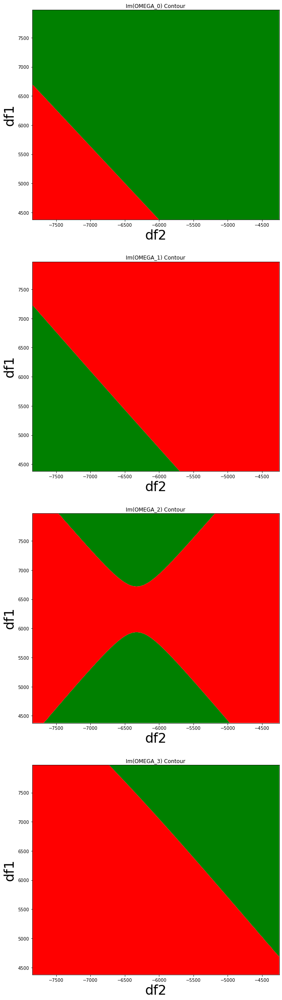

In [103]:
# plot the map of growth rate vs df1 and df2
if len(thetaL1)>1 and len(thetaL2)>1:
    pivot_omega_IM = np.ndarray(shape=(N_mode,len(thetaL1),len(thetaL2)),dtype=float)
    for imode in range(N_mode):
        for theta1 in range(len(thetaL1)):
            for theta2 in range(len(thetaL2)):
                pivot_omega_IM[imode][theta1][theta2] = delta_omega_Im[imode][theta1*len(thetaL2)+theta2]    
        pivot_omega_IM_Iter[imode] = pivot_omega_IM_Iter[imode].T
    damp = 1/t_rad_long*0
    
    fig1,axes1 = plt.subplots(N_mode,1)
    for i_mode in range(N_mode):
        if N_mode==1:
            CS = axes1.contourf(df1,df2,pivot_omega_IM[i_mode]-damp,antialiased=True, levels=100,alpha=1,cmap=cm.coolwarm )
            lvs = np.array(CS.levels )
            axes1.set_ylabel('thetaL2',fontsize=30)
            axes1.set_xlabel('thetaL1',fontsize=30)
            axes1.set_title("Im(OMEGA_"+str(i_mode)+" Contour")
            print(lvs)
            print(zeroline)
            if len(zeroline[0])>0:
                for i in range(zeroline[0][0]):
                    CS.collections[i].set_linewidth(5)           
                    CS.collections[i].set_color('g')
                    CS.collections[i].set_linestyle('-')
        if N_mode>1:
            CS = axes1[i_mode].contourf(df1,df2,pivot_omega_IM[i_mode]-damp,levels=[-1e10,0,1e10],colors=['g','r'],antialiased=True, alpha=1 )
            lvs = np.array(CS.levels )
            #print(lvs)
            axes1[i_mode].set_ylabel('df1',fontsize=30)
            axes1[i_mode].set_xlabel('df2',fontsize=30)
            axes1[i_mode].set_title("Im(OMEGA_"+str(i_mode)+") Contour")
            #axes1[i_mode].clabel(CS, lvs, inline=True, fontsize=10)
            zeroline = np.where(lvs<=0)
            print(zeroline[0])
            if 0 and len(zeroline[0])>0:
                for i in zeroline[0]:
                    #print(i)
                    CS.collections[i].set_linewidth(5)           
                    CS.collections[i].set_color('g')
                    CS.collections[i].set_linestyle('-')
    fig1.set_figheight(10*N_mode)
    fig1.set_figwidth(10)
    fn_stab = os.path.join(cwd,'stability_map_thetaL_X_mu_gain='+str(gain[0])+'_RoQ_'+str(RoQ[0])+'_Mode_'+str(i_mode)+'_approx_df.jpg')
    plt.savefig(fn_stab,bbox_inches='tight')
    plt.show()

[-4.05  -4.025 -4.    -3.975 -3.95  -3.925 -3.9   -3.875 -3.85  -3.825
 -3.8   -3.775 -3.75  -3.725 -3.7   -3.675 -3.65  -3.625 -3.6   -3.575
 -3.55  -3.525 -3.5   -3.475 -3.45  -3.425 -3.4   -3.375 -3.35  -3.325
 -3.3   -3.275 -3.25  -3.225 -3.2   -3.175 -3.15  -3.125 -3.1   -3.075
 -3.05  -3.025 -3.    -2.975 -2.95  -2.925 -2.9   -2.875 -2.85  -2.825
 -2.8   -2.775 -2.75  -2.725 -2.7   -2.675 -2.65  -2.625 -2.6   -2.575
 -2.55  -2.525 -2.5   -2.475 -2.45  -2.425 -2.4   -2.375 -2.35  -2.325
 -2.3   -2.275 -2.25  -2.225 -2.2   -2.175 -2.15  -2.125 -2.1   -2.075
 -2.05  -2.025 -2.    -1.975 -1.95  -1.925 -1.9   -1.875 -1.85  -1.825
 -1.8  ]
(array([], dtype=int64),)
[-67.5 -65.  -62.5 -60.  -57.5 -55.  -52.5 -50.  -47.5 -45.  -42.5 -40.
 -37.5 -35.  -32.5 -30.  -27.5 -25.  -22.5 -20.  -17.5 -15.  -12.5 -10.
  -7.5  -5.   -2.5   0.    2.5   5.    7.5  10.   12.5  15.   17.5  20.
  22.5  25.   27.5  30.   32.5  35.   37.5  40.   42.5  45.   47.5  50.
  52.5  55.   57.5  60.   62.5  65.   

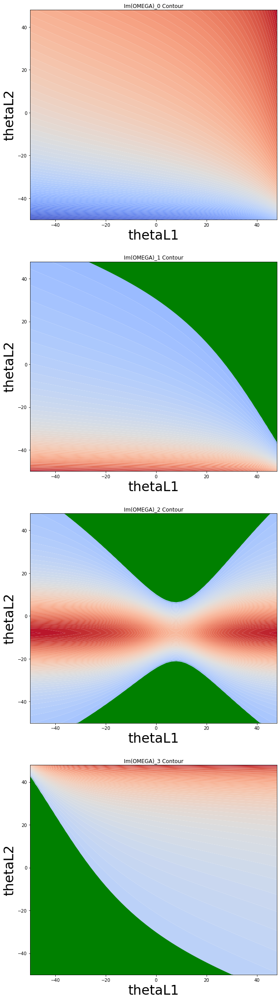

In [43]:
# plot the map of growth rate vs thetaL1 and thetaL2
if len(thetaL1)>1 and len(thetaL2)>1:
    pivot_omega_IM = np.ndarray(shape=(N_mode,len(thetaL1),len(thetaL2)),dtype=float)
    for imode in range(N_mode):
        for theta1 in range(len(thetaL1)):
            for theta2 in range(len(thetaL2)):
                pivot_omega_IM[imode][theta1][theta2] = delta_omega_Im[imode][theta1*len(thetaL2)+theta2]    
    damp = 1/t_rad_long*1
    
    fig1,axes1 = plt.subplots(N_mode,1)
    for i_mode in range(N_mode):
        if N_mode==1:
            CS = axes1.contourf(thetaL1,thetaL2,pivot_omega_IM[i_mode]-damp,antialiased=True, alpha=1,cmap=cm.coolwarm )
            axes1.set_ylabel('thetaL2',fontsize=30)
            axes1.set_xlabel('thetaL1',fontsize=30)
            axes1.set_title("Im(OMEGA) Contour")
        if N_mode>1:
            CS = axes1[i_mode].contourf(thetaL1,thetaL2,pivot_omega_IM[i_mode]-damp,levels=100,antialiased=True, alpha=1,cmap=cm.coolwarm )
            axes1[i_mode].set_ylabel('thetaL2',fontsize=30)
            axes1[i_mode].set_xlabel('thetaL1',fontsize=30)
            axes1[i_mode].set_title("Im(OMEGA)_"+str(i_mode)+" Contour")
        # Recast levels to new class
        lvs = np.array(CS.levels )
        print(lvs)
        zeroline = np.where(lvs==0)
        print(zeroline)
        if len(zeroline[0])>0:
            for i in range(zeroline[0][0]):
                CS.collections[i].set_linewidth(5)           
                CS.collections[i].set_color('g')
                CS.collections[i].set_linestyle('-')
    fig1.set_figheight(10*N_mode)
    fig1.set_figwidth(10)
    fn_stab = os.path.join(cwd,'stability_map_thetaL_X_mu_gain='+str(gain[0])+'_RoQ_'+str(RoQ[0])+'_Mode_'+str(i_mode)+'_approx.jpg')
    plt.savefig(fn_stab,bbox_inches='tight')
    plt.show()

In [25]:
np.min(delta_omega_Im)

-1116.0937634589927

TypeError: Length of x (50) must match number of columns in z (2500)

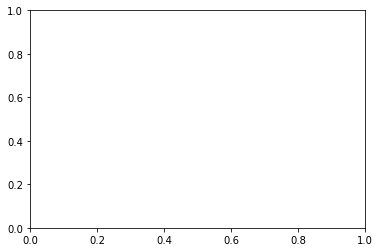

In [26]:
# plot the map of growth rate vs thetaL and mode number
damp = 1/t_rad_long*1
fig1,axes1 = plt.subplots(1,1)
lvs = np.array([np.min(delta_omega_Im)+2*i for i in range(int((np.max(delta_omega_Im)+2-np.min(delta_omega_Im))/2))],dtype='int')
CS = axes1.contourf(thetaL1,mus,delta_omega_Im-damp,levels = lvs, antialiased=True, alpha=1,cmap=cm.coolwarm )

#CS = axes1.contourf(thetaL1,mus,delta_omega_Im-damp, antialiased=True, alpha=1,cmap=cm.coolwarm )

# Recast levels to new class
lvs = np.array(CS.levels )
print(lvs)
zeroline = np.where(lvs==0)
print(zeroline)
if len(zeroline[0])>0:
    for i in range(zeroline[0][0]):
        CS.collections[i].set_linewidth(5)           
        CS.collections[i].set_color('g')
        CS.collections[i].set_linestyle('-')

axes1.set_ylabel('Mode index',fontsize=30)
axes1.set_xlabel('thetaL',fontsize=30)
axes1.set_title("Im(OMEGA) Contour")

fig1.set_figheight(10)
fig1.set_figwidth(10)
fn_stab = os.path.join(cwd,'stability_map_thetaL_X_mu_gain='+str(gain[0])+'_RoQ_'+str(RoQ[0])+'_approx.jpg')
plt.savefig(fn_stab,bbox_inches='tight')
plt.show()

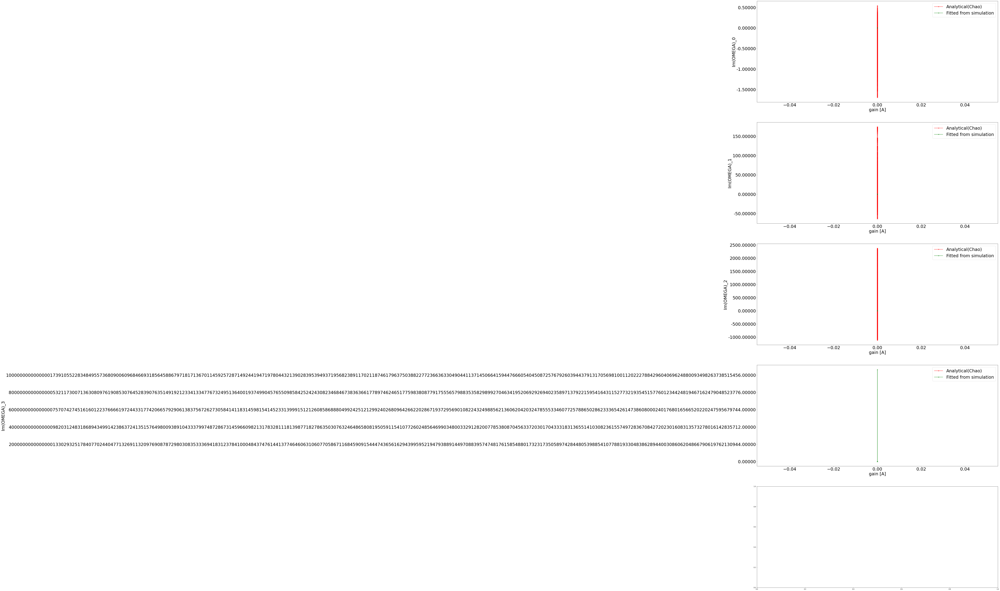

In [27]:
# growth rate Omega_Im vs gain
os.chdir(home1)
cwd = os.getcwd()
fig1,axes1 = plt.subplots(N_mode+1,1)
fig1.set_figheight(15*(N_mode+1))
fig1.set_figwidth(30)
for mu in mus:
    axes1[mu].plot(gain,delta_omega_Im[mu],'rx-')
    axes1[mu].plot(gain,qs[mu]/T0,'gx-')
    axes1[mu].set_ylabel('Im(OMEGA)_'+str(mu),fontsize=30)
    axes1[mu].set_xlabel('gain [A]',fontsize=30)
    axes1[mu].legend(["Analytical(Chao)","Fitted from simulation"],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.5f'))
fn_growth_rate = os.path.join(cwd,'growth_rate_analytical_vs_gain.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()


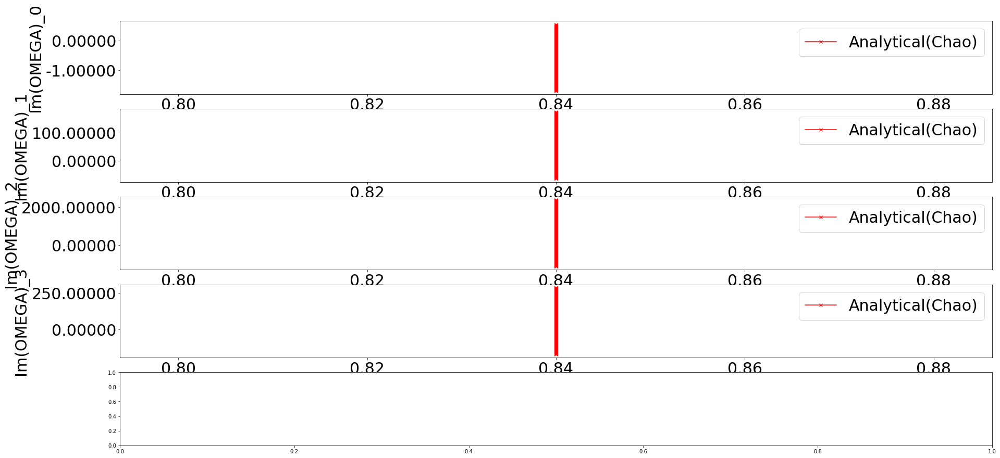

NameError: name 'thetaL' is not defined

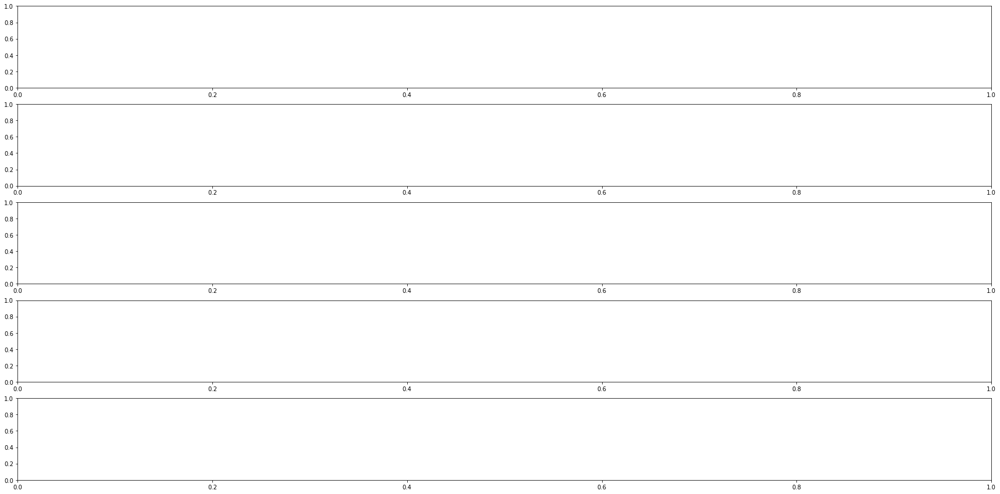

In [28]:
# growth rate Omega_Im vs current and vs thetaL
os.chdir(home1)
cwd = os.getcwd()
fig1,axes1 = plt.subplots(N_mode+1,1)
fig1.set_figheight(15)
fig1.set_figwidth(30)
for mu in mus:
    axes1[mu].plot(current,delta_omega_Im[mu],'rx-')
    axes1[mu].set_ylabel('Im(OMEGA)_'+str(mu),fontsize=30)
    axes1[mu].set_xlabel('IbDC [A]',fontsize=30)
    axes1[mu].legend(["Analytical(Chao)","Fitted from simulation"],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.5f'))
fn_growth_rate = os.path.join(cwd,'growth_rate_analytical.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()

fig1,axes1 = plt.subplots(N_mode+1,1)
fig1.set_figheight(15)
fig1.set_figwidth(30)
for mu in mus:
    axes1[mu].plot(thetaL,delta_omega_Im[mu],'rx')
    axes1[mu].set_ylabel('Im(OMEGA)_'+str(mu),fontsize=30)
    axes1[mu].set_xlabel('ThetaL [degree]',fontsize=30)
    axes1[mu].legend(["Analytical(Chao)","Fitted from simulation"],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.5f'))

fn_growth_rate = os.path.join(cwd,'growth_rate_analytical_thetaL.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()

In [33]:
# iterative solver
def F(Omega,ps,mu,m,nRF,R,QL,omegac,nBunch, NperBunch,r0,eta,Gamma0,T0,Qs,f0,gain,sigPhi):
    omega0 = f0*2*pi
    fact = np.math.factorial(m-1)
    nMmu = ps*nBunch+mu
    omegasamp = ((ps*nBunch+mu)*2*np.pi*f0+Omega)
    Zs = np.array([Zparallel(R[i],QL[i],omegac[i],omegasamp,gain) for i in range(nRF)])
    factor = nBunch*NperBunch*r0*eta/(Gamma0*T0**3)*4*pi*(m/fact)/(2**m)*sigPhi**(2*m-2)
    #for i in range(len(nMmu)):
    #    print(np.exp(-nMmu**2*sigPhi**2)[i])
    return (Omega**2-(1j*factor*np.sum((omegasamp/omega0)**(2*m-1)*Zs*np.exp(-nMmu**2*sigPhi**2))+(Qs*f0*2*pi*m)**2))/(Qs*f0*2*pi)**2

def SolveOmega(Omega,ps,mu,m,nRF,R,QL,omegac,nBunch, NperBunch,r0,eta,Gamma0,T0,Qs,f0,maxIter,accu,gain,sigPhi):
    nIter = 0
    maxstep = 10
    # initial values
    OmegaR = np.real(Omega)
    OmegaI = np.imag(Omega)
    Omegat1 = Omega
    Omegat2 = Omegat1
    # step size
    sig1 = 1e-5
    sig2 = 1e-5*1j
    Err = F(Omega,ps,mu,m,nRF,R,QL,omegac,nBunch, NperBunch,r0,eta,Gamma0,T0,Qs,f0,gain,sigPhi)
    Err_store = Err
    while(np.abs(Err)>accu and nIter<maxIter):
        OmegaR = np.real(Omega)
        OmegaI = np.imag(Omega)
        Omegat1 = Omega
        Err = F(Omega,ps,mu,m,nRF,R,QL,omegac,nBunch, NperBunch,r0,eta,Gamma0,T0,Qs,f0,gain,sigPhi)
        F1 = F(Omega+sig1,ps,mu,m,nRF,R,QL,omegac,nBunch, NperBunch,r0,eta,Gamma0,T0,Qs,f0,gain,sigPhi) # change OmegaRe by a small step
        F2 = F(Omega+sig2,ps,mu,m,nRF,R,QL,omegac,nBunch, NperBunch,r0,eta,Gamma0,T0,Qs,f0,gain,sigPhi) # change OmegaIm by a small step
        Fre = np.real(Err)
        Fim = np.imag(Err)
        F1re = np.real(F1)
        F1im = np.imag(F1)
        F2re = np.real(F2)
        F2im = np.imag(F2)
        # approximate the Jacobian
        dF11 = (F1re-Fre)/np.abs(sig1)
        dF12 = (F2re-Fre)/np.abs(sig1)
        dF21 = (F1im-Fim)/np.abs(sig2)
        dF22 = (F2im-Fim)/np.abs(sig2)
        
        det = dF11*dF22-dF12*dF21
        # inverse the Jacobian
        dF11inv = dF22/det
        dF12inv = -dF12/det
        dF21inv = -dF21/det
        dF22inv = dF11/det
        dFR = Fre*dF11inv+Fim*dF12inv
        if dFR >maxstep:
            OmegaR -= maxstep
        else:
            OmegaR -= dFR
        dFI = Fre*dF21inv+Fim*dF22inv
        if dFI > maxstep:
            OmegaI -= maxstep
        else:
            OmegaI -= dFI
        
        Omega = OmegaR+OmegaI*1j
        nIter += 1
        #if np.abs(Omega-Omegat2) < 1e-7:
        #    print("Omega  : ", Omega)
        #    print("Omega1 : ", Omegat1)
        #    print("Omega2 : ", Omegat2)
        #    print("Err    : ", Err)
        #    Omega=(Omegat2+Omegat1)/2
        #else:
        #    Omegat2 = Omegat1
        
        Err_store = Err
    if nIter == maxIter:
        print("Maxed out!","...","Err = ",Err)
        print("OMEGA = ",Omega)
        return 1-1e100*1j
    #print(np.abs(Err))
    return Omega
    print(Omega)
    print(nIter)

In [34]:
# Iteratively solve:
delta_omega_Re_Iter = np.ndarray([N_mode,len(new_folders)])
delta_omega_Im_Iter = np.ndarray([N_mode,len(new_folders)])


mus = np.array([i for i in range(N_mode)])

N_OMEGA_guss = 9
phistart = -90/180*pi
phiend = 90/180*pi
dphi = (phiend-phistart)/N_OMEGA_guss
OMEGA_ini = [omegas*np.exp(1j*phistart)*np.exp(1j*i*dphi) for i in range(N_OMEGA_guss)]

m = 1
sigz =  2.3e-3# rms bunch length
sigt = sigz/clight 
sigPhi = 2*pi*f0*sigt
print("sigt = ",sigt)

pmax = int(5*np.sqrt(2)/sigt/nBunch/omega0)# number of samples in frequency domain
print (pmax)
omegas = Qs*f0*2*pi

ps = np.array([float(i) for i in range(-pmax,pmax+1)])

p_M_omega0 = ps*nBunch*2*np.pi*f0
print("fs = ",omegas/2/pi)
omegas = Qs*2*pi*f0
print("mus = ",mus)
for mu in mus[:]:
    qidx=0

    for folder in new_folders[:]:
        print(folder)
        os.chdir(os.path.join(home1,folder))
        cwd = os.getcwd()
        inputfile = os.path.join(cwd,inputfn)
        tempinput = {}
        with open(inputfile) as inputfile:
            for line in inputfile:
                if len(line.split())>1:
                    tempinput[line.split()[0]] = line.split()[1:]
        for i in tempinput:
            for j in range(len(tempinput[i])):
                tempinput[i][j] = float(tempinput[i][j])
        nRF = int(tempinput['nRF'][0])
        nRF1 = int(tempinput['nRF1'][0])
        nRF2 = int(tempinput['nRF2'][0])
        nRFc = int(tempinput['nRFc'][0])

        nTurns = int(tempinput['n_turns'][0])
        nfill = int(tempinput['n_fill'][0])
        n_q_ramp = int(tempinput['n_q_ramp'][0])
        NpRF = int(tempinput['N_bins'][0])
        h = [int(i) for i in tempinput['h']]
        detune_ini = np.array([i for i in tempinput['detune_ini']])
        detune_final = np.array([i for i in tempinput['detune_final']])

        step = int(tempinput['step_store'][0])
        fill_step = int(tempinput['fill_step'][0])
        nBeam = int(tempinput['nBeam'][0])
        beam_shift = int(tempinput['beam_shift'][0])
        nBunch = int(tempinput['n_bunches'][0])
        nPar = int(tempinput['Npar'][0])
        NperBunch = int(tempinput['NperBunch'][0])
        nTot = nBunch*nPar*nBeam
        Gamma0 = tempinput['Gamma'][0]
        Rring = tempinput['R'][0]
        n_record = nTurns/step
        beta = np.sqrt(1-1/Gamma0**2)
        T0 = 2*np.pi*Rring/(clight*beta)
        f0 = 1/T0
        V0 = [i for i in tempinput['Vref_I']]
        V0Q = [i for i in tempinput['Vref_Q']]
        II = [i for i in tempinput['Iref_I']]
        IQ = [i for i in tempinput['Iref_Q']]
        mainRF = int(tempinput['mainRF'][0])
        Pbeam = tempinput['Prad'][0]
        if int(tempinput['type'][0]==2):
            atomicZ = 79
            Ek = Gamma0*E0Au
        else:
            atomicZ =1
        if int(tempinput['type'][0]==1):  
            Ek = Gamma0*E0Elec

        GMTSQ = tempinput['GMTSQ'][0]
        Ek_damp = tempinput['Ek_damp'][0]

        eta = 1/GMTSQ-1/Gamma0**2
        if nRF ==1:
            Qs = np.sqrt(h[mainRF]*atomicZ*np.abs(V0[mainRF])*eta/(2*np.pi*Ek))
        elif nRF == 2 :
            Qs = np.sqrt(h[mainRF]*atomicZ*np.abs(V0[mainRF]+V0[1])*eta/(2*np.pi*Ek))
        print("Qs: ",Qs)
        omegarf = 2*np.pi*(np.array(h)*f0)
        omegac = 2*np.pi*(np.array(h)*f0+detune_final)
        
        #omegac = 2*np.pi*(np.array(h)*f0+detune_final/10)
        
        #omegac = omegac+np.array([200*2*pi,0])
        Trf = 2*np.pi/omegarf
        
        RoQ0 = [i for i in tempinput['RoQ']]
        RoQ = np.array(RoQ0)
        QL0 = [i for i in tempinput['QL']]
        QL = np.array(QL0)
        R = [RoQ[i]*QL[i] for i in range(nRF)]

        Th = 2*np.pi/omegarf[0]
        dthat =Th/NpRF

        pattern = 'd'+'dd'*nBeam+3*nRF*'d'
        n_stride = 1+2*nBeam+3*nRF
        stride = len(pattern)*8
        test = array('d')
        print("dfc: ",omegac/2/pi-f0*h[0])
        print("NperBunch: ",NperBunch/1e11)
        print("nBunch: ",nBunch)

        print("QL: ",QL)
        #print("R: ",R)
        maxOMEGAIM = -1e360            
        print("Current mode : ",mu)
        #print(OMEGA_ini)
        for Omega in OMEGA_ini:
            t_omega = Omega*1.0
            temp = SolveOmega(Omega,ps,nBunch-mu,m,nRF,R,QL,omegac,nBunch, NperBunch,r0,eta,Gamma0,T0,Qs,f0,2000,1e-3,gain[qidx],sigPhi)
            if np.imag(temp)>maxOMEGAIM:
                #print("Found a bigger one : ",t_omega,np.arctan(np.imag(t_omega)/np.real(t_omega))/pi*180)
                print("Found a bigger one : ",temp)
                maxOMEGAIM = np.imag(temp)
                delta_omega_Re_Iter[mu][qidx] = np.real(temp)
                delta_omega_Im_Iter[mu][qidx] = np.imag(temp)
        print("---------------------")
        print(qidx,'; ','df_re, Omega_im',(delta_omega_Re_Iter[mu][qidx]-omegas)/2/pi,delta_omega_Im_Iter[mu][qidx])
        print("---------------------")
        qidx+=1
omega_im_iter = pd.DataFrame(delta_omega_Im_Iter)
omega_im_iter.to_csv('iter.txt')

sigt =  7.671974189557498e-12
3610
fs =  97.05297814300705
mus =  [0 1 2 3]
000000nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-2.2666690176268233e-12-638.0737265622181j)
Found a bigger one :  (6.423327159545307e-07-638.0737258086266j)
Found a bigger one :  (5.853006643805406e-09-638.0737241859832j)
Found a bigger one :  (4.94962887929789e-10+625.2634883403542j)
Found a bigger one :  (4.954705034128024e-07+625.2634914301057j)
---------------------
0 ;  df_re, Omega_im -97.05297806415048 625.2634914301057
---------------------
000001nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (8.18181

Found a bigger one :  (9.354988411594371e-08-601.4320177934103j)
Found a bigger one :  (-1.1602225312732977e-08+589.2282292371569j)
Found a bigger one :  (2.2262468331443394e-07+589.2282317535019j)
Found a bigger one :  (2.6969401570623927e-07+589.2282323859383j)
---------------------
12 ;  df_re, Omega_im -97.05297810008392 589.2282323859383
---------------------
000013nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-5.826011541834759e-14-598.7676372198245j)
Found a bigger one :  (4.927409918064826e-07-598.7676315367402j)
Found a bigger one :  (9.708334172328897e-09-598.7676286596975j)
Found a bigger one :  (2.2761705375200355e-09-598.7676286462836j)
Found a bigger one :  (8.172201810933716e-10+586.613441276594j)
Found a bigger one :  (2.2474988491897469e-07+586.6134438595443j)
Found a 

Found a bigger one :  (5.843056703890652e-10+557.8615533105981j)
Found a bigger one :  (2.863566189487306e-07+557.8615563118133j)
Found a bigger one :  (3.706458603170218e-07+557.8615571520749j)
---------------------
24 ;  df_re, Omega_im -97.05297808401694 557.8615571520749
---------------------
000025nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (4.260480315417525e-12-566.5724795714169j)
Found a bigger one :  (1.129473043874141e-09-566.5724795713751j)
Found a bigger one :  (3.6687608739963693e-09+555.074463135036j)
Found a bigger one :  (-2.3579997009311182e-07+555.0744674231911j)
---------------------
25 ;  df_re, Omega_im -97.05297818053579 555.0744674231911
---------------------
000026nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-425

Found a bigger one :  (1.5510704940013419e-09-523.7352972958646j)
Found a bigger one :  (-3.2947566770940694e-10+513.262434031664j)
Found a bigger one :  (4.117725441723716e-07+513.262437884353j)
---------------------
37 ;  df_re, Omega_im -97.05297807747142 513.262437884353
---------------------
000038nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (4.4626289534417976e-11-518.8817001999729j)
Found a bigger one :  (-4.138333253823293e-08-518.881698522632j)
Found a bigger one :  (7.2198999352852955e-09-518.8816982529278j)
Found a bigger one :  (-2.7275940354745134e-09+508.5349742861411j)
Found a bigger one :  (1.02561483447932e-06+508.5349757286885j)
Found a bigger one :  (5.135694993631951e-07+508.53497923190133j)
---------------------
38 ;  df_re, Omega_im -97.05297806126994 508.534979231

Found a bigger one :  (3.101685286513228e-10-614.6336975461915j)
Found a bigger one :  (-2.8595511726743628e-09+602.947613453391j)
Found a bigger one :  (2.705204315898817e-07+602.9476158291642j)
Found a bigger one :  (2.446152229194226e-07+602.9476164184445j)
---------------------
50 ;  df_re, Omega_im -97.05297810407534 602.9476164184445
---------------------
000101nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-2.9222582054011464e-13-610.8817693978732j)
Found a bigger one :  (-8.905381407070447e-10-610.881769397157j)
Found a bigger one :  (3.3880918248751796e-08+599.2492151661966j)
Found a bigger one :  (2.1417772091318968e-07+599.249217592455j)
Found a bigger one :  (2.667058721784847e-07+599.249218238457j)
---------------------
51 ;  df_re, Omega_im -97.0529781005595 599.2492182384

Found a bigger one :  (-6.664479085645913e-10+565.4537599071163j)
Found a bigger one :  (2.6126642799955205e-07+565.453762801373j)
Found a bigger one :  (3.278276910073652e-07+565.4537663794633j)
---------------------
62 ;  df_re, Omega_im -97.05297809083166 565.4537663794633
---------------------
000113nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-6.714658322357722e-12-573.7552694845009j)
Found a bigger one :  (-1.509909451719786e-08-573.7552694126059j)
Found a bigger one :  (6.774317579618283e-09+562.7256067621358j)
Found a bigger one :  (6.829552004908659e-07+562.7256082761231j)
Found a bigger one :  (-1.03604953308363e-07+562.7256087614886j)
---------------------
63 ;  df_re, Omega_im -97.0529781594963 562.7256087614886
---------------------
000114nmacro1440_nBin33_Idc0.84A_ThetaL

Found a bigger one :  (2.996382635013419e-09-540.100981324322j)
Found a bigger one :  (-5.4242948023877635e-11+529.7278191546395j)
Found a bigger one :  (3.5298331864603086e-07+529.7278226612642j)
Found a bigger one :  (5.483245884172969e-07+529.7278239226673j)
---------------------
75 ;  df_re, Omega_im -97.05297805573849 529.7278239226673
---------------------
000126nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-5.975630819508796e-12-537.0469694743518j)
Found a bigger one :  (9.030526408257411e-09-537.0469691872039j)
Found a bigger one :  (2.0362950218561935e-09-537.0469691749882j)
Found a bigger one :  (-4.2555462590756175e-10+526.7382460346042j)
Found a bigger one :  (3.8949325171198923e-07+526.7382495038163j)
Found a bigger one :  (4.4448500732168286e-07+526.7382504908436j)
--------

Found a bigger one :  (2.7942094953190694e-07-495.02605289209953j)
Found a bigger one :  (1.1539776154068614e-08-495.0260444980096j)
Found a bigger one :  (2.127167220578735e-10+485.67850813486973j)
Found a bigger one :  (5.243428399196587e-07+485.6785126888213j)
Found a bigger one :  (8.538538561917927e-07+485.6785144604173j)
---------------------
87 ;  df_re, Omega_im -97.052978007112 485.6785144604173
---------------------
000138nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.1008310753686382e-10-489.8939528241948j)
Found a bigger one :  (8.152019399434302e-07-489.8939379398965j)
Found a bigger one :  (1.252148829902159e-08-489.8939320893753j)
Found a bigger one :  (-4.2850218495588773e-10-489.8939320734215j)
Found a bigger one :  (-1.2432369967763177e-10+480.67259096653027j)
Found 

Found a bigger one :  (1.8806495196620155e-08+380.4828430033742j)
Found a bigger one :  (1.5104666498842387e-06+380.48285233479083j)
Found a bigger one :  (1.2823031352122635e-06+380.48285589103756j)
---------------------
99 ;  df_re, Omega_im -97.05297793892217 380.48285589103756
---------------------
000200nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.449961487394413e-12-593.2998785376858j)
Found a bigger one :  (3.917107721587709e-07-593.2998386852104j)
Found a bigger one :  (7.2772774873221605e-09-593.2998353918282j)
Found a bigger one :  (2.7114457068217867e-09-593.2998353861892j)
Found a bigger one :  (1.0920787440091523e-08+582.5497711954381j)
Found a bigger one :  (2.4216826834426095e-07+582.5497738109891j)
Found a bigger one :  (2.836081269053971e-07+582.5497744667026j)
---

Found a bigger one :  (1.940797863863924e-09-553.7594071004016j)
Found a bigger one :  (-5.244863400061467e-10+543.616418928955j)
Found a bigger one :  (4.22682090465195e-07+543.6164219622779j)
Found a bigger one :  (3.906836893129151e-07+543.6164229907473j)
---------------------
112 ;  df_re, Omega_im -97.05297808082783 543.6164229907473
---------------------
000213nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.0944248775644145e-11-550.8688205622628j)
Found a bigger one :  (1.5093399156158524e-08-550.8688205497604j)
Found a bigger one :  (-1.3372124607158135e-10+540.7754815779563j)
Found a bigger one :  (3.3642277746676746e-07+540.7754848817513j)
Found a bigger one :  (4.0057558886195596e-07+540.7754857018201j)
---------------------
113 ;  df_re, Omega_im -97.05297807925348 540.77548

Found a bigger one :  (1.9705736431898171e-07-518.873674221421j)
Found a bigger one :  (8.663536119106691e-10+509.3748461379222j)
Found a bigger one :  (4.3197383097024616e-07+509.3748500900357j)
Found a bigger one :  (2.5039168309983276e-06+509.3748510716738j)
---------------------
124 ;  df_re, Omega_im -97.05297774449633 509.3748510716738
---------------------
000225nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (5.967094442775194e-11-515.7506021113833j)
Found a bigger one :  (8.691589187953541e-09-515.7505995299624j)
Found a bigger one :  (4.772916445568414e-08+506.3140314208364j)
Found a bigger one :  (4.428619317081023e-07+506.31403544568684j)
Found a bigger one :  (5.323367967330003e-07+506.314036439302j)
---------------------
125 ;  df_re, Omega_im -97.05297805828303 506.3140364393

Found a bigger one :  (-6.726959183130576e-09+464.93551369536095j)
Found a bigger one :  (2.8578046728363823e-06+464.93551887177523j)
Found a bigger one :  (7.66636373585039e-07+464.9355201674084j)
---------------------
136 ;  df_re, Omega_im -97.0529780209931 464.9355201674084
---------------------
000237nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-7.59480465302099e-11-468.38276331330945j)
Found a bigger one :  (1.1925631378528756e-06-468.38268406389926j)
Found a bigger one :  (9.77041927853646e-09-468.3826767380726j)
Found a bigger one :  (-3.316917878136731e-09+459.97212424147267j)
Found a bigger one :  (6.723572979865089e-07+459.97212960710453j)
Found a bigger one :  (1.0469276223333199e-06+459.97213169834015j)
---------------------
137 ;  df_re, Omega_im -97.05297797638335 459.97

Found a bigger one :  (-2.7514993827317482e-12-352.32717661369327j)
Found a bigger one :  (5.749523563410713e-10+346.8629787482564j)
Found a bigger one :  (3.373149658373459e-06+346.86298242995247j)
Found a bigger one :  (2.9236509195985482e-08+346.86298245055934j)
---------------------
149 ;  df_re, Omega_im -97.05297813835392 346.86298245055934
---------------------
000300nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (3.0308690183927154e-12-573.7205232023805j)
Found a bigger one :  (1.3210133303947135e-09-573.720523201524j)
Found a bigger one :  (3.584089839645595e-08+563.7617522783455j)
Found a bigger one :  (2.865553811411993e-07+563.761755203762j)
Found a bigger one :  (-9.089066964861059e-08+563.7617570199658j)
---------------------
150 ;  df_re, Omega_im -97.05297815747277 563.76

Found a bigger one :  (9.146037145625792e-09-532.7527951745353j)
Found a bigger one :  (2.4309423404513192e-09-532.7527951710283j)
Found a bigger one :  (-4.05582629245014e-09+523.4013346563578j)
Found a bigger one :  (3.900050402822798e-07+523.4013383029436j)
Found a bigger one :  (4.6637000802960543e-07+523.401339209718j)
---------------------
162 ;  df_re, Omega_im -97.05297806878197 523.401339209718
---------------------
000313nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (3.5287354019794793e-11-529.7494528906461j)
Found a bigger one :  (2.3999028567374403e-11-529.7494521901513j)
Found a bigger one :  (-2.1126374719586524e-09+520.447658829239j)
Found a bigger one :  (3.9791608705914625e-07+520.4476625389286j)
---------------------
163 ;  df_re, Omega_im -97.05297807967675 520.447662

Found a bigger one :  (1.1263088176851309e-08-496.4178133237588j)
Found a bigger one :  (-4.7392123246207995e-09+487.7107350430768j)
Found a bigger one :  (1.0173030219945076e-06+487.7107416348748j)
---------------------
174 ;  df_re, Omega_im -97.05297798109825 487.7107416348748
---------------------
000325nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (4.7771437492741826e-11-493.15491537015714j)
Found a bigger one :  (7.892153962487519e-07-493.15490481702835j)
Found a bigger one :  (1.2186115161448921e-08-493.1548990904363j)
Found a bigger one :  (1.7062118039522798e-08+484.51010210970986j)
Found a bigger one :  (5.419021137913899e-07+484.51010664342743j)
Found a bigger one :  (6.457709863004826e-07+484.51010778001375j)
---------------------
175 ;  df_re, Omega_im -97.0529780402294 484.5

Found a bigger one :  (-4.18583800845633e-09+441.0446308725604j)
Found a bigger one :  (1.399148134621775e-06+441.0446399664712j)
Found a bigger one :  (7.001898390777972e-08+441.0446408050367j)
---------------------
186 ;  df_re, Omega_im -97.0529781318632 441.0446408050367
---------------------
000337nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (4.123103453626438e-16-443.4218111232483j)
Found a bigger one :  (-1.6494628406193979e-09+435.8033566703145j)
Found a bigger one :  (8.531421056669555e-07+435.80336297920616j)
---------------------
187 ;  df_re, Omega_im -97.05297800722528 435.80336297920616
---------------------
000338nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  5350.89713526]
NperBunch:  1.28923470497
nBunch:

Found a bigger one :  (6.673451345348691e-09-555.6167000332961j)
Found a bigger one :  (3.2506740582183107e-09-555.6167000221283j)
Found a bigger one :  (1.1572587771966139e-10+546.3357986321892j)
Found a bigger one :  (3.2621073148882823e-07+546.3358018442898j)
Found a bigger one :  (3.923208439530687e-07+546.335802646104j)
---------------------
200 ;  df_re, Omega_im -97.05297808056726 546.335802646104
---------------------
000401nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.4375326372532818e-12-551.469976624606j)
Found a bigger one :  (8.641805594581699e-09-551.469976588916j)
Found a bigger one :  (1.6663622711099143e-09-551.469976577706j)
Found a bigger one :  (3.747816211099376e-08+542.2426727040875j)
Found a bigger one :  (3.3643868582039493e-07+542.2426759897186j)
Found a bigg

Found a bigger one :  (-1.6595860166567964e-08+504.554524096208j)
Found a bigger one :  (4.847561828535615e-07+504.554528298008j)
---------------------
212 ;  df_re, Omega_im -97.05297806585573 504.554528298008
---------------------
000413nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.6600074151218132e-12-510.11135422325907j)
Found a bigger one :  (-3.009924512756279e-09-510.1113500626784j)
Found a bigger one :  (-4.3761799235373863e-10+501.4876387294011j)
Found a bigger one :  (4.678686275775071e-07+501.4876428785088j)
Found a bigger one :  (6.601888992950611e-07+501.48764353011853j)
---------------------
213 ;  df_re, Omega_im -97.05297803793474 501.48764353011853
---------------------
000414nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998


Found a bigger one :  (9.068341565122637e-07-475.42622860317j)
Found a bigger one :  (9.085853198715493e-08-475.4262224721344j)
Found a bigger one :  (2.2367679820421878e-09+467.3973995788991j)
Found a bigger one :  (-3.307138314503216e-08+467.39740294411257j)
Found a bigger one :  (7.588663837512083e-07+467.3974059879448j)
---------------------
224 ;  df_re, Omega_im -97.05297802222972 467.3974059879448
---------------------
000425nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (9.907417874975524e-11-472.0204958179232j)
Found a bigger one :  (9.321938587054934e-07-472.02043359784534j)
Found a bigger one :  (9.708530922659768e-09-472.02042708055654j)
Found a bigger one :  (-2.795549920161589e-09+464.05390322597134j)
Found a bigger one :  (-1.6479792436935314e-08+464.0539066927529j)
Found a 

Found a bigger one :  (-1.8252368916683945e-09+412.8913482994658j)
Found a bigger one :  (1.0742887630891748e-06+412.89135572485003j)
Found a bigger one :  (1.2793670233959137e-06+412.8913575685684j)
---------------------
237 ;  df_re, Omega_im -97.05297793938948 412.8913575685684
---------------------
000438nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.1770759724512358e-13-413.7842387996622j)
Found a bigger one :  (-5.011255811357418e-10+406.9706495675278j)
Found a bigger one :  (1.1414446594460587e-06+406.97065732128425j)
Found a bigger one :  (1.3586603574153658e-06+406.9706592528879j)
---------------------
238 ;  df_re, Omega_im -97.05297792676954 406.9706592528879
---------------------
000439nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998

Found a bigger one :  (4.891986898442014e-10+530.0700806769981j)
Found a bigger one :  (7.576126565982978e-07+530.0700855810387j)
---------------------
250 ;  df_re, Omega_im -97.05297802242927 530.0700855810387
---------------------
000501nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (2.1833137705238124e-13-534.4877734423659j)
Found a bigger one :  (7.233014165690041e-09-534.4877730499132j)
Found a bigger one :  (2.6882160429695778e-09-534.4877730376081j)
Found a bigger one :  (-6.295999034893352e-10+525.8480121807543j)
Found a bigger one :  (3.862705619094714e-07+525.8480157869502j)
---------------------
251 ;  df_re, Omega_im -97.05297808153018 525.8480157869502
---------------------
000502nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:

Found a bigger one :  (7.61911302532732e-07-494.95391665385387j)
Found a bigger one :  (9.035716332268795e-09-494.9539110049078j)
Found a bigger one :  (6.502473359022362e-11+486.8682133458539j)
Found a bigger one :  (5.380722859528453e-07+486.8682178842747j)
Found a bigger one :  (4.7117413128506397e-07+486.86821855925297j)
---------------------
262 ;  df_re, Omega_im -97.05297806801738 486.86821855925297
---------------------
000513nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-2.077866044042594e-11-491.7231565410523j)
Found a bigger one :  (3.616978092218018e-07-491.7231420814332j)
Found a bigger one :  (1.2523982012482143e-08-491.723138529774j)
Found a bigger one :  (1.0008809499104836e-09+483.68713603506274j)
Found a bigger one :  (5.504747071028229e-07+483.68714068212734j)
Found 

Found a bigger one :  (-2.2794482746485174e-08+451.63369474181195j)
Found a bigger one :  (7.386283065518792e-07+451.63370049379597j)
Found a bigger one :  (1.0295394754795267e-06+451.6337025193901j)
---------------------
273 ;  df_re, Omega_im -97.05297797915077 451.6337025193901
---------------------
000524nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.6362266949897402e-10-455.6607005211456j)
Found a bigger one :  (5.601601129664319e-07-455.6605214177969j)
Found a bigger one :  (1.2747692079554708e-08-455.6605170682985j)
Found a bigger one :  (1.1623028166421771e-08+448.2195520994571j)
Found a bigger one :  (9.322556510952748e-07+448.2195573670184j)
---------------------
274 ;  df_re, Omega_im -97.05297799463398 448.2195573670184
---------------------
000525nmacro1440_nBin33_Idc0.84A

Found a bigger one :  (-2.1183006881057712e-08+390.9986590545013j)
Found a bigger one :  (1.3547704389091364e-06+390.99866769091665j)
Found a bigger one :  (1.6093930231431824e-06+390.99866986699254j)
---------------------
287 ;  df_re, Omega_im -97.0529778868642 390.99866986699254
---------------------
000538nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-7.037806759403497e-12-390.9607436242214j)
Found a bigger one :  (1.5319996054012023e-07-390.96074320442176j)
Found a bigger one :  (-3.80894423613427e-10+384.73529595308366j)
Found a bigger one :  (1.2128588997850631e-06+384.73530596273014j)
Found a bigger one :  (1.7974751262417321e-06+384.7353070368779j)
---------------------
288 ;  df_re, Omega_im -97.05297785693001 384.7353070368779
---------------------
000539nmacro1440_nBin33_Idc

Found a bigger one :  (1.1966265295457884e-05+247.50065663295078j)
---------------------
299 ;  df_re, Omega_im -97.05297623851678 247.50065663295078
---------------------
000600nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.380618857387162e-13-522.9769782690356j)
Found a bigger one :  (7.850704780536233e-08-522.9769771963181j)
Found a bigger one :  (-4.873341067970489e-09-522.9769769835352j)
Found a bigger one :  (4.974552084006153e-10+514.79814204331j)
Found a bigger one :  (4.27251205531963e-07+514.7981458816189j)
Found a bigger one :  (5.135358230956913e-07+514.7981468395393j)
---------------------
300 ;  df_re, Omega_im -97.0529780612753 514.7981468395393
---------------------
000601nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [

Found a bigger one :  (-8.282293172958647e-10+473.49414729362377j)
Found a bigger one :  (6.083596064947877e-07+473.4941522324339j)
Found a bigger one :  (7.259727943390373e-07+473.4941534584744j)
---------------------
311 ;  df_re, Omega_im -97.0529780274649 473.4941534584744
---------------------
000612nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.1219409813240016e-10-477.74120541750517j)
Found a bigger one :  (-8.728132213286707e-07-477.7411641784228j)
Found a bigger one :  (1.0183997054945965e-08-477.74115803194303j)
Found a bigger one :  (1.2357393661240008e-10-477.7411580264887j)
Found a bigger one :  (-1.4816173253822274e-09+470.17014560602894j)
Found a bigger one :  (6.239340575317845e-07+470.17015064987316j)
Found a bigger one :  (7.487879900239941e-07+470.17015190383995j)
-

Found a bigger one :  (-3.471736808083846e-09+433.5570862236079j)
Found a bigger one :  (8.780735940060527e-07+433.55709264652324j)
Found a bigger one :  (1.0502910879487196e-06+433.55709424436037j)
---------------------
323 ;  df_re, Omega_im -97.05297797584804 433.55709424436037
---------------------
000624nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.7570113313846468e-12-436.9231863226345j)
Found a bigger one :  (-4.78983331435312e-08-436.9231859601632j)
Found a bigger one :  (8.143727830761324e-11+429.99704723321935j)
Found a bigger one :  (1.4825375632271376e-06+429.9970509794192j)
Found a bigger one :  (1.0884889780470725e-06+429.99705545748924j)
---------------------
324 ;  df_re, Omega_im -97.05297796976866 429.99705545748924
---------------------
000625nmacro1440_nBin33_Idc0.

Found a bigger one :  (-3.053849245449611e-09+376.0968738835987j)
Found a bigger one :  (1.5944405068321274e-06+376.09688371983646j)
Found a bigger one :  (1.4126178707798281e-06+376.09688620783743j)
---------------------
336 ;  df_re, Omega_im -97.05297791818195 376.09688620783743
---------------------
000637nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-8.577293129395804e-12-375.75614581197704j)
Found a bigger one :  (2.8420335933167923e-08-375.75614577015347j)
Found a bigger one :  (7.116920723713478e-14-375.7561457361337j)
Found a bigger one :  (-2.6729786731997766e-09+369.9194039731199j)
Found a bigger one :  (4.772751581691957e-06+369.9194143078426j)
---------------------
337 ;  df_re, Omega_im -97.05297738340005 369.9194143078426
---------------------
000638nmacro1440_nBin33_Idc0

Found a bigger one :  (-2.6707865131082826e-11+212.40004430927578j)
---------------------
349 ;  df_re, Omega_im -97.05297814301132 212.40004430927578
---------------------
000700nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (2.0883637502939134e-11-508.105113445123j)
Found a bigger one :  (1.23969083661718e-08-508.10510846840856j)
Found a bigger one :  (1.1331749038020849e-09-508.10510844444093j)
Found a bigger one :  (2.435301450244825e-10+500.38110138896565j)
Found a bigger one :  (2.0726883028475418e-08+500.3811043442907j)
Found a bigger one :  (5.825728924858942e-07+500.38110662338744j)
---------------------
350 ;  df_re, Omega_im -97.0529780502877 500.38110662338744
---------------------
000701nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_-48.0degree
Qs:  0.032373388842599

Found a bigger one :  (-8.44820370560391e-07-464.9221642705791j)
Found a bigger one :  (8.134471844733777e-08-464.92215722507876j)
Found a bigger one :  (-2.5413702098688387e-09+457.7566039732799j)
Found a bigger one :  (7.022377060527524e-07+457.7566094388609j)
Found a bigger one :  (7.199223839970265e-07+457.7566149373892j)
---------------------
361 ;  df_re, Omega_im -97.05297802842786 457.7566149373892
---------------------
000712nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.4460558924841788e-13-461.43184843426053j)
Found a bigger one :  (5.481501689661925e-07-461.4317220803691j)
Found a bigger one :  (1.1843073597218694e-08-461.43171763853707j)
Found a bigger one :  (-2.6930745156161263e-09+454.31566055289744j)
Found a bigger one :  (7.267183175672584e-07+454.3156661397628j)
Fo

Found a bigger one :  (-1.0334640091131438e-09+412.57675415962404j)
Found a bigger one :  (1.1341309074626785e-06+412.57676141070243j)
Found a bigger one :  (1.531859743400532e-06+412.57676430261586j)
---------------------
374 ;  df_re, Omega_im -97.05297789920401 412.57676430261586
---------------------
000725nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-3.05856807103738e-12-415.1860332778994j)
Found a bigger one :  (-2.0768723014161564e-09+408.7773114082912j)
Found a bigger one :  (1.7448155683694871e-06+408.7773158191325j)
Found a bigger one :  (1.3153857738017888e-06+408.7773209817918j)
---------------------
375 ;  df_re, Omega_im -97.0529779336569 408.7773209817918
---------------------
000726nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
d

Found a bigger one :  (-2.092996646087036e-09+349.46984747652294j)
Found a bigger one :  (2.2127980463856195e-06+349.46985971209256j)
---------------------
387 ;  df_re, Omega_im -97.05297779082932 349.46985971209256
---------------------
000738nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.4466422852356596e-11-347.6911378973125j)
Found a bigger one :  (2.860615221588446e-08-347.69113717994236j)
Found a bigger one :  (2.18812676797131e-08+342.43606001108424j)
Found a bigger one :  (2.353456560131792e-06+342.4360728645708j)
---------------------
388 ;  df_re, Omega_im -97.05297776844282 342.4360728645708
---------------------
000739nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  5282.18292546]
NperBunch:  1.28923470497
nBu

Found a bigger one :  (2.9970694616533603e-09+486.70180273992304j)
Found a bigger one :  (5.573083215783259e-07+486.70180729481183j)
Found a bigger one :  (6.759194915179761e-07+486.7018085157868j)
---------------------
400 ;  df_re, Omega_im -97.05297803543112 486.7018085157868
---------------------
000801nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-2.8731026659955167e-11-489.35873209681563j)
Found a bigger one :  (8.034950332094781e-07-489.3587166536769j)
Found a bigger one :  (6.83680659957454e-08-489.3587110186247j)
Found a bigger one :  (4.356753390641224e-08+482.09378390364697j)
Found a bigger one :  (5.684092428664272e-07+482.09378858997445j)
Found a bigger one :  (6.81235599629855e-07+482.09378975412676j)
---------------------
401 ;  df_re, Omega_im -97.05297803458504 482.093

Found a bigger one :  (-5.293078195797024e-10+439.1817274688997j)
Found a bigger one :  (8.388116744190502e-07+439.1817336576354j)
Found a bigger one :  (1.0031429354207325e-06+439.18173519461936j)
---------------------
412 ;  df_re, Omega_im -97.0529779833519 439.18173519461936
---------------------
000813nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (4.528722618388912e-12-442.30769402532394j)
Found a bigger one :  (1.2154212673852818e-08+435.64690484183j)
Found a bigger one :  (8.671978782544623e-07+435.6469112517197j)
Found a bigger one :  (1.6023559099879667e-06+435.6469154821068j)
---------------------
413 ;  df_re, Omega_im -97.05297788798418 435.6469154821068
---------------------
000814nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc

Found a bigger one :  (-2.2537141913976655e-09+387.7889191241069j)
Found a bigger one :  (7.414495311539038e-07+387.78892632637115j)
Found a bigger one :  (1.6807859941027e-06+387.78893033301455j)
---------------------
426 ;  df_re, Omega_im -97.05297787550165 387.78893033301455
---------------------
000827nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-2.0645476904061545e-12-389.4621653906523j)
Found a bigger one :  (-2.476403072296414e-09+383.59068716227534j)
Found a bigger one :  (1.2723245758411092e-06+383.5906971894614j)
---------------------
427 ;  df_re, Omega_im -97.05297794051032 383.5906971894614
---------------------
000828nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  5948.75765789]
NperBunch:  1.28923470497
nBun

Found a bigger one :  (-3.336995883755501e-11-318.6024266964337j)
Found a bigger one :  (4.070736301167721e-08-318.60242073336076j)
Found a bigger one :  (-0.00029258749539118334+313.8901140776651j)
Found a bigger one :  (-0.0002925881254332019+313.8901140926234j)
Found a bigger one :  (2.8514967447910294e-06+313.89053850640124j)
Found a bigger one :  (1.620171046701713e-10+313.8905488912048j)
---------------------
439 ;  df_re, Omega_im -97.05297814298127 313.8905488912048
---------------------
000840nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-6.832886995278023e-12-309.58238682373155j)
Found a bigger one :  (4.4927365071062084e-08-309.58237576406697j)
Found a bigger one :  (-0.0003102798821063013+305.02007747138765j)
Found a bigger one :  (3.7927913333502677e-06+305.0205136303085j)


Found a bigger one :  (-4.030017067778967e-08-471.20753252399993j)
Found a bigger one :  (6.538715231426979e-10+464.3595581367654j)
Found a bigger one :  (6.815169093128681e-07+464.3595632955826j)
Found a bigger one :  (7.997805593950094e-07+464.35956468840135j)
---------------------
452 ;  df_re, Omega_im -97.05297801571804 464.35956468840135
---------------------
000903nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-8.17772523875324e-11-466.74721944681335j)
Found a bigger one :  (9.678187273473582e-07-466.7471315099131j)
Found a bigger one :  (1.0679513103603426e-08-466.7471246787507j)
Found a bigger one :  (1.1279696975009714e-08+459.9511632196356j)
Found a bigger one :  (6.91537465457269e-07+459.9511685677804j)
Found a bigger one :  (1.3241666855295584e-06+459.95117201426916j)
-----

Found a bigger one :  (-5.357937148695122e-10+413.72229105971985j)
Found a bigger one :  (3.2900358420354797e-07+413.7222962429935j)
Found a bigger one :  (1.288888510825141e-06+413.72230030247164j)
---------------------
465 ;  df_re, Omega_im -97.05297793787409 413.72230030247164
---------------------
000916nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-3.4079429550322383e-12-416.2252557972482j)
Found a bigger one :  (-3.1694790209523763e-09+410.0803192047343j)
Found a bigger one :  (1.150976575127298e-06+410.08032698565347j)
Found a bigger one :  (5.179212652205861e-07+410.0803311111127j)
---------------------
466 ;  df_re, Omega_im -97.05297806057732 410.0803311111127
---------------------
000917nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_-16.0degree
Qs:  0.03237338884259

Found a bigger one :  (-1.6793169171870279e-09+357.58556887263404j)
Found a bigger one :  (2.3116593928212276e-06+357.58558162401044j)
---------------------
479 ;  df_re, Omega_im -97.05297777509504 357.58558162401044
---------------------
000930nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.1836724158502983e-11-357.95737284853897j)
Found a bigger one :  (1.6816025459305897e-07-357.9573720595132j)
Found a bigger one :  (9.026322454042503e-08+352.66935098789247j)
Found a bigger one :  (2.0899094398639517e-06+352.66936290891664j)
Found a bigger one :  (1.1650554661957191e-05+352.6695222915489j)
---------------------
480 ;  df_re, Omega_im -97.05297628876369 352.6695222915489
---------------------
000931nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_12.0degree
Qs:  0.032373388842

Found a bigger one :  (3.382735474323495e-06+273.06937238825424j)
Found a bigger one :  (-4.445848571625925e-11+273.06940959675535j)
---------------------
491 ;  df_re, Omega_im -97.05297814301413 273.06940959675535
---------------------
000942nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (2.215993973539383e-10-265.11930594299304j)
Found a bigger one :  (7.275435035926717e-06-265.11916761003306j)
Found a bigger one :  (-2.923998369448906e-06-265.11913810045104j)
Found a bigger one :  (1.5866656127853789e-09-265.11913185509775j)
Found a bigger one :  (-0.0004255077854321554+261.268520337168j)
Found a bigger one :  (7.144673176018995e-06+261.2690149418723j)
---------------------
492 ;  df_re, Omega_im -97.052977005897 261.2690149418723
---------------------
000943nmacro1440_nBin33_Idc0.84A

Found a bigger one :  (7.294025453766294e-09+442.6753625112074j)
Found a bigger one :  (3.269232131597119e-07+442.6753663375483j)
Found a bigger one :  (9.782820994050367e-07+442.6753700266485j)
---------------------
504 ;  df_re, Omega_im -97.05297798730864 442.6753700266485
---------------------
001005nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-8.89523526168223e-14-444.761964817805j)
Found a bigger one :  (-2.8513883658723427e-10+438.39751628044894j)
Found a bigger one :  (8.699884275382985e-07+438.39752238870324j)
Found a bigger one :  (1.0437004233894778e-06+438.397523915952j)
---------------------
505 ;  df_re, Omega_im -97.05297797689698 438.397523915952
---------------------
001006nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc: 

Found a bigger one :  (1.5717469541562043e-06+391.7686937682944j)
Found a bigger one :  (1.621568660992688e-06+391.76869511455425j)
---------------------
517 ;  df_re, Omega_im -97.05297788492639 391.76869511455425
---------------------
001018nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.3895761495519626e-12-393.6615527406586j)
Found a bigger one :  (-3.4985900463854486e-09+387.9503099158015j)
Found a bigger one :  (2.0711568796500865e-06+387.9503223978316j)
Found a bigger one :  (2.372900961457834e-06+387.95032483756535j)
---------------------
518 ;  df_re, Omega_im -97.05297776534813 387.95032483756535
---------------------
001019nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   6445.10616004]
NperBunch:  1.28923470497

Found a bigger one :  (2.7835467637012806e-08-340.6027950367404j)
Found a bigger one :  (-3.822383732611772e-09+335.64437113993824j)
Found a bigger one :  (2.7126057795447828e-06+335.64438537982136j)
---------------------
530 ;  df_re, Omega_im -97.05297771128244 335.64438537982136
---------------------
001031nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (3.0625265635621947e-12-335.11314613204416j)
Found a bigger one :  (1.9826289541472093e-07-335.1131437186256j)
Found a bigger one :  (-4.42567415701034e-09+330.2349999885732j)
Found a bigger one :  (1.3338354482739928e-06+330.2350102107228j)
---------------------
531 ;  df_re, Omega_im -97.05297793072054 330.2350102107228
---------------------
001032nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998

Found a bigger one :  (-0.000500376261938329+237.7141267794166j)
Found a bigger one :  (1.1038841682471656e-05+237.7146624302069j)
---------------------
542 ;  df_re, Omega_im -97.05297638612085 237.7146624302069
---------------------
001043nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.0880710794337075e-13-226.2452399108027j)
Found a bigger one :  (1.6222499337258806e-05+222.92799597937963j)
Found a bigger one :  (-2.369610026361798e-10+222.9280466299567j)
---------------------
543 ;  df_re, Omega_im -97.05297814304477 222.9280466299567
---------------------
001044nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode : 

Found a bigger one :  (1.3786705961159763e-09+421.43499098156764j)
Found a bigger one :  (8.242938825953061e-07+421.43499750148106j)
---------------------
556 ;  df_re, Omega_im -97.0529780118166 421.43499750148106
---------------------
001107nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.953832411090714e-12-423.19073143752945j)
Found a bigger one :  (-2.509320639026546e-09+417.2263600462302j)
Found a bigger one :  (1.0494869730429818e-06+417.2263672769776j)
Found a bigger one :  (1.2262620819941325e-06+417.2263690687348j)
---------------------
557 ;  df_re, Omega_im -97.0529779478414 417.2263690687348
---------------------
001108nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  7166.91186595]
NperBunch:  1.28923470497
nB

Found a bigger one :  (6.2765729748760334e-09+369.55380912674786j)
Found a bigger one :  (1.4531992184266956e-06+369.55381881660503j)
---------------------
569 ;  df_re, Omega_im -97.05297791172322 369.55381881660503
---------------------
001120nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.384478632457418e-11-370.79851623714353j)
Found a bigger one :  (2.8198564196342535e-08-370.79851612724104j)
Found a bigger one :  (-4.201912708534751e-12-370.7985161160166j)
Found a bigger one :  (-3.013953128955596e-10+365.4951171441796j)
Found a bigger one :  (2.094662281470344e-06+365.4951267952064j)
---------------------
570 ;  df_re, Omega_im -97.05297780963122 365.4951267952064
---------------------
001121nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_-8.0degree
Qs:  0.03237338884259

Found a bigger one :  (3.8068427671341526e-06+307.16683363553204j)
---------------------
582 ;  df_re, Omega_im -97.05297753712922 307.16683363553204
---------------------
001133nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.0090410422084086e-11-305.2130013832854j)
Found a bigger one :  (-3.955496551111791e-08-305.21298618757834j)
Found a bigger one :  (-0.0003194120383149812+300.808730341575j)
Found a bigger one :  (-0.00031941217274422673+300.80873034663466j)
Found a bigger one :  (5.078450231153081e-06+300.809163723271j)
---------------------
583 ;  df_re, Omega_im -97.0529773347466 300.809163723271
---------------------
001134nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  5605.29379547]
NperBunch:  1.28923470497
nBu

Found a bigger one :  (0.00017879664383410598+119.7010628703998j)
---------------------
596 ;  df_re, Omega_im -97.05294968663739 119.7010628703998
---------------------
001147nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.6394489838245955e-10-69.04822736978402j)
Found a bigger one :  (-1.8981007768676433e-10+67.15411962050835j)
Found a bigger one :  (-2.3533351665129478e-06+67.15707530182549j)
---------------------
597 ;  df_re, Omega_im -97.05297851755198 67.15707530182549
---------------------
001148nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (80.46607286586577-0.7493081134652742j)

Found a bigger one :  (-2.057068229622226e-09-397.6375529383284j)
Found a bigger one :  (1.1863417148470909e-08+392.0962633161753j)
Found a bigger one :  (1.531589544255356e-06+392.09627122691853j)
Found a bigger one :  (1.6241067438901857e-06+392.09627412813j)
---------------------
610 ;  df_re, Omega_im -97.05297788452245 392.09627412813
---------------------
001211nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.832285878639101e-12-393.4842856186072j)
Found a bigger one :  (-2.2938973766572493e-08+387.9924105462471j)
Found a bigger one :  (1.4143225958059003e-06+387.99241944024783j)
Found a bigger one :  (1.7626931631655254e-06+387.9924219072139j)
---------------------
611 ;  df_re, Omega_im -97.05297786246572 387.9924219072139
---------------------
001212nmacro1440_nBin33_Idc0.84A_T

Found a bigger one :  (-1.553411806674322e-08-342.81000549835613j)
Found a bigger one :  (-2.450292528724092e-12-342.8100052894206j)
Found a bigger one :  (-2.828879612330748e-09+337.9526947918774j)
Found a bigger one :  (2.8889153173717458e-06+337.9527097886269j)
---------------------
623 ;  df_re, Omega_im -97.05297768322191 337.9527097886269
---------------------
001224nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.550155535481023e-11-338.1561256617088j)
Found a bigger one :  (-6.526643337736136e-08-338.15612346459477j)
Found a bigger one :  (-2.809040304887784e-09+333.359224332853j)
Found a bigger one :  (2.6403138575093604e-06+333.359238455213j)
Found a bigger one :  (3.966026248559962e-08+333.3592515630862j)
---------------------
624 ;  df_re, Omega_im -97.05297813669495 333.3592

Found a bigger one :  (-0.0004034941919203172+268.20067886335517j)
Found a bigger one :  (-0.0004034957603742395+268.2006788854368j)
Found a bigger one :  (6.422777079621855e-06+268.2011634422569j)
---------------------
635 ;  df_re, Omega_im -97.05297712079033 268.2011634422569
---------------------
001236nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-2.9542526447632517e-10-263.6919735375757j)
Found a bigger one :  (9.106448375068021e-06-263.6918032114564j)
Found a bigger one :  (-1.9947095266362918e-09-263.69176624811814j)
Found a bigger one :  (-0.00043019684135925385+259.86770550505867j)
Found a bigger one :  (-0.000430200714077289+259.8677055231818j)
Found a bigger one :  (4.643837845871163e-06+259.8681937104642j)
---------------------
636 ;  df_re, Omega_im -97.05297740391731 259.

---------------------
649 ;  df_re, Omega_im -69.7295371863558 -0.37523449790875063
---------------------
001300nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (6.646631395564048e-14-432.10520070015144j)
Found a bigger one :  (1.1143888445385754e-08+426.30715602150167j)
Found a bigger one :  (9.632477357768635e-07+426.3071627442263j)
Found a bigger one :  (1.1558228930905537e-06+426.30716442973437j)
---------------------
650 ;  df_re, Omega_im -97.05297795905213 426.30716442973437
---------------------
001301nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (2.578364379967248e-13-426.774389737

Found a bigger one :  (4.787744530720299e-09+366.82919643706134j)
Found a bigger one :  (2.471463173481757e-06+366.8292032374005j)
---------------------
663 ;  df_re, Omega_im -97.05297774966148 366.8292032374005
---------------------
001314nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (9.102539797327352e-12-367.7250495650743j)
Found a bigger one :  (2.5749869542396678e-08-367.7250494410081j)
Found a bigger one :  (-1.6684714521349666e-12-367.7250494075438j)
Found a bigger one :  (-2.1843641546438492e-09+362.6353181104329j)
Found a bigger one :  (1.9149471421047587e-06+362.63532883985783j)
Found a bigger one :  (0.0002470319912402097+362.6354807717231j)
---------------------
664 ;  df_re, Omega_im -97.05293882664456 362.6354807717231
---------------------
001315nmacro1440_nBin33_Idc0.84

Found a bigger one :  (1.1871998040257029e-11-312.753362613535j)
Found a bigger one :  (-0.0003309623784499838+308.33577173577515j)
Found a bigger one :  (3.636264073039047e-06+308.3363015248137j)
---------------------
676 ;  df_re, Omega_im -97.05297756427765 308.3363015248137
---------------------
001327nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (2.739429030671374e-11-307.37673922540944j)
Found a bigger one :  (3.917522179439428e-08-307.3767264198564j)
Found a bigger one :  (5.189735953896636e-11-307.37672639208614j)
Found a bigger one :  (-0.0002412748063499448+303.02605084643824j)
Found a bigger one :  (4.928247784259654e-06+303.0267400660758j)
Found a bigger one :  (1.326196673266088e-09+303.02675518734617j)
---------------------
677 ;  df_re, Omega_im -97.052978142796 303.0267551

Found a bigger one :  (1.445827062744251e-05+219.67255599676238j)
---------------------
688 ;  df_re, Omega_im -97.05297584190183 219.67255599676238
---------------------
001339nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (3.977428413432157e-12-210.74977871301223j)
Found a bigger one :  (1.81944729400578e-05+207.56009218059984j)
Found a bigger one :  (1.8195271547977176e-05+207.5600921856319j)
---------------------
689 ;  df_re, Omega_im -97.05297524713966 207.5600921856319
---------------------
001340nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (4.247869611501064e-12-196.88295700646287j

Found a bigger one :  (-2.176392105705978e-09+399.62895550587075j)
Found a bigger one :  (1.2587732579850616e-06+399.6289637303672j)
Found a bigger one :  (4.499554212714606e-06+399.6289687398843j)
---------------------
703 ;  df_re, Omega_im -97.05297742688077 399.6289687398843
---------------------
001404nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (2.8674861191539407e-12-400.05053453472186j)
Found a bigger one :  (-2.183024968476291e-09+394.6962435305111j)
Found a bigger one :  (1.3235370947342617e-06+394.6962520657159j)
Found a bigger one :  (1.443578123936154e-06+394.69625489267275j)
---------------------
704 ;  df_re, Omega_im -97.05297791325448 394.69625489267275
---------------------
001405nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_-40.0degree
Qs:  0.032373388842599

Found a bigger one :  (5.056876600079661e-09+340.93838423770256j)
Found a bigger one :  (2.415650549014367e-06+340.93839747678027j)
---------------------
716 ;  df_re, Omega_im -97.05297775854433 340.93839747678027
---------------------
001417nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.5365172205436276e-11-341.2271786959048j)
Found a bigger one :  (1.2322806452092112e-07-341.227176875906j)
Found a bigger one :  (-2.9446911288489794e-09+336.52466134589963j)
Found a bigger one :  (2.204768006559832e-06+336.5246663936918j)
Found a bigger one :  (1.117605825899236e-08+336.52466687026276j)
---------------------
717 ;  df_re, Omega_im -97.05297814122832 336.52466687026276
---------------------
001418nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_-14.0degree
Qs:  0.03237338884259

Found a bigger one :  (-2.671828152784829e-10-279.39430410768244j)
Found a bigger one :  (7.241472219020675e-06-279.39425652937865j)
Found a bigger one :  (1.9185954154392337e-06-279.3942315470093j)
Found a bigger one :  (-0.00038244143851406953+275.4205074884593j)
Found a bigger one :  (5.767712581882661e-06+275.4209819764352j)
---------------------
729 ;  df_re, Omega_im -97.0529772250471 275.4209819764352
---------------------
001430nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-4.5472055410292423e-10-272.8894098402518j)
Found a bigger one :  (7.953442049762893e-06-272.88932523645997j)
Found a bigger one :  (-1.4319264455899723e-10-272.88929189090993j)
Found a bigger one :  (-0.0004360009755449701+268.99210005577777j)
Found a bigger one :  (7.657360947821434e-06+268.9924531486938j)
-

Found a bigger one :  (1.2662422356054192e-07+96.38954299162887j)
Found a bigger one :  (0.00011430419449274393+96.40114539905684j)
---------------------
743 ;  df_re, Omega_im -97.05295995092948 96.40114539905684
---------------------
001444nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-5.116777205238694e-10-45.85141155847487j)
Found a bigger one :  (-2.2722555601047026e-07+43.81898885672279j)
Found a bigger one :  (0.005736039013909441+43.93182650286753j)
---------------------
744 ;  df_re, Omega_im -97.05206522404424 43.93182650286753
---------------------
001445nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0

Found a bigger one :  (-2.856243774699077e-09+364.1689404248038j)
Found a bigger one :  (9.63325886109423e-07+364.168948438981j)
---------------------
758 ;  df_re, Omega_im -97.05297798968898 364.168948438981
---------------------
001509nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (2.949943128424029e-13-364.4312178601377j)
Found a bigger one :  (2.3215506910314113e-08-364.4312176888812j)
Found a bigger one :  (1.437029088769689e-10-364.4312176575933j)
Found a bigger one :  (-3.958249263107854e-09+359.54457950231523j)
Found a bigger one :  (2.1652467806446835e-06+359.54458985531664j)
---------------------
759 ;  df_re, Omega_im -97.05297779839734 359.54458985531664
---------------------
001510nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc

Found a bigger one :  (-1.0083076996817657e-10-308.4193343734225j)
Found a bigger one :  (-0.00031270006978123543+304.150081377659j)
Found a bigger one :  (-0.00031270451737042126+304.150081383143j)
Found a bigger one :  (3.8514230461389465e-06+304.15051876194j)
Found a bigger one :  (-1.834145289602588e-09+304.150525685502j)
---------------------
771 ;  df_re, Omega_im -97.05297814329897 304.150525685502
---------------------
001522nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (5.236406236964778e-11-303.35315738721346j)
Found a bigger one :  (4.7770090161542225e-08-303.35314065617166j)
Found a bigger one :  (-0.0003234529459615887+299.1409949208876j)
Found a bigger one :  (-0.00032345194384097997+299.1409949326182j)
Found a bigger one :  (9.655461711624569e-07+299.1414384364823j)
------

Found a bigger one :  (1.2258506384137113e-05+228.78040593025648j)
Found a bigger one :  (1.2257734384922558e-05+228.78040593183212j)
---------------------
783 ;  df_re, Omega_im -97.05297619212804 228.78040593183212
---------------------
001534nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-8.118268563293998e-12-223.12887526483146j)
Found a bigger one :  (1.4421366147761988e-05+219.7995104202653j)
---------------------
784 ;  df_re, Omega_im -97.05297584777536 219.7995104202653
---------------------
001535nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.6062229220693553e-12-213.2424190519

Found a bigger one :  (240.18779675864658-0.024794310124025706j)
Found a bigger one :  (240.1877603817575-0.02479134961205665j)
Found a bigger one :  (240.18779030688614-0.02478751059099385j)
---------------------
799 ;  df_re, Omega_im -58.825904045346505 -0.02478751059099385
---------------------
001600nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.9398026907820166e-12-399.3145086043908j)
Found a bigger one :  (-1.0116710623528022e-09+394.1706528098256j)
Found a bigger one :  (1.3812274786608597e-06+394.17066123085266j)
Found a bigger one :  (9.116132067416016e-07+394.1706612892205j)
---------------------
800 ;  df_re, Omega_im -97.0529779979193 394.1706612892205
---------------------
001601nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
d

Found a bigger one :  (-8.802937597070758e-10+328.87389689892746j)
Found a bigger one :  (-8.871057096911973e-10+328.87389689893655j)
Found a bigger one :  (2.803726647477439e-06+328.873911615929j)
---------------------
813 ;  df_re, Omega_im -97.05297769678012 328.873911615929
---------------------
001614nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.6990763062476608e-11-328.6204844627784j)
Found a bigger one :  (3.5695481938107995e-08-328.62048154519016j)
Found a bigger one :  (-0.0002747496192461174+324.18473990095487j)
Found a bigger one :  (-0.0002747521883853521+324.1847399205147j)
Found a bigger one :  (2.9717975997458485e-06+324.1851542380965j)
Found a bigger one :  (7.770974193010971e-10+324.185159695841j)
---------------------
814 ;  df_re, Omega_im -97.05297814288339 324.18

Found a bigger one :  (-0.00038988448526089403+267.9808446070579j)
Found a bigger one :  (5.805340411120519e-06+267.9813325601673j)
---------------------
825 ;  df_re, Omega_im -97.05297721905845 267.9813325601673
---------------------
001626nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (3.225534236037631e-10-265.7312810655067j)
Found a bigger one :  (8.851240181202008e-06-265.73113427572656j)
Found a bigger one :  (-2.0452611822293017e-09-265.7311229831755j)
Found a bigger one :  (-0.00042347328823100217+261.9681205413243j)
Found a bigger one :  (-0.0004234751840487272+261.96812054725655j)
Found a bigger one :  (7.074826973549678e-06+261.9686142085813j)
---------------------
826 ;  df_re, Omega_im -97.05297701701338 261.9686142085813
---------------------
001627nmacro1440_nBin33_Idc0.84A

Found a bigger one :  (4.597153170363012e-10+105.29363743228514j)
---------------------
840 ;  df_re, Omega_im -97.0529781429339 105.29363743228514
---------------------
001641nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.500454368112734e-11-74.43340722908881j)
Found a bigger one :  (8.755793184109587e-07+72.21392575725876j)
Found a bigger one :  (-0.002959909356668511+72.23070875435724j)
Found a bigger one :  (-0.0029187964224871854+72.23087505455591j)
---------------------
841 ;  df_re, Omega_im -97.05344268388558 72.23087505455591
---------------------
001642nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0


Found a bigger one :  (-3.335662320600938e-12-366.115890315643j)
Found a bigger one :  (1.417559238327498e-08+361.3723672388475j)
Found a bigger one :  (1.941952249130338e-06+361.37237845221324j)
---------------------
854 ;  df_re, Omega_im -97.05297783393576 361.37237845221324
---------------------
001705nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.364124728857242e-11-360.8013627482806j)
Found a bigger one :  (-2.463059155379888e-08+356.108651646716j)
Found a bigger one :  (2.029183283194791e-06+356.1086633371522j)
---------------------
855 ;  df_re, Omega_im -97.0529778200525 356.1086633371522
---------------------
001706nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   7333.75254881]
NperBunch:  1.28923470497
nBunch

Found a bigger one :  (4.4910637884369026e-08-300.7720386600472j)
Found a bigger one :  (-0.0003209235547945166+296.6800278281678j)
Found a bigger one :  (-0.00032092050399967764+296.6800278399288j)
Found a bigger one :  (3.873585651022193e-06+296.68047600614557j)
---------------------
867 ;  df_re, Omega_im -97.05297752650675 296.68047600614557
---------------------
001718nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-8.15898347493251e-11-295.64663108890795j)
Found a bigger one :  (-7.334884285885301e-09-295.64660306031186j)
Found a bigger one :  (-0.0003492063497576581+291.60712875596965j)
Found a bigger one :  (4.6664407868882846e-06+291.60757833443375j)
---------------------
868 ;  df_re, Omega_im -97.05297740031995 291.60757833443375
---------------------
001719nmacro1440_nBin33_I

Found a bigger one :  (1.3365254266456406e-05+224.92858084968913j)
---------------------
879 ;  df_re, Omega_im -97.05297601586078 224.92858084968913
---------------------
001730nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-6.6147120484700145e-12-220.2876698515464j)
Found a bigger one :  (1.5192059829208238e-05+217.00199610942641j)
---------------------
880 ;  df_re, Omega_im -97.05297572511564 217.00199610942641
---------------------
001731nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.217699406265879e-11-211.7195238098241j)
Found a bigger one :  (1.6842990907126737e-05+208.514192555

---------------------
895 ;  df_re, Omega_im -68.67570124473217 -0.5785589190981465
---------------------
001746nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-201.96683735071704-0.43142377250267666j)
Found a bigger one :  (201.9676995588599-0.43123185446010637j)
---------------------
896 ;  df_re, Omega_im -64.90882041331571 -0.43123185446010637
---------------------
001747nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (225.28387050714548-0.2613600943680467j)
Found a bigger one :  (225.2835410608621-0.2613597327765372j)
Found a bigger one :  (225.2838414407866-0.26135117836562544j)
Found a

Found a bigger one :  (-0.0002682119957289064+324.21253355602835j)
Found a bigger one :  (-0.0002682092954434667+324.21253356341657j)
Found a bigger one :  (2.9772574661156292e-06+324.21294999257816j)
Found a bigger one :  (1.353861767808181e-09+324.21295519471j)
---------------------
909 ;  df_re, Omega_im -97.05297814279157 324.21295519471
---------------------
001810nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-4.082534225279835e-11-323.3902285981475j)
Found a bigger one :  (3.795716970052786e-08-323.3902243637561j)
Found a bigger one :  (-0.0002907630558186547+319.12525126806923j)
Found a bigger one :  (-0.000290765642727675+319.1252512798848j)
Found a bigger one :  (1.9854577752182606e-06+319.1256730748177j)
---------------------
910 ;  df_re, Omega_im -97.05297782701165 319.1256

Found a bigger one :  (-0.0004255964241520749+261.3803415388032j)
Found a bigger one :  (-0.00042559758410187776+261.38034156564174j)
Found a bigger one :  (8.499799135877617e-06+261.3808464610605j)
---------------------
921 ;  df_re, Omega_im -97.052976790222 261.3808464610605
---------------------
001822nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (2.366996214894096e-10-259.16895448626576j)
Found a bigger one :  (9.782988730593772e-06-259.16872163349944j)
Found a bigger one :  (-1.762611378527219e-07-259.1687000326113j)
Found a bigger one :  (-0.00043462836388030723+255.5292848562304j)
Found a bigger one :  (-0.0004346273947360979+255.52928486710832j)
Found a bigger one :  (8.711750852419958e-06+255.52978910762286j)
---------------------
922 ;  df_re, Omega_im -97.05297675648885 255.5

Found a bigger one :  (9.466871031961477e-05+141.01417698420525j)
---------------------
935 ;  df_re, Omega_im -97.05296307601387 141.01417698420525
---------------------
001836nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-3.589933922774646e-11-126.96552159752271j)
Found a bigger one :  (0.0006101688121240012-126.96501639131148j)
Found a bigger one :  (-0.00037463835161283265+124.4194460975169j)
Found a bigger one :  (-2.2533917993234618e-11+124.419446839209j)
---------------------
936 ;  df_re, Omega_im -97.05297814301065 124.419446839209
---------------------
001837nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :

Found a bigger one :  (-1.6486956614389717e-09+363.5468916646672j)
Found a bigger one :  (2.5596403300243153e-06+363.546899344162j)
---------------------
950 ;  df_re, Omega_im -97.05297773562765 363.546899344162
---------------------
001901nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (3.036287501833345e-13-361.88682331477236j)
Found a bigger one :  (2.537600490588182e-08-361.88682310629997j)
Found a bigger one :  (-2.7516179458651063e-09+357.33555476732374j)
Found a bigger one :  (1.7603069183058304e-06+357.3355655922351j)
---------------------
951 ;  df_re, Omega_im -97.05297786284552 357.3355655922351
---------------------
001902nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  7731.01349556]
NperBunch:  1.28923470497
n

Found a bigger one :  (2.5049864077212353e-11-295.3598832888017j)
Found a bigger one :  (5.812389251310876e-06-295.3598813487136j)
Found a bigger one :  (-7.441099162818106e-08-295.3598559898199j)
Found a bigger one :  (6.009971746647009e-12-295.3598549914887j)
Found a bigger one :  (-0.0003495927297736401+291.41300936564625j)
Found a bigger one :  (3.1188777995291156e-06+291.4134646948018j)
---------------------
963 ;  df_re, Omega_im -97.05297764662224 291.4134646948018
---------------------
001914nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.3629232400066622e-10-290.0038494522966j)
Found a bigger one :  (6.2507640288117505e-06-290.00383727911543j)
Found a bigger one :  (5.33355151782159e-08-290.00380950680403j)
Found a bigger one :  (-0.0003545062061088844+286.10706179832914j)
Fo

Found a bigger one :  (1.311746398021535e-05+220.34194275639607j)
---------------------
975 ;  df_re, Omega_im -97.05297605529783 220.34194275639607
---------------------
001926nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (4.581927239448812e-12-216.2065213426369j)
Found a bigger one :  (1.6392359191222394e-05+212.9832401267258j)
Found a bigger one :  (6.126683175620027e-10+212.98330409760183j)
---------------------
976 ;  df_re, Omega_im -97.05297814290955 212.98330409760183
---------------------
001927nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.5043345362218144e-11-208.36384932986823j

Found a bigger one :  (110.59863823444923-0.9224766778487892j)
---------------------
990 ;  df_re, Omega_im -79.45065816876217 -0.9224766778487892
---------------------
001941nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (134.89026880762503-0.8401180737686702j)
Found a bigger one :  (134.89046223385446-0.8400969412862274j)
Found a bigger one :  (134.89033554105183-0.840018109242864j)
---------------------
991 ;  df_re, Omega_im -75.58451446632428 -0.840018109242864
---------------------
001942nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-156.84056067537443-0.7488822583415908j)
Found a bi

Found a bigger one :  (-0.0002770491975403466+323.1413646937206j)
Found a bigger one :  (-0.0002770476354930773+323.14136469900933j)
Found a bigger one :  (3.2878477305813003e-06+323.14178146844245j)
Found a bigger one :  (7.401821275693834e-09+323.1417974287006j)
---------------------
1005 ;  df_re, Omega_im -97.05297814182903 323.1417974287006
---------------------
002006nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.057327381875166e-11-321.57543255659886j)
Found a bigger one :  (3.3625839547914496e-08-321.5754277418792j)
Found a bigger one :  (7.70838492726333e-14-321.5754277090811j)
Found a bigger one :  (-0.0002872369923605511+317.4418220036354j)
Found a bigger one :  (3.2318381397462154e-06+317.442243979019j)
---------------------
1006 ;  df_re, Omega_im -97.05297762864404 317.

Found a bigger one :  (-0.0004436402294438757+256.1256561896236j)
Found a bigger one :  (7.767050865106068e-06+256.12615859464273j)
---------------------
1017 ;  df_re, Omega_im -97.05297690684252 256.12615859464273
---------------------
002018nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-3.410833442121677e-10-253.75845598334314j)
Found a bigger one :  (1.0648265793684192e-05-253.7581222150672j)
Found a bigger one :  (1.9069993325515025e-09-253.75808118377753j)
Found a bigger one :  (8.538833872133444e-06+250.2283680266991j)
---------------------
1018 ;  df_re, Omega_im -97.05297678400945 250.2283680266991
---------------------
002019nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   6445.10616004]
NperBunch:  1.2892347049

Found a bigger one :  (3.893677022640679e-05+131.5400043264697j)
Found a bigger one :  (0.00011560732545123908+131.5401770010795j)
---------------------
1032 ;  df_re, Omega_im -97.05295974352975 131.5401770010795
---------------------
002033nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (5.855073489685591e-10-118.4184445751766j)
Found a bigger one :  (3.1968090609887923e-06-118.4175904925795j)
Found a bigger one :  (-9.661367992561988e-07-118.4175655862974j)
Found a bigger one :  (3.0684266520836223e-06+115.89606750527315j)
Found a bigger one :  (1.1073317670810129e-05+115.90017776261067j)
---------------------
1033 ;  df_re, Omega_im -97.05297638063382 115.90017776261067
---------------------
002034nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998

Found a bigger one :  (271.0746229152602-0.006357006907228879j)
Found a bigger one :  (271.07459074133277-0.006351394407288949j)
---------------------
1047 ;  df_re, Omega_im -53.91011707991142 -0.006351394407288949
---------------------
002048nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-290.8566705660747+0.19228746554393686j)
Found a bigger one :  (290.8566678825488+0.19228750273818396j)
Found a bigger one :  (290.85670970704683+0.19229229370806775j)
Found a bigger one :  (290.85665190502175+0.19230018869243723j)
---------------------
1048 ;  df_re, Omega_im -50.76170426116411 0.19230018869243723
---------------------
002049nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   4377.64236963]
NperBunch:  1.28923470497
nBunch: 

Found a bigger one :  (-0.00036229989569269705+283.13886050874237j)
Found a bigger one :  (-0.00036230113788116025+283.13886051973054j)
Found a bigger one :  (5.173588723660777e-06+283.13932472537556j)
Found a bigger one :  (3.066141085734641e-10+283.1393498821157j)
---------------------
1060 ;  df_re, Omega_im -97.05297814295827 283.1393498821157
---------------------
002111nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.3531286859779846e-10-281.1474040118761j)
Found a bigger one :  (5.960671722458205e-06-281.1473729870226j)
Found a bigger one :  (2.841056570101856e-08-281.14733388401464j)
Found a bigger one :  (-1.2682510614864252e-11-281.14733381998326j)
Found a bigger one :  (-0.00037759008080406886+277.4145762378948j)
Found a bigger one :  (5.588189391118187e-06+277.4150481636461j

Found a bigger one :  (2.0909540946242172e-05+201.358782351751j)
---------------------
1073 ;  df_re, Omega_im -97.05297481515026 201.358782351751
---------------------
002124nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (2.2662052352506867e-11-196.5679085657429j)
Found a bigger one :  (2.4550333473132707e-05+193.53114001969405j)
Found a bigger one :  (2.4547649531102278e-05+193.5311400217797j)
Found a bigger one :  (2.6561692479110175e-10+193.5311937501514j)
---------------------
1074 ;  df_re, Omega_im -97.05297814296479 193.5311937501514
---------------------
002125nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0


Found a bigger one :  (125.75990611557509-0.909469653619304j)
---------------------
1088 ;  df_re, Omega_im -77.03766744194061 -0.909469653619304
---------------------
002139nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (145.1232619438526-0.8408612615346089j)
Found a bigger one :  (145.12335167701693-0.840860598700574j)
Found a bigger one :  (145.1234191757596-0.8407859106854697j)
---------------------
1089 ;  df_re, Omega_im -73.95586862278776 -0.8407859106854697
---------------------
002140nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (163.22158404248304-0.765763815057925j)
Found a bigger 

Found a bigger one :  (-0.0002828192542780883+320.0113551275014j)
Found a bigger one :  (3.1498005599421564e-06+320.01177428291453j)
---------------------
1102 ;  df_re, Omega_im -97.05297764170072 320.01177428291453
---------------------
002203nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.9460403985728476e-11-317.54647395690284j)
Found a bigger one :  (-6.004598298030468e-08-317.5464669276147j)
Found a bigger one :  (-0.00030133035249957363+313.5589707164303j)
Found a bigger one :  (-0.0003013300377168182+313.5589707197443j)
Found a bigger one :  (3.7594474908888426e-06+313.55939347133506j)
Found a bigger one :  (-6.036490216802787e-10+313.55940816214513j)
---------------------
1103 ;  df_re, Omega_im -97.05297814310313 313.55940816214513
---------------------
002204nmacro1440_nBin3

Found a bigger one :  (9.062693237402164e-06+246.6223472942045j)
Found a bigger one :  (1.0560758214570726e-05+246.62235864032903j)
---------------------
1114 ;  df_re, Omega_im -97.05297646221018 246.62235864032903
---------------------
002215nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (4.2128770580991644e-11-243.77762102479386j)
Found a bigger one :  (1.2507546232529837e-05-243.77699333952737j)
Found a bigger one :  (-4.2625389951031554e-10-243.77694910551156j)
Found a bigger one :  (7.585917690781929e-06+240.39060738541747j)
---------------------
1115 ;  df_re, Omega_im -97.05297693567076 240.39060738541747
---------------------
002216nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  6620.67488873]
NperBunch:  1.28923470

Found a bigger one :  (1.1382060917093737e-07+119.7178957193498j)
Found a bigger one :  (-0.00032926651465045587+119.71798602038473j)
Found a bigger one :  (0.00016971508342449038+119.7181704951694j)
---------------------
1129 ;  df_re, Omega_im -97.05295113201262 119.7181704951694
---------------------
002230nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.4048379235196081e-09-106.56446850686443j)
Found a bigger one :  (-1.3412042863794951e-05-106.56161825982073j)
Found a bigger one :  (-1.6055515673126658e-06+104.08415927732564j)
Found a bigger one :  (2.432628553428564e-07+104.08427095567762j)
Found a bigger one :  (0.006910145733390771+104.09171707512132j)
---------------------
1130 ;  df_re, Omega_im -97.0518783591561 104.09171707512132
---------------------
002231nmacro1440_nBin33_I

Found a bigger one :  (261.75342712388294-0.1742734113887985j)
Found a bigger one :  (261.7534290462611-0.17427288295903268j)
Found a bigger one :  (261.7534318515924-0.1742717569204155j)
---------------------
1145 ;  df_re, Omega_im -55.39362559255857 -0.1742717569204155
---------------------
002246nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-278.41764929229106-0.026881374111958598j)
Found a bigger one :  (278.4177662642933-0.026849744266153497j)
---------------------
1146 ;  df_re, Omega_im -52.74141439744084 -0.026849744266153497
---------------------
002247nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Foun

---------------------
1158 ;  df_re, Omega_im -97.05297715530772 270.80927034317864
---------------------
002309nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.125832552017338e-10-268.0929919790668j)
Found a bigger one :  (8.552465186963815e-06-268.09286939548j)
Found a bigger one :  (8.23736700640218e-07-268.09284313079195j)
Found a bigger one :  (1.2311942024147572e-10-268.0928342399689j)
Found a bigger one :  (-0.0003516622476209541+264.54700435702733j)
Found a bigger one :  (7.015991708585884e-06+264.54726343901564j)
Found a bigger one :  (1.846524744221566e-11+264.54726682789146j)
---------------------
1159 ;  df_re, Omega_im -97.05297814300413 264.54726682789146
---------------------
002310nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
df

Found a bigger one :  (4.7909455016342806e-05+164.5542797650178j)
Found a bigger one :  (4.791791936358675e-05+164.55427977976703j)
Found a bigger one :  (3.7376934239838123e-10+164.5542905527444j)
---------------------
1173 ;  df_re, Omega_im -97.05297814294757 164.5542905527444
---------------------
002324nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-7.443895111888242e-11-157.6300900035401j)
Found a bigger one :  (1.3469883046549622e-09-157.63007528405964j)
Found a bigger one :  (3.2904425402820875e-05+154.8790667159899j)
---------------------
1174 ;  df_re, Omega_im -97.0529729061051 154.8790667159899
---------------------
002325nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  6112.98414385]
NperBunch:  1.28923470497
nBunc

---------------------
1188 ;  df_re, Omega_im -69.74194968918857 -0.764422102138211
---------------------
002339nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (186.25943296307634-0.6979414568253148j)
Found a bigger one :  (186.25950133189932-0.6979163177776163j)
---------------------
1189 ;  df_re, Omega_im -67.40885780820382 -0.6979163177776163
---------------------
002340nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (200.68237415675395-0.6228358111352577j)
Found a bigger one :  (200.6838577539637-0.6224826640660855j)
---------------------
1190 ;  df_re, Omega_im -65.11315018271294 -0.622482

Found a bigger one :  (-0.00034108352196449143+291.85237583532927j)
Found a bigger one :  (-0.00034108615825101385+291.85237584598764j)
Found a bigger one :  (4.586469015077643e-06+291.85282877355934j)
---------------------
1203 ;  df_re, Omega_im -97.05297741304784 291.85282877355934
---------------------
002404nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (4.9638694150702154e-11-288.70906072787983j)
Found a bigger one :  (5.3541888723977055e-06-288.70905297647926j)
Found a bigger one :  (1.0125474776342958e-08-288.70901725278065j)
Found a bigger one :  (-0.000357751775665327+285.0467474576908j)
Found a bigger one :  (-0.00035774906003072093+285.0467474611306j)
Found a bigger one :  (5.04617839949123e-06+285.0472092424171j)
---------------------
1204 ;  df_re, Omega_im -97.0529773398828

Found a bigger one :  (1.953709276404994e-05+204.01538446758724j)
Found a bigger one :  (1.9536877723599216e-05+204.01538447252236j)
Found a bigger one :  (1.542067830712436e-10+204.01541088933598j)
---------------------
1216 ;  df_re, Omega_im -97.05297814298252 204.01541088933598
---------------------
002417nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.1798034780342121e-11-199.54452695229836j)
Found a bigger one :  (2.298648348124724e-05+196.53499805451577j)
---------------------
1217 ;  df_re, Omega_im -97.05297448459459 196.53499805451577
---------------------
002418nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current m

Found a bigger one :  (47.107252445500066-1.0888869941021566j)
---------------------
1230 ;  df_re, Omega_im -89.55562606082795 -1.0888869941021566
---------------------
002431nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (76.65853193939722-1.0616196975613503j)
Found a bigger one :  (76.68420020197301-1.0607770140263744j)
Found a bigger one :  (76.65929737951659-1.060323596265532j)
---------------------
1231 ;  df_re, Omega_im -84.85227203110541 -1.060323596265532
---------------------
002432nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  5723.40655398]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Maxed out! ... Err =  (-3.509315135146859+3.81659655183833e-10j)
OMEGA =  (1.

---------------------
1246 ;  df_re, Omega_im -49.085964976862975 0.11026645553201149
---------------------
002447nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-317.4866315767473+0.28039743188375543j)
Found a bigger one :  (317.48660014120185+0.28043757337341896j)
---------------------
1247 ;  df_re, Omega_im -46.52341636509475 0.28043757337341896
---------------------
002448nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (334.5374142640415+0.4790894564550315j)
Found a bigger one :  (334.5374337671074+0.4790934012073749j)
---------------------
1248 ;  df_re, Omega_im -43.80969190969437 0.4790

Found a bigger one :  (1.0312011369570384e-05+238.96701800293386j)
---------------------
1259 ;  df_re, Omega_im -97.05297650179948 238.96701800293386
---------------------
002510nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.2102008295676091e-09-235.2433761013869j)
Found a bigger one :  (1.4435115515017832e-05-235.24232532203527j)
Found a bigger one :  (-1.9850360234099516e-10-235.242273664036j)
Found a bigger one :  (1.1440292086727782e-05+232.00958398528408j)
Found a bigger one :  (1.227147138578577e-05+232.00958750637017j)
---------------------
1260 ;  df_re, Omega_im -97.05297618994173 232.00958750637017
---------------------
002511nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   6943.78642416]
NperBunch:  1.2892347049

Found a bigger one :  (0.0002909791562617503+105.43091950849835j)
---------------------
1274 ;  df_re, Omega_im -97.052931832236 105.43091950849835
---------------------
002525nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (2.9571004216266803e-09-91.81474235946301j)
Found a bigger one :  (6.468055429099603e-05-91.80301438991114j)
Found a bigger one :  (-8.297905885173984e-05+89.37721702338463j)
Found a bigger one :  (-2.3886245091285247e-06+89.37756422661118j)
Found a bigger one :  (0.0005694997707941518+89.37785245456303j)
---------------------
1275 ;  df_re, Omega_im -97.05288750430344 89.37785245456303
---------------------
002526nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   6058.42006528]
NperBunch:  1.28923470497
nBunch:  1

Found a bigger one :  (218.47542000374898-0.5661155556538615j)
Found a bigger one :  (218.47525425799597-0.5659717953444421j)
---------------------
1289 ;  df_re, Omega_im -62.281561484588345 -0.5659717953444421
---------------------
002540nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-230.89519658892644-0.4910030531148583j)
Found a bigger one :  (230.89513289973542-0.49100256757177624j)
Found a bigger one :  (230.89515815126396-0.49099464536980025j)
---------------------
1290 ;  df_re, Omega_im -60.30487238724847 -0.49099464536980025
---------------------
002541nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found 

Found a bigger one :  (-0.0003986905467447954+269.3195735874256j)
Found a bigger one :  (-0.00039869158563565765+269.31957360476184j)
Found a bigger one :  (6.360080340725785e-06+269.32005798327907j)
---------------------
1303 ;  df_re, Omega_im -97.05297713076884 269.32005798327907
---------------------
002604nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.2691128323035478e-10-265.33557947385646j)
Found a bigger one :  (8.9129889132393e-06-265.33542939298115j)
Found a bigger one :  (6.43135794616935e-10-265.3354001390113j)
Found a bigger one :  (-0.0003638542798404254+261.92692933246707j)
Found a bigger one :  (7.119166027880555e-06+261.9276453885168j)
---------------------
1304 ;  df_re, Omega_im -97.05297700995659 261.9276453885168
---------------------
002605nmacro1440_nBin33_Idc0.84

---------------------
1318 ;  df_re, Omega_im -97.0529748959286 151.61747428512564
---------------------
002619nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.8057998157188214e-10-144.08096423685464j)
Found a bigger one :  (6.38447741839823e-07+141.43166231688645j)
---------------------
1319 ;  df_re, Omega_im -97.05297804139494 141.43166231688645
---------------------
002620nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064  6388.4970206]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-6.081673400743132e-10-133.02817179182722j)
Found a bigger one :  (2.1221629813387294e-06+130.43310795080032j)
Found a bigger one :  (0.00015610075165309323+130.433465440800

---------------------
1334 ;  df_re, Omega_im -69.2740370744085 -0.7983370761497973
---------------------
002635nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-186.3469672155372-0.7486973929711536j)
Found a bigger one :  (186.34698544766184-0.7486969449105411j)
Found a bigger one :  (186.34703888796892-0.7486716778039586j)
---------------------
1335 ;  df_re, Omega_im -67.39492577344916 -0.7486716778039586
---------------------
002636nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-197.96137739299309-0.6942644232764318j)
Found a bigger one :  (197.96226715496252-0.6934795092578725j)
-----------

Found a bigger one :  (-0.0003674942579797724+281.4259188978976j)
Found a bigger one :  (3.8285762576553e-06+281.42638219743185j)
---------------------
1350 ;  df_re, Omega_im -97.05297753367022 281.42638219743185
---------------------
002701nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-9.996513777749585e-11-276.78851576950615j)
Found a bigger one :  (3.2112090808302657e-06-276.78845582444814j)
Found a bigger one :  (-4.89662981390665e-06-276.7884241423596j)
Found a bigger one :  (-0.00040388255978784926+273.3446414808413j)
Found a bigger one :  (-0.00040388282232595163+273.34464149009807j)
Found a bigger one :  (5.994458376450129e-06+273.34518631300284j)
Found a bigger one :  (-4.789417647198322e-11+273.3452099715002j)
---------------------
1351 ;  df_re, Omega_im -97.05297814301468 27

Found a bigger one :  (4.107262031423364e-05+169.80773723599586j)
---------------------
1364 ;  df_re, Omega_im -97.0529716060965 169.80773723599586
---------------------
002715nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.5610584348361973e-10-163.35972839650336j)
Found a bigger one :  (7.990011671697174e-09-163.35972008397988j)
Found a bigger one :  (5.143951522998402e-05+160.62240226535232j)
---------------------
1365 ;  df_re, Omega_im -97.05296995615394 160.62240226535232
---------------------
002716nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.539914995458231e-11-153.644270430881

Found a bigger one :  (119.49174743472864-0.9886365499034312j)
---------------------
1378 ;  df_re, Omega_im -78.0352758800817 -0.9886365499034312
---------------------
002729nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (133.14852933873308-0.9523510138447011j)
Found a bigger one :  (133.1486899512065-0.9523503335342306j)
Found a bigger one :  (133.14850986790404-0.9523336264148934j)
Found a bigger one :  (133.14873081765757-0.9522108227313698j)
---------------------
1379 ;  df_re, Omega_im -75.86169946696468 -0.9522108227313698
---------------------
002730nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger

Found a bigger one :  (291.8886631226353-0.09253400916703672j)
---------------------
1393 ;  df_re, Omega_im -50.597454574554625 -0.09253400916703672
---------------------
002744nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (304.46954374550666+0.021517057021993077j)
Found a bigger one :  (304.46956262877995+0.021517185287366652j)
Found a bigger one :  (304.4695634110144+0.0215172116753361j)
Found a bigger one :  (304.46958941832906+0.021522635300110275j)
Found a bigger one :  (304.4695968853855+0.021527489463500818j)
---------------------
1394 ;  df_re, Omega_im -48.59513677750122 0.021527489463500818
---------------------
002745nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13

Found a bigger one :  (1.8932709568855196e-10+204.67502230915872j)
---------------------
1408 ;  df_re, Omega_im -97.05297814297694 204.67502230915872
---------------------
002809nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (4.4470973321568494e-12-199.23009005764754j)
Found a bigger one :  (2.3764406331693022e-05+196.31111920129106j)
---------------------
1409 ;  df_re, Omega_im -97.05297436078432 196.31111920129106
---------------------
002810nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.537395906841387e-11-190.6485174099047j)
Found a bigger one :  (2.735309629052149e-05+187.7790099658

Found a bigger one :  (65.43676610478525-1.0923310215394038j)
Found a bigger one :  (65.3838499906738-1.0901777678923368j)
---------------------
1423 ;  df_re, Omega_im -86.64681521861236 -1.0901777678923368
---------------------
002824nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (86.03761077605137-1.0622074128722183j)
Found a bigger one :  (86.03741177042686-1.0621942235716897j)
Found a bigger one :  (86.0376026093769-1.0621880180998482j)
Found a bigger one :  (86.05919496069521-1.0615276701327025j)
Found a bigger one :  (86.05919523120164-1.0615276472396424j)
Found a bigger one :  (86.03814031926262-1.0614587971457674j)
---------------------
1424 ;  df_re, Omega_im -83.35958281676231 -1.0614587971457674
---------------------
002825nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_0.0

Found a bigger one :  (-257.9094590001324-0.38439786349966354j)
Found a bigger one :  (257.9094299964012-0.38439140631590896j)
Found a bigger one :  (257.9094490147419-0.38438545009889974j)
---------------------
1439 ;  df_re, Omega_im -56.00541446220373 -0.38438545009889974
---------------------
002840nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (268.51214378228445-0.3092648466150108j)
Found a bigger one :  (268.5121519734911-0.30926296517551716j)
---------------------
1440 ;  df_re, Omega_im -54.31794187618373 -0.30926296517551716
---------------------
002841nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a 

Found a bigger one :  (-0.0005815666921652474+224.18409907057583j)
Found a bigger one :  (1.3847918178728352e-05+224.18465334530148j)
Found a bigger one :  (-3.5586767591177846e-11+224.18466805302657j)
---------------------
1454 ;  df_re, Omega_im -97.05297814301272 224.18466805302657
---------------------
002905nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (2.6244531657144606e-13-218.58575362751304j)
Found a bigger one :  (1.4256333601962712e-05+215.58143034361302j)
Found a bigger one :  (1.4257453809403409e-05+215.58143034767116j)
---------------------
1455 ;  df_re, Omega_im -97.0529758738628 215.58143034767116
---------------------
002906nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  7333.75254881]
NperBunch:  1.28923470

Found a bigger one :  (1.1739042165795596e-08+41.550321796596656j)
---------------------
1469 ;  df_re, Omega_im -97.05297814113872 41.550321796596656
---------------------
002920nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (34.86504776689306-1.1219781009177676j)
Found a bigger one :  (34.91289670743681-1.120969125180835j)
Found a bigger one :  (34.724324236318495-1.113744846091358j)
---------------------
1470 ;  df_re, Omega_im -91.52643029527127 -1.113744846091358
---------------------
002921nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (65.16042839814334-1.093215018080116j)
Found a bigger

Found a bigger one :  (230.83985997150654-0.5722756956986242j)
---------------------
1485 ;  df_re, Omega_im -60.31367336590085 -0.5722756956986242
---------------------
002936nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (240.31403777188507-0.5178453417410915j)
Found a bigger one :  (240.3141263946631-0.517845109638833j)
Found a bigger one :  (240.3141263892533-0.5178451089452486j)
Found a bigger one :  (240.31398645607675-0.5178421520010001j)
Found a bigger one :  (240.31405285958994-0.51783757973886j)
---------------------
1486 ;  df_re, Omega_im -58.8058087359563 -0.51783757973886
---------------------
002937nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.

---------------------
1500 ;  df_re, Omega_im -97.05297586528938 247.0340037353525
---------------------
003001nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.9180102955265963e-11-240.88510308263506j)
Found a bigger one :  (1.1418990127212009e-05-240.88434484505558j)
Found a bigger one :  (-1.1608479569251851e-08-240.88432531164014j)
Found a bigger one :  (1.1111459071250912e-05+237.7842463774574j)
---------------------
1501 ;  df_re, Omega_im -97.05297637456341 237.7842463774574
---------------------
003002nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-3.461971673266684e-10-231.6642329

Found a bigger one :  (9.713053924805153e-10+103.30914311838184j)
---------------------
1514 ;  df_re, Omega_im -97.05297814285247 103.30914311838184
---------------------
003015nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.2603856201139916e-10-89.85491290869753j)
Found a bigger one :  (0.00010401684095574792-89.84092327201323j)
Found a bigger one :  (5.3291560929705044e-05+87.46766002970645j)
---------------------
1515 ;  df_re, Omega_im -97.05296966139171 87.46766002970645
---------------------
003016nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-5.1195459598147003e-11-70.5397392431

---------------------
1529 ;  df_re, Omega_im -66.8074643928699 -0.7801413812425207
---------------------
003030nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-199.15356996601668-0.7424227469096173j)
Found a bigger one :  (199.15450654048857-0.7418138047579009j)
---------------------
1530 ;  df_re, Omega_im -65.35655398806111 -0.7418138047579009
---------------------
003031nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (208.1339365042919-0.7022067581084303j)
Found a bigger one :  (208.13419577682484-0.7021767808221439j)
---------------------
1531 ;  df_re, Omega_im -63.92739205866909 -0.70217

---------------------
1545 ;  df_re, Omega_im -42.0844870992869 0.3224344038012429
---------------------
003046nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-358.17437147642727+0.46988546451680235j)
Found a bigger one :  (358.1743765684085+0.46988713737609955j)
---------------------
1546 ;  df_re, Omega_im -40.04775562328691 0.46988713737609955
---------------------
003047nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (371.82646108771496+0.6400754005705588j)
Found a bigger one :  (371.82647126041104+0.6401023154353155j)
---------------------
1547 ;  df_re, Omega_im -37.87495726949608 0.64010

Found a bigger one :  (8.593015138600758e-07+118.34747212788389j)
Found a bigger one :  (0.00017772541790964103+118.34772384490061j)
---------------------
1561 ;  df_re, Omega_im -97.0529498571283 118.34772384490061
---------------------
003112nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.2743115121603346e-09-106.64334685233395j)
Found a bigger one :  (-1.2995950891544344e-05-106.64052171182027j)
Found a bigger one :  (-2.4359928233807766e-09+104.20487846193456j)
Found a bigger one :  (6.295310108327817e-07+104.20523267597324j)
Found a bigger one :  (0.006554420112018677+104.21154788375269j)
---------------------
1562 ;  df_re, Omega_im -97.05193497464712 104.21154788375269
---------------------
003113nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_-24.0degree
Qs:  0.03237338884

Found a bigger one :  (179.05593153972362-0.8310503026000275j)
---------------------
1576 ;  df_re, Omega_im -68.55534154853605 -0.8310503026000275
---------------------
003127nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (188.02262851845728-0.7973904588107494j)
---------------------
1577 ;  df_re, Omega_im -67.1282474011634 -0.7973904588107494
---------------------
003128nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-196.76898010965186-0.7625957260279727j)
Found a bigger one :  (196.76982852991554-0.7616135487117529j)
---------------------
1578 ;  df_re, Omega_im -65.73608728112634 -0.761613

Found a bigger one :  (310.364122466421-0.05909396639567328j)
Found a bigger one :  (310.36411723943775-0.0590938936768598j)
Found a bigger one :  (310.3641656737999-0.05909386976334354j)
Found a bigger one :  (310.3641196909161-0.059093243771626475j)
Found a bigger one :  (310.3641282827214-0.05909144611116719j)
---------------------
1591 ;  df_re, Omega_im -47.65699296840483 -0.05909144611116719
---------------------
003142nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (320.51745146087256+0.03220447734156434j)
Found a bigger one :  (320.51742706769994+0.03223295661337164j)
---------------------
1592 ;  df_re, Omega_im -46.04104527808656 0.03223295661337164
---------------------
003143nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-6445.042

Found a bigger one :  (8.133960734185708e-05+145.96541090440513j)
---------------------
1607 ;  df_re, Omega_im -97.05296519740648 145.96541090440513
---------------------
003208nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (8.740866844312065e-11-136.19515464804127j)
Found a bigger one :  (3.1623712817742e-09+133.6683403131856j)
Found a bigger one :  (9.32647547321197e-05+133.6684958168551j)
Found a bigger one :  (0.00011264992255379663+133.66851786126497j)
Found a bigger one :  (-4.4144406331201506e-10+133.66867017595283j)
---------------------
1608 ;  df_re, Omega_im -97.05297814307731 133.66867017595283
---------------------
003209nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  7089.35001147]
NperBunch:  1.28923470497
nB

Found a bigger one :  (159.6328882995823-0.9007661227737006j)
Found a bigger one :  (159.6330411634571-0.9007285954632885j)
---------------------
1622 ;  df_re, Omega_im -71.64659056105086 -0.9007285954632885
---------------------
003223nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (169.03675628489785-0.8714162575148634j)
Found a bigger one :  (169.03675725085063-0.8714161896059884j)
Found a bigger one :  (169.03691279659333-0.8714147089136903j)
Found a bigger one :  (169.0369127971241-0.8714146695840063j)
Found a bigger one :  (169.03685773766694-0.8713757224700763j)
---------------------
1623 ;  df_re, Omega_im -70.14992666933587 -0.8713757224700763
---------------------
003224nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641 

---------------------
1637 ;  df_re, Omega_im -51.86244856558428 -0.29533892769963815
---------------------
003238nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (292.53113568007916-0.2320348871883849j)
Found a bigger one :  (292.5311719988712-0.23203476161542144j)
Found a bigger one :  (292.53113814627505-0.23203401109545319j)
Found a bigger one :  (292.5311269284419-0.23202502089887314j)
---------------------
1638 ;  df_re, Omega_im -50.49520328410288 -0.23202502089887314
---------------------
003239nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-301.3654371526463-0.16325050050065848j)
Found

Found a bigger one :  (-9.905971145591193e-11+173.8729819037169j)
---------------------
1653 ;  df_re, Omega_im -97.05297814302281 173.8729819037169
---------------------
003304nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.9082132967422432e-11-164.80949691179822j)
Found a bigger one :  (4.353971786062033e-05+162.1871196633335j)
Found a bigger one :  (-5.082601109489062e-11+162.18912032575432j)
---------------------
1654 ;  df_re, Omega_im -97.05297814301515 162.18912032575432
---------------------
003305nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-3.247665872566673e-12-152.648609792

Found a bigger one :  (139.19892707460076-0.9587094088954486j)
Found a bigger one :  (139.19933742705518-0.9586663838039287j)
Found a bigger one :  (139.1993524212327-0.9585979719597726j)
---------------------
1668 ;  df_re, Omega_im -74.89871312997708 -0.9585979719597726
---------------------
003319nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-149.65586597351628-0.9319581588911703j)
Found a bigger one :  (149.65591938337948-0.9318837048577929j)
Found a bigger one :  (149.65591937418938-0.9318837015764553j)
---------------------
1669 ;  df_re, Omega_im -73.23449881164268 -0.9318837015764553
---------------------
003320nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
Q

Found a bigger one :  (262.99295232009405-0.4542637819183681j)
---------------------
1683 ;  df_re, Omega_im -55.19634978293295 -0.4542637819183681
---------------------
003334nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (270.64299150289213-0.4066027853914852j)
Found a bigger one :  (270.6429923281836-0.406597880587031j)
Found a bigger one :  (270.6430104885197-0.4065977491794699j)
---------------------
1684 ;  df_re, Omega_im -53.97880521048748 -0.4065977491794699
---------------------
003335nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-278.404975764976-0.3557640852007012j)
Found a bigge

Found a bigger one :  (-1.9488721822219237e-10+192.58069483777263j)
---------------------
1700 ;  df_re, Omega_im -97.05297814303808 192.58069483777263
---------------------
003401nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (9.809475373944603e-12-183.23818080327484j)
Found a bigger one :  (3.212788649963744e-05+180.56288098616125j)
Found a bigger one :  (3.3418193571312094e-05+180.56288717292568j)
---------------------
1701 ;  df_re, Omega_im -97.05297282433636 180.56288717292568
---------------------
003402nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.4539229535157703e-11-170.930546

Found a bigger one :  (115.19376278290513-1.0099428644287551j)
Found a bigger one :  (115.19407497788936-1.0097491384871793j)
---------------------
1714 ;  df_re, Omega_im -78.71927169537754 -1.0097491384871793
---------------------
003415nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (127.82379936828247-0.9846693875852636j)
Found a bigger one :  (127.8243235312368-0.984666249699185j)
Found a bigger one :  (127.82432350580171-0.9846662447405944j)
Found a bigger one :  (127.82399767528564-0.9844403101218606j)
---------------------
1715 ;  df_re, Omega_im -76.70915706721841 -0.9844403101218606
---------------------
003416nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:

---------------------
1730 ;  df_re, Omega_im -56.83295305851588 -0.5299152295825912
---------------------
003431nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-259.84663011578147-0.4897264036358214j)
Found a bigger one :  (259.8465210131857-0.4897241925235418j)
Found a bigger one :  (259.846516647422-0.48972380966364415j)
Found a bigger one :  (259.84743585498336-0.48972271943831963j)
Found a bigger one :  (259.84654296419745-0.48971851011192596j)
---------------------
1731 ;  df_re, Omega_im -55.69711638491447 -0.48971851011192596
---------------------
003432nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  5723.40655398]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a

---------------------
1746 ;  df_re, Omega_im -34.90157628339079 0.6826063403733025
---------------------
003447nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (403.0683840697943+0.8528154330580014j)
Found a bigger one :  (403.06839074779566+0.8528170830725006j)
Found a bigger one :  (403.06839150178797+0.8528172488100987j)
Found a bigger one :  (403.0683939473193+0.852817751817795j)
---------------------
1747 ;  df_re, Omega_im -32.9026508421798 0.852817751817795
---------------------
003448nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-416.63486003216065+1.051605249662773j)
Found a bigger o

---------------------
1760 ;  df_re, Omega_im -84.03765077836808 -1.0575168126859218
---------------------
003511nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (99.66256473148155-1.0336156411107489j)
Found a bigger one :  (99.66259640909664-1.0336113530266149j)
Found a bigger one :  (99.66248813780635-1.0336031420858103j)
Found a bigger one :  (99.66575812352497-1.033587804355604j)
Found a bigger one :  (99.66244148170472-1.0332312785533204j)
---------------------
1761 ;  df_re, Omega_im -81.19120794058699 -1.0332312785533204
---------------------
003512nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigge

Found a bigger one :  (237.27352000611165-0.6220787258467179j)
Found a bigger one :  (237.27353603112783-0.6220783090026287j)
Found a bigger one :  (237.27356081192434-0.6220717597308845j)
---------------------
1776 ;  df_re, Omega_im -59.28971807477388 -0.6220717597308845
---------------------
003527nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (244.11161073141247-0.5885130068970417j)
Found a bigger one :  (244.11162973856122-0.5885034581867494j)
Found a bigger one :  (244.11164186683237-0.5885031306862682j)
Found a bigger one :  (244.11169348797543-0.588489642525677j)
---------------------
1777 ;  df_re, Omega_im -58.20139545786213 -0.588489642525677
---------------------
003528nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  

---------------------
1792 ;  df_re, Omega_im -40.34036853227998 0.24139422053640322
---------------------
003543nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-365.9092255656835+0.34307859394275125j)
Found a bigger one :  (365.9092211016055+0.3432486434822279j)
---------------------
1793 ;  df_re, Omega_im -38.81671688178128 0.3432486434822279
---------------------
003544nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-376.02363825480154+0.45718386709692316j)
Found a bigger one :  (376.02364732255927+0.4571857364397466j)
---------------------
1794 ;  df_re, Omega_im -37.20695595217821 0.4571

Found a bigger one :  (-78.27815450646501-1.0600607236742867j)
Found a bigger one :  (78.2660562191914-1.0572867748851826j)
Found a bigger one :  (78.2656968563488-1.057284430207155j)
Found a bigger one :  (78.29587970276238-1.0572499773628823j)
Found a bigger one :  (78.29587962176296-1.0572499499104344j)
Found a bigger one :  (78.26470312350965-1.056199140290924j)
Maxed out! ... Err =  (-43.45702110792348-7.672501833396232e-10j)
OMEGA =  (-2.2045212834603048e-08+4007.7274671196137j)
---------------------
1808 ;  df_re, Omega_im -84.59676377128079 -1.056199140290924
---------------------
003609nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (97.54767143509558-1.032267871132295j)
Found a bigger one :  (97.54090082757293-1.0320972235931631j)
---------------------
1809 ;  df_re, Omega_im -81

Found a bigger one :  (230.01946300708892-0.6652558808575331j)
---------------------
1823 ;  df_re, Omega_im -60.4442435980855 -0.6652558808575331
---------------------
003624nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-236.72135944269337-0.6350616016702155j)
Found a bigger one :  (236.72063106956716-0.6350574951455987j)
Found a bigger one :  (236.72063572815017-0.63505710685219j)
Found a bigger one :  (236.7206905583072-0.6350427339017621j)
---------------------
1824 ;  df_re, Omega_im -59.37771010852551 -0.6350427339017621
---------------------
003625nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigge

---------------------
1838 ;  df_re, Omega_im -44.287807375160135 -0.02581111395132759
---------------------
003639nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (339.35446131538674+0.042977190123195896j)
Found a bigger one :  (339.35446461172774+0.04297816027187003j)
Found a bigger one :  (339.3544682799793+0.04297885171077289j)
---------------------
1839 ;  df_re, Omega_im -43.043037055926554 0.04297885171077289
---------------------
003640nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (347.48230817710987+0.11812758030416176j)
Found a bigger one :  (347.48230707041324+0.11812759296486465j)
F

---------------------
1855 ;  df_re, Omega_im -90.72888201803006 -1.0809591699869925
---------------------
003706nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-72.60541282974954-1.0562242734426148j)
Found a bigger one :  (72.60364348411171-1.0554923897903161j)
Maxed out! ... Err =  (-14.554406224406257-3.2758846989814986e-09j)
OMEGA =  (-1.3501134717842043e-07+2313.989114566695j)
---------------------
1856 ;  df_re, Omega_im -85.49774939602901 -1.0554923897903161
---------------------
003707nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (94.06989119922372-1.0320143313255008j)
Found a bigge

Found a bigger one :  (-230.1249622476887-0.6731139027738061j)
Found a bigger one :  (230.12500273248116-0.6731076621894373j)
Found a bigger one :  (230.1253719188151-0.6731060309873776j)
Found a bigger one :  (230.1253719396271-0.6731060300575366j)
Found a bigger one :  (230.12501287228224-0.6730965837336961j)
---------------------
1871 ;  df_re, Omega_im -60.4274448152973 -0.6730965837336961
---------------------
003722nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-236.68445998877365-0.6445077545647658j)
---------------------
1872 ;  df_re, Omega_im -134.7224799032563 -0.6445077545647658
---------------------
003723nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  

---------------------
1885 ;  df_re, Omega_im -46.22131856728371 -0.15197325691319552
---------------------
003736nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-326.2992127586945-0.09754666623778116j)
Found a bigger one :  (326.2992340354666-0.09754625938424712j)
Found a bigger one :  (326.29923738436685-0.09754620727599246j)
Found a bigger one :  (326.2992362074059-0.09754572844909475j)
Found a bigger one :  (326.2992437364449-0.09754424135868231j)
---------------------
1886 ;  df_re, Omega_im -45.12084057520468 -0.09754424135868231
---------------------
003737nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found

---------------------
1901 ;  df_re, Omega_im -97.05355464369075 90.41265225927675
---------------------
003802nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (1.1803476810584388e-10-64.83639578258877j)
Found a bigger one :  (-2.7463212704217634e-10+62.619366710557955j)
Found a bigger one :  (-1.709674323730089e-08+62.61954644946929j)
Found a bigger one :  (-1.538714313878163e-08+62.619558903178216j)
Found a bigger one :  (-0.007461832257136591+62.64277030483803j)
---------------------
1902 ;  df_re, Omega_im -97.05416573049531 62.64277030483803
---------------------
003803nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode

Found a bigger one :  (230.58753483576845-0.6784433978466028j)
---------------------
1919 ;  df_re, Omega_im -60.3538321585199 -0.6784433978466028
---------------------
003820nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (237.06004363344056-0.6511957538223787j)
Found a bigger one :  (237.06036412692123-0.6511725702362587j)
Found a bigger one :  (237.06037891548584-0.6511718849179509j)
Found a bigger one :  (237.06040747079496-0.6511628569491573j)
---------------------
1920 ;  df_re, Omega_im -59.32364248265116 -0.6511628569491573
---------------------
003821nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a b

Found a bigger one :  (322.53116549522736-0.15299539803382387j)
---------------------
1934 ;  df_re, Omega_im -45.72054885325147 -0.15299539803382387
---------------------
003835nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (329.07226420318597-0.10214848237222494j)
Found a bigger one :  (329.0722201703365-0.10214816682622169j)
Found a bigger one :  (329.0722205003464-0.10214801496772631j)
Found a bigger one :  (329.072227863473-0.10214656824306839j)
---------------------
1935 ;  df_re, Omega_im -44.679506444272796 -0.10214656824306839
---------------------
003836nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found

Found a bigger one :  (5.369835109762866e-08+79.69479040553466j)
---------------------
1950 ;  df_re, Omega_im -97.0529781344607 79.69479040553466
---------------------
003901nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-1.789233619980064e-09-45.84381197651954j)
Found a bigger one :  (0.0019467925867060476-45.83478019033334j)
Found a bigger one :  (-0.1071435177629092-45.78706465886192j)
Found a bigger one :  (0.004225146593224871+43.662703028343934j)
Found a bigger one :  (1.3112735539312897e-09+43.66782355380045j)
Found a bigger one :  (0.006074058680229977+43.788778146780444j)
---------------------
1951 ;  df_re, Omega_im -97.05201142654346 43.788778146780444
---------------------
003902nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [

Found a bigger one :  (224.66524980686984-0.7077913721867535j)
---------------------
1966 ;  df_re, Omega_im -61.29639309526824 -0.7077913721867535
---------------------
003917nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-231.31093479837313-0.6819017090271052j)
Found a bigger one :  (231.31094460056772-0.681901585625589j)
Found a bigger one :  (231.31099196910785-0.6819012596396233j)
Found a bigger one :  (231.31094827140632-0.6818965378089922j)
Found a bigger one :  (231.310962058512-0.6818730728846404j)
---------------------
1967 ;  df_re, Omega_im -60.23869514005302 -0.6818730728846404
---------------------
003918nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:

---------------------
1982 ;  df_re, Omega_im -46.12400457773626 -0.19588599968377995
---------------------
003933nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-326.0697257643967-0.15103998019936835j)
Found a bigger one :  (326.06972270287184-0.15103899809907254j)
Found a bigger one :  (326.06972691305134-0.15103897788726336j)
Found a bigger one :  (326.0697210824592-0.15103862363836035j)
Found a bigger one :  (326.06973227507325-0.15103710544591642j)
Found a bigger one :  (326.06973273341794-0.15103693171063876j)
---------------------
1983 ;  df_re, Omega_im -45.1573683858304 -0.15103693171063876
---------------------
003934nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  5605.29379547]
NperBunch:  1.28923470497
nBunch:  135

---------------------
1998 ;  df_re, Omega_im -25.04678282387703 1.3033406936931289
---------------------
003949nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  4377.64236963]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-466.0583473201806+1.5386571658249584j)
Found a bigger one :  (466.0583491201405+1.538657397280725j)
---------------------
1999 ;  df_re, Omega_im -22.877488111288404 1.538657397280725
---------------------
004000nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-6.893926090441924e-09-11.927261797270232j)
Found a bigger one :  (1.9646828092906317-1.0716785041816244j)
Found a bigger one :  (4.328737013900772-1.06204137912397j)
Found a big

Found a bigger one :  (225.4987073811545-0.7091521497355924j)
---------------------
2014 ;  df_re, Omega_im -61.16374420246345 -0.7091521497355924
---------------------
004015nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (232.20528265823881-0.6838730026900339j)
Found a bigger one :  (232.20529166718575-0.6838729614426252j)
Found a bigger one :  (232.20519985226937-0.6838617586042591j)
Found a bigger one :  (232.2051998560738-0.6838617580329412j)
---------------------
2015 ;  df_re, Omega_im -60.096372774271444 -0.6838617580329412
---------------------
004016nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a 

Found a bigger one :  (312.8896336098343-0.2672748067365905j)
---------------------
2029 ;  df_re, Omega_im -47.255046311789904 -0.2672748067365905
---------------------
004030nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (318.5097079291623-0.22901856952217922j)
Found a bigger one :  (318.50927957378747-0.22898129395970032j)
---------------------
2030 ;  df_re, Omega_im -46.36065187820033 -0.22898129395970032
---------------------
004031nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (324.20135571607585-0.18880763980625415j)
Found a bigger one :  (324.20136848145904-0.18880758785205526j)
Found

Found a bigger one :  (425.54598047124153+0.8362945590175791j)
---------------------
2045 ;  df_re, Omega_im -29.325231838121805 0.8362945590175791
---------------------
004046nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (435.99894494761327+0.9838153806354083j)
---------------------
2046 ;  df_re, Omega_im -27.66159087174326 0.9838153806354083
---------------------
004047nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (447.28472483158515+1.154081843606214j)
---------------------
2047 ;  df_re, Omega_im -25.865403216562058 1.154081843606214
---------------------
004048nmacro1440_nBin33_Idc0.84

Found a bigger one :  (-219.1901685018315-0.7344808183831971j)
Found a bigger one :  (219.19012149945166-0.7344734093115982j)
Found a bigger one :  (219.18990498997906-0.7343796390207165j)
---------------------
2061 ;  df_re, Omega_im -62.167821288009 -0.7343796390207165
---------------------
004112nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (226.3463057208786-0.7096815906870747j)
Found a bigger one :  (226.34599444719157-0.7096354131434588j)
---------------------
2062 ;  df_re, Omega_im -61.02889427768583 -0.7096354131434588
---------------------
004113nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bi

---------------------
2077 ;  df_re, Omega_im -47.303919015606596 -0.2892596740677612
---------------------
004128nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (317.92147205849477-0.25429845719099375j)
Found a bigger one :  (317.92153548662566-0.25427028669818863j)
---------------------
2078 ;  df_re, Omega_im -46.454194254945165 -0.25427028669818863
---------------------
004129nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (323.30374063159456-0.21777749302228727j)
Found a bigger one :  (323.30379008924064-0.21777073929324522j)
---------------------
2079 ;  df_re, Omega_im -45.59758182995989 -0

Found a bigger one :  (423.7004207791067+0.7566874904758374j)
---------------------
2094 ;  df_re, Omega_im -29.61896178589622 0.7566874904758374
---------------------
004145nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (433.2628332943519+0.8858416534784451j)
Found a bigger one :  (433.26281309491236+0.8860166380855266j)
---------------------
2095 ;  df_re, Omega_im -28.097059781051794 0.8860166380855266
---------------------
004146nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (443.53422966953605+1.0333690229339376j)
---------------------
2096 ;  df_re, Omega_im -26.462313060644412 1.0333690

---------------------
2110 ;  df_re, Omega_im -60.90789949085941 -0.7095802206903126
---------------------
004211nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (234.14281902999133-0.6849240795525751j)
Found a bigger one :  (234.14281905389964-0.6849240770793528j)
Found a bigger one :  (234.14285404045864-0.6849237501704767j)
Found a bigger one :  (234.14282826680915-0.684921684807437j)
Found a bigger one :  (234.14292507924466-0.6849094587413883j)
---------------------
2111 ;  df_re, Omega_im -59.78797422664996 -0.6849094587413883
---------------------
004212nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a 

Found a bigger one :  (312.99659299059147-0.3056160975086387j)
---------------------
2125 ;  df_re, Omega_im -47.238023197632344 -0.3056160975086387
---------------------
004226nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (318.11198899706835-0.27326950977528824j)
Found a bigger one :  (318.1119602731324-0.27324071874628464j)
---------------------
2126 ;  df_re, Omega_im -46.4238872088854 -0.27324071874628464
---------------------
004227nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-323.24517986269524-0.23968463981654003j)
Found a bigger one :  (323.2452018443999-0.23968359960993377j)
Found a

Found a bigger one :  (406.7866311118228+0.4991141255645198j)
---------------------
2141 ;  df_re, Omega_im -32.31087501786107 0.4991141255645198
---------------------
004242nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (414.58721951000365+0.5904551516424605j)
Found a bigger one :  (414.5872197712493+0.5904551741867928j)
Found a bigger one :  (414.5872228993915+0.5904557942626026j)
---------------------
2142 ;  df_re, Omega_im -31.069372275827472 0.5904557942626026
---------------------
004243nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-422.84518989124916+0.6921726947000099j)
Found a bigg

Found a bigger one :  (219.89437106331937-0.7342471835468402j)
---------------------
2157 ;  df_re, Omega_im -62.05570203019635 -0.7342471835468402
---------------------
004308nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (227.66474406851674-0.7094497493553313j)
Found a bigger one :  (227.66454717773243-0.7093421703910889j)
---------------------
2158 ;  df_re, Omega_im -60.819040092892934 -0.7093421703910889
---------------------
004309nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-234.99055032260242-0.6846669244396271j)
Found a bigger one :  (234.99057240472666-0.6846663610740532j)
Found

---------------------
2173 ;  df_re, Omega_im -47.072023625795985 -0.31734751811204287
---------------------
004324nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-318.98151470212645-0.2870951373128403j)
Found a bigger one :  (318.9814920266609-0.2870627011793778j)
---------------------
2174 ;  df_re, Omega_im -46.28549693213598 -0.2870627011793778
---------------------
004325nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-323.9185242717592-0.2558530690513066j)
Found a bigger one :  (323.9185307985253-0.25585231121546065j)
Found a bigger one :  (323.9185125145385-0.25585222406342145j)
Found a 

Found a bigger one :  (401.10209768985146+0.3911386547635548j)
---------------------
2189 ;  df_re, Omega_im -33.215596611138906 0.3911386547635548
---------------------
004340nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (408.00283360713246+0.4663125675126262j)
---------------------
2190 ;  df_re, Omega_im -32.11731037893185 0.4663125675126262
---------------------
004341nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-415.25081998658027+0.5489119219904932j)
Found a bigger one :  (415.2508201649681+0.5489120081040598j)
Found a bigger one :  (415.25082057421974+0.5489121039542357j)
Found a bi

Found a bigger one :  (219.63590724279868-0.7345093598100646j)
Found a bigger one :  (219.6345367052121-0.7344250236006394j)
---------------------
2205 ;  df_re, Omega_im -62.09705595267423 -0.7344250236006394
---------------------
004406nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-227.88573754570552-0.7093074371380117j)
Found a bigger one :  (227.88562463572424-0.7092255543998802j)
---------------------
2206 ;  df_re, Omega_im -60.783854522647346 -0.7092255543998802
---------------------
004407nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (235.60622513504387-0.6842964141617043j)
Found 

Found a bigger one :  (310.77853963392863-0.35318936565178927j)
Found a bigger one :  (310.7785494606369-0.35318740320328396j)
---------------------
2220 ;  df_re, Omega_im -47.59103578941761 -0.35318740320328396
---------------------
004421nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (315.6334358251511-0.32528129347324247j)
Found a bigger one :  (315.6334789842704-0.3252751521211656j)
---------------------
2221 ;  df_re, Omega_im -46.81834975736856 -0.3252751521211656
---------------------
004422nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (320.4480174174119-0.296691188697859j)
Found a bi

Found a bigger one :  (397.2912284590449+0.3090476087384859j)
---------------------
2237 ;  df_re, Omega_im -33.82211528669858 0.3090476087384859
---------------------
004438nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-403.4772886734514+0.3723922082110294j)
Found a bigger one :  (403.4772866769041+0.3723922612179778j)
Found a bigger one :  (403.47729207460804+0.37239385391822827j)
---------------------
2238 ;  df_re, Omega_im -32.83757268400078 0.37239385391822827
---------------------
004439nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (409.9292943076661+0.4412132668626061j)
------------

---------------------
2254 ;  df_re, Omega_im -60.829013107070345 -0.709448302384359
---------------------
004505nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-235.84846810516035-0.6841077376305423j)
Found a bigger one :  (235.84847632294452-0.6841076059680977j)
Found a bigger one :  (235.84847258715035-0.6841053636749221j)
Found a bigger one :  (235.84849863076272-0.6840983668204096j)
---------------------
2255 ;  df_re, Omega_im -59.51652376511906 -0.6840983668204096
---------------------
004506nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (243.55106429607127-0.6589041987965764j)
Found 

---------------------
2269 ;  df_re, Omega_im -46.4873014887989 -0.33003954180509953
---------------------
004520nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (322.4428298004229-0.3027694607840259j)
Found a bigger one :  (322.4427814062366-0.3027688378133517j)
Found a bigger one :  (322.4428687790198-0.3027642365010273j)
Found a bigger one :  (322.44282753130886-0.3027639033888645j)
---------------------
2270 ;  df_re, Omega_im -45.734608276871775 -0.3027639033888645
---------------------
004521nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (327.1248093219636-0.274862031766621j)
Found a bigg

---------------------
2285 ;  df_re, Omega_im -34.17810685586163 0.2464141580494129
---------------------
004536nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-400.66621630247187+0.30088561163468686j)
Found a bigger one :  (400.6662263519439+0.30089028965580994j)
Found a bigger one :  (400.6662367578384+0.3008933225028423j)
---------------------
2286 ;  df_re, Omega_im -33.28496603296942 0.3008933225028423
---------------------
004537nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (406.48221358656+0.35949563087791314j)
Found a bigger one :  (406.4822153653342+0.3594956792862632j)
Found a bigge

Found a bigger one :  (235.53902887446492-0.6843925891475274j)
Found a bigger one :  (235.53904154991534-0.6843867378678528j)
---------------------
2303 ;  df_re, Omega_im -59.565775389210714 -0.6843867378678528
---------------------
004604nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (243.81616491578058-0.6586548780382612j)
---------------------
2304 ;  df_re, Omega_im -58.24843029095183 -0.6586548780382612
---------------------
004605nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Maxed out! ... Err =  (-184.1256702124844-6.233757274622089e-09j)
OMEGA =  (-7.443637588924686e-08+8259.65856929815j)
Found a bigger

Found a bigger one :  (329.5245244042602-0.2791686332431189j)
Found a bigger one :  (329.52453237312585-0.27916712289043j)
---------------------
2319 ;  df_re, Omega_im -44.60751994577879 -0.27916712289043
---------------------
004620nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-334.08678273426483-0.25186657938758983j)
---------------------
2320 ;  df_re, Omega_im -150.2245410368334 -0.25186657938758983
---------------------
004621nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (338.607884119066-0.22396418425061823j)
Found a bigger one :  (338.6078665717662-0.22396081871714063j)
Found a big

---------------------
2334 ;  df_re, Omega_im -33.500332980790496 0.24647094915684745
---------------------
004635nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (404.615675219157+0.2973360710208939j)
Found a bigger one :  (404.6156757438961+0.2973361831859423j)
Found a bigger one :  (404.6156790024849+0.2973367514682351j)
---------------------
2335 ;  df_re, Omega_im -32.65639277727798 0.2973367514682351
---------------------
004636nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (410.09677634525144+0.3518134675566938j)
Found a bigger one :  (410.0967512375224+0.35181623246902616j)
Found a bigge

Found a bigger one :  (234.4433454899243-0.6854495253123233j)
Found a bigger one :  (234.44339075378667-0.6854475580172297j)
---------------------
2351 ;  df_re, Omega_im -59.740153629317156 -0.6854475580172297
---------------------
004702nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (243.47835731762999-0.659004542065956j)
Found a bigger one :  (243.47837106491193-0.6590044558411735j)
Found a bigger one :  (243.47833696897035-0.6590026064061841j)
Found a bigger one :  (243.47834241385564-0.6589930432122325j)
---------------------
2352 ;  df_re, Omega_im -58.302196412020855 -0.6589930432122325
---------------------
004703nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
Q

Found a bigger one :  (327.7932523951507-0.30667417291731414j)
Found a bigger one :  (327.793229587396-0.3066718200677923j)
---------------------
2366 ;  df_re, Omega_im -44.88306534211646 -0.3066718200677923
---------------------
004717nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (332.3840896427095-0.28076515020097376j)
Found a bigger one :  (332.3841070622749-0.2807621890860881j)
Found a bigger one :  (332.3841301296112-0.2807621724592418j)
---------------------
2367 ;  df_re, Omega_im -44.152400827579655 -0.2807621724592418
---------------------
004718nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bi

Found a bigger one :  (399.2246903344956+0.20537967994668338j)
---------------------
2382 ;  df_re, Omega_im -33.51439527194087 0.20537967994668338
---------------------
004733nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-404.11007490550446+0.25027465476636807j)
Found a bigger one :  (404.11007490460497+0.25027465626728346j)
Found a bigger one :  (404.1100789579133+0.250275385699795j)
Found a bigger one :  (404.11008012367694+0.2502760979552046j)
---------------------
2383 ;  df_re, Omega_im -32.73686133806199 0.2502760979552046
---------------------
004734nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a b

---------------------
2399 ;  df_re, Omega_im -13.710291498422729 1.9405935284844071
---------------------
004800nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-242.28169343202921-0.6602257664327164j)
Found a bigger one :  (242.28171256115763-0.6602209146776082j)
Found a bigger one :  (242.28178432861506-0.6602207268419183j)
Found a bigger one :  (242.28175120663855-0.6602204158223057j)
Found a bigger one :  (242.2817434253708-0.6602128011932228j)
---------------------
2400 ;  df_re, Omega_im -58.492641055936986 -0.6602128011932228
---------------------
004801nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Maxed 

Found a bigger one :  (331.0547318139434-0.3054012129849614j)
---------------------
2414 ;  df_re, Omega_im -44.36398114085622 -0.3054012129849614
---------------------
004815nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (335.659624531429-0.28010137298250254j)
Found a bigger one :  (335.65962354255566-0.2801002929060972j)
Found a bigger one :  (335.659641013828-0.2800977126512624j)
---------------------
2415 ;  df_re, Omega_im -43.63108707920525 -0.2800977126512624
---------------------
004816nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (340.1677043601622-0.25452276542604896j)
Found a big

Found a bigger one :  (400.2554154815881+0.17491244682640816j)
---------------------
2430 ;  df_re, Omega_im -33.35035026981198 0.17491244682640816
---------------------
004831nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (404.80049770734854+0.21513195449591185j)
Found a bigger one :  (404.80049774864233+0.21513196660330114j)
Found a bigger one :  (404.8005103721934+0.21513511644782687j)
---------------------
2431 ;  df_re, Omega_im -32.62697595115043 0.21513511644782687
---------------------
004832nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  5723.40655398]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (409.44747496957075+0.2575540312026056j)
Found a

Found a bigger one :  (508.76348587528605+1.5585101147318146j)
Found a bigger one :  (508.7634891382343+1.5585117638390622j)
---------------------
2447 ;  df_re, Omega_im -16.080753981977264 1.5585117638390622
---------------------
004848nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-519.5816594426582+1.757429671312016j)
Found a bigger one :  (519.5816585312051+1.7574301138888127j)
Found a bigger one :  (519.5816588655297+1.7574301600304725j)
---------------------
2448 ;  df_re, Omega_im -14.358988794671106 1.7574301600304725
---------------------
004849nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  4377.64236963]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigge

Found a bigger one :  (334.65210948036173-0.30248482632765716j)
---------------------
2462 ;  df_re, Omega_im -43.791440703077356 -0.30248482632765716
---------------------
004913nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (339.31250421825337-0.27756000822670696j)
Found a bigger one :  (339.31253387739577-0.2775578518950617j)
---------------------
2463 ;  df_re, Omega_im -43.049711123383325 -0.2775578518950617
---------------------
004914nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (343.85237468256264-0.2524748550103239j)
Found a bigger one :  (343.85237572631615-0.2524748454132816j)
Fo

---------------------
2478 ;  df_re, Omega_im -33.02559144724653 0.1530554460405669
---------------------
004929nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (406.5635054483001+0.18958333733646615j)
Found a bigger one :  (406.56349919206843+0.1895835838264008j)
Found a bigger one :  (406.56350371381626+0.18958362142038573j)
Found a bigger one :  (406.56349826383325+0.18958367917267577j)
Found a bigger one :  (406.56350461488375+0.18958382706319107j)
Found a bigger one :  (406.56352672250284+0.18958419456179695j)
---------------------
2479 ;  df_re, Omega_im -32.34638318424685 0.18958419456179695
---------------------
004930nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
Q

Found a bigger one :  (490.21023053329884+1.164462601247774j)
---------------------
2494 ;  df_re, Omega_im -19.033596799414987 1.164462601247774
---------------------
004945nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-498.50019000920605+1.2936050278642572j)
Found a bigger one :  (498.5001927293673+1.2936056128567652j)
---------------------
2495 ;  df_re, Omega_im -17.714208337865745 1.2936056128567652
---------------------
004946nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  0
Found a bigger one :  (-507.45486328424437+1.441188032006493j)
Found a bigger one :  (507.45486419272515+1.441188289233496j)
------------

Found a bigger one :  (389.69329832149776+944.6612936801749j)
---------------------
9 ;  df_re, Omega_im -35.03136342535609 944.6612936801749
---------------------
000010nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-325.9052808044608-1088.5945808113504j)
Found a bigger one :  (-325.90528019113117-1088.5945790125118j)
Found a bigger one :  (389.6949978532439+942.1010826097408j)
Found a bigger one :  (389.6949983587269+942.1010834714499j)
---------------------
10 ;  df_re, Omega_im -35.031092856027634 942.1010834714499
---------------------
000011nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger on

---------------------
23 ;  df_re, Omega_im -35.30078378385037 908.2001758521849
---------------------
000024nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-328.8933346035002-1048.088834436132j)
Found a bigger one :  (387.7052960793889+905.3036246411772j)
Found a bigger one :  (387.7052967007427+905.3036248865113j)
Found a bigger one :  (387.7052967826141+905.3036249507522j)
---------------------
24 ;  df_re, Omega_im -35.34776369714372 905.3036249507522
---------------------
000025nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-329.00072565212656-1044.732025784327j)
Found a bigger one :  (

Found a bigger one :  (-327.5046940713918-988.718419369516j)
Found a bigger one :  (378.4528004650752+854.2298826213613j)
Found a bigger one :  (378.45280173439664+854.2298842106536j)
Found a bigger one :  (378.4528017397029+854.2298842137235j)
---------------------
37 ;  df_re, Omega_im -36.82034401915629 854.2298842137235
---------------------
000038nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-326.863829655039-981.6507930169629j)
Found a bigger one :  (-326.86382074524823-981.650779594431j)
Found a bigger one :  (376.8868500458892+848.3792847807476j)
Found a bigger one :  (376.88685301235495+848.3792873950553j)
Found a bigger one :  (376.88685314865074+848.3792875122138j)
Found a bigger one :  (376.88685503985636+848.379288291605j)
---------------------
38 ;  df_re, Omega_im -37.069

Found a bigger one :  (-286.6262882722345-1057.6363595653488j)
Found a bigger one :  (352.86466316237795+935.4807600497122j)
---------------------
50 ;  df_re, Omega_im -40.89282275825798 935.4807600497122
---------------------
000101nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-287.0915236257689-1054.2268470492868j)
Found a bigger one :  (-287.091520274357-1054.2268418104431j)
Found a bigger one :  (-287.09151922146754-1054.2268415079623j)
Found a bigger one :  (353.0202743919357+932.2345608746297j)
Found a bigger one :  (353.02027448026405+932.2345611927345j)
Found a bigger one :  (353.02027448181894+932.2345611939003j)
---------------------
51 ;  df_re, Omega_im -40.868056447567895 932.2345611939003
---------------------
000102nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_

Found a bigger one :  (353.04952428219417+898.2253972296709j)
Found a bigger one :  (353.0495243314373+898.2253976269333j)
---------------------
63 ;  df_re, Omega_im -40.863401189416436 898.2253976269333
---------------------
000114nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-291.0129376737987-1015.0449558000893j)
Found a bigger one :  (-291.012935655621-1015.044954474896j)
Found a bigger one :  (352.9257600155097+895.5543435671548j)
Found a bigger one :  (352.92576941983947+895.5543520830835j)
---------------------
64 ;  df_re, Omega_im -40.88309739532913 895.5543520830835
---------------------
000115nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.7

Found a bigger one :  (-292.1671454806122-972.8506694235787j)
Found a bigger one :  (349.10053172756864+857.4557836511668j)
Found a bigger one :  (349.10054637072994+857.4557992424056j)
---------------------
77 ;  df_re, Omega_im -41.491900552023964 857.4557992424056
---------------------
000128nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-292.1057028648073-968.8764523539543j)
Found a bigger one :  (-292.1057028285764-968.8764506571221j)
Found a bigger one :  (348.55089160994356+853.946126830445j)
Found a bigger one :  (348.55091524444384+853.9461455115159j)
Found a bigger one :  (348.5509152489274+853.9461455151866j)
---------------------
78 ;  df_re, Omega_im -41.57937706193598 853.9461455151866
---------------------
000129nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_8.0degr

---------------------
90 ;  df_re, Omega_im -44.02265314978609 792.3781676292012
---------------------
000141nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-283.865446531492-886.4112517593937j)
Found a bigger one :  (-283.8654428660491-886.4112451533966j)
Found a bigger one :  (330.3069248660546+784.2047513883463j)
Found a bigger one :  (330.3069251920455+784.2047523418746j)
---------------------
91 ;  df_re, Omega_im -44.482998261208124 784.2047523418746
---------------------
000142nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-281.6673197835277-875.1806011653467j)
Found a bigger one :  

Found a bigger one :  (-260.8869986412407-995.8507797617174j)
Found a bigger one :  (-260.88699872940714-995.8507781338885j)
Found a bigger one :  (323.7810676674736+893.663281047158j)
Found a bigger one :  (323.7810702688916+893.6632836017304j)
Found a bigger one :  (323.7810702703007+893.6632836029521j)
---------------------
103 ;  df_re, Omega_im -45.52162032990439 893.6632836029521
---------------------
000204nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-261.218467236614-992.5423753401236j)
Found a bigger one :  (-261.2184651677684-992.5423731661707j)
Found a bigger one :  (323.8105050732566+890.5306068168421j)
Found a bigger one :  (323.8105051116446+890.5306071328763j)
Found a bigger one :  (323.8105051119991+890.5306071328932j)
---------------------
104 ;  df_re, Omega_im -45.5

Found a bigger one :  (322.55736139534264+855.9406074873676j)
Found a bigger one :  (322.5573657753043+855.9406129828085j)
Found a bigger one :  (322.55736577725406+855.9406129834975j)
Found a bigger one :  (322.5573603647819+855.9406189307548j)
---------------------
116 ;  df_re, Omega_im -45.71637981027822 855.9406189307548
---------------------
000217nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-263.785512716664-952.3415152808077j)
Found a bigger one :  (-263.7855120156696-952.3415142144949j)
Found a bigger one :  (322.3219935643932+853.0798988231378j)
Found a bigger one :  (322.32199344785437+853.0798993594261j)
---------------------
117 ;  df_re, Omega_im -45.75383961854754 853.0798993594261
---------------------
000218nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_-14.0d

Found a bigger one :  (316.214793490524+809.7415655154794j)
---------------------
130 ;  df_re, Omega_im -46.725830680207274 809.7415655154794
---------------------
000231nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-262.84375436396016-899.2621256248705j)
Found a bigger one :  (-262.8437546986918-899.2621235809488j)
Found a bigger one :  (315.3542913045232+805.4951734979392j)
Found a bigger one :  (315.3542913956423+805.4951735866459j)
Found a bigger one :  (315.35429147430574+805.4951737973074j)
Found a bigger one :  (315.35429147706503+805.4951737994618j)
---------------------
131 ;  df_re, Omega_im -46.8627838291898 805.4951737994618
---------------------
000232nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  5723.40655

Found a bigger one :  (282.8430128330026+710.7207487647673j)
Found a bigger one :  (282.84301607768464+710.7207527726757j)
---------------------
144 ;  df_re, Omega_im -52.037114015223125 710.7207527726757
---------------------
000245nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-237.00504340250626-767.8053116012898j)
Found a bigger one :  (-237.005041891866-767.8053050112405j)
Found a bigger one :  (275.69665519939+696.8212769080428j)
Found a bigger one :  (275.6966552002986+696.8212769085579j)
---------------------
145 ;  df_re, Omega_im -53.174492673977646 696.8212769085579
---------------------
000246nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.756

Found a bigger one :  (298.955507235211+844.8814826956904j)
---------------------
159 ;  df_re, Omega_im -49.47273140197835 844.8814826956904
---------------------
000310nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-241.1265817084957-927.8768399600492j)
Found a bigger one :  (-241.12658170817693-927.8768386608416j)
Found a bigger one :  (298.8200552074026+841.8951111693743j)
Found a bigger one :  (298.8200552109012+841.8951111727137j)
---------------------
160 ;  df_re, Omega_im -49.49428926119905 841.8951111727137
---------------------
000311nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one 

Found a bigger one :  (-241.73809675511458-884.659985801177j)
Found a bigger one :  (295.01774312756856+802.1142529512342j)
Found a bigger one :  (295.0177437613715+802.1142531354636j)
Found a bigger one :  (295.01774804168684+802.1142585310863j)
---------------------
173 ;  df_re, Omega_im -50.099445242333275 802.1142585310863
---------------------
000324nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-241.64076424768223-880.8770290941808j)
Found a bigger one :  (294.51420307670446+798.6932874802717j)
Found a bigger one :  (294.5142033253381+798.693287827251j)
Found a bigger one :  (294.51420834943605+798.6932944867117j)
Found a bigger one :  (294.5142083509442+798.6932944885663j)
---------------------
174 ;  df_re, Omega_im -50.17958607315793 798.6932944885663
---------------------
0003

Found a bigger one :  (282.5747222259937+744.2366450489976j)
Found a bigger one :  (282.57472225091817+744.2366452957893j)
---------------------
186 ;  df_re, Omega_im -52.079814303954045 744.2366452957893
---------------------
000337nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-235.33013179287897-811.4684195242921j)
Found a bigger one :  (280.6281998417589+737.69997224509j)
---------------------
187 ;  df_re, Omega_im -52.389612967210894 737.69997224509
---------------------
000338nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-233.97891465333842-803.1619956969545j)
Found a bigger one :

Found a bigger one :  (278.79849849646547+842.9721649527222j)
---------------------
201 ;  df_re, Omega_im -52.68081898069623 842.9721649527222
---------------------
000402nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-221.97307827761023-915.2338446321367j)
Found a bigger one :  (-221.97307820467213-915.2338442073886j)
Found a bigger one :  (-221.9730780775341-915.2338440617788j)
Found a bigger one :  (278.8074380847921+839.3716272529862j)
---------------------
202 ;  df_re, Omega_im -52.679396201024836 839.3716272529862
---------------------
000403nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166  7621.8850714]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger o

Found a bigger one :  (-223.9817324955421-870.91496501341j)
Found a bigger one :  (276.86276522381684+797.6920867165525j)
Found a bigger one :  (276.86276528251045+797.6920868259937j)
Found a bigger one :  (276.862765151927+797.692086958575j)
---------------------
215 ;  df_re, Omega_im -52.98890051098733 797.692086958575
---------------------
000416nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-224.0075538940397-867.5483104013447j)
Found a bigger one :  (-224.00755392996243-867.548309277811j)
Found a bigger one :  (-224.00755357752192-867.5483089262199j)
Found a bigger one :  (276.562884823032+794.5742392510053j)
Found a bigger one :  (276.5628848230708+794.5742392510904j)
Found a bigger one :  (276.562884754768+794.5742395459084j)
---------------------
216 ;  df_re, Omega_im -53.0366

Found a bigger one :  (270.3122970222447+752.3161331178744j)
Found a bigger one :  (270.3122969001653+752.3161341750562j)
---------------------
228 ;  df_re, Omega_im -54.03143991282174 752.3161341750562
---------------------
000429nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-222.0927141584128-816.3298747274395j)
Found a bigger one :  (269.4445608895138+748.0201778001045j)
Found a bigger one :  (269.444563077949+748.0201786911923j)
---------------------
229 ;  df_re, Omega_im -54.16954403991548 748.0201786911923
---------------------
000430nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-

Found a bigger one :  (235.0388235063432+645.6797756151474j)
---------------------
243 ;  df_re, Omega_im -59.64538756346898 645.6797756151474
---------------------
000444nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-193.84330363779307-679.7125035032086j)
Found a bigger one :  (228.06353753947766+631.6588082289093j)
Found a bigger one :  (228.06354126670098+631.6588138507033j)
Found a bigger one :  (228.0635412674023+631.6588138513488j)
---------------------
244 ;  df_re, Omega_im -60.75553821125752 631.6588138513488
---------------------
000445nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one 

Found a bigger one :  (260.87303038037334+796.2671639784188j)
Found a bigger one :  (260.87302980342093+796.2671650481792j)
Found a bigger one :  (260.87302980555705+796.267165049554j)
---------------------
257 ;  df_re, Omega_im -55.53374593009331 796.267165049554
---------------------
000508nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-208.85918397586633-858.4348643691068j)
Found a bigger one :  (-208.85918440101102-858.4348628742833j)
Found a bigger one :  (260.7112079745776+792.95435837381j)
Found a bigger one :  (260.7112171977637+792.9543730212423j)
---------------------
258 ;  df_re, Omega_im -55.559499206478215 792.9543730212423
---------------------
000509nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  7089.350

Found a bigger one :  (256.53345664267925+750.1761069679025j)
Found a bigger one :  (256.53345728362206+750.1761078979488j)
Found a bigger one :  (256.5334573302226+750.1761080325915j)
Found a bigger one :  (256.53345733107875+750.1761080335459j)
Found a bigger one :  (256.53345731860713+750.1761082285615j)
---------------------
271 ;  df_re, Omega_im -56.22441034229698 750.1761082285615
---------------------
000522nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-208.74696144630818-808.5543476149446j)
Found a bigger one :  (256.00717728032146+746.6090949901093j)
Found a bigger one :  (256.00717711699224+746.6090951370707j)
---------------------
272 ;  df_re, Omega_im -56.308170437835386 746.6090951370707
---------------------
000523nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-4

Found a bigger one :  (240.6051383604237+678.9093407129028j)
Found a bigger one :  (240.60514023955406+678.9093428014919j)
---------------------
286 ;  df_re, Omega_im -58.75948074056333 678.9093428014919
---------------------
000537nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-199.33743473145358-724.3646809454373j)
Found a bigger one :  (238.30607844390585+671.6055702686276j)
Found a bigger one :  (238.30607687880524+671.6055727653394j)
---------------------
287 ;  df_re, Omega_im -59.12538803890798 671.6055727653394
---------------------
000538nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one

Found a bigger one :  (-195.46007040585306-852.9619274292317j)
Found a bigger one :  (-195.46006977136827-852.96192739928j)
Found a bigger one :  (246.37606804388105+793.7050782150598j)
Found a bigger one :  (246.37606804466026+793.7050782159943j)
Found a bigger one :  (246.37606620698384+793.7050787758824j)
---------------------
301 ;  df_re, Omega_im -57.841009346629505 793.7050787758824
---------------------
000602nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-195.71235738769465-848.9094901865307j)
Found a bigger one :  (-195.71235781532368-848.9094880636454j)
Found a bigger one :  (246.3283951277085+789.8273650148456j)
Found a bigger one :  (246.3283951643353+789.8273651360116j)
Found a bigger one :  (246.32839398178822+789.8273651726734j)
---------------------
302 ;  df_re, Omega_

Found a bigger one :  (243.9329343863575+748.1153409760257j)
Found a bigger one :  (243.932936691444+748.1153453151417j)
---------------------
314 ;  df_re, Omega_im -58.22984548564138 748.1153453151417
---------------------
000615nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-196.90471360895359-801.1653099217773j)
Found a bigger one :  (243.5871188399117+744.7510640774358j)
Found a bigger one :  (243.587118792773+744.7510651347545j)
Found a bigger one :  (243.58711879500507+744.7510651374043j)
---------------------
315 ;  df_re, Omega_im -58.284884113269285 744.7510651374043
---------------------
000616nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75

Found a bigger one :  (235.7809428365609+695.2120083927367j)
Found a bigger one :  (235.78094283934848+695.2120083960327j)
---------------------
328 ;  df_re, Omega_im -59.527275603257124 695.2120083960327
---------------------
000629nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-193.58101499734798-741.9554177344558j)
Found a bigger one :  (234.7670917883218+690.4923461770022j)
---------------------
329 ;  df_re, Omega_im -59.68863500958693 690.4923461770022
---------------------
000630nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-192.9897816631858-736.4564616106107j)
Found a bigger one 

---------------------
343 ;  df_re, Omega_im -66.08678447504525 576.0567055897874
---------------------
000644nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-158.07421086627755-591.1263231080402j)
Found a bigger one :  (186.26754567997253+560.0115519880454j)
Found a bigger one :  (186.26754552775552+560.0115522462827j)
Found a bigger one :  (186.2675455279203+560.011552246514j)
---------------------
344 ;  df_re, Omega_im -67.40757753464388 560.011552246514
---------------------
000645nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-149.01768183014272-568.8415522107765j)
Found a bigger one 

Found a bigger one :  (232.5361010544964+748.7865444893704j)
Found a bigger one :  (232.53610105532505+748.7865444905516j)
Found a bigger one :  (232.53610023187053+748.7865460724142j)
Found a bigger one :  (232.5361060822978+748.7865505196154j)
---------------------
357 ;  df_re, Omega_im -60.04370741266801 748.7865505196154
---------------------
000708nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-186.29954808575226-796.9827122688167j)
Found a bigger one :  (-186.2995401304943-796.982700340294j)
Found a bigger one :  (232.32068081327319+745.2216252669776j)
Found a bigger one :  (232.3206803305612+745.2216264239999j)
Found a bigger one :  (232.3206803322528+745.2216264245516j)
Found a bigger one :  (232.32067989085138+745.2216269845037j)
---------------------
358 ;  df_re, Omega_im -6

Found a bigger one :  (227.2935410175881+698.9717662945428j)
Found a bigger one :  (227.29354317961023+698.9717709794447j)
---------------------
371 ;  df_re, Omega_im -60.87808721310094 698.9717709794447
---------------------
000722nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-185.2342254218571-743.2943960139053j)
Found a bigger one :  (-185.23422397634937-743.2943918332592j)
Found a bigger one :  (226.6811897146344+695.0954480612863j)
---------------------
372 ;  df_re, Omega_im -60.97554629397129 695.0954480612863
---------------------
000723nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one 

Found a bigger one :  (209.0140775435939+620.8091273779772j)
---------------------
386 ;  df_re, Omega_im -63.787354526151375 620.8091273779772
---------------------
000737nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-173.1778232655595-651.6642142311925j)
Found a bigger one :  (-173.17782182396886-651.6642101434994j)
Found a bigger one :  (206.37869620346373+612.7006266306119j)
---------------------
387 ;  df_re, Omega_im -64.20678849336524 612.7006266306119
---------------------
000738nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-171.01274647579075-641.5991977026823j)
Found a bigger o

Found a bigger one :  (221.9105040919444+750.749545821479j)
Found a bigger one :  (221.91050362497947+750.7495467721429j)
Found a bigger one :  (221.91050362572042+750.7495467740813j)
---------------------
401 ;  df_re, Omega_im -61.73482456696169 750.7495467740813
---------------------
000802nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-176.61298530653914-794.32301139734j)
Found a bigger one :  (-176.61298502056658-794.3230109596033j)
Found a bigger one :  (221.8174725421237+746.6082671641736j)
Found a bigger one :  (221.81747244466436+746.6082673929916j)
Found a bigger one :  (221.81747244586114+746.6082673943068j)
---------------------
402 ;  df_re, Omega_im -61.74963093909797 746.6082673943068
---------------------
000803nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-44.0

---------------------
415 ;  df_re, Omega_im -62.29069128033537 698.2552209739241
---------------------
000816nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-177.0277369217416-739.3788285285231j)
Found a bigger one :  (217.98552767437553+694.6044558583283j)
---------------------
416 ;  df_re, Omega_im -62.35950389113504 694.6044558583283
---------------------
000817nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-176.89498627322072-735.4287209571823j)
Found a bigger one :  (-176.89498670369093-735.428720899629j)
Found a bigger one :  (217.52342876813805+690.9169556509513j)
Found a bigger 

Found a bigger one :  (207.10736704089547+634.0169923164502j)
---------------------
430 ;  df_re, Omega_im -64.09081692770106 634.0169923164502
---------------------
000831nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-170.9865825933995-667.213955833791j)
Found a bigger one :  (205.71930846864805+628.3242447015277j)
Found a bigger one :  (205.7193084694668+628.3242447023032j)
---------------------
431 ;  df_re, Omega_im -64.31173331064501 628.3242447023032
---------------------
000832nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  5723.40655398]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-170.02960082049063-660.5358765799315j)
Found a bigger one 

Found a bigger one :  (139.95504119549048+472.1049376760697j)
---------------------
445 ;  df_re, Omega_im -74.7784415261149 472.1049376760697
---------------------
000846nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-103.25423066808261-457.99168674172154j)
Found a bigger one :  (123.22459730465843+446.86623813673054j)
Found a bigger one :  (123.22460975588956+446.86625848457743j)
---------------------
446 ;  df_re, Omega_im -77.44117238978744 446.86625848457743
---------------------
000847nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-81.46251694633155-421.94080129549053j)
Found a bigge

Found a bigger one :  (-169.45841240872662-741.3554827128422j)
Found a bigger one :  (210.19606129882126+699.3587360879512j)
---------------------
459 ;  df_re, Omega_im -63.59923596885261 699.3587360879512
---------------------
000910nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-169.45259353772792-737.4001736334803j)
Found a bigger one :  (-169.4525943390153-737.4001698873572j)
Found a bigger one :  (-169.45259561233837-737.4001697396412j)
Found a bigger one :  (209.89059189180517+695.6129984311181j)
Found a bigger one :  (209.89059189179628+695.6129984314734j)
---------------------
460 ;  df_re, Omega_im -63.647852934944 695.6129984314734
---------------------
000911nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  6943

---------------------
474 ;  df_re, Omega_im -64.82418109592435 640.5485387450576
---------------------
000925nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-166.36908790773967-673.486342919042j)
Found a bigger one :  (201.63847359787698+635.9771193948759j)
Found a bigger one :  (201.63847231962362+635.9771217214079j)
Found a bigger one :  (201.6384723214775+635.9771217253318j)
---------------------
475 ;  df_re, Omega_im -64.9612185555456 635.9771217253318
---------------------
000926nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-165.86852415036623-668.3329298481003j)
Found a bigger one : 

Found a bigger one :  (177.87222863510445+549.3990247981346j)
---------------------
488 ;  df_re, Omega_im -68.74373371695842 549.3990247981346
---------------------
000939nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-147.42688729775523-565.314353470877j)
Found a bigger one :  (-147.42688722496385-565.3143494893973j)
Found a bigger one :  (173.88220370063357+538.6309609096077j)
---------------------
489 ;  df_re, Omega_im -69.37876590833937 538.6309609096077
---------------------
000940nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-143.7313849926321-551.7588871801144j)
Found a bigger on

Found a bigger one :  (202.49694214779268+704.0326031056488j)
Found a bigger one :  (202.4969417785777+704.0326045460913j)
Found a bigger one :  (202.4969411533412+704.0326055962114j)
---------------------
503 ;  df_re, Omega_im -64.82458899746416 704.0326055962114
---------------------
001004nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-162.2924933284198-739.0705357556628j)
Found a bigger one :  (-162.2924933125471-739.0705348773922j)
Found a bigger one :  (202.31325270507696+699.8437754774917j)
Found a bigger one :  (202.31325228314287+699.8437771111983j)
Found a bigger one :  (202.31325161985524+699.8437782103957j)
---------------------
504 ;  df_re, Omega_im -64.85382409471269 699.8437782103957
---------------------
001005nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_-40.

---------------------
517 ;  df_re, Omega_im -65.58801933544797 648.8835180855373
---------------------
001018nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-161.43962247179232-680.9715257179744j)
Found a bigger one :  (197.14866450809083+644.874601760325j)
Found a bigger one :  (197.14866805823868+644.8746064953261j)
Found a bigger one :  (197.1486680580864+644.8746065718526j)
Found a bigger one :  (197.14866805828922+644.8746065721176j)
Found a bigger one :  (197.1486680596268+644.8746078883831j)
---------------------
518 ;  df_re, Omega_im -65.67579309733419 644.8746078883831
---------------------
001019nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.

Found a bigger one :  (182.9131027273472+574.6131185519683j)
---------------------
532 ;  df_re, Omega_im -67.94145368767411 574.6131185519683
---------------------
001033nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-152.04585862290344-596.9612543610637j)
Found a bigger one :  (181.0133230136601+567.6171412820677j)
Found a bigger one :  (181.0133221357316+567.6171431625303j)
Found a bigger one :  (181.01332037779773+567.617145359852j)
---------------------
533 ;  df_re, Omega_im -68.24381343940364 567.617145359852
---------------------
001034nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  

Found a bigger one :  (87.71372773818831+374.7983170636427j)
---------------------
546 ;  df_re, Omega_im -83.0929047964577 374.7983170636427
---------------------
001047nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-43.01247146333044-335.37361984698384j)
Found a bigger one :  (-43.01247159566765-335.3736197311217j)
Found a bigger one :  (57.07994498594858+338.3733634095392j)
Found a bigger one :  (57.079945278956735+338.3733636020345j)
Found a bigger one :  (57.07994519271326+338.3733640393056j)
Found a bigger one :  (57.07994465390928+338.37336473750753j)
---------------------
547 ;  df_re, Omega_im -87.96842279992559 338.37336473750753
---------------------
001048nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   4494.9588

Found a bigger one :  (192.80845721068383+661.3976338783632j)
---------------------
559 ;  df_re, Omega_im -66.36655910800454 661.3976338783632
---------------------
001110nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-156.24733272981754-692.2060799226334j)
Found a bigger one :  (-156.24733308819796-692.2060798611445j)
Found a bigger one :  (192.46359709859232+657.4091818974065j)
Found a bigger one :  (192.46359710107444+657.4091818990132j)
---------------------
560 ;  df_re, Omega_im -66.42144529912407 657.4091818990132
---------------------
001111nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger

---------------------
573 ;  df_re, Omega_im -67.58109491089515 603.1817097891545
---------------------
001124nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-152.83369671007446-629.3072355476324j)
Found a bigger one :  (184.30273074777557+598.411236894341j)
Found a bigger one :  (184.3027407268431+598.4112491152657j)
Found a bigger one :  (184.30274042686997+598.4112497447262j)
Found a bigger one :  (184.30273989166326+598.4112505720823j)
---------------------
574 ;  df_re, Omega_im -67.72028606386901 598.4112505720823
---------------------
001125nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :

Found a bigger one :  (157.0941556391368+498.6928947952763j)
---------------------
588 ;  df_re, Omega_im -72.05066674219088 498.6928947952763
---------------------
001139nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-130.35642004020102-506.32428735749767j)
Found a bigger one :  (152.61837902295088+486.6786612450496j)
Found a bigger one :  (152.61837902557735+486.67866124862854j)
Found a bigger one :  (152.61838581957366+486.6786621913964j)
---------------------
589 ;  df_re, Omega_im -72.76300763311589 486.6786621913964
---------------------
001140nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger o

---------------------
602 ;  df_re, Omega_im -67.25484072796478 673.8499826016139
---------------------
001203nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-150.61477903940775-702.667442735555j)
Found a bigger one :  (-150.61477890881687-702.6674424692138j)
Found a bigger one :  (187.03895986383975+669.3184297952338j)
Found a bigger one :  (187.0389598638817+669.318429795303j)
Found a bigger one :  (187.03895982829076+669.3184300662566j)
---------------------
603 ;  df_re, Omega_im -67.28480313556814 669.3184300662566
---------------------
001204nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger on

Found a bigger one :  (181.10923769053494+606.3932803843778j)
Found a bigger one :  (181.10923717755034+606.3932815276638j)
Found a bigger one :  (181.1092361620797+606.3932891988835j)
Found a bigger one :  (181.10923616259407+606.3932892009298j)
---------------------
618 ;  df_re, Omega_im -68.22854796813277 606.3932892009298
---------------------
001219nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-148.99061287852368-631.7668261816781j)
Found a bigger one :  (-148.99060927589886-631.7668171482605j)
Found a bigger one :  (180.46703875810766+602.0319902458784j)
Found a bigger one :  (180.46703795235896+602.0319918258725j)
Found a bigger one :  (180.4670379526685+602.031991826366j)
Found a bigger one :  (180.46703770562038+602.031992192508j)
---------------------
619 ;  df_re, Omega_im 

---------------------
632 ;  df_re, Omega_im -70.69808150670353 530.5038134570891
---------------------
001233nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-138.4240592798627-546.1076322762697j)
Found a bigger one :  (163.51197178630383+522.8574049638976j)
Found a bigger one :  (163.51197587184421+522.85740603684j)
Found a bigger one :  (163.51198795933186+522.8574331052183j)
---------------------
633 ;  df_re, Omega_im -71.02923700449692 522.8574331052183
---------------------
001234nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-136.73902815343888-537.1122897946966j)
Found a bigger one 

Found a bigger one :  (3.7610789478218076-246.01238031424748j)
Found a bigger one :  (6.49977969610317+255.16412073974044j)
Found a bigger one :  (6.49979082522276+255.16412967717048j)
Found a bigger one :  (6.499790823745301+255.1641296775938j)
Found a bigger one :  (6.499777019675419+255.16414730010948j)
---------------------
647 ;  df_re, Omega_im -96.0185065013306 255.16414730010948
---------------------
001248nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (83.08773825749208-197.1431905230097j)
Found a bigger one :  (83.08776847373906-197.14317150451316j)
Found a bigger one :  (83.08788129076814-197.1431348765787j)
Found a bigger one :  (-73.98959293193754+213.82028395032114j)
Found a bigger one :  (-73.98953942237615+213.82031575055458j)
---------------------
648 ;  df_re, Omega_im -

Found a bigger one :  (178.2475141271618+622.576416602053j)
Found a bigger one :  (178.2475141271561+622.5764166020797j)
Found a bigger one :  (178.24751412042812+622.5764166704445j)
---------------------
660 ;  df_re, Omega_im -68.68400517689851 622.5764166704445
---------------------
001311nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-145.52384630009286-647.6245433657804j)
Found a bigger one :  (-145.5238467079819-647.6245411946975j)
Found a bigger one :  (177.84355776503043+618.3575504458411j)
Found a bigger one :  (177.8435576583765+618.3575505023507j)
---------------------
661 ;  df_re, Omega_im -68.74829684462793 618.3575505023507
---------------------
001312nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   6875.072

---------------------
675 ;  df_re, Omega_im -70.25333646600274 554.2356642100302
---------------------
001326nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-140.24875401645883-573.4757886837435j)
Found a bigger one :  (167.2814637520322+548.7186992183687j)
---------------------
676 ;  df_re, Omega_im -70.42930629922343 548.7186992183687
---------------------
001327nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-139.49624161318155-567.2770582539036j)
Found a bigger one :  (-139.4962432273728-567.2770480113625j)
Found a bigger one :  (166.07959275485277+542.9686791087912j)
Found a bigger one 

---------------------
690 ;  df_re, Omega_im -76.57202232053233 421.844391409138
---------------------
001341nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-104.81770206931078-415.47011982757067j)
Found a bigger one :  (-104.81770270253115-415.4701194810107j)
Found a bigger one :  (121.41901162545201+404.7066004114582j)
Found a bigger one :  (121.41900982131604+404.7066040188748j)
Found a bigger one :  (121.41900469944792+404.70660988283436j)
---------------------
691 ;  df_re, Omega_im -77.72854335979186 404.70660988283436
---------------------
001342nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger

---------------------
705 ;  df_re, Omega_im -69.39525371287132 628.2979867625932
---------------------
001406nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-141.27996588960505-651.8752510461892j)
Found a bigger one :  (173.48634154848207+623.7788846463479j)
---------------------
706 ;  df_re, Omega_im -69.44176932663727 623.7788846463479
---------------------
001407nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-141.25802949382583-647.2181173250881j)
Found a bigger one :  (173.16899860236984+619.318652583693j)
---------------------
707 ;  df_re, Omega_im -69.49227602516639 619.318652583

---------------------
720 ;  df_re, Omega_im -70.56404005180694 561.4003088235431
---------------------
001421nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-138.21382830600987-580.950912574153j)
Found a bigger one :  (-138.21382956164643-580.9509118447459j)
Found a bigger one :  (165.64732471353452+556.5308698236703j)
Found a bigger one :  (165.6473247149882+556.5308698268148j)
---------------------
721 ;  df_re, Omega_im -70.6893876046684 556.5308698268148
---------------------
001422nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-137.74252895948985-575.6182413775877j)
Found a bigger one

---------------------
735 ;  df_re, Omega_im -74.21891171105493 461.83815524767704
---------------------
001436nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-120.49462633434146-467.1115308711509j)
Found a bigger one :  (140.16875627299086+451.247978842783j)
Found a bigger one :  (140.16875353974243+451.2479826808744j)
---------------------
736 ;  df_re, Omega_im -74.74442815012746 451.2479826808744
---------------------
001437nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-117.47822649219908-454.39348467913396j)
Found a bigger one :  (136.35392096903152+439.6387014842242j)
Found a bigger 

Found a bigger one :  (169.28124217408646+637.6540520561716j)
Found a bigger one :  (169.2812410659447+637.6540539139578j)
Found a bigger one :  (169.28124066747986+637.6540549266024j)
---------------------
750 ;  df_re, Omega_im -70.11103191804885 637.6540549266024
---------------------
001501nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-136.92027079903858-659.5598884875601j)
Found a bigger one :  (-136.92026939377837-659.5598824561175j)
Found a bigger one :  (169.11712617233863+632.5000263981735j)
Found a bigger one :  (169.11712905043646+632.500038048639j)
---------------------
751 ;  df_re, Omega_im -70.13715109312012 632.500038048639
---------------------
001502nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  7731.0

---------------------
765 ;  df_re, Omega_im -70.96188699478112 567.8476698404392
---------------------
001516nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-135.68353656338076-587.1573114459222j)
Found a bigger one :  (-135.68353695160005-587.1573113196623j)
Found a bigger one :  (163.3468256725153+563.2566106874887j)
Found a bigger one :  (163.3468251171403+563.2566118272197j)
---------------------
766 ;  df_re, Omega_im -71.05552348724682 563.2566118272197
---------------------
001517nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-135.38590324189624-582.239960477757j)
Found a bigger o

---------------------
780 ;  df_re, Omega_im -73.37693142434236 484.649396153684
---------------------
001531nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-125.41592969139933-494.93539635628355j)
Found a bigger one :  (146.8823596804147+476.98031207497826j)
Found a bigger one :  (146.88236303628136+476.9803172091822j)
Found a bigger one :  (146.88236420480175+476.98031997610946j)
Found a bigger one :  (146.8823642049697+476.98031997650185j)
---------------------
781 ;  df_re, Omega_im -73.67592382676206 476.98031997650185
---------------------
001532nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  5723.40655398]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger 

Found a bigger one :  (29.379742971767435+222.62182687163283j)
Found a bigger one :  (29.379651008536698+222.62211711245794j)
---------------------
795 ;  df_re, Omega_im -92.37706145868366 222.62211711245794
---------------------
001546nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (35.98110508440796-159.70326434144278j)
Found a bigger one :  (-29.073076595343164+169.6992542985687j)
Found a bigger one :  (-29.07307497670869+169.69925712229414j)
---------------------
796 ;  df_re, Omega_im -101.68010173643154 169.69925712229414
---------------------
001547nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a big

Found a bigger one :  (161.1659227834793+574.9612831595963j)
---------------------
810 ;  df_re, Omega_im -71.40262487404962 574.9612831595963
---------------------
001611nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-132.88700032632806-593.6907056301085j)
Found a bigger one :  (160.72001223458486+570.3620200915916j)
Found a bigger one :  (160.7200113810082+570.3620217473849j)
Found a bigger one :  (160.72001119599457+570.3620217928237j)
---------------------
811 ;  df_re, Omega_im -71.47359390737977 570.3620217928237
---------------------
001612nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger on

---------------------
824 ;  df_re, Omega_im -72.94682143447922 505.54451443105086
---------------------
001625nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-127.36128521308731-518.8408547961089j)
Found a bigger one :  (-127.36128644770524-518.8408541125332j)
Found a bigger one :  (150.34169858484876+499.615501364493j)
Found a bigger one :  (150.34169689655286+499.615504220619j)
Found a bigger one :  (150.34169689635786+499.61550422253686j)
---------------------
825 ;  df_re, Omega_im -73.12535392912825 499.61550422253686
---------------------
001626nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger on

---------------------
839 ;  df_re, Omega_im -79.22126700698382 363.5741580258542
---------------------
001640nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-91.6684311500756-351.66653189627027j)
Found a bigger one :  (-91.66853001533201-351.66651431517073j)
Found a bigger one :  (104.88719643182777+344.9915744168229j)
Found a bigger one :  (104.88719201417376+344.9915748106683j)
---------------------
840 ;  df_re, Omega_im -80.35966306692254 344.9915748106683
---------------------
001641nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-83.82441515164022-328.2290492646435j)
Found a bigger on

Found a bigger one :  (158.7764935109681+594.0343340163174j)
---------------------
853 ;  df_re, Omega_im -71.78291435393825 594.0343340163174
---------------------
001704nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-129.8984146692079-612.1367639251849j)
Found a bigger one :  (158.5067008009811+588.9853001635362j)
Found a bigger one :  (158.50669851234574+588.9853041549912j)
Found a bigger one :  (158.50669851196938+588.9853041550758j)
---------------------
854 ;  df_re, Omega_im -71.82585356165036 588.9853041550758
---------------------
001705nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one

Found a bigger one :  (151.7559233803849+521.3104471970787j)
Found a bigger one :  (151.75592939907767+521.3104577771142j)
---------------------
868 ;  df_re, Omega_im -72.90027183563916 521.3104577771142
---------------------
001719nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-127.04650521994256-535.8740387093056j)
Found a bigger one :  (151.00735154364494+516.173013559461j)
Found a bigger one :  (151.00735046417657+516.1730154409263j)
Found a bigger one :  (151.0073479197826+516.1730190754296j)
---------------------
869 ;  df_re, Omega_im -73.01941227837602 516.1730190754296
---------------------
001720nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541  6388.4970206]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75

---------------------
882 ;  df_re, Omega_im -75.813632556223 429.37204175517854
---------------------
001733nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-113.35404713890142-432.9198093750398j)
Found a bigger one :  (-113.35404707490308-432.9198087727467j)
Found a bigger one :  (130.9385591076299+419.73543250864816j)
Found a bigger one :  (130.93855643253036+419.73543628874165j)
Found a bigger one :  (130.93855269646733+419.7354391073961j)
---------------------
883 ;  df_re, Omega_im -76.21346024006566 419.7354391073961
---------------------
001734nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger o

Found a bigger one :  (223.91096017046533-119.37094308305298j)
Found a bigger one :  (-221.03717533066003+138.69641390307422j)
---------------------
897 ;  df_re, Omega_im -132.23213720395154 138.69641390307422
---------------------
001748nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (290.47049982865093-142.86850692359485j)
Found a bigger one :  (290.4705010623784-142.86850610812883j)
Found a bigger one :  (290.47050487810054-142.8684842963017j)
Found a bigger one :  (-288.72236563616354+169.73362260730613j)
---------------------
898 ;  df_re, Omega_im -143.00456981518806 169.73362260730613
---------------------
001749nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   4377.64236963]
NperBunch:  1.28923470497
nBunch:  13551
QL:

---------------------
911 ;  df_re, Omega_im -72.9616671094746 540.5579372040676
---------------------
001812nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-125.87360384963928-555.7392859754174j)
Found a bigger one :  (150.87328593581222+535.683795040851j)
Found a bigger one :  (150.87328557039524+535.6837953980578j)
Found a bigger one :  (150.87328259548642+535.6838004029931j)
Found a bigger one :  (150.87328259560854+535.6838004041218j)
---------------------
912 ;  df_re, Omega_im -73.04074943741554 535.6838004041218
---------------------
001813nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger on

---------------------
926 ;  df_re, Omega_im -74.89720561574313 458.34173828872713
---------------------
001827nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-118.23951638953885-466.6548626012466j)
Found a bigger one :  (-118.23951873391084-466.6548611943304j)
Found a bigger one :  (137.8131098338754+451.3578313629066j)
---------------------
927 ;  df_re, Omega_im -75.1193404900795 451.3578313629066
---------------------
001828nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-117.18132858589074-458.8274202671468j)
Found a bigger one :  (136.2856684104876+444.01373015444585j)
Found a bigger one

Found a bigger one :  (80.55143317551546+264.98126442074j)
Found a bigger one :  (80.55145705447944+264.981280930894j)
Found a bigger one :  (80.55144620495307+264.9812971236439j)
Found a bigger one :  (80.55143554230695+264.9813011364992j)
---------------------
941 ;  df_re, Omega_im -84.23281900330072 264.9813011364992
---------------------
001842nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-57.99428687378385-232.17529971879748j)
Found a bigger one :  (66.45214309216473+232.7027215755395j)
Found a bigger one :  (66.45214211676314+232.70272349463093j)
Found a bigger one :  (66.45196301749692+232.70278897890805j)
---------------------
942 ;  df_re, Omega_im -86.4768197506126 232.70278897890805
---------------------
001843nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_36.0degree

Found a bigger one :  (149.92705519883734+561.674804124095j)
---------------------
954 ;  df_re, Omega_im -73.19134620490065 561.674804124095
---------------------
001905nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-123.68297373913909-576.6407284548536j)
Found a bigger one :  (-123.68297386332682-576.6407284269934j)
Found a bigger one :  (149.61605910562358+556.4542337345448j)
Found a bigger one :  (149.61605746834093+556.4542369594476j)
Found a bigger one :  (149.6160574677672+556.4542369603644j)
Found a bigger one :  (149.6160567858263+556.4542412565861j)
---------------------
955 ;  df_re, Omega_im -73.2408431396251 556.4542412565861
---------------------
001906nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  7333.752

Found a bigger one :  (142.1163721334483+484.53072009713486j)
---------------------
969 ;  df_re, Omega_im -74.43445502368148 484.53072009713486
---------------------
001920nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-120.0535558687769-495.5275506769126j)
Found a bigger one :  (141.28325744422725+478.9106456373548j)
Found a bigger one :  (141.28325331234166+478.91065170280734j)
---------------------
970 ;  df_re, Omega_im -74.56705000224349 478.91065170280734
---------------------
001921nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-119.52303655023317-489.4357310038948j)
Found a bigge

---------------------
983 ;  df_re, Omega_im -77.79242819168569 379.6636135935094
---------------------
001934nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-103.42821901301551-377.628202510432j)
Found a bigger one :  (-103.42821928808175-377.62820248934116j)
Found a bigger one :  (117.98567127999341+368.03745449283383j)
---------------------
984 ;  df_re, Omega_im -78.27497534478063 368.03745449283383
---------------------
001935nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-100.64400858609896-363.9830652556962j)
Found a bigger one :  (114.50765331245195+355.28247057398363j)
------------

Found a bigger one :  (-340.7155186241626+173.0234790636182j)
---------------------
998 ;  df_re, Omega_im -151.27953712016125 173.0234790636182
---------------------
001949nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  4377.64236963]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (394.33075388220726-169.80094118233947j)
Found a bigger one :  (394.3307010337968-169.80092151809535j)
Found a bigger one :  (-395.4107465927745+209.27377978547807j)
Found a bigger one :  (-395.4107446730069+209.27378760138365j)
---------------------
999 ;  df_re, Omega_im -159.98455270936344 209.27378760138365
---------------------
002000nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a big

Found a bigger one :  (141.6257956903261+496.3398043475799j)
---------------------
1014 ;  df_re, Omega_im -74.51253268956881 496.3398043475799
---------------------
002015nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-119.19191846910886-507.8440456138667j)
Found a bigger one :  (-119.19191025038573-507.84401162417873j)
Found a bigger one :  (141.0100782591126+491.0508680886559j)
Found a bigger one :  (141.01007704327688+491.0508702095596j)
Found a bigger one :  (141.01007402210962+491.05087450689035j)
---------------------
1015 ;  df_re, Omega_im -74.61052783663425 491.05087450689035
---------------------
002016nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [

---------------------
1029 ;  df_re, Omega_im -77.0223404049941 399.8319848131678
---------------------
002030nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-108.06299284241699-401.98030696137675j)
Found a bigger one :  (123.91371983300913+390.80140336130364j)
Found a bigger one :  (123.91371983190207+390.801403362932j)
---------------------
1030 ;  df_re, Omega_im -77.33149711485562 390.801403362932
---------------------
002031nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-106.44556183739901-391.700970675994j)
Found a bigger one :  (-106.44556448792008-391.70096830564034j)
Found a bigger

Found a bigger one :  (-129.60433485898895+62.91254006182847j)
---------------------
1044 ;  df_re, Omega_im -117.6801486819524 62.91254006182847
---------------------
002045nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (202.0901723879013-77.2051733044076j)
Found a bigger one :  (202.0894025506497-77.2044446169554j)
Found a bigger one :  (202.0896319559863-77.20439721417688j)
Found a bigger one :  (-199.8510882770734+89.93674630154078j)
---------------------
1045 ;  df_re, Omega_im -128.86026672459803 89.93674630154078
---------------------
002046nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one 

Found a bigger one :  (140.97982852754745+513.8147811065736j)
---------------------
1058 ;  df_re, Omega_im -74.61534155660009 513.8147811065736
---------------------
002109nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-117.92621311005897-525.5553002774716j)
Found a bigger one :  (-117.92621191747914-525.5552971060542j)
Found a bigger one :  (140.5494606131438+508.50934209432353j)
Found a bigger one :  (140.54945923253896+508.5093446042273j)
Found a bigger one :  (140.54945597775858+508.5093493718244j)
---------------------
1059 ;  df_re, Omega_im -74.68383747527004 508.5093493718244
---------------------
002110nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415

Found a bigger one :  (130.57710361051252+428.36954916948196j)
Found a bigger one :  (130.57709840191617+428.36955468286j)
Found a bigger one :  (130.57709840321297+428.3695546835359j)
---------------------
1073 ;  df_re, Omega_im -76.27098747753888 428.3695546835359
---------------------
002124nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-111.8431567452378-434.3675833953021j)
Found a bigger one :  (129.42954115686635+421.4749762973488j)
Found a bigger one :  (129.42953589745005+421.47498459454187j)
Found a bigger one :  (129.4295358973577+421.4749845981511j)
---------------------
1074 ;  df_re, Omega_im -76.45362772285267 421.4749845981511
---------------------
002125nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   6112.9841

---------------------
1088 ;  df_re, Omega_im -82.6954842559889 254.8043565197997
---------------------
002139nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-74.22392572529687-230.76773281827337j)
Found a bigger one :  (82.64864071942583+229.217198920998j)
Found a bigger one :  (82.6485943986152+229.21721965465227j)
Found a bigger one :  (82.64863050395559+229.21724134243925j)
---------------------
1089 ;  df_re, Omega_im -83.89904005852692 229.21724134243925
---------------------
002140nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-65.49617275615931-197.44080921693472j)
Found a bigger one 

Found a bigger one :  (139.30456607058022+528.3041973918632j)
---------------------
1103 ;  df_re, Omega_im -74.88196785760269 528.3041973918632
---------------------
002204nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-115.89273113500184-539.5865321288513j)
Found a bigger one :  (139.0110267921545+522.586025549985j)
Found a bigger one :  (139.0110282163265+522.5860431192544j)
Found a bigger one :  (139.01102821667243+522.5860431208037j)
---------------------
1104 ;  df_re, Omega_im -74.9286858580367 522.5860431208037
---------------------
002205nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one 

Found a bigger one :  (131.7358447443782+444.38236569752314j)
---------------------
1118 ;  df_re, Omega_im -76.08656726955279 444.38236569752314
---------------------
002219nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-112.45561300553997-451.83868277500164j)
Found a bigger one :  (130.9274203586539+438.30152308166265j)
Found a bigger one :  (130.92741818689524+438.3015266964239j)
Found a bigger one :  (130.9274138534331+438.30153184863156j)
---------------------
1119 ;  df_re, Omega_im -76.21523304199488 438.30153184863156
---------------------
002220nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigg

---------------------
1133 ;  df_re, Omega_im -79.73762270988847 317.8895214752783
---------------------
002234nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-94.11585429064871-310.0118399934717j)
Found a bigger one :  (105.56679558008267+303.8169316283032j)
Found a bigger one :  (105.56679167387689+303.81693648425033j)
Found a bigger one :  (105.5667916751343+303.8169364849067j)
Found a bigger one :  (105.56677407361687+303.81694395442895j)
---------------------
1134 ;  df_re, Omega_im -80.25150422292559 303.81694395442895
---------------------
002235nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger o

Found a bigger one :  (-401.12654597123196+178.5428961044243j)
---------------------
1148 ;  df_re, Omega_im -160.89425073970702 178.5428961044243
---------------------
002249nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  4377.64236963]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (444.2032230066359-170.60106818475785j)
Found a bigger one :  (444.20322243572565-170.60106593556347j)
Found a bigger one :  (444.2032223563385-170.60106462727984j)
Found a bigger one :  (-448.31999603730964+213.52336277368124j)
---------------------
1149 ;  df_re, Omega_im -168.40532159928384 213.52336277368124
---------------------
002300nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bi

Found a bigger one :  (131.8640349952736+458.92277288579993j)
---------------------
1163 ;  df_re, Omega_im -76.06616515746659 458.92277288579993
---------------------
002314nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-112.09372508755027-467.0911655253387j)
Found a bigger one :  (-112.09372512490597-467.0911653970415j)
Found a bigger one :  (131.2714830193531+453.17997581216633j)
Found a bigger one :  (131.2714815020035+453.17997875761563j)
Found a bigger one :  (131.2714779531914+453.1799835645612j)
Found a bigger one :  (131.27147795406532+453.17998356478324j)
---------------------
1164 ;  df_re, Omega_im -76.1604735396388 453.17998356478324
---------------------
002315nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  66

---------------------
1177 ;  df_re, Omega_im -78.19020515899392 363.4371338553569
---------------------
002328nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-102.97085076022181-363.3282839349286j)
Found a bigger one :  (-102.97085058602735-363.32828193357375j)
Found a bigger one :  (116.87491981868936+354.20326605435605j)
Found a bigger one :  (116.87490936379706+354.20327159267646j)
---------------------
1178 ;  df_re, Omega_im -78.45175859434151 354.20327159267646
---------------------
002329nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-101.65124403021068-352.9549657114719j)
Found a bigge

Found a bigger one :  (-197.93081617213952+54.975261929159956j)
Found a bigger one :  (-197.93086276307034+54.975272243721754j)
---------------------
1193 ;  df_re, Omega_im -128.55465334219326 54.975272243721754
---------------------
002344nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (245.29625588727143-66.46624687259083j)
Found a bigger one :  (245.29625966421375-66.46624585277573j)
Found a bigger one :  (245.29617407931522-66.46622645797046j)
Found a bigger one :  (-244.5959894637597+78.52808934214616j)
Found a bigger one :  (-244.59599024585503+78.52809863264977j)
---------------------
1194 ;  df_re, Omega_im -135.98163905109192 78.52809863264977
---------------------
002345nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856 

---------------------
1208 ;  df_re, Omega_im -76.15457120156553 473.8366097368607
---------------------
002409nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-111.07107773099976-482.20185373509j)
Found a bigger one :  (130.87523542496066+468.06299282557023j)
Found a bigger one :  (130.87523373766317+468.06299612800916j)
Found a bigger one :  (130.8752302708003+468.0630007339973j)
---------------------
1209 ;  df_re, Omega_im -76.22353831711914 468.0630007339973
---------------------
002410nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-110.90770860118117-476.2152275659393j)
Found a bigger 

Found a bigger one :  (120.80559620830095+379.20426316907975j)
Found a bigger one :  (120.80558849391291+379.20427228032133j)
---------------------
1223 ;  df_re, Omega_im -77.82617158107543 379.20427228032133
---------------------
002424nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-104.87777238742122-381.35366011668884j)
Found a bigger one :  (-104.87777324907222-381.3536597664807j)
Found a bigger one :  (119.64556332646347+371.37509721538623j)
Found a bigger one :  (119.64555676232877+371.3751055783655j)
Found a bigger one :  (119.64555676274722+371.3751055796811j)
---------------------
1224 ;  df_re, Omega_im -78.01079636523389 371.3751055796811
---------------------
002425nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  6

---------------------
1238 ;  df_re, Omega_im -83.97692477575475 158.33688764716828
---------------------
002439nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-72.8025235845833-113.09589715621622j)
Found a bigger one :  (78.41370762630869+114.47581526946534j)
Found a bigger one :  (78.4137955071365+114.47582739968723j)
---------------------
1239 ;  df_re, Omega_im -84.57303498144924 114.47582739968723
---------------------
002440nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-85.07197910760449-46.81672737755128j)
Found a bigger one :  (89.68757889069951+49.84454398511347j)
------------------

---------------------
1253 ;  df_re, Omega_im -76.33364826419421 490.8477565013301
---------------------
002504nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-109.47101738079735-498.9632454655344j)
Found a bigger one :  (129.89426398991898+484.673565136337j)
Found a bigger one :  (129.89426149586748+484.67357014332896j)
Found a bigger one :  (129.89426149441354+484.67357014591727j)
Found a bigger one :  (129.8942616027842+484.6735709177205j)
---------------------
1254 ;  df_re, Omega_im -76.37966432965217 484.6735709177205
---------------------
002505nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger on

---------------------
1268 ;  df_re, Omega_im -77.52825406471784 398.89541825639543
---------------------
002519nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-106.0981288353335-402.9153975224691j)
Found a bigger one :  (121.87482105643409+392.09467573118013j)
Found a bigger one :  (121.87487194424087+392.0947759869484j)
Found a bigger one :  (121.87486737437403+392.09478175735507j)
---------------------
1269 ;  df_re, Omega_im -77.65599056170626 392.09478175735507
---------------------
002520nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541  6388.4970206]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-105.59185009664705-395.60210193430675j)
Found a bigger

---------------------
1283 ;  df_re, Omega_im -81.07741239011612 250.09116693633345
---------------------
002534nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-88.68060169233934-235.4415734341235j)
Found a bigger one :  (97.4386609113251+231.9737130584268j)
Found a bigger one :  (97.43866109593245+231.9737151296041j)
---------------------
1284 ;  df_re, Omega_im -81.54513358133345 231.9737151296041
---------------------
002535nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-86.13968548444579-213.66937883153574j)
Found a bigger one :  (94.20489959369064+211.09432511044213j)
Found a bigger one : 

Found a bigger one :  (-491.3074734962101+217.15252922344894j)
---------------------
1299 ;  df_re, Omega_im -175.24699112791927 217.15252922344894
---------------------
002600nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-107.34564210442502-512.3596343578474j)
Found a bigger one :  (128.1346956069122+498.13333379242226j)
Found a bigger one :  (128.1346909058739+498.13334274575675j)
---------------------
1300 ;  df_re, Omega_im -76.6597087037851 498.13334274575675
---------------------
002601nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-107.45566033126791-505.4851404809438j)
Found a bigge

Found a bigger one :  (122.78392487999058+410.09695103573847j)
---------------------
1314 ;  df_re, Omega_im -77.51130956613261 410.09695103573847
---------------------
002615nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-105.89272665399405-414.7690348691379j)
Found a bigger one :  (122.17053179619577+403.64828726015674j)
Found a bigger one :  (122.17054896411038+403.64829588740724j)
Found a bigger one :  (122.17054532772588+403.6483007168211j)
Found a bigger one :  (122.17054018630377+403.64830873975893j)
---------------------
1315 ;  df_re, Omega_im -77.60893277214977 403.64830873975893
---------------------
002616nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [

Found a bigger one :  (107.29840997785132+285.1327387116661j)
Found a bigger one :  (107.2983962141363+285.13274453074376j)
---------------------
1329 ;  df_re, Omega_im -79.97590799969456 285.13274453074376
---------------------
002630nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-95.15538188069912-277.77498358438464j)
Found a bigger one :  (105.46829208000507+272.28576961502347j)
Found a bigger one :  (105.4682860377346+272.28577575360254j)
Found a bigger one :  (105.46828603766495+272.2857757549822j)
---------------------
1330 ;  df_re, Omega_im -80.26717908068275 272.2857757549822
---------------------
002631nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999

Found a bigger one :  (280.00135454639366-60.47485579330973j)
Found a bigger one :  (-280.54326291043265+71.94308327448495j)
Found a bigger one :  (-280.5432628629576+71.94308377336715j)
---------------------
1343 ;  df_re, Omega_im -141.7028251787757 71.94308377336715
---------------------
002644nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (313.48454336925266-76.25178068236403j)
Found a bigger one :  (313.48455434618296-76.25177642435293j)
Found a bigger one :  (313.48451865207056-76.25171702441207j)
Found a bigger one :  (-315.35404124653223+90.88770507285984j)
Found a bigger one :  (-315.3540343826594+90.88771359190572j)
---------------------
1344 ;  df_re, Omega_im -147.24313153897882 90.88771359190572
---------------------
002645nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_40

Found a bigger one :  (123.24457480595787+434.0097093669262j)
---------------------
1358 ;  df_re, Omega_im -77.43799485337999 434.0097093669262
---------------------
002709nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-105.51137466764104-439.4414177471315j)
Found a bigger one :  (122.83249547121852+427.68949198802795j)
Found a bigger one :  (122.83250200676532+427.6894954597546j)
---------------------
1359 ;  df_re, Omega_im -77.50357827628521 427.6894954597546
---------------------
002710nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-105.37040801683177-432.89262152536276j)
Found a bigger

Found a bigger one :  (113.34483614368614+327.9753373312259j)
---------------------
1373 ;  df_re, Omega_im -79.01358719679848 327.9753373312259
---------------------
002724nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-99.9941697071591-326.4807042997835j)
Found a bigger one :  (112.2790790039217+318.89479495026103j)
Found a bigger one :  (112.27905949311636+318.89481583891273j)
Found a bigger one :  (112.27905949585981+318.89481584389733j)
---------------------
1374 ;  df_re, Omega_im -79.18321081853196 318.89481584389733
---------------------
002725nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one 

Found a bigger one :  (137.69298499520863+33.917834803877696j)
---------------------
1388 ;  df_re, Omega_im -75.13845895194143 33.917834803877696
---------------------
002739nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-168.62925510317453-1.3081673570334946j)
Found a bigger one :  (171.76194399040122+5.097519922399482j)
---------------------
1389 ;  df_re, Omega_im -69.71621572186145 5.097519922399482
---------------------
002740nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (205.61067426316885-16.068716399754823j)
Found a bigger one :  (205.61103301639898-16.06870918023371j)
Found a bigger 

---------------------
1403 ;  df_re, Omega_im -77.56262278763472 453.5107415104391
---------------------
002804nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-104.16731414010354-458.8528652491286j)
Found a bigger one :  (122.19824012996106+446.8119433252911j)
Found a bigger one :  (122.19824626735998+446.8119475045439j)
Found a bigger one :  (122.19824626792837+446.81194750616055j)
---------------------
1404 ;  df_re, Omega_im -77.60452321230551 446.81194750616055
---------------------
002805nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-104.17181261177957-452.03572723468545j)
Found a bigge

---------------------
1416 ;  df_re, Omega_im -78.44874795662415 366.61507791604726
---------------------
002817nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-102.1876759492301-368.4711508133263j)
Found a bigger one :  (116.24976194977323+359.33375550358943j)
Found a bigger one :  (116.24976323983465+359.3337558400437j)
Found a bigger one :  (116.24976323949119+359.3337558402804j)
---------------------
1417 ;  df_re, Omega_im -78.55125369017954 359.3337558402804
---------------------
002818nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-101.83937421567285-360.7049574377982j)
Found a bigger 

---------------------
1431 ;  df_re, Omega_im -80.78596032917783 209.34786785602677
---------------------
002832nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  5723.40655398]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-93.62480016983925-192.95980586271088j)
Found a bigger one :  (101.25160695929475+190.21472522841253j)
Found a bigger one :  (101.25154978088538+190.2147547627071j)
Found a bigger one :  (101.25154977584918+190.21475476441597j)
---------------------
1432 ;  df_re, Omega_im -80.93829350046558 190.21475476441597
---------------------
002833nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-93.8542297841897-170.14399556367465j)
Found a bigger 

Found a bigger one :  (-417.4504637294736+136.58346876537905j)
Found a bigger one :  (-417.4506523030623+136.58351989556607j)
---------------------
1446 ;  df_re, Omega_im -163.49231295397553 136.58351989556607
---------------------
002847nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (444.64085997250373-129.398445189743j)
Found a bigger one :  (444.640799334087-129.39836100401502j)
Found a bigger one :  (-452.21001774774606+160.03972818110336j)
Found a bigger one :  (-452.2100179003113+160.03972920293427j)
---------------------
1447 ;  df_re, Omega_im -169.02443780751605 160.03972920293427
---------------------
002848nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [41

Found a bigger one :  (117.88288881728536+393.38761670857895j)
---------------------
1460 ;  df_re, Omega_im -78.29133368178378 393.38761670857895
---------------------
002911nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-102.24925005006531-396.4988888356391j)
Found a bigger one :  (-102.2492500933939-396.498888717771j)
Found a bigger one :  (117.45572083505925+386.55966963351693j)
Found a bigger one :  (117.45572083540088+386.55966963464573j)
Found a bigger one :  (117.45571875282653+386.5596702594498j)
---------------------
1461 ;  df_re, Omega_im -78.35931990908328 386.5596702594498
---------------------
002912nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415

Found a bigger one :  (107.28584723536126+258.64168396156595j)
---------------------
1476 ;  df_re, Omega_im -79.97790523169736 258.64168396156595
---------------------
002927nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-96.88906148049877-251.02341935575328j)
Found a bigger one :  (106.36825926864121+246.09617436073714j)
Found a bigger one :  (106.36825449500967+246.09617858082783j)
---------------------
1477 ;  df_re, Omega_im -80.12394465206955 246.09617858082783
---------------------
002928nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-96.46729894132869-236.89104404762674j)
Found a bigger 

Found a bigger one :  (-283.4070523924176+52.53071209845263j)
---------------------
1491 ;  df_re, Omega_im -142.1586114383641 52.53071209845263
---------------------
002942nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (309.854542895571-56.7984966557633j)
Found a bigger one :  (309.85478012682154-56.798205646882906j)
Found a bigger one :  (309.8547789998138-56.798205485118714j)
Found a bigger one :  (309.85479361255096-56.798197240079816j)
Found a bigger one :  (-311.4563911935227+67.77354654030012j)
---------------------
1492 ;  df_re, Omega_im -146.62280235901926 67.77354654030012
---------------------
002943nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75

Found a bigger one :  (117.23102322507098+406.99109627807604j)
---------------------
1506 ;  df_re, Omega_im -78.39508131301622 406.99109627807604
---------------------
003007nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-101.25212875638645-410.1639544545903j)
Found a bigger one :  (116.929200315191+400.0178050960748j)
Found a bigger one :  (116.9292009842525+400.01780522473206j)
---------------------
1507 ;  df_re, Omega_im -78.44311781457756 400.01780522473206
---------------------
003008nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-101.22299445127973-402.9893399457339j)
Found a bigge

Found a bigger one :  (109.571076101705+282.16229827796735j)
---------------------
1522 ;  df_re, Omega_im -79.61419976152247 282.16229827796735
---------------------
003023nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-98.46321840849814-277.82147614759265j)
Found a bigger one :  (108.90880470502394+271.88289688557165j)
Found a bigger one :  (108.90884076847509+271.8829219904001j)
Found a bigger one :  (108.90881939750923+271.8829891008891j)
Found a bigger one :  (108.90881939811862+271.8829891022834j)
---------------------
1523 ;  df_re, Omega_im -79.71960118949399 271.8829891022834
---------------------
003024nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [41599

---------------------
1536 ;  df_re, Omega_im -68.82345504000035 23.864742243117554
---------------------
003037nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (202.53209181850107+5.8726808604622045j)
Found a bigger one :  (202.53323391426093+5.872955489736011j)
---------------------
1537 ;  df_re, Omega_im -64.81881282516534 5.872955489736011
---------------------
003038nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-225.8629826162929+13.769843056494262j)
---------------------
1538 ;  df_re, Omega_im -133.0001882878689 13.769843056494262
---------------------
003039nmacro1440_nBin33_Idc0.84A_

---------------------
1551 ;  df_re, Omega_im -78.54712948659876 430.08266276824355
---------------------
003102nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-99.67352182225875-433.0616110730657j)
Found a bigger one :  (-99.67352240115191-433.0615986366342j)
Found a bigger one :  (116.1265794333864+422.56659558450923j)
---------------------
1552 ;  df_re, Omega_im -78.57085900182999 422.56659558450923
---------------------
003103nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-99.79430795923307-425.4667294455956j)
Found a bigger one :  (-99.79431364997852-425.4667244069066j)
Found a bigger

---------------------
1566 ;  df_re, Omega_im -79.27603110080032 318.10602638343073
---------------------
003117nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-99.35266093196392-316.9411836636895j)
Found a bigger one :  (111.24321455637217+309.72524865994507j)
Found a bigger one :  (111.24321628999778+309.725248792078j)
Found a bigger one :  (111.24320400005534+309.72526058218295j)
---------------------
1567 ;  df_re, Omega_im -79.34807234101814 309.72526058218295
---------------------
003118nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-99.22318998150165-307.99130034829284j)
Found a bigg

Found a bigger one :  (126.77782009068875+95.4166297837807j)
---------------------
1582 ;  df_re, Omega_im -76.87566140115895 95.4166297837807
---------------------
003133nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-136.06596661864967-69.96569885287617j)
Found a bigger one :  (140.9114021717451+69.88232648105168j)
Found a bigger one :  (140.91126403713974+69.88256967660604j)
Found a bigger one :  (140.91108120229174+69.8825974734044j)
---------------------
1583 ;  df_re, Omega_im -74.62628303323888 69.8825974734044
---------------------
003134nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  

Found a bigger one :  (-490.0326212855612+164.28502410804717j)
Found a bigger one :  (-490.0326516890743+164.28506893115798j)
---------------------
1597 ;  df_re, Omega_im -175.04409693575226 164.28506893115798
---------------------
003148nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (513.2418454103583-150.53258796139494j)
Found a bigger one :  (513.2418456317291-150.53258577586865j)
Found a bigger one :  (513.2418251705843-150.53258323865018j)
Found a bigger one :  (513.241819292679-150.53256727820357j)
Found a bigger one :  (-524.0333641577167+190.69872040882078j)
Found a bigger one :  (-524.0333599044075+190.69872204309087j)
---------------------
1598 ;  df_re, Omega_im -180.45547771684775 190.69872204309087
---------------------
003149nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_Thet

---------------------
1612 ;  df_re, Omega_im -79.24969142874194 333.7323869287783
---------------------
003213nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-99.06394677957182-333.4384319963228j)
Found a bigger one :  (111.5465558280853+325.78923088888024j)
Found a bigger one :  (111.5465477978854+325.7892405134855j)
---------------------
1613 ;  df_re, Omega_im -79.29979367613723 325.7892405134855
---------------------
003214nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-99.05210936552376-325.0828678488299j)
Found a bigger one :  (111.22307644708057+317.6744224301143j)
Found a bigger on

---------------------
1628 ;  df_re, Omega_im -78.91844101624368 153.99795853834658
---------------------
003229nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-111.49188408919575-136.13477127621988j)
Found a bigger one :  (117.89880888819657+134.05222391983492j)
Found a bigger one :  (117.89886189208045+134.05364701719137j)
Found a bigger one :  (117.89886935617362+134.05364723168367j)
Found a bigger one :  (117.89885697872927+134.05368541840255j)
---------------------
1629 ;  df_re, Omega_im -78.2887922699579 134.05368541840255
---------------------
003230nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigg

Found a bigger one :  (-388.26229153155674+92.14381294471612j)
---------------------
1643 ;  df_re, Omega_im -158.84684105644084 92.14381294471612
---------------------
003244nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (407.9742345214808-88.71532103985969j)
Found a bigger one :  (407.97423503117295-88.71531900982012j)
Found a bigger one :  (407.97425292560825-88.71531099973845j)
Found a bigger one :  (-414.24686318924057+107.36513717736285j)
Found a bigger one :  (-414.24686658890715+107.36513784778354j)
---------------------
1644 ;  df_re, Omega_im -162.98241462096053 107.36513784778354
---------------------
003245nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [

Found a bigger one :  (111.66854884720608+357.1990051202311j)
---------------------
1657 ;  df_re, Omega_im -79.28037660607545 357.1990051202311
---------------------
003308nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-98.15807713038238-357.5891488856237j)
Found a bigger one :  (-98.15808237537382-357.5891460168834j)
Found a bigger one :  (111.48009886583921+349.3962515923005j)
Found a bigger one :  (111.48009566423494+349.39625620561816j)
Found a bigger one :  (111.48008911972529+349.3962627777953j)
---------------------
1658 ;  df_re, Omega_im -79.31037090327776 349.3962627777953
---------------------
003309nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [4159

---------------------
1672 ;  df_re, Omega_im -79.54722427925154 219.3317257376652
---------------------
003323nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-102.15897649611256-210.67036907442818j)
Found a bigger one :  (110.54528000436343+206.48557608153823j)
Found a bigger one :  (110.54522774633107+206.4855969659629j)
---------------------
1673 ;  df_re, Omega_im -79.45915871195913 206.4855969659629
---------------------
003324nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-103.46352723795285-196.4730548219104j)
Found a bigger one :  (111.45164999369578+192.6641974848234j)
Found a bigger

Found a bigger one :  (-291.4091060646704+33.91120478564063j)
---------------------
1688 ;  df_re, Omega_im -143.43217783518978 33.91120478564063
---------------------
003339nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (311.2374356361542-37.54863394944421j)
Found a bigger one :  (311.23720391309695-37.54855360131236j)
Found a bigger one :  (311.23722265972674-37.54854796125008j)
Found a bigger one :  (311.23723081567914-37.5485449623053j)
Found a bigger one :  (-312.3954799940383+45.135192101702735j)
---------------------
1689 ;  df_re, Omega_im -146.77226298362356 45.135192101702735
---------------------
003340nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [41599

Found a bigger one :  (110.72324131516012+382.6226734522635j)
Found a bigger one :  (110.7231639881618+382.62284276667606j)
---------------------
1702 ;  df_re, Omega_im -79.43083927951658 382.62284276667606
---------------------
003403nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-96.52141873892698-383.07159876117765j)
Found a bigger one :  (-96.52142074458652-383.07159759587955j)
Found a bigger one :  (110.66587716990999+374.43671675443085j)
Found a bigger one :  (110.66587354976515+374.43672211187123j)
Found a bigger one :  (110.66586651665375+374.43673036795275j)
---------------------
1703 ;  df_re, Omega_im -79.43995845533375 374.43673036795275
---------------------
003404nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347

---------------------
1717 ;  df_re, Omega_im -79.5871274947825 253.66596003334158
---------------------
003418nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-100.38763361622972-248.49809005614486j)
Found a bigger one :  (109.93092868555219+243.24081543298587j)
Found a bigger one :  (109.93093238387343+243.2408392323618j)
---------------------
1718 ;  df_re, Omega_im -79.55692685541268 243.2408392323618
---------------------
003419nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-101.04396750896439-237.27089847088666j)
Found a bigger one :  (110.24468458554605+232.3054206016222j)
-----------

Found a bigger one :  (200.14106055086984+29.372852253596225j)
---------------------
1732 ;  df_re, Omega_im -65.19953904068178 29.372852253596225
---------------------
003433nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (217.94337590827516+17.13059901405559j)
Found a bigger one :  (217.94337419321545+17.1305999230141j)
Found a bigger one :  (217.9434002007905+17.130603346644026j)
---------------------
1733 ;  df_re, Omega_im -62.36620868679608 17.130603346644026
---------------------
003434nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (235.929119787853+6.071007348776803j)
Found a bigger one

Found a bigger one :  (-523.9869723830309+167.80771288822248j)
Found a bigger one :  (-523.9869723612059+167.8077147473355j)
---------------------
1747 ;  df_re, Omega_im -180.4480949100493 167.8077147473355
---------------------
003448nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (543.0366458513134-151.54504068376713j)
Found a bigger one :  (543.0366422699733-151.54504048569893j)
Found a bigger one :  (543.0366430403254-151.5450383689417j)
Found a bigger one :  (543.0365769760622-151.54498975901703j)
Found a bigger one :  (-555.8128563924535+193.42834839986642j)
Found a bigger one :  (-555.8128530349043+193.42835353050788j)
---------------------
1748 ;  df_re, Omega_im -185.51334113752122 193.42835353050788
---------------------
003449nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2

---------------------
1761 ;  df_re, Omega_im -79.67068267168779 291.554636824546
---------------------
003512nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-98.46624128099472-288.75472056096294j)
Found a bigger one :  (109.2867759385134+282.4840476575138j)
Found a bigger one :  (109.28680783056907+282.4840586844134j)
Found a bigger one :  (109.2867871938905+282.4840633096066j)
Found a bigger one :  (109.28678817907816+282.48407764406784j)
Found a bigger one :  (109.28653838578491+282.4845341911995j)
---------------------
1762 ;  df_re, Omega_im -79.65948534550722 282.4845341911995
---------------------
003513nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999

---------------------
1776 ;  df_re, Omega_im -75.0382101110266 104.24961493310839
---------------------
003527nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-143.2045356264603-88.21320858074351j)
Found a bigger one :  (148.60158963851086+86.73798825292393j)
Found a bigger one :  (148.60172314850413+86.73821373492612j)
Found a bigger one :  (148.60171725361116+86.7382259375623j)
Found a bigger one :  (148.60161219903986+86.738342399142j)
---------------------
1777 ;  df_re, Omega_im -73.40229701010496 86.738342399142
---------------------
003528nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-1

Found a bigger one :  (-407.74190667060896+86.17996981460593j)
---------------------
1792 ;  df_re, Omega_im -161.94711809534874 86.17996981460593
---------------------
003543nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (423.17233174125835-81.90832499417236j)
Found a bigger one :  (423.17226738517815-81.90831212111993j)
Found a bigger one :  (-430.0861322878424+99.01705807184587j)
---------------------
1793 ;  df_re, Omega_im -165.503312051892 99.01705807184587
---------------------
003544nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (445.4850401855248-92.94251735141718j)
Found a bigger one

Found a bigger one :  (108.23364652142035+318.6985074420034j)
---------------------
1806 ;  df_re, Omega_im -79.82705829026209 318.6985074420034
---------------------
003607nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-96.65352708279762-316.6799829612981j)
Found a bigger one :  (108.3394343670204+309.8338821756295j)
Found a bigger one :  (108.33943396429062+309.83388232917446j)
Found a bigger one :  (108.33941270083106+309.83390475177106j)
Found a bigger one :  (108.33941269747847+309.8339047564567j)
---------------------
1807 ;  df_re, Omega_im -79.81022508053051 309.8339047564567
---------------------
003608nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [4159

Found a bigger one :  (121.25819527395208+157.87175937988525j)
Found a bigger one :  (121.25819527319722+157.8717593820336j)
---------------------
1821 ;  df_re, Omega_im -77.75413697487542 157.8717593820336
---------------------
003622nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-118.52672939764143-145.79936495219383j)
Found a bigger one :  (125.36517528101889+142.81354777444196j)
Found a bigger one :  (125.36517619432091+142.81354782818894j)
Found a bigger one :  (125.36516513981886+142.81357810880317j)
---------------------
1822 ;  df_re, Omega_im -77.10049241947313 142.81357810880317
---------------------
003623nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [

Found a bigger one :  (-309.5213374356948+29.07744050385756j)
---------------------
1836 ;  df_re, Omega_im -146.3148289883124 29.07744050385756
---------------------
003637nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (325.3581278791019-31.514802392697163j)
Found a bigger one :  (-326.67473279719536+37.961107215833955j)
---------------------
1837 ;  df_re, Omega_im -149.0448766509048 37.961107215833955
---------------------
003638nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (342.10180008594426-39.3498720725395j)
Found a bigger one :  (342.1016797279309-39.349813718544866j)
Found a bigger o

Found a bigger one :  (106.76582608260367+338.7395852059933j)
---------------------
1852 ;  df_re, Omega_im -80.06066916867108 338.7395852059933
---------------------
003703nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-94.71067749946576-336.6579576991193j)
Found a bigger one :  (106.95573589249886+329.51854285487804j)
Found a bigger one :  (106.9557349909137+329.5185444682835j)
Found a bigger one :  (106.95573562473146+329.51854463141734j)
---------------------
1853 ;  df_re, Omega_im -80.03044412630112 329.51854463141734
---------------------
003704nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger

Found a bigger one :  (116.57239326093125+186.38296538574588j)
---------------------
1867 ;  df_re, Omega_im -78.49990552747751 186.38296538574588
---------------------
003718nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-111.3895816153621-177.12475064021135j)
Found a bigger one :  (119.03314447824326+173.366063225355j)
---------------------
1868 ;  df_re, Omega_im -78.1082648075229 173.366063225355
---------------------
003719nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-114.89695006718885-163.16831195127378j)
Found a bigger one :  (122.1976892284954+159.70168774866357j)
Found a bigger

Found a bigger one :  (-279.96907798267847+9.240338380762495j)
---------------------
1883 ;  df_re, Omega_im -141.61144081683068 9.240338380762495
---------------------
003734nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (295.66068535358096-13.444384701475864j)
Found a bigger one :  (295.66070972481856-13.444347683138924j)
Found a bigger one :  (-295.37508119473654+17.36070108380571j)
---------------------
1884 ;  df_re, Omega_im -144.06338238131931 17.36070108380571
---------------------
003735nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (310.6188349101673-20.64230813296212j)
Found a bigge

Found a bigger one :  (-585.4906021632969+195.68518482041353j)
Found a bigger one :  (-585.4906092599288+195.68518824812392j)
---------------------
1898 ;  df_re, Omega_im -190.23670274061016 195.68518824812392
---------------------
003749nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  4377.64236963]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (602.8662237667662-172.86328035343536j)
Found a bigger one :  (602.86622253678-172.86327993105715j)
Found a bigger one :  (602.8662218698122-172.86327838030095j)
Found a bigger one :  (602.8662219743923-172.86327511270213j)
Found a bigger one :  (-617.9284430254229+226.09128112419765j)
---------------------
1899 ;  df_re, Omega_im -195.39934432758173 226.09128112419765
---------------------
003800nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  7

---------------------
1913 ;  df_re, Omega_im -79.00791172084615 210.65923993086253
---------------------
003814nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-106.74859567187315-203.24551473539344j)
Found a bigger one :  (115.07840115266875+198.89718389273446j)
Found a bigger one :  (115.07837736081439+198.89719373663013j)
---------------------
1914 ;  df_re, Omega_im -78.73768554303899 198.89719373663013
---------------------
003815nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-109.16744378250462-190.76696672535064j)
Found a bigger one :  (117.18086985537057+186.66819325548565j)
Found a

---------------------
1929 ;  df_re, Omega_im -58.0929644253482 16.77454831357528
---------------------
003830nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-256.23732925038695-7.715905599722502j)
Found a bigger one :  (258.2865142255532+9.271373944945665j)
Found a bigger one :  (258.2865149203057+9.271374718697189j)
Found a bigger one :  (258.2865362852921+9.271377763518538j)
Found a bigger one :  (258.2864869308559+9.271387401151165j)
---------------------
1930 ;  df_re, Omega_im -55.945407014121116 9.271387401151165
---------------------
003831nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one : 

Found a bigger one :  (-489.8252192409804+118.10116084578577j)
---------------------
1944 ;  df_re, Omega_im -175.01108303628047 118.10116084578577
---------------------
003845nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (501.7312065932186-107.74610553369301j)
Found a bigger one :  (501.73117352948174-107.74609467388515j)
Found a bigger one :  (-513.2118892568693+133.35976042329426j)
---------------------
1945 ;  df_re, Omega_im -178.7331871717682 133.35976042329426
---------------------
003846nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (525.5065041886052-120.59448798898474j)
Found a bigg

---------------------
1958 ;  df_re, Omega_im -79.6261276169499 244.06018519060103
---------------------
003909nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-101.35442361738804-238.22646428956577j)
Found a bigger one :  (110.59982675564903+233.19524420932535j)
Found a bigger one :  (110.59978483978995+233.1953009943953j)
---------------------
1959 ;  df_re, Omega_im -79.45047568085442 233.1953009943953
---------------------
003910nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-102.96097362404076-226.88245738810326j)
Found a bigger one :  (111.90726390881963+222.06571012820132j)
Found a bi

---------------------
1973 ;  df_re, Omega_im -66.78320086673891 57.56186090214472
---------------------
003924nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (202.41835468643816+47.76191534121344j)
Found a bigger one :  (202.4183510274876+47.76191638326531j)
---------------------
1974 ;  df_re, Omega_im -64.83709700447199 47.76191638326531
---------------------
003925nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (214.86566763266438+38.80993492503376j)
Found a bigger one :  (214.86560977640613+38.809949768019955j)
Found a bigger one :  (214.86551897368804+38.81000671061332j)
-------------------

Found a bigger one :  (-406.50752151659395+65.2496913505776j)
---------------------
1989 ;  df_re, Omega_im -161.75065959640798 65.2496913505776
---------------------
003940nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (417.5314503572543-62.000493530158785j)
Found a bigger one :  (417.53145034981515-62.00049351745038j)
Found a bigger one :  (417.53145267728013-62.00049044094212j)
Found a bigger one :  (417.53145850319464-62.000485306900195j)
Found a bigger one :  (-423.45715381665383+74.22150886345324j)
---------------------
1990 ;  df_re, Omega_im -164.44827736055257 74.22150886345324
---------------------
003941nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [4159

Found a bigger one :  (105.19596441598422+288.2618787115044j)
---------------------
2002 ;  df_re, Omega_im -80.31052041288405 288.2618787115044
---------------------
004003nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-95.53724376700731-283.3275493383389j)
Found a bigger one :  (105.95618184380929+277.54762353043276j)
Found a bigger one :  (105.95618056446108+277.54762500587344j)
Found a bigger one :  (105.95618056457243+277.54762500640754j)
---------------------
2003 ;  df_re, Omega_im -80.18952825501795 277.54762500640754
---------------------
004004nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigg

Found a bigger one :  (141.25216434842227+120.67283052147197j)
Found a bigger one :  (141.25220022270213+120.67284731691946j)
---------------------
2016 ;  df_re, Omega_im -74.57199225495789 120.67284731691946
---------------------
004017nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-142.85666425281386-110.05067243658635j)
Found a bigger one :  (149.00858008296586+107.37402569968663j)
Found a bigger one :  (149.00870310120507+107.37416819156115j)
Found a bigger one :  (149.0086839878869+107.37418568283117j)
---------------------
2017 ;  df_re, Omega_im -73.3375095227167 107.37418568283117
---------------------
004018nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL: 

Found a bigger one :  (-321.21047402086026+18.42815726002742j)
---------------------
2032 ;  df_re, Omega_im -148.1752128563178 18.42815726002742
---------------------
004033nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (333.3291205413299-20.316069223289958j)
Found a bigger one :  (-334.221491812446+24.791226685052553j)
---------------------
2033 ;  df_re, Omega_im -150.24598065250527 24.791226685052553
---------------------
004034nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (345.9655464014665-25.98660969808454j)
Found a bigger one :  (345.9655408619388-25.9866092578393j)
Found a bigger one

Found a bigger one :  (-585.5027983477555+173.22137587794117j)
---------------------
2047 ;  df_re, Omega_im -190.23864269418956 173.22137587794117
---------------------
004048nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (597.5105833561386-152.72379633824494j)
Found a bigger one :  (597.5105671136841-152.7237947222557j)
Found a bigger one :  (597.5105816042174-152.72379175234346j)
Found a bigger one :  (597.5105822684682-152.72378955811922j)
Found a bigger one :  (-613.9659398712402+197.53851568772936j)
---------------------
2048 ;  df_re, Omega_im -194.76869236357632 197.53851568772936
---------------------
004049nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  4377.64236963]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [41

Found a bigger one :  (130.09333081401246+147.38747936787948j)
---------------------
2062 ;  df_re, Omega_im -76.3479814806678 147.38747936787948
---------------------
004113nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-128.96734945354342-137.32443749539908j)
Found a bigger one :  (135.79927741310792+134.05862399265496j)
Found a bigger one :  (135.79927733337956+134.05862406534447j)
---------------------
2063 ;  df_re, Omega_im -75.43985188709252 134.05862406534447
---------------------
004114nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-136.03825758316228-123.8336354067879j)
Found a b

---------------------
2078 ;  df_re, Omega_im -50.60712843825278 2.1085803025201764
---------------------
004129nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (303.0888259952721-3.194690640122501j)
Found a bigger one :  (303.0888288205847-3.1946899110144185j)
Found a bigger one :  (-302.3331602881988+5.511413681478315j)
---------------------
2079 ;  df_re, Omega_im -145.1707950634682 5.511413681478315
---------------------
004130nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (314.43234538312737-8.417677242086434j)
Found a bigger one :  (314.43234995438627-8.417675946264913j)
Found a bigger one 

Found a bigger one :  (493.007012619065-89.49284788279125j)
Found a bigger one :  (-503.59281241016527+109.41085451632192j)
---------------------
2093 ;  df_re, Omega_im -177.20226354363444 109.41085451632192
---------------------
004144nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (512.0617117957412-99.12370421815837j)
Found a bigger one :  (512.0617181508571-99.12370264478172j)
Found a bigger one :  (-523.9651051517445+122.2228405317051j)
---------------------
2094 ;  df_re, Omega_im -180.44461463557192 122.2228405317051
---------------------
004145nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger on

Found a bigger one :  (117.94920600082031+186.56701891232984j)
---------------------
2107 ;  df_re, Omega_im -78.28077897421227 186.56701891232984
---------------------
004208nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-113.76618211126399-177.4782801635404j)
Found a bigger one :  (121.51307119921049+173.5261002980002j)
Found a bigger one :  (121.51302010011858+173.5261024154248j)
---------------------
2108 ;  df_re, Omega_im -77.71358034404835 173.5261024154248
---------------------
004209nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-118.31634880496922-164.04277234588565j)
Found a big

---------------------
2123 ;  df_re, Omega_im -56.14186754733405 22.436140421010787
---------------------
004224nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-265.2880794488296-16.46971909809832j)
Found a bigger one :  (267.6996653930677+16.91291127281269j)
Found a bigger one :  (267.6996699817783+16.912916782672717j)
Found a bigger one :  (267.69966668877623+16.912917263679045j)
Found a bigger one :  (267.69967048125477+16.912917637563208j)
Found a bigger one :  (267.69970717921717+16.912920407259815j)
---------------------
2124 ;  df_re, Omega_im -54.4472464811817 16.912920407259815
---------------------
004225nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [41599

Found a bigger one :  (-432.4603468025528+64.69052506458543j)
---------------------
2138 ;  df_re, Omega_im -165.88118002786868 64.69052506458543
---------------------
004239nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (440.492864881661-60.46664458029746j)
Found a bigger one :  (440.4928695144497-60.46664403595186j)
Found a bigger one :  (440.49287818759757-60.46664066488752j)
Found a bigger one :  (-447.22259054318397+72.33390759336497j)
---------------------
2139 ;  df_re, Omega_im -168.2306640903175 72.33390759336497
---------------------
004240nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one 

Found a bigger one :  (111.44721161069448+213.63028192929295j)
---------------------
2153 ;  df_re, Omega_im -79.31560352135656 213.63028192929295
---------------------
004304nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-105.8836762768999-204.8180776084166j)
Found a bigger one :  (114.22088681770232+200.48250206350215j)
Found a bigger one :  (114.22086986278764+200.4825242502602j)
Found a bigger one :  (114.22086986262292+200.48252425138494j)
---------------------
2154 ;  df_re, Omega_im -78.87416210011453 200.48252425138494
---------------------
004305nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a big

---------------------
2169 ;  df_re, Omega_im -59.42438323909964 36.4529388615441
---------------------
004320nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (246.84602899849932+30.564436005360566j)
Found a bigger one :  (246.8460172668848+30.564437066283983j)
Found a bigger one :  (246.84601727110095+30.564437078266852j)
Found a bigger one :  (246.84600615695587+30.56444246995265j)
---------------------
2170 ;  df_re, Omega_im -57.766216080635104 30.56444246995265
---------------------
004321nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-254.17062389337022-25.257263960712454j)
Found a bigge

Found a bigger one :  (-406.6093390391437+47.495733870311156j)
---------------------
2185 ;  df_re, Omega_im -161.76686435841515 47.495733870311156
---------------------
004336nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (414.4531752880768-45.149908597531635j)
Found a bigger one :  (414.4531835690437-45.14982089874938j)
Found a bigger one :  (414.45307583181506-45.149797121220175j)
Found a bigger one :  (-419.2115092901626+53.597626285713964j)
---------------------
2186 ;  df_re, Omega_im -163.77256204755045 53.597626285713964
---------------------
004337nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigg

Found a bigger one :  (-671.408346635869+228.22631045978304j)
---------------------
2199 ;  df_re, Omega_im -203.91093534326234 228.22631045978304
---------------------
004400nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-98.51097027399994-234.665768329863j)
Found a bigger one :  (107.4506537590417+229.99551453210816j)
Found a bigger one :  (107.45065163128292+229.99551624512992j)
Found a bigger one :  (107.45065307020084+229.99551878407064j)
---------------------
2200 ;  df_re, Omega_im -79.95167556843226 229.99551878407064
---------------------
004401nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigg

---------------------
2214 ;  df_re, Omega_im -64.14652829487584 57.591342539961474
---------------------
004415nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (217.37424621016748+50.39287634453733j)
Found a bigger one :  (217.37424522191716+50.39287669743713j)
---------------------
2215 ;  df_re, Omega_im -62.45679251506913 50.39287669743713
---------------------
004416nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (227.850150510348+43.82304409706632j)
Found a bigger one :  (227.8501038030452+43.823067394575496j)
Found a bigger one :  (227.85010166656744+43.8230687095087j)
Found a bigger one

Found a bigger one :  (354.26745865111343-16.325788713898163j)
Found a bigger one :  (354.2674648108704-16.325787454853465j)
Found a bigger one :  (-355.2910879654622+19.87539396702802j)
---------------------
2229 ;  df_re, Omega_im -153.59931102920777 19.87539396702802
---------------------
004430nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (364.09663624176784-20.428977350295295j)
Found a bigger one :  (364.09661268887453-20.428877963653335j)
Found a bigger one :  (-365.6366870003624+24.546338516869394j)
---------------------
2230 ;  df_re, Omega_im -155.24586425485887 24.546338516869394
---------------------
004431nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [

Found a bigger one :  (543.5349745759497-101.39013480165899j)
Found a bigger one :  (-557.2119866980287+125.73833564089519j)
---------------------
2244 ;  df_re, Omega_im -185.73602017605373 125.73833564089519
---------------------
004445nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (562.8227802651925-111.64863988042998j)
Found a bigger one :  (562.8227813004792-111.64863961716999j)
Found a bigger one :  (562.8227821741667-111.648639421095j)
Found a bigger one :  (562.822780429542-111.64863717319339j)
Found a bigger one :  (-577.8766571750422+139.8615973423683j)
---------------------
2245 ;  df_re, Omega_im -189.02490462983562 139.8615973423683
---------------------
004446nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  4706.0

---------------------
2258 ;  df_re, Omega_im -70.57075385485076 94.13060520083451
---------------------
004509nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-171.27556957041338-85.99204662566267j)
Found a bigger one :  (176.95044737852868+83.4504633234692j)
Found a bigger one :  (176.9504479666482+83.45046390117096j)
Found a bigger one :  (176.95028035783832+83.45053362525752j)
---------------------
2259 ;  df_re, Omega_im -68.89046634256037 83.45053362525752
---------------------
004510nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (187.75747630872635+73.86558477116898j)
-----------------

---------------------
2273 ;  df_re, Omega_im -46.78896506366874 2.7684926978890037
---------------------
004524nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (324.81984788725765-1.0493573833356973j)
Found a bigger one :  (324.81985580172164-1.0493572570177945j)
Found a bigger one :  (324.8198640408386-1.0493535800748393j)
Found a bigger one :  (-324.18341876503973+2.6970015475813494j)
---------------------
2274 ;  df_re, Omega_im -148.64837170789303 2.6970015475813494
---------------------
004525nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (333.8206362571531-4.819476939519509j)
Found a bigge

Found a bigger one :  (-486.24266319126525+78.25804485265007j)
---------------------
2289 ;  df_re, Omega_im -174.4409015320645 78.25804485265007
---------------------
004540nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (491.1137157102705-71.26130478932717j)
Found a bigger one :  (491.11371587981233-71.26130409510039j)
Found a bigger one :  (491.113716544369-71.26130324114294j)
Found a bigger one :  (491.1137011941775-71.26127913220614j)
Found a bigger one :  (-500.60783804618734+85.99912773241104j)
---------------------
2290 ;  df_re, Omega_im -176.7271901186048 85.99912773241104
---------------------
004541nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75

---------------------
2304 ;  df_re, Omega_im -73.60708635623008 118.50890583068308
---------------------
004605nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-150.9911048476159-108.32234966611733j)
Found a bigger one :  (157.25946937917396+105.35490656239328j)
Found a bigger one :  (157.2593745573137+105.3549683506518j)
---------------------
2305 ;  df_re, Omega_im -72.02437133467075 105.3549683506518
---------------------
004606nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-161.93446795873416-96.17154027906672j)
Found a bigger one :  (167.90741953735966+93.40009862942782j)
-------------

Found a bigger one :  (316.89867121766486+4.933271908165862j)
Found a bigger one :  (316.8987080317507+4.933276802561715j)
---------------------
2321 ;  df_re, Omega_im -46.616982300318625 4.933276802561715
---------------------
004622nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-324.6762748359352-0.06494017467559243j)
Found a bigger one :  (325.5038149223798+1.3640516696055807j)
Found a bigger one :  (325.5041104489645+1.3641593514205512j)
Found a bigger one :  (325.50410583259963+1.364159730636391j)
Found a bigger one :  (325.5041112680675+1.3641601360917597j)
Found a bigger one :  (325.5041112677784+1.3641601361264788j)
Found a bigger one :  (325.50410849411895+1.3641606122065923j)
---------------------
2322 ;  df_re, Omega_im -45.24739027944743 1.3641606122065923
-------------------

Found a bigger one :  (477.67165497209936-61.06900815987685j)
Found a bigger one :  (-485.8488866036581+73.09413152562415j)
---------------------
2338 ;  df_re, Omega_im -174.37823004167296 73.09413152562415
---------------------
004639nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (490.0090833496406-66.55698914403742j)
Found a bigger one :  (-499.1041974941954+80.02612285126733j)
---------------------
2339 ;  df_re, Omega_im -176.48787829212182 80.02612285126733
---------------------
004640nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (503.03803304642804-72.48501412826897j)
Found a bigger on

Found a bigger one :  (157.6229461411629+105.1194289685427j)
---------------------
2353 ;  df_re, Omega_im -71.9665071199334 105.1194289685427
---------------------
004704nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-163.02207501020064-95.61420602042611j)
Found a bigger one :  (168.99312452312847+92.83412508638297j)
---------------------
2354 ;  df_re, Omega_im -70.15688702660697 92.83412508638297
---------------------
004705nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (180.69276044945894+81.98185942807166j)
Found a bigger one :  (180.691901773714+81.98276925577646j)
Found a bigger one 

Found a bigger one :  (319.0374820450702+6.550660288557394j)
---------------------
2369 ;  df_re, Omega_im -46.27658584394233 6.550660288557394
---------------------
004720nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-326.35789903372233-2.184301766357087j)
Found a bigger one :  (327.327012151709+3.20217388923421j)
Found a bigger one :  (327.3270455844146+3.2021795409581015j)
---------------------
2370 ;  df_re, Omega_im -44.957260830581326 3.2021795409581015
---------------------
004721nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (335.5463471683362-0.08123850575544533j)
-----------------

Found a bigger one :  (-475.0956006789885+62.90730613215776j)
---------------------
2386 ;  df_re, Omega_im -172.66679143228131 62.90730613215776
---------------------
004737nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (478.85835178067674-57.544461031530126j)
Found a bigger one :  (478.8583578224756-57.54445613078082j)
Found a bigger one :  (-486.7763300788147+68.68181518388216j)
---------------------
2387 ;  df_re, Omega_im -174.52583725518247 68.68181518388216
---------------------
004738nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (490.2694349099595-62.51198549408472j)
Found a bigger on

Found a bigger one :  (157.1630949617508+105.4368507527858j)
Found a bigger one :  (157.16302072751066+105.43689273132354j)
---------------------
2401 ;  df_re, Omega_im -72.03970652296972 105.43689273132354
---------------------
004802nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-163.44734042072662-95.38484751191397j)
Found a bigger one :  (169.41749251102632+92.59916889494879j)
---------------------
2402 ;  df_re, Omega_im -70.08934676364305 92.59916889494879
---------------------
004803nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (181.92737064126692+81.43542223249935j)
Found a bigger

---------------------
2417 ;  df_re, Omega_im -45.78982232690682 7.711641465231272
---------------------
004818nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-329.07398822051726-3.7679722832083105j)
Found a bigger one :  (330.1426964965564+4.557975766158499j)
---------------------
2418 ;  df_re, Omega_im -44.50913606989275 4.557975766158499
---------------------
004819nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-337.3620576094629-0.392966956365736j)
Found a bigger one :  (338.08773258375186+1.4759094470552867j)
Found a bigger one :  (338.0877176116391+1.4759141118181907j)
Found a bigger

Found a bigger one :  (-478.0685557945419+59.67566579128474j)
---------------------
2435 ;  df_re, Omega_im -173.13995193451197 59.67566579128474
---------------------
004836nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (481.21282675790593-54.52819532662537j)
Found a bigger one :  (481.2128283425009-54.52819435638055j)
Found a bigger one :  (-488.93331986333635+64.9161779394331j)
---------------------
2436 ;  df_re, Omega_im -174.86913284158783 64.9161779394331
---------------------
004837nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (491.7938932685754-59.0383293019148j)
Found a bigger one :

---------------------
2450 ;  df_re, Omega_im -70.17508646116333 92.91139872275863
---------------------
004901nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (182.40946910255803+81.2139517840933j)
Found a bigger one :  (182.4094663645518+81.21395459626893j)
---------------------
2451 ;  df_re, Omega_im -68.02160990433381 81.21395459626893
---------------------
004902nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (195.72610257570074+71.2711171214902j)
Found a bigger one :  (195.72609252712385+71.27114676043747j)
---------------------
2452 ;  df_re, Omega_im -65.90220302525363 71.2711467604374

---------------------
2466 ;  df_re, Omega_im -43.92251323161181 5.513926874245503
---------------------
004917nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (-340.76283574990475-1.7343971550741224j)
Found a bigger one :  (341.5683464351665+2.608936462013673j)
---------------------
2467 ;  df_re, Omega_im -42.69068740412534 2.608936462013673
---------------------
004918nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (349.19984039032056-0.23572787527001898j)
Found a bigger one :  (349.19983217033956-0.23572220446044284j)
Found a bigger one :  (349.1998339571607-0.23572182262257352j)
----------

Found a bigger one :  (-482.11663979343086+56.93730783465608j)
---------------------
2484 ;  df_re, Omega_im -173.78422451298638 56.93730783465608
---------------------
004935nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (484.6660660784326-51.95484573115j)
Found a bigger one :  (484.6660664962201-51.95484543422863j)
Found a bigger one :  (484.666040085015-51.95483398381481j)
Found a bigger one :  (-492.24564746587134+61.70855266958528j)
---------------------
2485 ;  df_re, Omega_im -175.396306152671 61.70855266958528
---------------------
004936nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  1
Found a bigger one :  (

Found a bigger one :  (-726.3023233208119+229.00861038946246j)
---------------------
2499 ;  df_re, Omega_im -212.64758307864224 229.00861038946246
---------------------
000000nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1372.35227461891+160.29436961613948j)
Found a bigger one :  (1372.3522711040414+160.29437168332322j)
Found a bigger one :  (1372.352271175887+160.29437183467j)
Found a bigger one :  (1372.3522715723984+160.29437252951308j)
---------------------
0 ;  df_re, Omega_im 121.36366954113132 160.29437252951308
---------------------
000001nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger 

---------------------
17 ;  df_re, Omega_im -311.3466627072893 286.02600553096437
---------------------
000018nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1327.91237876691+308.2761368770693j)
---------------------
18 ;  df_re, Omega_im -308.396797216678 308.2761368770693
---------------------
000019nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1306.8625782640452+328.97258620567993j)
---------------------
19 ;  df_re, Omega_im -305.0466174155488 328.97258620567993
---------------------
000020nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
df

Found a bigger one :  (-794.3422878880222+230.60175522359847j)
---------------------
37 ;  df_re, Omega_im -223.47647976731116 230.60175522359847
---------------------
000038nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (884.7644908931968-301.19231885225116j)
Found a bigger one :  (884.7644899247844-301.19231849645854j)
Found a bigger one :  (884.7644895152827-301.1923183509042j)
Found a bigger one :  (884.7644624355762-301.1922793916433j)
Found a bigger one :  (-780.2394928332163+196.75879056537426j)
Found a bigger one :  (-780.2394964336016+196.75879162705908j)
---------------------
38 ;  df_re, Omega_im -221.23195079594598 196.75879162705908
---------------------
000039nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  5282

Found a bigger one :  (1417.529646303459+168.17834897588108j)
Found a bigger one :  (1417.5296473917683+168.1783511555055j)
---------------------
53 ;  df_re, Omega_im 128.5538722187043 168.1783511555055
---------------------
000104nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1424.3971398502824+159.7644870477888j)
Found a bigger one :  (1424.3971400702394+159.76448767519994j)
Found a bigger one :  (1424.397134697898+159.76449614946375j)
Found a bigger one :  (1424.3971483561738+159.7645004641118j)
---------------------
54 ;  df_re, Omega_im 129.6468689438778 159.7645004641118
---------------------
000105nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.7

---------------------
71 ;  df_re, Omega_im -299.3409647062985 343.6496601606245
---------------------
000122nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1243.265725401809+357.3088587382036j)
---------------------
72 ;  df_re, Omega_im -294.92486391743597 357.3088587382036
---------------------
000123nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1213.9373587258603+368.3160692478028j)
---------------------
73 ;  df_re, Omega_im -290.2571093881471 368.3160692478028
---------------------
000124nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc: 

Found a bigger one :  (-792.6257563072077+86.56360592644768j)
---------------------
90 ;  df_re, Omega_im -223.2032852812512 86.56360592644768
---------------------
000141nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (853.2616805054104-100.0614365624371j)
Found a bigger one :  (853.2616813497858-100.0614310462321j)
Found a bigger one :  (853.2616806167902-100.06143059953837j)
Found a bigger one :  (-795.2929235112057+52.43675145998891j)
---------------------
91 ;  df_re, Omega_im -223.6277781258201 52.43675145998891
---------------------
000142nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  

Found a bigger one :  (1458.194203806339+175.44559842111155j)
Found a bigger one :  (1458.1942038787793+175.44559865454983j)
Found a bigger one :  (1458.1942043058632+175.44559980344826j)
Found a bigger one :  (1458.1942043323781+175.4455998607306j)
---------------------
106 ;  df_re, Omega_im 135.02583746444418 175.4455998607306
---------------------
000207nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1464.316844797182+165.73429766864163j)
Found a bigger one :  (1464.3168382553965+165.73431021355205j)
---------------------
107 ;  df_re, Omega_im 136.00028491803468 165.73431021355205
---------------------
000208nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [4

---------------------
124 ;  df_re, Omega_im -287.23709524786483 352.71097505255136
---------------------
000225nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1163.0514567171736+357.0704657616194j)
Found a bigger one :  (-1163.0514550737287+357.0704664204573j)
---------------------
125 ;  df_re, Omega_im -282.1583662882124 357.0704664204573
---------------------
000226nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1130.4768543689506+358.27499620740514j)
Found a bigger one :  (-1130.4768426211854+358.2750192365048j)
---------------------
126 ;  df_re, Omega_im -276.9739556970873 358.2750192

---------------------
143 ;  df_re, Omega_im 44.376359404603974 40.863732918101555
---------------------
000244nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (897.308799168383+78.61024180695476j)
---------------------
144 ;  df_re, Omega_im 45.758152724493875 78.61024180695476
---------------------
000245nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (909.2644459792989+112.49055515083496j)
Found a bigger one :  (909.2644478418904+112.49055537314815j)
Found a bigger one :  (909.2644479995334+112.49055538352665j)
---------------------
145 ;  df_re, Omega_im 47.660953333842315 112.4905553835266

---------------------
159 ;  df_re, Omega_im 140.64547709839547 181.538095044961
---------------------
000310nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1498.676199380085+170.25300654288887j)
Found a bigger one :  (1498.6761923550102+170.2530266311784j)
---------------------
160 ;  df_re, Omega_im 141.468745964433 170.2530266311784
---------------------
000311nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1503.5779690491097+158.32032414095656j)
Found a bigger one :  (1503.5779691172565+158.3203245390552j)
---------------------
161 ;  df_re, Omega_im 142.2488879660775 158.3203245390552

---------------------
178 ;  df_re, Omega_im -268.18440531489745 321.9808048701555
---------------------
000329nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1042.6845622975247+311.9368945278568j)
Found a bigger one :  (-1042.6845611342465+311.93689464957066j)
---------------------
179 ;  df_re, Omega_im -263.0013801331259 311.93689464957066
---------------------
000330nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1010.9337892042653+298.35275968319496j)
Found a bigger one :  (-1010.9337866597278+298.35275991799983j)
Found a bigger one :  (-1010.9337784303127+298.35279925475214j)
--------

---------------------
196 ;  df_re, Omega_im 55.36728021396958 190.03504200189195
---------------------
000347nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (973.4303706594129+215.21821813885379j)
Found a bigger one :  (973.4303761010868+215.21822638855744j)
Found a bigger one :  (973.4303761436596+215.2182264530924j)
Found a bigger one :  (973.4303867285556+215.21824193743538j)
---------------------
197 ;  df_re, Omega_im 57.87327966069788 215.21824193743538
---------------------
000348nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (990.134288555501+237.32385126368297j)
Found a bigger one :

Found a bigger one :  (1525.9148856143595+172.4386467643212j)
---------------------
213 ;  df_re, Omega_im 145.80391864002232 172.4386467643212
---------------------
000414nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1447.9332740012073+136.98113752742125j)
Found a bigger one :  (1529.3012077794904+158.4373685577121j)
Found a bigger one :  (1529.3012078671802+158.43736914623733j)
---------------------
214 ;  df_re, Omega_im 146.3428685654608 158.43736914623733
---------------------
000415nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1435.7985881423285+160.64216009359407j)
-----------

Found a bigger one :  (-963.7667309779979+224.73920725057846j)
Found a bigger one :  (-963.7667917109666+224.73926542388804j)
---------------------
232 ;  df_re, Omega_im -250.4412270316245 224.73926542388804
---------------------
000433nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-938.3338347201747+199.11523176531867j)
Found a bigger one :  (-938.3338369579241+199.1152319259438j)
---------------------
233 ;  df_re, Omega_im -246.39344656524526 199.1152319259438
---------------------
000434nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-916.0841146434026+170.33407901112056j)
Found a bigg

---------------------
249 ;  df_re, Omega_im 68.12154232497 302.86949972444665
---------------------
000500nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1471.3457262501706+341.084732598344j)
Found a bigger one :  (1471.345725943665+341.08473644095335j)
---------------------
250 ;  df_re, Omega_im 137.11896713806038 341.08473644095335
---------------------
000501nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1477.4410103303526+333.94272430301663j)
Found a bigger one :  (1477.4410104096173+333.9427247699749j)
Found a bigger one :  (1477.44101055486+333.94272549163736j)
Found a bigger one 

Found a bigger one :  (1543.5823289786385+171.17320051034767j)
Found a bigger one :  (1543.5823293716094+171.17320316096666j)
---------------------
266 ;  df_re, Omega_im 148.6157796457867 171.17320316096666
---------------------
000517nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1416.6931605596649+183.26921990362302j)
---------------------
267 ;  df_re, Omega_im -322.52669749055786 183.26921990362302
---------------------
000518nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1395.960453185788+203.40804054435918j)
---------------------
268 ;  df_re, Omega_im -319.2269846283276 203.408

Found a bigger one :  (-914.6692296970677+97.60131532961651j)
---------------------
285 ;  df_re, Omega_im -242.62710734335164 97.60131532961651
---------------------
000536nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-902.9001898716284+63.36656851503361j)
Found a bigger one :  (-902.9001902477244+63.36656862747821j)
---------------------
286 ;  df_re, Omega_im -240.75400653954512 63.36656862747821
---------------------
000537nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-896.1043532831211+28.441777934498848j)
---------------------
287 ;  df_re, Omega_im -239.67241549418188 28.441777934

Found a bigger one :  (1488.4949022968901+377.73771793262677j)
Found a bigger one :  (1488.4949058095401+377.73773661553594j)
---------------------
301 ;  df_re, Omega_im 139.84834388368643 377.73773661553594
---------------------
000602nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1494.1521686159285+370.30247199021017j)
Found a bigger one :  (1494.1521691333082+370.30247531610513j)
Found a bigger one :  (1494.1521692336075+370.3024757389677j)
---------------------
302 ;  df_re, Omega_im 140.74872532199973 370.3024757389677
---------------------
000603nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a big

Found a bigger one :  (1549.2888149293642+183.49255765428822j)
---------------------
318 ;  df_re, Omega_im 149.52399502998588 183.49255765428822
---------------------
000619nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1384.8465872883874+197.28903120101583j)
---------------------
319 ;  df_re, Omega_im -317.45815793389585 197.28903120101583
---------------------
000620nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1358.8728398095025+212.83621340404213j)
---------------------
320 ;  df_re, Omega_im -313.32430763201063 212.83621340404213
---------------------
000621nmacro1440_nBin33_Id

Found a bigger one :  (1020.6712462528849+66.77557180743473j)
---------------------
338 ;  df_re, Omega_im 65.39189596990474 66.77557180743473
---------------------
000639nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1005.1646706636371+109.957800310881j)
Found a bigger one :  (1005.1646759054829+109.95780159626203j)
Found a bigger one :  (1005.16464508538+109.95791937929553j)
---------------------
339 ;  df_re, Omega_im 62.92394374354178 109.95791937929553
---------------------
000640nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (997.0443954878979+152.2202447987376j)
Found a bigger one : 

Found a bigger one :  (1516.000666031961+391.7262440963103j)
---------------------
355 ;  df_re, Omega_im 144.22602158658512 391.7262440963103
---------------------
000706nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1520.6724818231296+382.85993636364975j)
Found a bigger one :  (1520.6724818232508+382.85993637443386j)
Found a bigger one :  (1520.6724818121738+382.85993679659487j)
Found a bigger one :  (1520.6724819948463+382.85993717474526j)
---------------------
356 ;  df_re, Omega_im 144.96956419029394 382.85993717474526
---------------------
000707nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigg

Found a bigger one :  (1544.2405963983015+195.07275048528442j)
Found a bigger one :  (1544.24059649422+195.07275188676186j)
Found a bigger one :  (1544.2405863891142+195.0727768975233j)
---------------------
370 ;  df_re, Omega_im 148.7205445039475 195.0727768975233
---------------------
000721nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1341.6402206452863+198.92072561528693j)
---------------------
371 ;  df_re, Omega_im -310.5816511096055 198.92072561528693
---------------------
000722nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1311.4866407036234+208.33802497546387j)
--------------

Found a bigger one :  (1021.4052703822775+177.82637969522838j)
Found a bigger one :  (1021.405272760539+177.82638083028826j)
Found a bigger one :  (1021.4052730699215+177.8263809446254j)
Found a bigger one :  (1021.4052717676432+177.82638100939957j)
Found a bigger one :  (1021.4052734156885+177.82638105814465j)
---------------------
389 ;  df_re, Omega_im 65.50872002122864 177.82638105814465
---------------------
000740nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1014.9639503978833+218.25551624414257j)
Found a bigger one :  (1014.9639676599663+218.2555347917237j)
Found a bigger one :  (1014.9639724204886+218.25556399909038j)
---------------------
390 ;  df_re, Omega_im 64.48355512789985 218.25556399909038
---------------------
000741nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL

Found a bigger one :  (1517.3746532992063+438.89006613280696j)
Found a bigger one :  (1517.3746431241964+438.89012962663026j)
---------------------
405 ;  df_re, Omega_im 144.4446968325094 438.89012962663026
---------------------
000806nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1521.7037946153337+430.0738038343232j)
---------------------
406 ;  df_re, Omega_im 145.13370269171756 430.0738038343232
---------------------
000807nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1525.817265954328+420.8387884908631j)
---------------------
407 ;  df_re, Omega_im 145.78838198858534 420.838788490

Found a bigger one :  (1525.6884630102284+205.96438840778353j)
Found a bigger one :  (1525.68846307926+205.96438954877834j)
Found a bigger one :  (1525.6884665731939+205.96450299782822j)
---------------------
422 ;  df_re, Omega_im 145.76788293041068 205.96450299782822
---------------------
000823nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1289.3753816236183+184.6224899870676j)
Found a bigger one :  (1515.9199040397214+184.95722356890883j)
Found a bigger one :  (1515.919910628881+184.9573184889022j)
---------------------
423 ;  df_re, Omega_im 144.21316896500358 184.9573184889022
---------------------
000824nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [4159

---------------------
440 ;  df_re, Omega_im 66.62831823449656 285.5444781004953
---------------------
000841nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1028.8351914995922+321.82773772857774j)
Found a bigger one :  (1028.835192398014+321.8277386165017j)
---------------------
441 ;  df_re, Omega_im 66.69122835403805 321.8277386165017
---------------------
000842nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1033.4461958503844+355.3231087811716j)
Found a bigger one :  (1033.4461964075806+355.32311051352553j)
Found a bigger one :  (1033.4461970057366+355.3231115050966j)
-------------------

Found a bigger one :  (1521.7607238322+468.761969513833j)
Found a bigger one :  (1521.7607196841623+468.76198107430065j)
---------------------
457 ;  df_re, Omega_im 145.1427625978075 468.76198107430065
---------------------
000908nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1525.2605032412985+459.14158560986607j)
Found a bigger one :  (1525.2605006307306+459.1416020765538j)
---------------------
458 ;  df_re, Omega_im 145.69977003519267 459.1416020765538
---------------------
000909nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1528.4807700194658+449.0531235695439j)
Found a bigger one

---------------------
473 ;  df_re, Omega_im 142.2216360395406 237.91510309230674
---------------------
000924nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1264.9599636826779+153.9050398362227j)
Found a bigger one :  (1490.2493427008103+217.19332242790279j)
Found a bigger one :  (1490.2493431754779+217.19332734911663j)
---------------------
474 ;  df_re, Omega_im 140.12757126282054 217.19332734911663
---------------------
000925nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-1231.2286613025344+151.03444685976694j)
Found a bigger one :  (1473.9420588057963+196.2133718189715j)
-------------

---------------------
489 ;  df_re, Omega_im 68.53161196756416 316.7851058298979
---------------------
000940nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1036.9996242441011+353.4905777703939j)
---------------------
490 ;  df_re, Omega_im 67.99063803987971 353.4905777703939
---------------------
000941nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1038.4119773999605+387.90283734969324j)
Found a bigger one :  (1038.4119775244544+387.90283826929306j)
Found a bigger one :  (1038.411977532377+387.90283831343555j)
---------------------
491 ;  df_re, Omega_im 68.2154210471009 387.90283831343555

---------------------
505 ;  df_re, Omega_im 142.60988967332077 534.506405012946
---------------------
001006nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1509.4667871718445+525.7560427314336j)
Found a bigger one :  (1509.466771774461+525.756107313656j)
---------------------
506 ;  df_re, Omega_im 143.18612001786425 525.756107313656
---------------------
001007nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1512.8466573178869+516.6104229941998j)
Found a bigger one :  (1512.846656593976+516.6104327236754j)
---------------------
507 ;  df_re, Omega_im 143.72404539397132 516.6104327236754
-

Found a bigger one :  (1505.7669470077255+328.7880880188979j)
---------------------
521 ;  df_re, Omega_im 142.59727461766448 328.7880880188979
---------------------
001022nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1496.8638195268634+310.0389884149028j)
Found a bigger one :  (1496.8638194475293+310.0389892571031j)
Found a bigger one :  (1496.8638193024003+310.03899178058424j)
Found a bigger one :  (1496.8638192559+310.03899638718093j)
---------------------
522 ;  df_re, Omega_im 141.1802978269828 310.03899638718093
---------------------
001023nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one 

Found a bigger one :  (1083.7484507744143+276.6821065799643j)
Found a bigger one :  (1083.748477563831+276.6821541808732j)
---------------------
536 ;  df_re, Omega_im 75.43094912959269 276.6821541808732
---------------------
001037nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1063.2599918505803+312.8770143160372j)
---------------------
537 ;  df_re, Omega_im 72.17010535186115 312.8770143160372
---------------------
001038nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1049.6831422800517+349.98922525847814j)
Found a bigger one :  (1049.683143717964+349.98922820639797j)
Found a bigger one :

---------------------
552 ;  df_re, Omega_im 138.77709289146839 605.6631840507509
---------------------
001103nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1485.6713449993272+597.9355610131747j)
Found a bigger one :  (1485.6713445341688+597.9355632395724j)
---------------------
553 ;  df_re, Omega_im 139.39896014958822 597.9355632395724
---------------------
001104nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1489.3767530610808+589.8931729782896j)
---------------------
554 ;  df_re, Omega_im 139.9886942328211 589.8931729782896
---------------------
001105nmacro1440_nBin33_Idc0.84A_Thet

Found a bigger one :  (1492.0705866028184+396.52636780533766j)
---------------------
570 ;  df_re, Omega_im 140.4174311568554 396.52636780533766
---------------------
001121nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1484.3874983973117+379.07650434954525j)
---------------------
571 ;  df_re, Omega_im 139.19462969073797 379.07650434954525
---------------------
001122nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1474.719976037627+361.0454939136249j)
Found a bigger one :  (1474.7199757823014+361.0454956903991j)
Found a bigger one :  (1474.7199754280637+361.0454989219829j)
----------------

Found a bigger one :  (1055.844733347716+384.84456471130045j)
---------------------
587 ;  df_re, Omega_im 70.98993030682611 384.84456471130045
---------------------
001138nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1044.5880404819438+420.5348511407418j)
Found a bigger one :  (1044.5880358268757+420.5348731882064j)
Found a bigger one :  (1044.5880363735012+420.53487633696966j)
---------------------
588 ;  df_re, Omega_im 69.19837134049222 420.53487633696966
---------------------
001139nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1039.0615719947732+455.38193249226384j)
Found a bigger o

Found a bigger one :  (1465.2268127611997+651.2801875723233j)
---------------------
602 ;  df_re, Omega_im 136.14511185872087 651.2801875723233
---------------------
001203nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1468.8020023814345+643.5233591610892j)
Found a bigger one :  (1468.8019825920082+643.5234040087649j)
---------------------
603 ;  df_re, Omega_im 136.71411780968705 643.5234040087649
---------------------
001204nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1472.164016499129+635.459996973425j)
Found a bigger one :  (1472.1639987074036+635.4600377780357j)
Found a bigger one

Found a bigger one :  (1473.3210903836673+460.8589515162835j)
---------------------
619 ;  df_re, Omega_im 137.4333561530947 460.8589515162835
---------------------
001220nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1466.5928166570504+444.56878677027424j)
Found a bigger one :  (1466.592816332309+444.56878819744065j)
Found a bigger one :  (1466.592829981113+444.5688029347204j)
---------------------
620 ;  df_re, Omega_im 136.36252025161872 444.5688029347204
---------------------
001221nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1458.1347490438727+427.7175609337718j)
Found a bigger one

Found a bigger one :  (1058.4991572370582+420.90596372731426j)
Found a bigger one :  (1058.4991573416896+420.905964952696j)
Found a bigger one :  (1058.4991184316004+420.906122358531j)
---------------------
636 ;  df_re, Omega_im 71.4123888137957 420.906122358531
---------------------
001237nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1043.496387918017+455.13383552171047j)
Found a bigger one :  (1043.4963878285696+455.13383633207604j)
Found a bigger one :  (1043.4963635252882+455.1339454776002j)
---------------------
637 ;  df_re, Omega_im 69.02462621045991 455.1339454776002
---------------------
001238nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.7569

Found a bigger one :  (1444.4422177554757+694.8973770681437j)
---------------------
652 ;  df_re, Omega_im 132.83714082339677 694.8973770681437
---------------------
001303nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208  7621.8850714]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1447.6839137078557+687.0972172730857j)
Found a bigger one :  (1447.6839133819262+687.0972182766582j)
Found a bigger one :  (1447.6839126802395+687.0972199130713j)
Found a bigger one :  (1447.6839123799293+687.0972201657654j)
---------------------
653 ;  df_re, Omega_im 133.353072546873 687.0972201657654
---------------------
001304nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :

Found a bigger one :  (1444.132694062377+506.1642512284769j)
---------------------
669 ;  df_re, Omega_im 132.78787859763605 506.1642512284769
---------------------
001320nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208  6388.4970206]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1436.6313506042222+490.36411748720985j)
Found a bigger one :  (1436.6313458909542+490.3641206134058j)
Found a bigger one :  (1436.6313089533003+490.36417345585676j)
---------------------
670 ;  df_re, Omega_im 131.59399607749057 490.36417345585676
---------------------
001321nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1427.3630950744719+474.1123194852258j)
Found a bigger on

---------------------
685 ;  df_re, Omega_im 71.23333981583012 457.6208955367227
---------------------
001336nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1038.9504182815162+489.82363715666696j)
Found a bigger one :  (1038.950417310089+489.8236400449088j)
Found a bigger one :  (1038.95041761696+489.82364187705565j)
Found a bigger one :  (1038.950407735445+489.8236697706827j)
---------------------
686 ;  df_re, Omega_im 68.30111487542915 489.8236697706827
---------------------
001337nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1026.5009735005747+523.041648901425j)
Found a bigger one :  (

Found a bigger one :  (1413.3550404977939+750.9484577145442j)
Found a bigger one :  (1413.355038854396+750.9484602953688j)
---------------------
700 ;  df_re, Omega_im 127.88946263450788 750.9484602953688
---------------------
001401nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1416.6990366931648+743.6213156479982j)
Found a bigger one :  (1416.6990104413178+743.6213553108939j)
---------------------
701 ;  df_re, Omega_im 128.4216722421253 743.6213553108939
---------------------
001402nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1419.8306117195184+736.0373340758814j)
Found a bigger one

Found a bigger one :  (1427.2613766562683+591.8547173972736j)
---------------------
716 ;  df_re, Omega_im 130.10272503598154 591.8547173972736
---------------------
001417nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1423.053780017481+578.0051822449651j)
---------------------
717 ;  df_re, Omega_im 129.43306523238167 578.0051822449651
---------------------
001418nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1417.6711847998772+563.62640624172j)
Found a bigger one :  (1417.6711836535856+563.6264089616535j)
---------------------
718 ;  df_re, Omega_im 128.57639841439925 563.6264089616535

Found a bigger one :  (1110.5294368704672+447.110868221928j)
---------------------
732 ;  df_re, Omega_im 79.69327118398672 447.110868221928
---------------------
001433nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1079.1976785520662+468.20940189351035j)
Found a bigger one :  (1079.1976784560998+468.20940385886837j)
Found a bigger one :  (1079.1976775078224+468.20940636936814j)
---------------------
733 ;  df_re, Omega_im 74.70666680565603 468.20940636936814
---------------------
001434nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1052.3435951734414+494.3722668375333j)
Found a bigger one

---------------------
747 ;  df_re, Omega_im 74.3777130083059 814.4883947416345
---------------------
001448nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1090.9524740781972+825.976883785962j)
Found a bigger one :  (1090.9524673641642+825.9768845631194j)
Found a bigger one :  (1090.9524718367552+825.9768881624287j)
Found a bigger one :  (1090.9524620349464+825.9769171901778j)
---------------------
748 ;  df_re, Omega_im 76.57749886812795 825.9769171901778
---------------------
001449nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  4377.64236963]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1104.8925723721266+835.8593224570465j)
Found a bigger one :  

---------------------
764 ;  df_re, Omega_im 125.68858141476738 656.1891161669259
---------------------
001515nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1396.6066114315822+643.5618757882786j)
---------------------
765 ;  df_re, Omega_im 125.2238676211512 643.5618757882786
---------------------
001516nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1392.7616712494093+630.4397933994356j)
Found a bigger one :  (1392.7616011605612+630.4398659204847j)
---------------------
766 ;  df_re, Omega_im 124.6119152302791 630.4398659204847
---------------------
001517nmacro1440_nBin33_Idc0.84A_Theta

---------------------
782 ;  df_re, Omega_im 73.56475168886926 507.9145042383269
---------------------
001533nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1043.4392342560886+530.5337141949747j)
Found a bigger one :  (1043.439205143461+530.5337636354658j)
---------------------
783 ;  df_re, Omega_im 69.015529171453 530.5337636354658
---------------------
001534nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1019.5541177284136+557.4693322518888j)
Found a bigger one :  (1019.5541166190271+557.4693350627663j)
Found a bigger one :  (1019.5540840572502+557.469375729552j)
---------------------
78

Found a bigger one :  (1072.4192644899117+874.7504903898316j)
---------------------
798 ;  df_re, Omega_im 73.6278488675371 874.7504903898316
---------------------
001549nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  4377.64236963]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1086.2415457868422+883.9001263939546j)
Found a bigger one :  (1086.2415429758887+883.9001303805162j)
---------------------
799 ;  df_re, Omega_im 75.82773281337309 883.9001303805162
---------------------
001600nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1355.7989325143262+824.8245035042692j)
---------------------
800 ;  df_re, Omega_im 118.72912380536299 824.8245035042692


Found a bigger one :  (1359.8135568715716+678.6979762083771j)
---------------------
815 ;  df_re, Omega_im 119.3680711164757 678.6979762083771
---------------------
001616nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1355.293875673128+665.7499071112964j)
Found a bigger one :  (1355.2938665504666+665.7499148004863j)
Found a bigger one :  (1355.2938662713875+665.7499151253813j)
Found a bigger one :  (1355.293864200791+665.7499180080566j)
---------------------
816 ;  df_re, Omega_im 118.64873968666475 665.7499180080566
---------------------
001617nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one 

---------------------
831 ;  df_re, Omega_im 71.7351303723359 546.4120094568574
---------------------
001632nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  5723.40655398]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1030.838239639556+565.5210593888125j)
Found a bigger one :  (1030.8381871694064+565.5211412163297j)
---------------------
832 ;  df_re, Omega_im 67.01001487289237 565.5211412163297
---------------------
001633nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1004.9958264226615+589.4855187523372j)
Found a bigger one :  (1004.9958257390778+589.4855199558721j)
Found a bigger one :  (1004.9958243568738+589.4855224361478j)
Found a bigger one :  

Found a bigger one :  (1023.258458082891+899.1380975644146j)
---------------------
846 ;  df_re, Omega_im 65.80366352147604 899.1380975644146
---------------------
001647nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1036.780891200087+910.6596841934223j)
Found a bigger one :  (1036.7808902189458+910.6596854222239j)
Found a bigger one :  (1036.780889103942+910.6596867054168j)
---------------------
847 ;  df_re, Omega_im 67.95582526109547 910.6596867054168
---------------------
001648nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1050.473978327572+920.5785493971676j)
Found a bigger one :  (1

---------------------
862 ;  df_re, Omega_im 114.7158865416767 746.3419846838981
---------------------
001713nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1328.0539548902714+734.7894991622404j)
Found a bigger one :  (1328.053952976202+734.7895012615232j)
---------------------
863 ;  df_re, Omega_im 114.31337316588703 734.7895012615232
---------------------
001714nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1324.7421165778774+722.820192913305j)
Found a bigger one :  (1324.7421163026509+722.820193214141j)
Found a bigger one :  (1324.7421151063966+722.8201945731056j)
--------------------

---------------------
879 ;  df_re, Omega_im 74.32851514284627 572.9797849925438
---------------------
001730nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1045.0939421000473+583.0792198562019j)
---------------------
880 ;  df_re, Omega_im 69.27888873761054 583.0792198562019
---------------------
001731nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1014.8331692376945+598.8315238865725j)
Found a bigger one :  (1014.8331684546215+598.8315254657967j)
Found a bigger one :  (1014.8331682305665+598.8315258123935j)
Found a bigger one :  (1014.833165258522+598.831529754074j)
Found a bigger one :  

Found a bigger one :  (985.1236055451833+930.9853238434004j)
Found a bigger one :  (985.1236053485661+930.9853240765456j)
Found a bigger one :  (985.1236029797217+930.9853263295068j)
Found a bigger one :  (985.1236028293547+930.9853264558668j)
Found a bigger one :  (985.1236021077484+930.9853270586023j)
---------------------
895 ;  df_re, Omega_im 59.73431268893459 930.9853270586023
---------------------
001746nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (998.3980664714929+943.3711484896145j)
Found a bigger one :  (998.3980625193554+943.3711524836383j)
Found a bigger one :  (998.3980624365837+943.3711525622372j)
---------------------
896 ;  df_re, Omega_im 61.84700866714599 943.3711525622372
---------------------
001747nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_44.0degree
Qs

Found a bigger one :  (1293.5154998189028+785.5644908617294j)
---------------------
911 ;  df_re, Omega_im 108.81640761915497 785.5644908617294
---------------------
001812nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1291.1339111580105+774.4284311594008j)
Found a bigger one :  (1291.1339086831858+774.4284318882991j)
Found a bigger one :  (1291.1338731427268+774.4284607116172j)
---------------------
912 ;  df_re, Omega_im 108.43735996104203 774.4284607116172
---------------------
001813nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1288.0239923442807+762.907641243413j)
Found a bigger on

Found a bigger one :  (1087.6059332925377+608.217034059363j)
Found a bigger one :  (1087.605932249902+608.2170359385923j)
Found a bigger one :  (1087.605931843969+608.2170366713287j)
---------------------
927 ;  df_re, Omega_im 76.04488204602764 608.2170366713287
---------------------
001828nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1057.2405733582343+610.2792254721365j)
Found a bigger one :  (1057.2404637901273+610.279311388722j)
Found a bigger one :  (1057.2404626892157+610.2793133831078j)
Found a bigger one :  (1057.2404622931915+610.2793140527808j)
Found a bigger one :  (1057.240418393704+610.27934663164j)
---------------------
928 ;  df_re, Omega_im 71.21206048089452 610.27934663164
---------------------
001829nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_8.0degree
Qs:  

Found a bigger one :  (920.7221498865277+927.3013506806618j)
Found a bigger one :  (920.7221482271135+927.301352119131j)
Found a bigger one :  (920.7221463051809+927.3013535512177j)
Found a bigger one :  (920.7221459633331+927.3013538018427j)
---------------------
942 ;  df_re, Omega_im 49.48450260123498 927.3013538018427
---------------------
001843nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (932.2827877945668+944.3495432039083j)
---------------------
943 ;  df_re, Omega_im 51.32443589399077 944.3495432039083
---------------------
001844nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (944

---------------------
959 ;  df_re, Omega_im 102.99097131903198 831.4723904454869
---------------------
001910nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1255.2673477727778+821.0359264069644j)
Found a bigger one :  (1255.2673159450671+821.0359367741536j)
---------------------
960 ;  df_re, Omega_im 102.72902009134631 821.0359367741536
---------------------
001911nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1253.0132091383423+810.2486389102468j)
Found a bigger one :  (1253.013205779254+810.2486407341478j)
---------------------
961 ;  df_re, Omega_im 102.37026731618344 810.24864073414

---------------------
975 ;  df_re, Omega_im 76.50752494968728 648.486754591254
---------------------
001926nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1063.4874972627285+644.6043228745802j)
Found a bigger one :  (1063.4874960480004+644.6043246855587j)
Found a bigger one :  (1063.4874931305717+644.6043261663409j)
Found a bigger one :  (1063.487493257829+644.6043286187543j)
---------------------
976 ;  df_re, Omega_im 72.20631332538517 644.6043286187543
---------------------
001927nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1034.5069246528124+644.5768440299456j)
Found a bigger one :  (1

---------------------
992 ;  df_re, Omega_im 44.65740636524717 968.4145938444382
---------------------
001943nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (902.3309544677314+984.5005745898251j)
Found a bigger one :  (902.3309501289048+984.5005774719402j)
Found a bigger one :  (902.3309453518251+984.500585112401j)
---------------------
993 ;  df_re, Omega_im 46.55745211451879 984.500585112401
---------------------
001944nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (915.004361777505+998.7136129139741j)
Found a bigger one :  (915.0043609000502+998.7136136092704j)
Found a bigger one :  (915.0

Found a bigger one :  (1217.7492903866125+863.0842496371317j)
---------------------
1008 ;  df_re, Omega_im 96.75784086867019 863.0842496371317
---------------------
002009nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1216.184667949761+852.9121866813321j)
Found a bigger one :  (1216.184666665609+852.9121869903067j)
Found a bigger one :  (1216.1846659325258+852.9121879618399j)
Found a bigger one :  (1216.184675085601+852.9121944753276j)
---------------------
1009 ;  df_re, Omega_im 96.50882460947699 852.9121944753276
---------------------
002010nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one 

Found a bigger one :  (1062.295304202493+682.638525024827j)
---------------------
1024 ;  df_re, Omega_im 72.01657054412837 682.638525024827
---------------------
002025nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1036.8201412851688+677.4925963944249j)
Found a bigger one :  (1036.8200606558619+677.4926355088531j)
---------------------
1025 ;  df_re, Omega_im 67.96205960721211 677.4926355088531
---------------------
002026nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1009.2116043177457+675.7068955055867j)
Found a bigger one :  (1009.2116148060471+675.7068987500763j)
Found a bigger one :  (

Found a bigger one :  (828.0763535552985+948.8793833172674j)
Found a bigger one :  (828.0763506102968+948.8793844573268j)
---------------------
1039 ;  df_re, Omega_im 34.7394663141191 948.8793844573268
---------------------
002040nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (836.7668007906808+969.9305690356111j)
Found a bigger one :  (836.7667966372114+969.9305708653277j)
Found a bigger one :  (836.7667966689855+969.930571015924j)
---------------------
1040 ;  df_re, Omega_im 36.12259376203289 969.930571015924
---------------------
002041nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (846

Found a bigger one :  (1179.586693029694+910.3644311304176j)
Found a bigger one :  (1179.586692061036+910.3644316034527j)
Found a bigger one :  (1179.5866527715825+910.3644481959827j)
---------------------
1055 ;  df_re, Omega_im 90.68406845081347 910.3644481959827
---------------------
002106nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1179.043858252962+900.9868673030534j)
Found a bigger one :  (1179.043857700598+900.9868675989674j)
---------------------
1056 ;  df_re, Omega_im 90.59767993218036 900.9868675989674
---------------------
002107nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  

Found a bigger one :  (1073.0907663477644+731.4396206277091j)
Found a bigger one :  (1073.0907636847483+731.4396228234484j)
---------------------
1071 ;  df_re, Omega_im 73.73472128367756 731.4396228234484
---------------------
002122nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1053.8574338676794+721.4692376827837j)
Found a bigger one :  (1053.8574319972593+721.469239479264j)
Found a bigger one :  (1053.8574289644946+721.4692421620849j)
Found a bigger one :  (1053.8574282444956+721.4692427204317j)
---------------------
1072 ;  df_re, Omega_im 70.67364087621682 721.4692427204317
---------------------
002123nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.756

Found a bigger one :  (776.8755309763673+914.3073048534168j)
Found a bigger one :  (776.875520399581+914.3073146724694j)
---------------------
1086 ;  df_re, Omega_im 26.59060109567483 914.3073146724694
---------------------
002137nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (779.7300292701162+939.9955844309931j)
Found a bigger one :  (779.7300277524424+939.9955851372343j)
Found a bigger one :  (779.7300259254911+939.9955858326063j)
Found a bigger one :  (779.7300256447184+939.995585981804j)
Found a bigger one :  (779.7300247552096+939.9955861897824j)
---------------------
1087 ;  df_re, Omega_im 27.044909573950466 939.9955861897824
---------------------
002138nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   5350.89713526]
Np

Found a bigger one :  (1139.3479103575676+952.8644900110411j)
Found a bigger one :  (1139.3478916254974+952.8644968472561j)
---------------------
1102 ;  df_re, Omega_im 84.27987071051992 952.8644968472561
---------------------
002203nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1139.6109454675066+944.1169662131675j)
Found a bigger one :  (1139.6109450769413+944.1169663799324j)
---------------------
1103 ;  df_re, Omega_im 84.32173696761461 944.1169663799324
---------------------
002204nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1139.5063803243586+935.1270758735697j)
Found a bigger one

---------------------
1119 ;  df_re, Omega_im 70.86958447872078 770.2792057290394
---------------------
002220nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1039.1996697608013+759.1352482954562j)
Found a bigger one :  (1039.199639217643+759.1352581311173j)
Found a bigger one :  (1039.1996376793793+759.1352591766246j)
Found a bigger one :  (1039.1996363586263+759.1352599781848j)
Found a bigger one :  (1039.1996436849433+759.1352608163551j)
---------------------
1120 ;  df_re, Omega_im 68.34078200878801 759.1352608163551
---------------------
002221nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :

Found a bigger one :  (738.3745325125908+896.6315689881803j)
Found a bigger one :  (738.3744147540176+896.6316665474949j)
Found a bigger one :  (738.3744111934242+896.6316679304642j)
Found a bigger one :  (738.3744097413535+896.6316682629105j)
---------------------
1134 ;  df_re, Omega_im 20.462959019889865 896.6316682629105
---------------------
002235nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (736.2122818763573+924.275930313852j)
Found a bigger one :  (736.2122822878887+924.2759306151339j)
Found a bigger one :  (736.2122886589669+924.2759924237184j)
---------------------
1135 ;  df_re, Omega_im 20.11884676206485 924.2759924237184
---------------------
002236nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  5481.68909383]
N

Found a bigger one :  (886.4385557705356+1133.3754535144187j)
Found a bigger one :  (886.4385547528356+1133.375454005562j)
Found a bigger one :  (886.4385242765383+1133.3754718000855j)
---------------------
1149 ;  df_re, Omega_im 44.02809474268908 1133.3754718000855
---------------------
002300nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1098.4905471915408+983.0063750025298j)
Found a bigger one :  (1098.4905445357908+983.0063758997651j)
Found a bigger one :  (1098.4905436563783+983.0063762446135j)
---------------------
1150 ;  df_re, Omega_im 77.77722181960901 983.0063762446135
---------------------
002301nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.

Found a bigger one :  (1044.0263224169264+818.043010610511j)
Found a bigger one :  (1044.026278712586+818.043018746235j)
---------------------
1166 ;  df_re, Omega_im 69.10896483193783 818.043018746235
---------------------
002317nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1032.636390450452+806.1701542154032j)
Found a bigger one :  (1032.636387498245+806.1701557722062j)
Found a bigger one :  (1032.6363860279396+806.1701564303693j)
---------------------
1167 ;  df_re, Omega_im 67.29620710989013 806.1701564303693
---------------------
002318nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1

Found a bigger one :  (707.6143490762163+874.5542239395426j)
Found a bigger one :  (707.6143012924726+874.5542565862756j)
Found a bigger one :  (707.6142998872672+874.5542568085926j)
Found a bigger one :  (707.6142856665024+874.5542668885972j)
---------------------
1182 ;  df_re, Omega_im 15.5673332232573 874.5542668885972
---------------------
002333nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (699.3810584363993+902.8911799610622j)
Found a bigger one :  (699.3809862476786+902.89121517223j)
Found a bigger one :  (699.3810093462321+902.8912324089017j)
---------------------
1183 ;  df_re, Omega_im 14.25696659904483 902.8912324089017
---------------------
002334nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  5605.29379547]
Nper

---------------------
1198 ;  df_re, Omega_im 36.4743506122319 1152.5445354506464
---------------------
002349nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  4377.64236963]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (852.649196035079+1156.7292427187595j)
Found a bigger one :  (852.6491926155134+1156.7292455083789j)
Found a bigger one :  (852.6491458972578+1156.729274376989j)
---------------------
1199 ;  df_re, Omega_im 38.65034814962417 1156.729274376989
---------------------
002400nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1058.950431610746+993.5101879586521j)
Found a bigger one :  (1058.9504221968891+993.5101901824681j)
Found a bigger one :  

---------------------
1214 ;  df_re, Omega_im 64.6760787571496 850.6398719394797
---------------------
002415nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (1006.8307849416112+838.8416430830375j)
Found a bigger one :  (1006.8307903542743+838.8416519192472j)
---------------------
1215 ;  df_re, Omega_im 63.189118998995475 838.8416519192472
---------------------
002416nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (996.0651433697212+827.0544682282456j)
Found a bigger one :  (996.0651428115551+827.0544688920427j)
Found a bigger one :  (996.0651415562178+827.0544691694416j)
Found a bigger one : 

Found a bigger one :  (685.8556834077168+850.6975957255547j)
Found a bigger one :  (685.8556824189288+850.6975957264607j)
Found a bigger one :  (685.855660221354+850.6976276709322j)
---------------------
1230 ;  df_re, Omega_im 12.104340428776846 850.6976276709322
---------------------
002431nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (670.9050483961134+877.8259081295909j)
Found a bigger one :  (670.9050477216815+877.825908175815j)
Found a bigger one :  (670.9050470845887+877.825908274466j)
Found a bigger one :  (670.9050441042086+877.8259083312748j)
Found a bigger one :  (670.905034802381+877.8259093197204j)
---------------------
1231 ;  df_re, Omega_im 9.724874491031954 877.8259093197204
---------------------
002432nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_14.0degree
Qs:  

Found a bigger one :  (762.4454381836905+1155.4538088976017j)
---------------------
1245 ;  df_re, Omega_im 24.29398218179341 1155.4538088976017
---------------------
002446nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (776.6331593075158+1162.8200347970883j)
Found a bigger one :  (776.6331576942623+1162.8200354630715j)
Found a bigger one :  (776.6331567862146+1162.8200357485023j)
Found a bigger one :  (776.6331512202452+1162.8200416052784j)
---------------------
1246 ;  df_re, Omega_im 26.55202684273041 1162.8200416052784
---------------------
002447nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one

Found a bigger one :  (992.8114647481805+891.2991885182915j)
---------------------
1261 ;  df_re, Omega_im 60.95787402997086 891.2991885182915
---------------------
002512nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (986.2137039292645+879.8724504354274j)
Found a bigger one :  (986.2136977283568+879.8724511485176j)
Found a bigger one :  (986.2137013735683+879.8724512081724j)
Found a bigger one :  (986.213699893902+879.8724517750205j)
---------------------
1262 ;  df_re, Omega_im 59.907807140054466 879.8724517750205
---------------------
002513nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (97

Found a bigger one :  (698.1940239914633+808.6510602497874j)
Found a bigger one :  (698.1939559653589+808.6510897911355j)
Found a bigger one :  (698.1939437979948+808.6510966346674j)
---------------------
1277 ;  df_re, Omega_im 14.068039249268786 808.6510966346674
---------------------
002528nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (673.2054935812362+828.3945557539763j)
Found a bigger one :  (673.2054929581783+828.3945557834288j)
Found a bigger one :  (673.2053633413841+828.3946103664524j)
---------------------
1278 ;  df_re, Omega_im 10.090983148749654 828.3946103664524
---------------------
002529nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 4

Found a bigger one :  (713.1799252391709+1167.4327066907347j)
Found a bigger one :  (713.1799235180791+1167.4327072808794j)
Found a bigger one :  (713.1799217532592+1167.4327076061957j)
Found a bigger one :  (713.1798919638807+1167.4327245195607j)
---------------------
1294 ;  df_re, Omega_im 16.453126976788436 1167.4327245195607
---------------------
002545nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (727.5395981266287+1175.6019489475725j)
Found a bigger one :  (727.5395971185496+1175.6019493197573j)
Found a bigger one :  (727.5395968386218+1175.6019494122315j)
Found a bigger one :  (727.5395964728527+1175.601949531899j)
Found a bigger one :  (727.5395957489357+1175.6019497548957j)
---------------------
1295 ;  df_re, Omega_im 18.738544815515336 1175.6019497548957
---------------------
0

Found a bigger one :  (964.6853158052427+927.9590604112975j)
---------------------
1308 ;  df_re, Omega_im 56.48145839556342 927.9590604112975
---------------------
002609nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (960.1228252345201+917.0637798533843j)
Found a bigger one :  (960.1227635038681+917.063781655597j)
---------------------
1309 ;  df_re, Omega_im 55.75530564368436 917.063781655597
---------------------
002610nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (954.7493778875686+905.9386093653678j)
Found a bigger one :  (954.7493765564576+905.9386095997029j)
Found a bigger one :  (954.

Found a bigger one :  (668.1012068543232+810.9357124709395j)
Found a bigger one :  (668.101166917423+810.9357243257537j)
---------------------
1326 ;  df_re, Omega_im 9.278625057364273 810.9357243257537
---------------------
002627nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (641.6366590527606+828.6970472368724j)
Found a bigger one :  (641.6366617758156+828.697047274503j)
Found a bigger one :  (641.6366588215599+828.6970474427139j)
---------------------
1327 ;  df_re, Omega_im 5.06666777741217 828.6970474427139
---------------------
002628nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (618.26510

Found a bigger one :  (649.1031963440357+1165.9702752378068j)
---------------------
1342 ;  df_re, Omega_im 6.255004131895315 1165.9702752378068
---------------------
002643nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (663.4380856065179+1176.5761986208388j)
---------------------
1343 ;  df_re, Omega_im 8.53647261669429 1176.5761986208388
---------------------
002644nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (677.9509950851568+1185.607071592133j)
Found a bigger one :  (677.9509996878147+1185.6070756435201j)
---------------------
1344 ;  df_re, Omega_im 10.846274631400648 1185.6070756435201


---------------------
1359 ;  df_re, Omega_im 48.91139619185221 918.0111215817859
---------------------
002710nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (911.1430649370009+906.7344837001532j)
Found a bigger one :  (911.1431062287253+906.7344837605287j)
Found a bigger one :  (911.1431033178991+906.7344841201526j)
Found a bigger one :  (911.1431029008415+906.7344844659947j)
Found a bigger one :  (911.1431097069543+906.7344870965971j)
---------------------
1360 ;  df_re, Omega_im 47.95995163097581 906.7344870965971
---------------------
002711nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (90

Found a bigger one :  (638.446609512923+811.1492975354099j)
Found a bigger one :  (638.4466081259696+811.1492975799464j)
Found a bigger one :  (638.4466064873051+811.1492983020814j)
---------------------
1375 ;  df_re, Omega_im 4.558955179693679 811.1492983020814
---------------------
002726nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-831.274599498989-1100.6686100696777j)
Found a bigger one :  (610.6851583030453+826.823581770335j)
Found a bigger one :  (610.6851543627081+826.8235835239855j)
Found a bigger one :  (610.6851667480275+826.8235835319141j)
---------------------
1376 ;  df_re, Omega_im 0.14058481783988108 826.8235835319141
---------------------
002727nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  6003.72275162]
Nper

Found a bigger one :  (598.9611430814977+1171.354038554126j)
---------------------
1391 ;  df_re, Omega_im -1.7253515016147174 1171.354038554126
---------------------
002742nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (613.3363976105657+1182.948412612719j)
Found a bigger one :  (613.3363969755013+1182.9484126350555j)
Found a bigger one :  (613.3363968947715+1182.9484126399866j)
Found a bigger one :  (613.3363965094875+1182.9484127066532j)
---------------------
1392 ;  df_re, Omega_im 0.5625411396485779 1182.9484127066532
---------------------
002743nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :

Found a bigger one :  (889.0245350937831+949.5313352872325j)
---------------------
1406 ;  df_re, Omega_im 44.439671147142704 949.5313352872325
---------------------
002807nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (884.8939456916514+938.7247459571631j)
Found a bigger one :  (884.8939414067796+938.7247462494122j)
Found a bigger one :  (884.8939695974445+938.7247471392045j)
Found a bigger one :  (884.8939506453708+938.7247538117986j)
---------------------
1407 ;  df_re, Omega_im 43.782268214319366 938.7247538117986
---------------------
002808nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (

Found a bigger one :  (695.6573479252326+797.4780701074319j)
Found a bigger one :  (695.6573177084751+797.4780708053903j)
Found a bigger one :  (695.6573414498251+797.4780709019857j)
---------------------
1421 ;  df_re, Omega_im 13.664326446899066 797.4780709019857
---------------------
002822nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (667.9703495364063+797.1712914236917j)
Found a bigger one :  (667.9703494311372+797.1712914290348j)
Found a bigger one :  (667.9703087605545+797.1712933637457j)
---------------------
1422 ;  df_re, Omega_im 9.257798334854757 797.1712933637457
---------------------
002823nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 

Found a bigger one :  (499.0287701436736+1104.7855126883856j)
Found a bigger one :  (499.02881442456925+1104.7855132387288j)
---------------------
1436 ;  df_re, Omega_im -17.63007558204874 1104.7855132387288
---------------------
002837nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (509.714036194509+1124.9852383296836j)
Found a bigger one :  (509.71403493491084+1124.9852383690938j)
Found a bigger one :  (509.7139525147399+1124.9852401796604j)
---------------------
1437 ;  df_re, Omega_im -15.929483037378587 1124.9852401796604
---------------------
002838nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger o

---------------------
1453 ;  df_re, Omega_im 39.51094209181891 977.9049927639619
---------------------
002904nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (855.3656081102632+967.5553856962543j)
Found a bigger one :  (855.3656055340062+967.5553857185146j)
Found a bigger one :  (855.3656056091401+967.5553857220686j)
Found a bigger one :  (855.3656060456121+967.5553857410915j)
Found a bigger one :  (855.3656071808199+967.5553857461357j)
---------------------
1454 ;  df_re, Omega_im 39.082686390620836 967.5553857461357
---------------------
002905nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (8

Found a bigger one :  (691.8148156594511+804.8831164392354j)
---------------------
1469 ;  df_re, Omega_im 13.052769473402954 804.8831164392354
---------------------
002920nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (666.8111655640272+799.8640338213315j)
Found a bigger one :  (666.8111711476027+799.8640346208787j)
Found a bigger one :  (666.8111964123112+799.8640348153494j)
---------------------
1470 ;  df_re, Omega_im 9.073319875032983 799.8640348153494
---------------------
002921nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (639.6478701440423+797.8441621637752j)
Found a bigger one :  (63

Found a bigger one :  (-729.2777013688273-1757.0706366818124j)
Found a bigger one :  (436.0959495277367+1051.0629572745574j)
Found a bigger one :  (436.09596353458085+1051.062959043302j)
---------------------
1483 ;  df_re, Omega_im -27.64614988405558 1051.062959043302
---------------------
002934nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-786.4485842980081-1776.74951399882j)
Found a bigger one :  (441.96832204249876+1076.3587026491173j)
Found a bigger one :  (441.96832212274137+1076.358702673103j)
Found a bigger one :  (441.9683231102915+1076.3587028010895j)
Found a bigger one :  (441.96832386318357+1076.358702970462j)
---------------------
1484 ;  df_re, Omega_im -26.71153471014171 1076.358702970462
---------------------
002935nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_20.0

---------------------
1498 ;  df_re, Omega_im 3.5321454172026616 1241.8026276532119
---------------------
002949nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  4377.64236963]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (646.0085483621513+1243.041034660596j)
---------------------
1499 ;  df_re, Omega_im 5.762475608449043 1243.041034660596
---------------------
003000nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (824.9776009883458+1003.512279033521j)
Found a bigger one :  (824.9775972664511+1003.5122795290424j)
Found a bigger one :  (824.9775948072818+1003.5122795836086j)
Found a bigger one :  (824.9775949842941+1003.5122796795921j)
--------------------

Found a bigger one :  (721.3099308335449+835.3409249963806j)
Found a bigger one :  (721.3099597598948+835.3409411700565j)
---------------------
1515 ;  df_re, Omega_im 17.74706745419632 835.3409411700565
---------------------
003016nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (703.9628542220253+824.6437677834599j)
Found a bigger one :  (703.9628571956432+824.6437694406571j)
---------------------
1516 ;  df_re, Omega_im 14.986190332773582 824.6437694406571
---------------------
003017nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (684.4323454352716+814.9257669299791j)
Found a bigger one :  

Found a bigger one :  (-389.770628226169-1632.6502988590712j)
Found a bigger one :  (389.8290740948034+983.1429756408326j)
Found a bigger one :  (389.82907590716576+983.1429764101761j)
Found a bigger one :  (389.8289287950642+983.1430309056875j)
---------------------
1530 ;  df_re, Omega_im -35.009777165054096 983.1430309056875
---------------------
003031nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-438.2181073274329-1710.5180312788634j)
Found a bigger one :  (387.9635621896431+1012.5293079165407j)
Found a bigger one :  (387.96356471009545+1012.5293082074314j)
---------------------
1531 ;  df_re, Omega_im -35.30665907984296 1012.5293082074314
---------------------
003032nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  5723.

Found a bigger one :  (-973.7260908070649-1796.8058304253734j)
Found a bigger one :  (553.6360985442576+1240.1734226970145j)
Found a bigger one :  (553.6361047874086+1240.1734249573176j)
---------------------
1545 ;  df_re, Omega_im -8.939055391948436 1240.1734249573176
---------------------
003046nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-989.6487696154476-1788.3956145308834j)
Found a bigger one :  (568.7511113307038+1244.2004172511545j)
Found a bigger one :  (568.7511111181241+1244.2004172773104j)
Found a bigger one :  (568.7511096629431+1244.20041746042j)
Found a bigger one :  (568.7511089650421+1244.2004175522904j)
---------------------
1546 ;  df_re, Omega_im -6.533427762223412 1244.2004175522904
---------------------
003047nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_4

Found a bigger one :  (717.779037898958+861.0816119405912j)
Found a bigger one :  (717.7790386751084+861.0816119564857j)
---------------------
1562 ;  df_re, Omega_im 17.18510390988516 861.0816119564857
---------------------
003113nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (704.8586965598633+849.0703816273166j)
Found a bigger one :  (704.8587622246841+849.0703901492018j)
---------------------
1563 ;  df_re, Omega_im 15.128778046686335 849.0703901492018
---------------------
003114nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (690.1902001671884+837.3415907415663j)
Found a bigger one :  (

Found a bigger one :  (368.31898547706226+906.7905792492475j)
Found a bigger one :  (368.31902755385676+906.7906001973106j)
---------------------
1577 ;  df_re, Omega_im -38.43318427301075 906.7906001973106
---------------------
003128nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-215.01647237606318-1440.826097581593j)
Found a bigger one :  (-215.01647424849008-1440.8260835862459j)
Found a bigger one :  (355.5384799437297+937.1153679091404j)
Found a bigger one :  (355.5384799441224+937.1153679094067j)
---------------------
1578 ;  df_re, Omega_im -40.467271600521286 937.1153679094067
---------------------
003129nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.

Found a bigger one :  (-748.3462049244745-1848.164497885993j)
Found a bigger one :  (456.8865700296554+1219.2363540170945j)
Found a bigger one :  (456.88657597107397+1219.236357346699j)
Found a bigger one :  (456.8865637890538+1219.2363574667468j)
Found a bigger one :  (456.8865665952372+1219.2363594281953j)
---------------------
1591 ;  df_re, Omega_im -24.337222637090633 1219.2363594281953
---------------------
003142nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-772.4201914554468-1840.553801102141j)
Found a bigger one :  (472.65758591002884+1228.3146595350283j)
Found a bigger one :  (472.65758323796246+1228.314660073391j)
Found a bigger one :  (472.6575767588421+1228.3146616194256j)
Found a bigger one :  (472.6575295657629+1228.3146720806901j)
---------------------
1592 ;  df_re, Omeg

---------------------
1607 ;  df_re, Omega_im 17.843892443165736 910.7142409640903
---------------------
003208nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (714.6808795643985+898.6840585366564j)
Found a bigger one :  (714.6808778065367+898.6840587979113j)
Found a bigger one :  (714.6808774960351+898.6840588762492j)
---------------------
1608 ;  df_re, Omega_im 16.692016243740238 898.6840588762492
---------------------
003209nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (706.3759995450788+886.4920668548793j)
Found a bigger one :  (706.37610496128+886.4920989616205j)
---------------------
1

Found a bigger one :  (-318.10515329109853-1063.6867227132993j)
Found a bigger one :  (405.6207278398328+814.4667373905042j)
---------------------
1623 ;  df_re, Omega_im -32.4964342867653 814.4667373905042
---------------------
003224nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-253.566215680867-1112.854486003444j)
Found a bigger one :  (-253.56620389709326-1112.8544627173012j)
Found a bigger one :  (377.03182069056027+834.9174207029171j)
Found a bigger one :  (377.0318206923148+834.9174207041042j)
---------------------
1624 ;  df_re, Omega_im -37.04650017688801 834.9174207041042
---------------------
003225nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.7

Found a bigger one :  (-491.49707560497603-1855.9724680716868j)
Found a bigger one :  (360.59403479458086+1175.1334337378062j)
Found a bigger one :  (360.59403718461203+1175.133433992014j)
Found a bigger one :  (360.59403659178685+1175.1334343039935j)
---------------------
1637 ;  df_re, Omega_im -39.6626547699644 1175.1334343039935
---------------------
003238nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-530.7174777354885-1854.1687383716157j)
Found a bigger one :  (-530.717477308061-1854.1687383190929j)
Found a bigger one :  (375.3095501618774+1190.6156765983364j)
Found a bigger one :  (375.3095168606005+1190.6156850425741j)
---------------------
1638 ;  df_re, Omega_im -37.32061334521145 1190.6156850425741
---------------------
003239nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_Theta

Found a bigger one :  (-878.0241162589564-1364.9524716878961j)
Found a bigger one :  (711.531450087301+967.8528650363312j)
Found a bigger one :  (711.5314519872934+967.8528653769363j)
---------------------
1651 ;  df_re, Omega_im 16.190769606124285 967.8528653769363
---------------------
003302nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-877.7601985990171-1347.336986266493j)
Found a bigger one :  (708.4347562215086+956.8054775812933j)
---------------------
1652 ;  df_re, Omega_im 15.697915167747885 956.8054775812933
---------------------
003303nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one 

Found a bigger one :  (555.8611744166612+791.142313758202j)
Found a bigger one :  (555.8612291365391+791.1423294658468j)
---------------------
1666 ;  df_re, Omega_im -8.584915852790179 791.1423294658468
---------------------
003317nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-595.2268741865411-983.8967858004099j)
Found a bigger one :  (531.3168862787845+783.2142649460812j)
Found a bigger one :  (531.3168864388954+783.2142650341899j)
Found a bigger one :  (531.3168906288275+783.2142660272143j)
---------------------
1667 ;  df_re, Omega_im -12.491268651213232 783.2142660272143
---------------------
003318nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.756

Found a bigger one :  (-55.81309099900149-1660.9108937608246j)
Found a bigger one :  (-55.81309096339868-1660.9108937429621j)
Found a bigger one :  (258.1952219814917+1051.6282720108286j)
---------------------
1681 ;  df_re, Omega_im -55.95993228194346 1051.6282720108286
---------------------
003332nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  5723.40655398]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-110.41034904636491-1726.186040874062j)
Found a bigger one :  (-110.41034860944063-1726.1860405574978j)
Found a bigger one :  (264.6340596791048+1078.5262851054856j)
Found a bigger one :  (264.63401569434086+1078.5262997517145j)
---------------------
1682 ;  df_re, Omega_im -54.9351664349945 1078.5262997517145
---------------------
003333nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  

Found a bigger one :  (-603.9140366536093-1777.6662213663749j)
Found a bigger one :  (-603.9140354782537-1777.6662210016073j)
Found a bigger one :  (453.2448850322786+1254.347536660804j)
Found a bigger one :  (453.2448859985618+1254.347536689434j)
Found a bigger one :  (453.2448734584556+1254.3475374568093j)
---------------------
1695 ;  df_re, Omega_im -24.91681610103326 1254.3475374568093
---------------------
003346nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-620.5440721016715-1769.0302880076717j)
Found a bigger one :  (-620.5440707003912-1769.0302876350231j)
Found a bigger one :  (468.83802643991226+1256.8863953956723j)
Found a bigger one :  (468.83802647884954+1256.88639540387j)
Found a bigger one :  (468.8380219640154+1256.8863956360685j)
---------------------
1696 ;  df_re, Omeg

Found a bigger one :  (613.482437702449+845.1547576647154j)
Found a bigger one :  (613.482438098565+845.1547577329992j)
Found a bigger one :  (613.4824421566966+845.1547628327315j)
---------------------
1710 ;  df_re, Omega_im 0.5857850263189645 845.1547628327315
---------------------
003411nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-709.9490712862089-1096.1991736659804j)
Found a bigger one :  (600.6640274013947+832.2956167971677j)
Found a bigger one :  (600.6640387239307+832.2956262479821j)
Found a bigger one :  (600.6640453942946+832.295632038618j)
Found a bigger one :  (600.6640506450781+832.2956374464753j)
---------------------
1711 ;  df_re, Omega_im -1.4543253452423168 832.2956374464753
---------------------
003412nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_-26.0degre

Found a bigger one :  (263.3380034018077+844.2911135376389j)
Found a bigger one :  (263.33800342453446+844.2911135573736j)
Found a bigger one :  (263.33800344175864+844.2911140797346j)
---------------------
1724 ;  df_re, Omega_im -55.14143319130062 844.2911140797346
---------------------
003425nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (3.494547161344203-1129.75994549712j)
Found a bigger one :  (3.4945472589459947-1129.7599442182793j)
Found a bigger one :  (3.4945473681126598-1129.759943513129j)
Found a bigger one :  (242.5565349445554+874.248326106909j)
Found a bigger one :  (242.55653494748134+874.2483261098689j)
---------------------
1725 ;  df_re, Omega_im -58.448906626873345 874.2483261098689
---------------------
003426nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_2.0degr

Found a bigger one :  (-338.2743941388402-1797.122618461843j)
Found a bigger one :  (305.2963359896356+1202.7261338957128j)
Found a bigger one :  (305.2963361610075+1202.726133922883j)
Found a bigger one :  (305.29633647762125+1202.7261339789306j)
Found a bigger one :  (305.29633647880235+1202.7261339790612j)
Found a bigger one :  (305.2963397101585+1202.7261376987674j)
---------------------
1738 ;  df_re, Omega_im -48.463556570272836 1202.7261376987674
---------------------
003439nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-373.61926829920316-1792.328803748292j)
Found a bigger one :  (-373.61926807446577-1792.3288036675328j)
Found a bigger one :  (321.6333167316639+1215.077098005018j)
Found a bigger one :  (321.63331637419435+1215.077098066451j)
Found a bigger one :  (321.633302486959

Found a bigger one :  (636.1902508695191+929.0986617034617j)
Found a bigger one :  (636.1902510560793+929.0986617893064j)
Found a bigger one :  (636.1902512016499+929.098661809792j)
Found a bigger one :  (636.1902511937694+929.0986618184523j)
---------------------
1752 ;  df_re, Omega_im 4.199845081355916 929.0986618184523
---------------------
003503nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-703.78428668216-1240.1589100062938j)
Found a bigger one :  (631.6032795706632+917.1051856366571j)
---------------------
1753 ;  df_re, Omega_im 3.469805873716302 917.1051856366571
---------------------
003504nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.7569695

Found a bigger one :  (455.122242515715+758.1778936339695j)
Found a bigger one :  (455.1222439808607+758.1778939494291j)
Found a bigger one :  (455.1222440434154+758.1778939846848j)
Found a bigger one :  (455.1222458832039+758.1778946982207j)
Found a bigger one :  (455.12224588400636+758.1778946990697j)
Found a bigger one :  (455.12224605775856+758.1778952991008j)
---------------------
1766 ;  df_re, Omega_im -24.618022971828907 758.1778952991008
---------------------
003517nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-403.82175959914116-904.3878030077382j)
Found a bigger one :  (426.37849496175414+752.2241897809944j)
Found a bigger one :  (426.3784950881153+752.2241898443989j)
Found a bigger one :  (426.3784952788322+752.2241899916377j)
Found a bigger one :  (426.3784946900566+752.224

Found a bigger one :  (146.7815066185557-1516.6184049178223j)
Found a bigger one :  (146.78150706097216-1516.6184029942676j)
Found a bigger one :  (169.70718310357512+1041.1079124719233j)
Found a bigger one :  (169.70718310480328+1041.107912472543j)
Found a bigger one :  (169.7071822447535+1041.1079130808466j)
Found a bigger one :  (169.7071829680937+1041.1079131338706j)
---------------------
1780 ;  df_re, Omega_im -70.04324109543424 1041.1079131338706
---------------------
003531nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (108.08576757876824-1595.7028179277675j)
Found a bigger one :  (176.50833564622442+1068.9821623805337j)
Found a bigger one :  (176.50833570920315+1068.9821627966076j)
---------------------
1781 ;  df_re, Omega_im -68.96080401796367 1068.9821627966076
----------------

Found a bigger one :  (356.05790699169876+1248.5377387856859j)
Found a bigger one :  (356.0579086483632+1248.5377394299617j)
---------------------
1793 ;  df_re, Omega_im -40.38460195465755 1248.5377394299617
---------------------
003544nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-427.4412928737105-1716.1082093403866j)
Found a bigger one :  (-427.4412929053498-1716.1082088401906j)
Found a bigger one :  (372.68076584992986+1252.5465500145947j)
Found a bigger one :  (372.68076753666753+1252.546550133991j)
---------------------
1794 ;  df_re, Omega_im -37.73899179426486 1252.546550133991
---------------------
003545nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [41

Found a bigger one :  (-600.2246649072748-1078.8915768437366j)
Found a bigger one :  (556.350574203289+834.4533500824895j)
Found a bigger one :  (556.3505566226785+834.4533571647012j)
Found a bigger one :  (556.350567726879+834.4533586824914j)
---------------------
1808 ;  df_re, Omega_im -8.507035197291962 834.4533586824914
---------------------
003609nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-586.7111766427072-1053.2088909194445j)
Found a bigger one :  (544.660801978346+820.8515724745511j)
Found a bigger one :  (544.6608145276023+820.8515880650534j)
---------------------
1809 ;  df_re, Omega_im -10.367517202481157 820.8515880650534
---------------------
003610nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  7015.10082

Found a bigger one :  (174.63794754903194+820.8914921429704j)
Found a bigger one :  (174.63794762340586+820.8914924849901j)
---------------------
1823 ;  df_re, Omega_im -69.2584855273185 820.8914924849901
---------------------
003624nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (115.28672183370543-1016.0484499348888j)
Found a bigger one :  (115.28672239005911-1016.0484495236636j)
Found a bigger one :  (153.40438484764786+852.808630343855j)
Found a bigger one :  (153.40438485560048+852.8086303527667j)
Found a bigger one :  (153.40438205896837+852.8086310534381j)
---------------------
1824 ;  df_re, Omega_im -72.63791244636458 852.8086310534381
---------------------
003625nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  6112.984

---------------------
1836 ;  df_re, Omega_im -64.52944476952236 1180.4101371111744
---------------------
003637nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-160.1247420068069-1732.594261036084j)
Found a bigger one :  (220.85099072323422+1195.2687668526428j)
Found a bigger one :  (220.8509909068626+1195.2687671414767j)
Found a bigger one :  (220.85099095493536+1195.2687671526294j)
Found a bigger one :  (220.85100035691124+1195.2687690866835j)
---------------------
1837 ;  df_re, Omega_im -61.90344974941469 1195.2687690866835
---------------------
003638nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigge

---------------------
1850 ;  df_re, Omega_im -5.471695874098739 918.6639691226206
---------------------
003701nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-580.0970965599556-1176.845166271591j)
Found a bigger one :  (571.395344863203+906.3265242800105j)
Found a bigger one :  (571.3953469010906+906.3265255799066j)
---------------------
1851 ;  df_re, Omega_im -6.11258422399018 906.3265255799066
---------------------
003702nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-577.9759525731926-1158.6135016420326j)
Found a bigger one :  (566.6466299971675+893.7341592884961j)
Found a bigger one :

Found a bigger one :  (381.71346085762104+724.1582797645218j)
---------------------
1865 ;  df_re, Omega_im -36.30139400280196 724.1582797645218
---------------------
003716nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-296.49722165976124-825.6503570169382j)
Found a bigger one :  (350.95711541611576+717.5160899663542j)
Found a bigger one :  (350.95711701335296+717.5160913051834j)
Found a bigger one :  (350.9571164210911+717.5160922596248j)
Found a bigger one :  (350.9571164191777+717.5160922601586j)
Found a bigger one :  (350.9571163943742+717.5160924630757j)
---------------------
1866 ;  df_re, Omega_im -41.19641825556474 717.5160924630757
---------------------
003717nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  6561.02

Found a bigger one :  (291.4232549762741-1371.7909444176241j)
Found a bigger one :  (81.86339939270947+1024.3857664615412j)
Found a bigger one :  (81.86341312834796+1024.3857726277852j)
---------------------
1879 ;  df_re, Omega_im -84.02401128525652 1024.3857726277852
---------------------
003730nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (269.9094519038923-1455.5720570093958j)
Found a bigger one :  (269.90946507089643-1455.5720497013767j)
Found a bigger one :  (89.07841400601072+1053.3178435501832j)
Found a bigger one :  (89.07841400767784+1053.3178435510724j)
Found a bigger one :  (89.07841399850751+1053.3178439269202j)
---------------------
1880 ;  df_re, Omega_im -82.8757082323583 1053.3178439269202
---------------------
003731nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_1

Found a bigger one :  (-292.2163502339644-1653.1966488853056j)
Found a bigger one :  (293.4321540943163+1245.45997298189j)
---------------------
1893 ;  df_re, Omega_im -50.35180035679389 1245.45997298189
---------------------
003744nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-312.7654904375649-1642.921682466888j)
Found a bigger one :  (-312.765494833269-1642.9216793601363j)
Found a bigger one :  (310.50043618660794+1248.4706758978973j)
Found a bigger one :  (310.500437446311+1248.4706760607494j)
---------------------
1894 ;  df_re, Omega_im -47.63529869123082 1248.4706760607494
---------------------
003745nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.7

Found a bigger one :  (479.73374851352673+789.3366282491147j)
Found a bigger one :  (479.73374866837923+789.3366283030166j)
Found a bigger one :  (479.7337487030873+789.3366283273969j)
Found a bigger one :  (479.73374870451306+789.3366283280441j)
Found a bigger one :  (479.7337493354322+789.3366286954612j)
---------------------
1908 ;  df_re, Omega_im -20.70098056826476 789.3366286954612
---------------------
003809nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-463.16104031985793-947.5853897871414j)
Found a bigger one :  (465.8476433241064+774.7545969453292j)
Found a bigger one :  (465.84764367893496+774.7545971124096j)
---------------------
1909 ;  df_re, Omega_im -22.91102292379263 774.7545971124096
---------------------
003810nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_-30.

Found a bigger one :  (113.31821393971792+759.5839549021349j)
Found a bigger one :  (113.31821331282016+759.5839555545627j)
---------------------
1921 ;  df_re, Omega_im -79.01782435192992 759.5839555545627
---------------------
003822nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (149.79945773569284-862.0787786973888j)
Found a bigger one :  (149.79945956840615-862.0787775382115j)
Found a bigger one :  (85.8712775437319+790.7274850327749j)
---------------------
1922 ;  df_re, Omega_im -83.38613985230606 790.7274850327749
---------------------
003823nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :

Found a bigger one :  (-7.7944932672014-1667.518217008717j)
Found a bigger one :  (-7.794492963285191-1667.5182167757334j)
Found a bigger one :  (-7.79449283628611-1667.5182167097432j)
Found a bigger one :  (137.44863923745163+1182.4494753338574j)
Found a bigger one :  (137.44864316433035+1182.4494768581867j)
Found a bigger one :  (137.4486432520224+1182.4494768747218j)
---------------------
1936 ;  df_re, Omega_im -75.17734714817321 1182.4494768747218
---------------------
003837nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-55.75136091404085-1668.0124607210928j)
Found a bigger one :  (-55.75136055923888-1668.0124604042824j)
Found a bigger one :  (-55.751360352971254-1668.012460311501j)
Found a bigger one :  (155.105376869399+1196.0770631860664j)
Found a bigger one :  (155.1053770118975

Found a bigger one :  (-345.2514532727478-1554.3990620926509j)
Found a bigger one :  (-345.2514530766272-1554.399061913702j)
Found a bigger one :  (359.8099101726757+1240.6398417753976j)
Found a bigger one :  (359.8099101853278+1240.639841778529j)
Found a bigger one :  (359.8099101856135+1240.6398417785665j)
Found a bigger one :  (359.80991300749787+1240.6398424876882j)
---------------------
1949 ;  df_re, Omega_im -39.78745191439892 1240.6398424876882
---------------------
003900nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-484.569324376606-1093.9514044175337j)
Found a bigger one :  (-484.5693203602417-1093.951399671784j)
Found a bigger one :  (510.46428288670927+877.6862887475872j)
Found a bigger one :  (510.46428894699113+877.6862897746481j)
Found a bigger one :  (510.4642889466698+

---------------------
1962 ;  df_re, Omega_im -38.70766763085697 704.5135158551586
---------------------
003913nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-298.6768008594624-785.706697072928j)
Found a bigger one :  (-298.6767546357057-785.7066552984244j)
Found a bigger one :  (340.5204940539633+691.8327296465219j)
Found a bigger one :  (340.5204945045872+691.832730834283j)
Found a bigger one :  (340.52049355389795+691.8327319097431j)
---------------------
1963 ;  df_re, Omega_im -42.85745836981231 691.8327319097431
---------------------
003914nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :

Found a bigger one :  (391.77733890319615-1156.8490139189353j)
Found a bigger one :  (-9.92201015046428+970.0971778127605j)
---------------------
1977 ;  df_re, Omega_im -98.63211510386141 970.0971778127605
---------------------
003928nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (398.23248932286873-1236.7075980369625j)
Found a bigger one :  (398.2324896266119-1236.7075439000716j)
Found a bigger one :  (-5.1622102878085085+1002.185885184299j)
Found a bigger one :  (-5.1622109822983715+1002.1858853819757j)
Found a bigger one :  (-5.162208964003508+1002.1858861705288j)
---------------------
1978 ;  df_re, Omega_im -97.87456921690152 1002.1858861705288
---------------------
003929nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  589

Found a bigger one :  (-154.8486976858188-1606.5128688916582j)
Found a bigger one :  (-154.84869742392956-1606.5128687122058j)
Found a bigger one :  (197.36640770903702+1228.949142019613j)
Found a bigger one :  (197.3664077963099+1228.949142039491j)
Found a bigger one :  (197.36640780188625+1228.949142040646j)
---------------------
1991 ;  df_re, Omega_im -65.64113874104605 1228.949142040646
---------------------
003942nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-180.89443652615338-1595.7206473687052j)
Found a bigger one :  (-180.89443813955043-1595.7206463694686j)
Found a bigger one :  (215.5716640893497+1233.6438794298901j)
Found a bigger one :  (215.5716671254683+1233.6438800293404j)
Found a bigger one :  (215.57166616697398+1233.6438800963178j)
---------------------
1992 ;  df_re, 

Found a bigger one :  (-417.3941327394425-940.9050146088662j)
Found a bigger one :  (-417.39413248143495-940.9050137181158j)
Found a bigger one :  (442.426395325732+781.9353767850431j)
---------------------
2005 ;  df_re, Omega_im -26.63863037258779 781.9353767850431
---------------------
004006nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-407.21263948064353-916.9813030424693j)
Found a bigger one :  (431.4232046839625+766.510922339301j)
Found a bigger one :  (431.4232104128787+766.5109299894345j)
Found a bigger one :  (431.42321204324526+766.5109335390634j)
Found a bigger one :  (431.42321204904937+766.5109335417922j)
---------------------
2006 ;  df_re, Omega_im -28.38984138081791 766.5109335417922
---------------------
004007nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_-36.0

Found a bigger one :  (97.70325333465361+668.2794387771186j)
---------------------
2018 ;  df_re, Omega_im -81.50302241863723 668.2794387771186
---------------------
004019nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (106.22656623294255-703.0890155413208j)
Found a bigger one :  (106.22656603006209-703.0890140290753j)
Found a bigger one :  (58.66272272950582+691.4113787267231j)
---------------------
2019 ;  df_re, Omega_im -87.71651584537692 691.4113787267231
---------------------
004020nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (168.1610025388905-732.1856765250112j)
Found a bigger one 

Found a bigger one :  (255.41182727580207-1555.1997022147345j)
Found a bigger one :  (255.4118275814662-1555.1997021440845j)
Found a bigger one :  (20.263548206521875+1130.0239614676748j)
Found a bigger one :  (20.26355000402349+1130.023962541456j)
Found a bigger one :  (20.263547198412144+1130.0239631625623j)
---------------------
2033 ;  df_re, Omega_im -93.82793444180383 1130.0239631625623
---------------------
004034nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (191.92841811197684-1585.246250726213j)
Found a bigger one :  (37.34575557048816+1148.4660280026062j)
Found a bigger one :  (37.34575557227304+1148.466028003293j)
Found a bigger one :  (37.345756668745814+1148.4660290560414j)
---------------------
2034 ;  df_re, Omega_im -91.10921636566904 1148.4660290560414
-------------------

Found a bigger one :  (-224.846093954713-1516.8206495066192j)
Found a bigger one :  (256.26254334067227+1232.0589860677508j)
Found a bigger one :  (256.26254289034506+1232.058986246018j)
---------------------
2046 ;  df_re, Omega_im -56.2675277127098 1232.058986246018
---------------------
004047nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-240.6947493628328-1505.25657678266j)
Found a bigger one :  (272.46915832677945+1230.3440621608174j)
Found a bigger one :  (272.46915832663075+1230.3440621611712j)
---------------------
2047 ;  df_re, Omega_im -53.68816475523552 1230.3440621611712
---------------------
004048nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [41599

Found a bigger one :  (-260.0688477472695-727.6591861583609j)
Found a bigger one :  (-260.068836875969-727.6591798540401j)
Found a bigger one :  (302.73106020154546+655.4996891005829j)
---------------------
2061 ;  df_re, Omega_im -48.87183348448095 655.4996891005829
---------------------
004112nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-224.68931232146372-700.5379166516018j)
Found a bigger one :  (274.48513211443185+641.1219891775547j)
---------------------
2062 ;  df_re, Omega_im -53.367312561763285 641.1219891775547
---------------------
004113nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger 

Found a bigger one :  (466.87188528084056-1040.539342039648j)
Found a bigger one :  (466.87188532912415-1040.5393412025157j)
Found a bigger one :  (466.87188534107986-1040.5393407007548j)
Found a bigger one :  (-96.46846524051664+941.9737191389085j)
Found a bigger one :  (-96.46848335129326+941.9737197333429j)
Found a bigger one :  (-96.46846398304656+941.9737204400901j)
---------------------
2076 ;  df_re, Omega_im -112.4064110383914 941.9737204400901
---------------------
004127nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (480.4489408002407-1114.1163559650756j)
Found a bigger one :  (480.4489409678867-1114.116354491003j)
Found a bigger one :  (480.4489409844631-1114.1163538131468j)
Found a bigger one :  (480.44894188196315-1114.1163518589115j)
Found a bigger one :  (-91.21285331760907+9

Found a bigger one :  (-19.54488282802259-1565.9487365249365j)
Found a bigger one :  (100.75742314464848+1205.8467873722725j)
Found a bigger one :  (100.75742314635549+1205.8467873733048j)
Found a bigger one :  (100.7574343780718+1205.8467891709588j)
---------------------
2089 ;  df_re, Omega_im -81.01693440847966 1205.8467891709588
---------------------
004140nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-53.43574132106341-1555.8391322395782j)
Found a bigger one :  (-53.435741141355884-1555.8391321231973j)
Found a bigger one :  (120.04130515136579+1212.4942023742362j)
Found a bigger one :  (120.04130515147136+1212.4942023742638j)
Found a bigger one :  (120.04130540099507+1212.4942026354936j)
---------------------
2090 ;  df_re, Omega_im -77.94781101323487 1212.4942026354936
------------

Found a bigger one :  (-357.7930550396647-882.7951170629387j)
Found a bigger one :  (396.32459573631434+755.6338392475951j)
Found a bigger one :  (396.3245969271236+755.6338403624543j)
Found a bigger one :  (396.3246021027345+755.6338452266832j)
Found a bigger one :  (396.32460542005595+755.6338512183653j)
---------------------
2103 ;  df_re, Omega_im -33.97595812146018 755.6338512183653
---------------------
004204nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-349.57793961205357-859.6522229396279j)
Found a bigger one :  (-349.5779397485544-859.6522199343087j)
Found a bigger one :  (386.43612858827936+739.264799478148j)
Found a bigger one :  (386.4361287313754+739.2647995771558j)
Found a bigger one :  (386.4361288983449+739.2647997459529j)
---------------------
2104 ;  df_re, Omega_im -

Found a bigger one :  (116.78745221782681-598.7212506286452j)
Found a bigger one :  (116.7874566617226-598.7212491248936j)
Found a bigger one :  (10.028240703161877+617.3344580008966j)
Found a bigger one :  (10.02824081021779+617.3344584987343j)
---------------------
2117 ;  df_re, Omega_im -95.45693404754503 617.3344584987343
---------------------
004218nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (180.14577189784134-619.3725031378596j)
Found a bigger one :  (180.14574866431198-619.3724962756496j)
Found a bigger one :  (-30.784376341408453+644.7263915435499j)
Found a bigger one :  (-30.78440961179557+644.726416448933j)
---------------------
2118 ;  df_re, Omega_im -101.95246910288998 644.726416448933
---------------------
004219nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_-12.

Found a bigger one :  (443.494957875949-1397.1578112680759j)
Found a bigger one :  (-78.92069404013459+1084.9308827832833j)
Found a bigger one :  (-78.92069275963442+1084.9308833271564j)
Found a bigger one :  (-78.92069216288951+1084.9308845262012j)
---------------------
2131 ;  df_re, Omega_im -109.61359641296472 1084.9308845262012
---------------------
004232nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  5723.40655398]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (389.6920760680549-1457.3671520431828j)
Found a bigger one :  (389.6920773180931-1457.3671508468026j)
Found a bigger one :  (-62.195931626718824+1106.4312737316043j)
Found a bigger one :  (-62.19593159962045+1106.4312737393664j)
---------------------
2132 ;  df_re, Omega_im -106.95176809729207 1106.4312737393664
---------------------
004233nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_Th

Found a bigger one :  (-125.08773136565816-1477.5768689690804j)
Found a bigger one :  (166.9112165979438+1215.8163432914112j)
Found a bigger one :  (166.91121659891158+1215.8163432915512j)
---------------------
2144 ;  df_re, Omega_im -70.48823296380827 1215.8163432915512
---------------------
004245nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-144.5894288553692-1464.8442416870841j)
Found a bigger one :  (-144.58942875606232-1464.844241608454j)
Found a bigger one :  (184.5648107011336+1215.2518147728688j)
Found a bigger one :  (184.56481070171202+1215.2518147729031j)
Found a bigger one :  (184.5648124759289+1215.2518150413712j)
---------------------
2145 ;  df_re, Omega_im -67.67857591663426 1215.2518150413712
---------------------
004246nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_The

Found a bigger one :  (291.05622694510436+633.7504249991704j)
Found a bigger one :  (291.05622787099594+633.7504250835633j)
Found a bigger one :  (291.0562253618097+633.750427600281j)
---------------------
2158 ;  df_re, Omega_im -50.72994115900637 633.750427600281
---------------------
004309nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-227.6785602337755-669.8486329806818j)
Found a bigger one :  (268.2566530018526+615.2182011402094j)
Found a bigger one :  (268.25665665231185+615.2182094462415j)
---------------------
2159 ;  df_re, Omega_im -54.35860521948626 615.2182094462415
---------------------
004310nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75

Found a bigger one :  (-182.7874335583113+835.454193188141j)
Found a bigger one :  (-182.7874425935441+835.4541941425557j)
---------------------
2173 ;  df_re, Omega_im -126.14450316689566 835.4541941425557
---------------------
004324nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (504.0872387734977-873.9272886158442j)
Found a bigger one :  (504.0872324171129-873.927275510581j)
Found a bigger one :  (504.08723235570176-873.9272738541613j)
Found a bigger one :  (504.08723165035417-873.9272722402519j)
Found a bigger one :  (504.08723124030035-873.9272716969285j)
Found a bigger one :  (-184.29824323917356+873.5586721167796j)
Found a bigger one :  (-184.2982424373355+873.5586921912591j)
---------------------
2174 ;  df_re, Omega_im -126.38495443005752 873.5586921912591
---------------------
00

Found a bigger one :  (125.30824922610422-1526.07866803757j)
Found a bigger one :  (125.30824913811877-1526.0786679792104j)
Found a bigger one :  (3.6175896108513896+1176.198194411019j)
Found a bigger one :  (3.6175896237461593+1176.1981944153106j)
---------------------
2187 ;  df_re, Omega_im -96.4772208723099 1176.1981944153106
---------------------
004338nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (80.56498340227989-1519.7490424921536j)
Found a bigger one :  (80.56498341564416-1519.7490420826334j)
Found a bigger one :  (80.56498339896145-1519.749041990951j)
Found a bigger one :  (23.872837889752123+1185.0641850472655j)
Found a bigger one :  (23.872837895737405+1185.0641850491977j)
Found a bigger one :  (23.872838651830964+1185.0641851992564j)
---------------------
2188 ;  df_re, Omeg

Found a bigger one :  (-308.9842671751155-825.409218990431j)
Found a bigger one :  (353.529983848905+725.3541622009774j)
Found a bigger one :  (353.52998404865133+725.3541624763811j)
Found a bigger one :  (353.52998402770316+725.3541629423125j)
Found a bigger one :  (353.52998403201974+725.3541629462654j)
---------------------
2201 ;  df_re, Omega_im -40.78693365311229 725.3541629462654
---------------------
004402nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-302.3184666380598-802.6764960823205j)
Found a bigger one :  (344.7446067276195+707.9750751879901j)
Found a bigger one :  (344.7446076128236+707.9750757997841j)
Found a bigger one :  (344.7446076165636+707.975075803137j)
Found a bigger one :  (344.7446076151771+707.9750764801787j)
---------------------
2202 ;  df_re, Omega_im -42.1

Found a bigger one :  (-34.25879146519308+537.953409412849j)
---------------------
2215 ;  df_re, Omega_im -102.50543414904698 537.953409412849
---------------------
004416nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (191.9922620282523-518.0558193119264j)
Found a bigger one :  (-81.97249148797228+563.112077231004j)
Found a bigger one :  (-81.97249116456865+563.1120778036224j)
---------------------
2216 ;  df_re, Omega_im -110.09930530940487 563.1120778036224
---------------------
004417nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (252.62593443423475-542.2356983486252j)
Found a bigger one

Found a bigger one :  (575.0466986366843-1207.212395467806j)
Found a bigger one :  (575.0467042740349-1207.2123913682865j)
Found a bigger one :  (-176.821659153421+1031.8894346703025j)
Found a bigger one :  (-176.82165585567216+1031.8894402952255j)
---------------------
2229 ;  df_re, Omega_im -125.19501871813127 1031.8894402952255
---------------------
004430nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (547.8630351089577-1281.9254028826554j)
Found a bigger one :  (-160.80166551891335+1056.57930246064j)
Found a bigger one :  (-160.8016647291743+1056.57930276708j)
---------------------
2230 ;  df_re, Omega_im -122.64535794206083 1056.57930276708
---------------------
004431nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  5780.

Found a bigger one :  (-50.02856731335502-1432.6130544079033j)
Found a bigger one :  (95.81186187033312+1195.4495958632665j)
Found a bigger one :  (95.81186192901895+1195.4495959309913j)
---------------------
2243 ;  df_re, Omega_im -81.80404671016551 1195.4495959309913
---------------------
004444nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-72.09211800792369-1418.8650484558489j)
Found a bigger one :  (-72.09211793743256-1418.8650480967763j)
Found a bigger one :  (-72.09211786624518-1418.865048002958j)
Found a bigger one :  (114.42416168353368+1195.0673659287265j)
Found a bigger one :  (114.42416169442568+1195.067366059068j)
---------------------
2244 ;  df_re, Omega_im -78.84180720019292 1195.067366059068
---------------------
004445nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL

Found a bigger one :  (237.02442563701933+570.81386210385j)
Found a bigger one :  (237.02443023519712+570.8138669411123j)
Found a bigger one :  (237.02443023606332+570.8138669430983j)
---------------------
2257 ;  df_re, Omega_im -59.329368437397484 570.8138669430983
---------------------
004508nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-173.93144645526937-580.0922195235312j)
Found a bigger one :  (212.01283256702405+549.2923504344428j)
Found a bigger one :  (212.01283256776523+549.2923504360926j)
---------------------
2258 ;  df_re, Omega_im -63.310087840932844 549.2923504360926
---------------------
004509nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [4159

Found a bigger one :  (492.79596377940624-684.0016943394808j)
Found a bigger one :  (-263.01008646184135+757.7771023949199j)
---------------------
2271 ;  df_re, Omega_im -138.9123334864359 757.7771023949199
---------------------
004522nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (526.810962507932-733.5509263242201j)
Found a bigger one :  (526.8109625184517-733.5509262689353j)
Found a bigger one :  (526.8109608047621-733.5509221161899j)
Found a bigger one :  (-268.1269694069668+798.3279682202776j)
---------------------
2272 ;  df_re, Omega_im -139.7267107003752 798.3279682202776
---------------------
004523nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.756

Found a bigger one :  (230.8179006078039-1478.733998744979j)
Found a bigger one :  (230.8179003208202-1478.7339985663973j)
Found a bigger one :  (230.81790013545157-1478.7339985613035j)
Found a bigger one :  (-72.90906928715584+1151.3803937900734j)
Found a bigger one :  (-72.90906923737414+1151.3803938035317j)
Found a bigger one :  (-72.90906594756369+1151.380395122805j)
---------------------
2286 ;  df_re, Omega_im -108.6568163847748 1151.380395122805
---------------------
004537nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (179.11181058223517-1476.1680463069004j)
Found a bigger one :  (179.11181042414748-1476.1680462554189j)
Found a bigger one :  (179.11181040508473-1476.1680462536472j)
Found a bigger one :  (-51.77211576237923+1160.868577603491j)
Found a bigger one :  (-51.772115699982

Found a bigger one :  (306.274984345336+672.8837062191664j)
Found a bigger one :  (306.2749854899351+672.8837086757173j)
---------------------
2300 ;  df_re, Omega_im -48.30780025688537 672.8837086757173
---------------------
004601nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-256.0771212457541-722.2801872669052j)
Found a bigger one :  (297.27425140194+653.7358237371479j)
---------------------
2301 ;  df_re, Omega_im -49.740311578445514 653.7358237371479
---------------------
004602nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-247.5769127781336-697.0747785691522j)
Found a bigger one : 

Found a bigger one :  (325.39950779128026-474.16455065043874j)
Found a bigger one :  (-217.4475943190946+548.53598631202j)
Found a bigger one :  (-217.44759809071363+548.5359897347066j)
---------------------
2316 ;  df_re, Omega_im -131.66083824260392 548.5359897347066
---------------------
004617nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (375.60834813597023-506.9856172128961j)
Found a bigger one :  (-248.21214662941824+589.6108362353003j)
---------------------
2317 ;  df_re, Omega_im -136.5571682145293 589.6108362353003
---------------------
004618nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger

Found a bigger one :  (603.7670847729439-1241.456588878413j)
Found a bigger one :  (-223.48830011714185+1048.222724882996j)
---------------------
2330 ;  df_re, Omega_im -132.6222458298552 1048.222724882996
---------------------
004631nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (561.2175300112725-1308.7480849569959j)
Found a bigger one :  (561.2175316500986-1308.7480830590655j)
Found a bigger one :  (561.2175344504885-1308.7480794053542j)
Found a bigger one :  (-204.45777827939176+1069.296231905348j)
Found a bigger one :  (-204.45777781768518+1069.2962322840415j)
---------------------
2331 ;  df_re, Omega_im -129.59344413627613 1069.2962322840415
---------------------
004632nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  57

Found a bigger one :  (-26.568169234796393-1363.4145139312989j)
Found a bigger one :  (-26.568169208368246-1363.4145139180666j)
Found a bigger one :  (64.77599483079707+1170.540331652317j)
Found a bigger one :  (64.77599483410533+1170.5403316528839j)
Found a bigger one :  (64.77599537759025+1170.540331693378j)
Found a bigger one :  (64.7759943603119+1170.540331882859j)
---------------------
2344 ;  df_re, Omega_im -86.7435584468707 1170.540331882859
---------------------
004645nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-46.89214029026602-1348.738793431892j)
Found a bigger one :  (-46.8921402487131-1348.738793066338j)
Found a bigger one :  (-46.892140213479365-1348.738793000193j)
Found a bigger one :  (83.22579716456627+1168.0775884449013j)
---------------------
2345 ;  df_re, Omega_im

Found a bigger one :  (122.25448661078549+444.84621845606785j)
---------------------
2358 ;  df_re, Omega_im -77.59557228373862 444.84621845606785
---------------------
004709nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-42.39906250037393-413.3501651848838j)
Found a bigger one :  (-42.39906154356003-413.35016408206974j)
Found a bigger one :  (78.62652678161649+421.2358436962956j)
Found a bigger one :  (78.62651909142883+421.2358513287241j)
---------------------
2359 ;  df_re, Omega_im -84.53917897149688 421.2358513287241
---------------------
004710nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger 

Found a bigger one :  (-351.78764255104255+799.0570906821573j)
Found a bigger one :  (-351.78764824010784+799.0570913285528j)
---------------------
2372 ;  df_re, Omega_im -153.0417212790931 799.0570913285528
---------------------
004723nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (629.718007419823-761.3826534898385j)
Found a bigger one :  (629.7180044194163-761.3826291043034j)
Found a bigger one :  (-348.2847147675745+836.965706309745j)
---------------------
2373 ;  df_re, Omega_im -152.48421210161737 836.965706309745
---------------------
004724nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :

Found a bigger one :  (279.0413168539168-1432.671685018472j)
Found a bigger one :  (-126.25156040080866+1133.6671403290138j)
Found a bigger one :  (-126.2515602070707+1133.6671403342098j)
Found a bigger one :  (-126.25154319532142+1133.6671472192727j)
---------------------
2386 ;  df_re, Omega_im -117.14653531552241 1133.6671472192727
---------------------
004737nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (226.39142859742574-1429.2003740621906j)
Found a bigger one :  (226.3914282757045-1429.2003736972242j)
Found a bigger one :  (226.39142819828032-1429.2003736487068j)
Found a bigger one :  (226.39142685964603-1429.2003735039161j)
Found a bigger one :  (-104.24385881080529+1141.9899924609078j)
Found a bigger one :  (-104.2438587347295+1141.9899924661868j)
Found a bigger one :  (-104.2438

Found a bigger one :  (-217.05616258674704-639.9135194567835j)
Found a bigger one :  (253.95424929680485+592.0631848319908j)
---------------------
2400 ;  df_re, Omega_im -56.63490404822908 592.0631848319908
---------------------
004801nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-208.31316279721725-612.7155530713671j)
Found a bigger one :  (-208.31316412728637-612.7155529708155j)
Found a bigger one :  (243.06180122155922+569.6271132626806j)
Found a bigger one :  (243.06181062337583+569.627125096751j)
Found a bigger one :  (243.061809845001+569.6271260818374j)
---------------------
2401 ;  df_re, Omega_im -58.36848962931284 569.6271260818374
---------------------
004802nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  7731.

Found a bigger one :  (-311.64015942001805+505.661455710563j)
Found a bigger one :  (-311.6401958429395+505.6614744912709j)
---------------------
2415 ;  df_re, Omega_im -146.6520557775372 505.6614744912709
---------------------
004816nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (441.2077910960114-450.15132855210624j)
Found a bigger one :  (441.20770130610697-450.15127452106464j)
Found a bigger one :  (441.2077079526645-450.1512694667127j)
Found a bigger one :  (441.2077039923004-450.15125922645444j)
Found a bigger one :  (441.20770346488433-450.1512585106077j)
Found a bigger one :  (-338.51584195122814+548.3646654055468j)
---------------------
2416 ;  df_re, Omega_im -150.92944770445982 548.3646654055468
---------------------
004817nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_

Found a bigger one :  (701.1764405106719-1062.1517079937241j)
Found a bigger one :  (701.176436722749-1062.1516520300931j)
Found a bigger one :  (-320.6416542185169+990.3862822665276j)
---------------------
2428 ;  df_re, Omega_im -148.0846823730463 990.3862822665276
---------------------
004829nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (683.7250779675587-1133.4184946435412j)
Found a bigger one :  (683.7250794458014-1133.4184917142675j)
Found a bigger one :  (683.7250803847093-1133.4184892960632j)
Found a bigger one :  (683.7250808679511-1133.4184877335676j)
Found a bigger one :  (683.7250987990725-1133.4184332724367j)
Found a bigger one :  (-302.21024040759517+1014.5814766617658j)
Found a bigger one :  (-302.21024026330343+1014.5814767718962j)
---------------------
2429 ;  df_re, Omega

Found a bigger one :  (-42.37359413141862+1146.039576360493j)
Found a bigger one :  (-42.37359414406306+1146.0395763738463j)
---------------------
2441 ;  df_re, Omega_im -103.79694510760449 1146.0395763738463
---------------------
004842nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (62.05199832362422-1341.9822183508882j)
Found a bigger one :  (-21.70003851704153+1146.1098033542653j)
Found a bigger one :  (-21.700038565164718+1146.1098039223673j)
---------------------
2442 ;  df_re, Omega_im -100.50664654593778 1146.1098039223673
---------------------
004843nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bi

---------------------
2455 ;  df_re, Omega_im -75.42685249869587 405.7835381081344
---------------------
004906nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-76.40385445792742-370.9592635644467j)
Found a bigger one :  (-76.40385623289951-370.9592623402626j)
Found a bigger one :  (101.165116144801+372.39526731691024j)
Found a bigger one :  (101.16511300129741+372.39526925373775j)
Found a bigger one :  (101.16511064704702+372.3952877017369j)
Found a bigger one :  (101.16511064739451+372.39528770450977j)
---------------------
2456 ;  df_re, Omega_im -80.9520507150357 372.39528770450977
---------------------
004907nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [4159

Found a bigger one :  (622.6574944555844-595.7674778405141j)
Found a bigger one :  (-432.7617463532967+719.4915116511572j)
Found a bigger one :  (-432.7617463099357+719.4915118423205j)
---------------------
2470 ;  df_re, Omega_im -165.92914924931412 719.4915118423205
---------------------
004921nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (649.4259456498245-640.2199256776653j)
Found a bigger one :  (649.4259403254352-640.2199161213325j)
Found a bigger one :  (-432.376206630317+759.2788189902171j)
Found a bigger one :  (-432.3762051914564+759.2788373971559j)
---------------------
2471 ;  df_re, Omega_im -165.86778847454298 759.2788373971559
---------------------
004922nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  6277.2106

Found a bigger one :  (446.53679070941723-1372.832179255891j)
Found a bigger one :  (446.5367913504465-1372.8321792463748j)
Found a bigger one :  (446.5367957093209-1372.83217487083j)
Found a bigger one :  (-222.55369244157066+1093.0251586328711j)
Found a bigger one :  (-222.55368604511077+1093.0251617475499j)
---------------------
2484 ;  df_re, Omega_im -132.47349738040822 1093.0251617475499
---------------------
004935nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (381.9304702442833-1386.0582957483286j)
Found a bigger one :  (381.93047089682904-1386.0582956820447j)
Found a bigger one :  (-199.6533085032985+1103.8383498822175j)
Found a bigger one :  (-199.65330816080623+1103.8383499176548j)
---------------------
2485 ;  df_re, Omega_im -128.82878904144883 1103.8383499176548
-------------

Found a bigger one :  (-25.542427298180982-1236.8180253198825j)
Found a bigger one :  (50.60689392157604+1112.6162352966876j)
---------------------
2497 ;  df_re, Omega_im -88.99864082086106 1112.6162352966876
---------------------
004948nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  2
Found a bigger one :  (-41.37183865029538-1221.257948239631j)
Found a bigger one :  (67.56170995405306+1105.9185342482215j)
Found a bigger one :  (67.56170995454819+1105.918534248302j)
Found a bigger one :  (67.5617123002519+1105.918535021673j)
---------------------
2498 ;  df_re, Omega_im -86.30019766666946 1105.918535021673
---------------------
004949nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  4377.64236963]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.

Found a bigger one :  (-513.3590311197931+104.39879721277447j)
---------------------
11 ;  df_re, Omega_im -178.75660552658826 104.39879721277447
---------------------
000012nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (508.6344303636535-111.48630811574114j)
Found a bigger one :  (508.63441407144416-111.48630105942797j)
Found a bigger one :  (-522.3300701956854+93.07872382455636j)
---------------------
12 ;  df_re, Omega_im -180.18439074018704 93.07872382455636
---------------------
000013nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (518.2453173218348-99.88687200616455j)
Found a bigger

---------------------
26 ;  df_re, Omega_im -0.26020558208163425 -23.83361485066303
---------------------
000027nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (613.3242000490816-20.697386356459994j)
---------------------
27 ;  df_re, Omega_im 0.5606000126867537 -20.697386356459994
---------------------
000028nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (618.3409636139022-17.74283097911284j)
Found a bigger one :  (618.3409656144695-17.74282755555579j)
Found a bigger one :  (618.3409769928686-17.742822419595917j)
---------------------
28 ;  df_re, Omega_im 1.35904486167991 -17.742822419595917


---------------------
42 ;  df_re, Omega_im 11.388035801759724 12.266166747501307
---------------------
000043nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-682.0637073700432-13.097333136664872j)
Found a bigger one :  (685.7997679200074+13.939304110863763j)
Found a bigger one :  (685.7997718097992+13.939304279048185j)
Found a bigger one :  (685.7997718271956+13.939304343694362j)
---------------------
43 ;  df_re, Omega_im 12.095445514585071 13.939304343694362
---------------------
000044nmacro1440_nBin33_Idc0.84A_ThetaL1_-50.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-4250.83110762  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-686.1755700682307-14.494095849631393j)
Found a bigger o

Found a bigger one :  (-486.8866277456333+162.81725347268198j)
---------------------
57 ;  df_re, Omega_im -174.54339167406818 162.81725347268198
---------------------
000108nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (478.60958751592403-170.64398599719345j)
Found a bigger one :  (478.60958952774143-170.64398192860384j)
Found a bigger one :  (478.60961699038927-170.64396277181524j)
Found a bigger one :  (478.60960615525914-170.64395115303543j)
Found a bigger one :  (-496.32353427603186+142.43986537315j)
Found a bigger one :  (-496.32353499837814+142.43986562360047j)
---------------------
58 ;  df_re, Omega_im -176.04532211084225 142.43986562360047
---------------------
000109nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-4377.6128870

Found a bigger one :  (-597.0665282837365+30.96495076877446j)
---------------------
71 ;  df_re, Omega_im -192.07906747408066 30.96495076877446
---------------------
000122nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (597.6239194514603-34.16438390096112j)
Found a bigger one :  (-602.5237040699052+27.314838955549163j)
---------------------
72 ;  df_re, Omega_im -192.9476039757708 27.314838955549163
---------------------
000123nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (603.457632378107-30.148467451598695j)
---------------------
73 ;  df_re, Omega_im -1.009713003499548 -30.14846745159869

---------------------
88 ;  df_re, Omega_im 10.330617950098674 8.558567111600125
---------------------
000139nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-676.0128441194215-10.14049892478714j)
Found a bigger one :  (679.0056479415733+10.36495990047846j)
Found a bigger one :  (679.0056485719593+10.364959941682669j)
Found a bigger one :  (679.0056519975927+10.364961419636524j)
---------------------
89 ;  df_re, Omega_im 11.014127759745104 10.364961419636524
---------------------
000140nmacro1440_nBin33_Idc0.84A_ThetaL1_-48.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-4377.61288702  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-679.9251235405246-11.62531936518058j)
Found a bigger one :

Found a bigger one :  (-474.26518493528704+275.2616897153402j)
Found a bigger one :  (-474.26519986549107+275.2617590770173j)
---------------------
103 ;  df_re, Omega_im -172.53462903806565 275.2617590770173
---------------------
000204nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (453.3603359988851-286.7507446231421j)
Found a bigger one :  (453.36033882773825-286.75073856190704j)
Found a bigger one :  (-475.4777239806511+238.03454325737295j)
---------------------
104 ;  df_re, Omega_im -172.7276082446115 238.03454325737295
---------------------
000205nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a big

Found a bigger one :  (583.1596169371223-49.17638860398791j)
Found a bigger one :  (583.1596177040752-49.17638813522923j)
Found a bigger one :  (583.1596179709765-49.176388017780354j)
Found a bigger one :  (583.1596340127096-49.17637582202044j)
Found a bigger one :  (-589.9307124344876+39.584777072675884j)
---------------------
118 ;  df_re, Omega_im -190.9433671086792 39.584777072675884
---------------------
000219nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (590.0516476333736-43.669529264716765j)
Found a bigger one :  (-596.1042932089144+34.97833051541013j)
---------------------
119 ;  df_re, Omega_im -191.92592300550632 34.97833051541013
---------------------
000220nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  6388.

Found a bigger one :  (667.9320957837854+4.204658927606866j)
---------------------
134 ;  df_re, Omega_im 9.25171655071169 4.204658927606866
---------------------
000235nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-670.0575580086357-6.751034047341243j)
Found a bigger one :  (672.2498573096584+6.221832341488532j)
Found a bigger one :  (672.2498552378261+6.221832935497927j)
Found a bigger one :  (672.2498776832308+6.221841215814465j)
---------------------
135 ;  df_re, Omega_im 9.938912883201144 6.221841215814465
---------------------
000236nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-6

---------------------
148 ;  df_re, Omega_im 18.99505167242737 27.814177912892717
---------------------
000249nmacro1440_nBin33_Idc0.84A_ThetaL1_-46.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-4494.92773604  4377.64236963]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-726.3311497597501-26.194204340956432j)
Found a bigger one :  (734.0076349208857+29.26138991368617j)
Found a bigger one :  (734.0076374983072+29.2613908585685j)
Found a bigger one :  (734.0076402809774+29.261390956324018j)
Found a bigger one :  (734.0076404442287+29.26139095701134j)
---------------------
149 ;  df_re, Omega_im 19.76796610091054 29.26139095701134
---------------------
000300nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one : 

Found a bigger one :  (553.9457238515861-81.91703175684103j)
Found a bigger one :  (-564.222293763791+66.53972228660753j)
---------------------
163 ;  df_re, Omega_im -186.85174519816186 66.53972228660753
---------------------
000314nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (562.9356964387289-72.58742771939318j)
Found a bigger one :  (562.9357424211355-72.58738279526887j)
Found a bigger one :  (-572.2450127857323+58.75374650737619j)
---------------------
164 ;  df_re, Omega_im -188.1286005875412 58.75374650737619
---------------------
000315nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one 

---------------------
179 ;  df_re, Omega_im 7.3159873016402495 -3.635047568346187
---------------------
000330nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-659.5444772823398-0.6972113792489336j)
---------------------
180 ;  df_re, Omega_im -202.02274189145172 -0.6972113792489336
---------------------
000331nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-663.6107671629406-2.6484615391425437j)
Found a bigger one :  (664.8912803290729+1.1677917262124662j)
Found a bigger one :  (664.8913015837134+1.1678008384703158j)
---------------------
181 ;  df_re, Omega_im 8.767759122845062 1.167800838

Found a bigger one :  (-713.8939285915577-22.447581094641798j)
Found a bigger one :  (720.4017460544477+24.826470677344652j)
Found a bigger one :  (720.4017460696238+24.826470685492897j)
Found a bigger one :  (720.401749987095+24.82647189545509j)
---------------------
194 ;  df_re, Omega_im 17.602521379490852 24.82647189545509
---------------------
000345nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-717.9100407573167-23.714905165287185j)
Found a bigger one :  (724.8041613157592+26.330280908064598j)
Found a bigger one :  (724.8041822751787+26.330287059157456j)
---------------------
195 ;  df_re, Omega_im 18.30319023976675 26.330287059157456
---------------------
000346nmacro1440_nBin33_Idc0.84A_ThetaL1_-44.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-4604.05410743  4706.09

Found a bigger one :  (-527.4210021858286+120.92547496531185j)
Found a bigger one :  (-527.4209991120624+120.92547817760914j)
---------------------
208 ;  df_re, Omega_im -180.99463724215795 120.92547817760914
---------------------
000409nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (523.5671933415638-128.79592768466716j)
Found a bigger one :  (523.5671933602516-128.79592763734564j)
Found a bigger one :  (523.5671952189675-128.79592502126133j)
Found a bigger one :  (523.5672048336586-128.79591107332274j)
Found a bigger one :  (-537.6054636671798+105.0754779260835j)
---------------------
209 ;  df_re, Omega_im -182.6155451188491 105.0754779260835
---------------------
000410nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   7

Found a bigger one :  (641.0285975150116-14.418961854276805j)
---------------------
224 ;  df_re, Omega_im 4.969891814772095 -14.418961854276805
---------------------
000425nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (646.2651818605593-11.185262141993153j)
Found a bigger one :  (646.2651842059702-11.18526173751176j)
Found a bigger one :  (646.2651873710261-11.185259087529255j)
---------------------
225 ;  df_re, Omega_im 5.803320975301673 -11.185259087529255
---------------------
000426nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (651.3315690547641-8.157418372249696j)
Found a bigger one :

Found a bigger one :  (708.5485016213814+19.931372233950796j)
Found a bigger one :  (708.5485021331855+19.93137226831931j)
Found a bigger one :  (708.5485027075623+19.931372289478603j)
---------------------
239 ;  df_re, Omega_im 15.716018483262673 19.931372289478603
---------------------
000440nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-706.9596556359472-19.759018807437158j)
Found a bigger one :  (712.7040699200752+21.57764212744759j)
Found a bigger one :  (712.7040704142916+21.57764220087222j)
---------------------
240 ;  df_re, Omega_im 16.377397625141683 21.57764220087222
---------------------
000441nmacro1440_nBin33_Idc0.84A_ThetaL1_-42.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-4706.0605166   5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.7

Found a bigger one :  (-499.99942727431534+211.8947619163666j)
---------------------
254 ;  df_re, Omega_im -176.63035853683098 211.8947619163666
---------------------
000505nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (488.6299371507889-221.28963075973883j)
Found a bigger one :  (488.62993878326137-221.28961922023336j)
Found a bigger one :  (488.62996888521724-221.289508501676j)
Found a bigger one :  (-507.2411416617255+180.84377447195604j)
Found a bigger one :  (-507.2411305992198+180.84381252416594j)
---------------------
255 ;  df_re, Omega_im -177.78291141739453 180.84381252416594
---------------------
000506nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  

Found a bigger one :  (627.9909062946965-25.931903367856464j)
Found a bigger one :  (627.990915654898-25.93190182035562j)
Found a bigger one :  (627.9909314050016-25.931885952881025j)
---------------------
270 ;  df_re, Omega_im 2.894882806982315 -25.931885952881025
---------------------
000521nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (634.069088462538-21.64871603781685j)
Found a bigger one :  (634.0690910735188-21.648716005084353j)
---------------------
271 ;  df_re, Omega_im 3.8622519631286374 -21.648716005084353
---------------------
000522nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one 

---------------------
285 ;  df_re, Omega_im 14.542167793540738 16.033186149826548
---------------------
000536nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-4801.84772503  5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-700.3748045872404-16.72421136964738j)
Found a bigger one :  (705.316228756667+17.859559478685966j)
Found a bigger one :  (705.3162294011355+17.859559654927846j)
Found a bigger one :  (705.3162293789263+17.859559708041544j)
Found a bigger one :  (705.3162294016237+17.859559717510628j)
Found a bigger one :  (705.3162311098039+17.859559783723803j)
Found a bigger one :  (705.3162323549965+17.859559807803127j)
Found a bigger one :  (705.3162347597791+17.859561807436524j)
---------------------
286 ;  df_re, Omega_im 15.201587061975486 17.859561807436524
---------------------
000537nmacro1440_nBin33_Idc0.84A_ThetaL1_-40.0degree_ThetaL2_24

---------------------
299 ;  df_re, Omega_im 24.059022194854403 37.69892718829496
---------------------
000600nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (517.0597850557517-482.297503881587j)
Found a bigger one :  (517.0597842931184-482.2975025512682j)
Found a bigger one :  (-529.1780583284371+381.32577770363037j)
Found a bigger one :  (-529.178059248622+381.32577878071436j)
---------------------
300 ;  df_re, Omega_im -181.27428204820112 381.32577878071436
---------------------
000601nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (494.12230518606714-410.99909774458473j)
Found a bigger 

Found a bigger one :  (594.2542124011931-57.68634800122769j)
Found a bigger one :  (-601.2335939500313+45.2238986497562j)
---------------------
314 ;  df_re, Omega_im -192.74227657306 45.2238986497562
---------------------
000615nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (602.5561833937466-50.012809705905156j)
Found a bigger one :  (602.5561927293376-50.012805754337506j)
Found a bigger one :  (-608.6279370752047+38.92033846250068j)
---------------------
315 ;  df_re, Omega_im -193.91912283234893 38.92033846250068
---------------------
000616nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :

---------------------
330 ;  df_re, Omega_im 12.593796958748793 9.076294564221882
---------------------
000631nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-689.6949297894399-11.376748483412047j)
Found a bigger one :  (693.303982343673+11.278687626001537j)
Found a bigger one :  (693.3039808426454+11.278687749804115j)
Found a bigger one :  (693.3039857074295+11.278689944884432j)
---------------------
331 ;  df_re, Omega_im 13.289778247643111 11.278689944884432
---------------------
000632nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  5723.40655398]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-693.5533264343006-13.107086832489545j)
Found a bigger o

---------------------
345 ;  df_re, Omega_im 22.53159088450065 34.98865348651286
---------------------
000646nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-746.1066494998452-32.150276588840526j)
Found a bigger one :  (755.7180571712223+36.38310187036384j)
Found a bigger one :  (755.7180574580638+36.38310192303176j)
Found a bigger one :  (755.7180579301081+36.383101954180376j)
Found a bigger one :  (755.7180601491195+36.383101967104196j)
Found a bigger one :  (755.7180599350849+36.38310202672859j)
---------------------
346 ;  df_re, Omega_im 23.223286679478925 36.38310202672859
---------------------
000647nmacro1440_nBin33_Idc0.84A_ThetaL1_-38.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-4892.18121052  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.756

Found a bigger one :  (-575.8411005242449+75.63352603975004j)
---------------------
360 ;  df_re, Omega_im -188.70093572691763 75.63352603975004
---------------------
000711nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (575.9457726669701-82.34914878802188j)
Found a bigger one :  (575.9457739113486-82.34914780080172j)
Found a bigger one :  (575.9457805392465-82.34914440560769j)
Found a bigger one :  (-585.2496522255107+65.0552155198481j)
---------------------
361 ;  df_re, Omega_im -190.19835323750976 65.0552155198481
---------------------
000712nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one 

Found a bigger one :  (-677.4947679437045-4.3049451735425315j)
Found a bigger one :  (679.4983072346447+2.5037356889484474j)
---------------------
376 ;  df_re, Omega_im 11.092536275962035 2.5037356889484474
---------------------
000727nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-681.7572137457049-6.494734725862455j)
Found a bigger one :  (684.2657613661611+5.182674529912334j)
Found a bigger one :  (684.2657641851875+5.182674840614798j)
---------------------
377 ;  df_re, Omega_im 11.851300615618742 5.182674840614798
---------------------
000728nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :

---------------------
390 ;  df_re, Omega_im 20.568830016279367 30.556330530855362
---------------------
000741nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-734.6399244675154-28.57058938851677j)
Found a bigger one :  (743.0910129762183+32.07273882502867j)
Found a bigger one :  (743.0910139309879+32.0727389826524j)
---------------------
391 ;  df_re, Omega_im 21.21362989127812 32.0727389826524
---------------------
000742nmacro1440_nBin33_Idc0.84A_ThetaL1_-36.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-4977.71644151  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-738.3334952948615-29.79502203319953j)
Found a bigger one :  (747.1705730110946+33.5534696004409j)
Found a bigger one :  (7

Found a bigger one :  (-532.25441006487+159.1561188095935j)
---------------------
405 ;  df_re, Omega_im -181.76389848729175 159.1561188095935
---------------------
000806nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (527.6436517613866-167.9332471187118j)
Found a bigger one :  (-542.6084118728048+134.51776525894195j)
---------------------
406 ;  df_re, Omega_im -183.411789055807 134.51776525894195
---------------------
000807nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (539.8841293174396-142.91228158980468j)
Found a bigger one :  (-553.4818196740823+114.08474434880563j)
----------------

---------------------
422 ;  df_re, Omega_im 9.229988661165985 -6.481883807315512
---------------------
000823nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (673.2199432221073-3.0420819124860086j)
Found a bigger one :  (673.2199440363296-3.042081780924658j)
---------------------
423 ;  df_re, Omega_im 10.093303738423943 -3.042081780924658
---------------------
000824nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-676.7307851998536-2.539130265018498j)
Found a bigger one :  (678.4382552607254+0.15605334245535435j)
---------------------
424 ;  df_re, Omega_im 10.923823764378463 0.1560533424553

Found a bigger one :  (735.3538494419645+28.77299323738093j)
---------------------
437 ;  df_re, Omega_im 19.98222191733497 28.77299323738093
---------------------
000838nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-731.2926732822914-27.208524091187787j)
Found a bigger one :  (739.3450697541914+30.39183485470248j)
Found a bigger one :  (739.3450673373243+30.391835409226765j)
Found a bigger one :  (739.3450673393518+30.39183541008579j)
Found a bigger one :  (739.34506779192+30.391835465984183j)
Found a bigger one :  (739.3450682384599+30.3918354857372j)
---------------------
438 ;  df_re, Omega_im 20.61744411775851 30.3918354857372
---------------------
000839nmacro1440_nBin33_Idc0.84A_ThetaL1_-34.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-5059.01875556  5282.18292546]
N

Found a bigger one :  (505.2149099085938-323.62009883644816j)
Found a bigger one :  (505.2149096646428-323.6200974607891j)
Found a bigger one :  (505.21490838480105-323.6200162091269j)
Found a bigger one :  (505.2149075989714-323.6199719446692j)
Found a bigger one :  (-522.3657632266115+258.07540528712286j)
Found a bigger one :  (-522.3657630083538+258.0754056641366j)
---------------------
452 ;  df_re, Omega_im -180.1900714277561 258.0754056641366
---------------------
000903nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (506.99149606124325-270.9924620109263j)
Found a bigger one :  (506.9914960518354-270.9924619210162j)
Found a bigger one :  (506.9915095891251-270.99244952856003j)
Found a bigger one :  (-524.3243543775269+216.71189950225224j)
---------------------
453 ;  df_re, Omega_im

---------------------
467 ;  df_re, Omega_im 5.717343269452297 -24.705103136582395
---------------------
000918nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (652.5395922322649-19.502096171502323j)
Found a bigger one :  (652.5396247127894-19.502073297861248j)
---------------------
468 ;  df_re, Omega_im 6.801928693363683 -19.502073297861248
---------------------
000919nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (659.0009900872889-14.778219597107768j)
Found a bigger one :  (659.0009916390472-14.778219399832896j)
Found a bigger one :  (659.0009862426664-14.778217522760592j)
--------------

---------------------
483 ;  df_re, Omega_im 18.735934563294393 24.840539877815655
---------------------
000934nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-724.376670803199-24.207738216095702j)
Found a bigger one :  (731.5851058460303+26.671430673933184j)
Found a bigger one :  (731.5851061079973+26.671430732341275j)
Found a bigger one :  (731.5851071674912+26.671430772821978j)
Found a bigger one :  (731.5851075847512+26.671430779983783j)
---------------------
484 ;  df_re, Omega_im 19.38240802152215 26.671430779983783
---------------------
000935nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger on

---------------------
497 ;  df_re, Omega_im 27.76731046573155 46.051057999240136
---------------------
000948nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (788.6911908945054+47.3344090560233j)
Found a bigger one :  (788.6912020405597+47.33441319022372j)
---------------------
498 ;  df_re, Omega_im 28.471125234836748 47.33441319022372
---------------------
000949nmacro1440_nBin33_Idc0.84A_ThetaL1_-32.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-5136.57915092  4377.64236963]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (793.2331240273992+48.6009372928928j)
Found a bigger one :  (793.2331240844676+48.60093731338278j)
Found a bigger one :  (793.2331262629754+48.60093741755308j)
Found a bigger one :  (79

Found a bigger one :  (614.0007151560534-56.87792499952562j)
Found a bigger one :  (614.0007325453062-56.87790615544751j)
Found a bigger one :  (-619.8856309585325+43.11629968979269j)
---------------------
512 ;  df_re, Omega_im -195.7108404616959 43.11629968979269
---------------------
001013nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (623.1905779958712-47.76615608374487j)
Found a bigger one :  (623.1905793962152-47.76615545299409j)
Found a bigger one :  (-628.0456357235406+35.76197369079132j)
---------------------
513 ;  df_re, Omega_im -197.00954555570038 35.76197369079132
---------------------
001014nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.7

Found a bigger one :  (714.5730028305447+17.640653836446287j)
Found a bigger one :  (714.5730037552752+17.640655731420175j)
---------------------
528 ;  df_re, Omega_im 16.67484760466848 17.640655731420175
---------------------
001029nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-713.1840839379847-18.79014545721955j)
Found a bigger one :  (718.9720426698898+19.909130578554137j)
Found a bigger one :  (718.9720459462515+19.909130658240738j)
---------------------
529 ;  df_re, Omega_im 17.374976914232153 19.909130658240738
---------------------
001030nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one

---------------------
543 ;  df_re, Omega_im 26.34064014314275 43.55616071411934
---------------------
001044nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (779.3661171713685+44.90465663640722j)
Found a bigger one :  (779.3661390098247+44.904665457827754j)
Found a bigger one :  (779.3661393353217+44.90466578925502j)
Found a bigger one :  (779.3661422221494+44.90466579802947j)
Found a bigger one :  (779.3661404577838+44.904665823140625j)
---------------------
544 ;  df_re, Omega_im 26.986995589301632 44.904665823140625
---------------------
001045nmacro1440_nBin33_Idc0.84A_ThetaL1_-30.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-5210.8269434   4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one : 

Found a bigger one :  (-589.6717078186908+81.40696696569806j)
---------------------
558 ;  df_re, Omega_im -190.90214524379155 81.40696696569806
---------------------
001109nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (591.5950548135477-88.39679082167794j)
Found a bigger one :  (591.5950685513197-88.39657296645208j)
Found a bigger one :  (-600.2031905710309+68.12444534836574j)
---------------------
559 ;  df_re, Omega_im -192.5782827819135 68.12444534836574
---------------------
001110nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (602.7527708411068-74.46053803642337j)
Found a bigger one

---------------------
574 ;  df_re, Omega_im 15.003394792442565 10.571537333242466
---------------------
001125nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-704.3980495675066-13.64983306361513j)
Found a bigger one :  (708.9745202715796+13.404238689064941j)
Found a bigger one :  (708.9745203737084+13.404238901432125j)
Found a bigger one :  (708.9745187345851+13.404238911091637j)
Found a bigger one :  (708.9745186321182+13.404238911485793j)
Found a bigger one :  (708.9745228586886+13.404240695863226j)
---------------------
575 ;  df_re, Omega_im 15.783821696171177 13.404240695863226
---------------------
001126nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.

---------------------
588 ;  df_re, Omega_im 24.445570888377134 39.30282664486847
---------------------
001139nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (767.2851138344143+40.79801782002793j)
Found a bigger one :  (767.2851138770269+40.79801786250057j)
Found a bigger one :  (767.2851201225318+40.798020310666644j)
---------------------
589 ;  df_re, Omega_im 25.064241485352568 40.798020310666644
---------------------
001140nmacro1440_nBin33_Idc0.84A_ThetaL1_-28.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-5282.14000046  5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (771.1802413869099+42.252538892371376j)
Found a bigger one :  (771.1802422142954+42.252539182133546j)
Found a bigger one 

Found a bigger one :  (-553.3560052447141+161.31453489501746j)
---------------------
604 ;  df_re, Omega_im -185.12232166728805 161.31453489501746
---------------------
001205nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (550.7482829749581-170.44025946101274j)
Found a bigger one :  (550.748286937991-170.44025175606066j)
Found a bigger one :  (550.748281186842-170.44025131033536j)
Found a bigger one :  (550.7482922198777-170.44023777046274j)
Found a bigger one :  (-563.8887028554492+133.51103925824773j)
---------------------
605 ;  df_re, Omega_im -186.7986525561288 133.51103925824773
---------------------
001206nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [41

---------------------
619 ;  df_re, Omega_im 11.945691720966728 -3.4876822162102705
---------------------
001220nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  6388.4970206 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-688.457392366426-3.541214692020934j)
Found a bigger one :  (690.85416401825+0.6023790423575915j)
Found a bigger one :  (690.854165788634+0.6023801594711172j)
---------------------
620 ;  df_re, Omega_im 12.899877297881808 0.6023801594711172
---------------------
001221nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-693.5255365712726-6.539226263331864j)
Found a bigger one :  (696.5700525802006+4.356700250215646j)
-------------------

Found a bigger one :  (751.662605509454+34.16138520564524j)
---------------------
633 ;  df_re, Omega_im 22.577841061155873 34.16138520564524
---------------------
001234nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-746.0750660069248-31.80681890343171j)
Found a bigger one :  (755.6221438705561+35.90468515911124j)
Found a bigger one :  (755.6221452391716+35.90468708707928j)
---------------------
634 ;  df_re, Omega_im 23.20802138150917 35.90468708707928
---------------------
001235nmacro1440_nBin33_Idc0.84A_ThetaL1_-26.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-5350.85308611  5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (759.5414189255802+37.582355255726824j)
Found a bigger one :  (

Found a bigger one :  (-560.1149454387954+329.54549278272737j)
Found a bigger one :  (-560.1149481655233+329.5454979863495j)
---------------------
650 ;  df_re, Omega_im -186.1980408432108 329.5454979863495
---------------------
001301nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (536.7081055508344-353.82215071647653j)
Found a bigger one :  (536.7081006721334-353.8221166158334j)
Found a bigger one :  (-548.6688642587017+275.7530861650254j)
Found a bigger one :  (-548.668864430658+275.7530868485122j)
---------------------
651 ;  df_re, Omega_im -184.37634003776327 275.7530868485122
---------------------
001302nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [41599

---------------------
665 ;  df_re, Omega_im 8.934475609437223 -20.356224793914517
---------------------
001316nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (673.3639930730433-14.378359392724086j)
---------------------
666 ;  df_re, Omega_im 10.116229854664551 -14.378359392724086
---------------------
001317nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (680.3568612268579-9.012294882579772j)
Found a bigger one :  (680.3568647831255-9.01229443200331j)
---------------------
667 ;  df_re, Omega_im 11.229179953731613 -9.01229443200331
---------------------
001318nmacro1440_nBin33_Idc0.84A_The

Found a bigger one :  (-738.7559680109536-28.45563334378058j)
Found a bigger one :  (747.3607153252616+31.674284874583936j)
Found a bigger one :  (747.360716223316+31.674285218691963j)
Found a bigger one :  (747.3607160316997+31.674285219633465j)
---------------------
680 ;  df_re, Omega_im 21.893174086136256 31.674285219633465
---------------------
001331nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-742.417563223641-30.018325642181896j)
Found a bigger one :  (751.4708267100071+33.628813338932204j)
Found a bigger one :  (751.4708253029719+33.62881376700054j)
Found a bigger one :  (751.4708251471645+33.62881377887226j)
Found a bigger one :  (751.4708254081563+33.62881378896557j)
Found a bigger one :  (751.4708533860204+33.62882466723375j)
---------------------
681 ;  df_re, Omega_im 22.

---------------------
696 ;  df_re, Omega_im 31.89621532432637 55.946577667649514
---------------------
001347nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (814.3945557050193+57.16592291367057j)
Found a bigger one :  (814.394556825964+57.16592293423134j)
Found a bigger one :  (814.394556745884+57.16592296121704j)
---------------------
697 ;  df_re, Omega_im 32.56194119023343 57.16592296121704
---------------------
001348nmacro1440_nBin33_Idc0.84A_ThetaL1_-24.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-5417.2647208   4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (818.6778885919877+58.367311370897056j)
Found a bigger one :  (818.6778898118157+58.36731152527688j)
Found a bigger one :  (81

---------------------
712 ;  df_re, Omega_im 6.269022890814812 -38.79853471809618
---------------------
001413nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (658.1723677587883-30.32308179776769j)
Found a bigger one :  (658.1723754825643-30.32307728907389j)
---------------------
713 ;  df_re, Omega_im 7.698408821578042 -30.32307728907389
---------------------
001414nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (666.5609390976653-22.878484354366247j)
Found a bigger one :  (666.5609413638998-22.87848379153939j)
Found a bigger one :  (666.5609390545754-22.878481708187927j)
Found a bigger one 

Found a bigger one :  (746.7920526866393+30.756767319742927j)
---------------------
728 ;  df_re, Omega_im 21.802668503814726 30.756767319742927
---------------------
001429nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-742.1020040917227-29.474813060876503j)
Found a bigger one :  (751.0479269735142+32.88406074470093j)
Found a bigger one :  (751.0479257150407+32.88406112544796j)
Found a bigger one :  (751.0479284576045+32.88406231596537j)
---------------------
729 ;  df_re, Omega_im 22.480012169948868 32.88406231596537
---------------------
001430nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :

---------------------
745 ;  df_re, Omega_im 32.41989678227336 57.58390758773511
---------------------
001446nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (817.5679629902736+58.80364351219684j)
---------------------
746 ;  df_re, Omega_im 33.067004480466736 58.80364351219684
---------------------
001447nmacro1440_nBin33_Idc0.84A_ThetaL1_-22.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-5481.64286518  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (821.7191400363931+60.00376591960423j)
Found a bigger one :  (821.7191422717814+60.00376605527752j)
---------------------
747 ;  df_re, Omega_im 33.72768518277936 60.00376605527752
---------------------
001448nmacro1440_nBin33_Idc0.84A_ThetaL1_-2

---------------------
761 ;  df_re, Omega_im 6.107531682019399 -43.91709692254498
---------------------
001512nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (657.7584512606812-34.35144688591974j)
Found a bigger one :  (657.7584525234018-34.35143493736038j)
---------------------
762 ;  df_re, Omega_im 7.632530936568105 -34.35143493736038
---------------------
001513nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (666.6870050193102-26.019354167103607j)
---------------------
763 ;  df_re, Omega_im 9.053554200947394 -26.019354167103607
---------------------
001514nmacro1440_nBin33_Idc0.84A_Thet

Found a bigger one :  (754.6516646472119+34.07896667451862j)
---------------------
778 ;  df_re, Omega_im 23.053564598124034 34.07896667451862
---------------------
001529nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-749.1156416334416-32.13768394121673j)
Found a bigger one :  (758.8741156258269+36.173838555219504j)
Found a bigger one :  (758.8741157478815+36.17383911900608j)
Found a bigger one :  (758.8741456800476+36.17385171247522j)
---------------------
779 ;  df_re, Omega_im 23.725593326611612 36.17385171247522
---------------------
001530nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  

---------------------
793 ;  df_re, Omega_im 32.33651040834536 58.030602782190805
---------------------
001544nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (816.8824845490205+59.276338122594794j)
Found a bigger one :  (816.882485368779+59.27633813411629j)
Found a bigger one :  (816.8824851697727+59.276338486787175j)
---------------------
794 ;  df_re, Omega_im 32.95790729695416 59.276338486787175
---------------------
001545nmacro1440_nBin33_Idc0.84A_ThetaL1_-20.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-5544.22966671  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (820.8462921609432+60.498500245931695j)
Found a bigger one :  (820.8462934718874+60.498500410927235j)
--------------------

Found a bigger one :  (635.4924826424211-62.95708192557348j)
Found a bigger one :  (635.4925122564271-62.95704930680704j)
Found a bigger one :  (-640.0696633914921+45.67514161685367j)
---------------------
809 ;  df_re, Omega_im -198.92322899492856 45.67514161685367
---------------------
001610nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (646.5028770675005-50.2051745622413j)
Found a bigger one :  (646.5028738557257-50.205172193839495j)
Found a bigger one :  (646.5028821163913-50.20517164759893j)
Found a bigger one :  (646.5029084205094-50.20514889286428j)
Found a bigger one :  (-649.8448981088575+35.6385131729213j)
---------------------
810 ;  df_re, Omega_im -200.4790059200808 35.6385131729213
---------------------
001611nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_-28.0degr

---------------------
824 ;  df_re, Omega_im 21.436864371442052 27.881753560928754
---------------------
001625nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-740.6110680109512-27.720601914308983j)
Found a bigger one :  (749.2045727520723+30.49800420767948j)
Found a bigger one :  (749.2046198433515+30.498028617621486j)
Found a bigger one :  (749.2046222848344+30.498028681365273j)
Found a bigger one :  (749.2046294705256+30.498032916202366j)
---------------------
825 ;  df_re, Omega_im 22.18664202455897 30.498032916202366
---------------------
001626nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one 

---------------------
840 ;  df_re, Omega_im 31.69972325444884 57.184759456221954
---------------------
001641nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (812.7398286214872+58.496524229356275j)
Found a bigger one :  (812.739830768103+58.496524361204244j)
Found a bigger one :  (812.739840528913+58.49652920550416j)
---------------------
841 ;  df_re, Omega_im 32.298584924888175 58.49652920550416
---------------------
001642nmacro1440_nBin33_Idc0.84A_ThetaL1_-18.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-5605.24545836  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (816.5298239336519+59.77714953561891j)
Found a bigger one :  (816.5298282120065+59.77715114073087j)
Found a bigger one :  (

Found a bigger one :  (-626.184286616261+66.89765206887779j)
---------------------
857 ;  df_re, Omega_im -196.71330264445717 66.89765206887779
---------------------
001708nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (632.3558591362378-72.77414779256242j)
Found a bigger one :  (632.355880298373-72.77413744507056j)
Found a bigger one :  (-637.3873925801719+52.96593090335663j)
---------------------
858 ;  df_re, Omega_im -198.49633233659588 52.96593090335663
---------------------
001709nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (644.1286482150352-57.94276653425207j)
Found a bigger one 

---------------------
873 ;  df_re, Omega_im 21.93054563544528 28.673211377608354
---------------------
001724nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-743.5523733933366-28.532440912456327j)
Found a bigger one :  (752.4427965354549+31.43137872424765j)
Found a bigger one :  (752.4427966257283+31.431378742231722j)
Found a bigger one :  (752.4427966529107+31.431378745981537j)
Found a bigger one :  (752.442797052502+31.431378776725126j)
---------------------
874 ;  df_re, Omega_im 22.70201240179045 31.431378776725126
---------------------
001725nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :

---------------------
889 ;  df_re, Omega_im 32.29507909215347 58.97043381288918
---------------------
001740nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_30.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   5210.86871719]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (816.4349716516712+60.29631332364641j)
Found a bigger one :  (816.4349742866001+60.296313372455884j)
Found a bigger one :  (816.4349729333829+60.2963133896307j)
---------------------
890 ;  df_re, Omega_im 32.886683512438616 60.2963133896307
---------------------
001741nmacro1440_nBin33_Idc0.84A_ThetaL1_-16.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-5664.8921541   5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (820.169626870655+61.588336375637084j)
Found a bigger one :  (820.1696351518481+61.588340577296464j)
---------------------
89

Found a bigger one :  (601.651456433245-131.97031326814138j)
Found a bigger one :  (-609.8143317354611+98.82545052115535j)
---------------------
905 ;  df_re, Omega_im -194.10794340698655 98.82545052115535
---------------------
001806nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (615.2479745851516-106.08485309857593j)
Found a bigger one :  (615.2479896776726-106.08484180963438j)
Found a bigger one :  (615.2479963505787-106.0848398381995j)
Found a bigger one :  (-622.1152995946109+78.56590103146063j)
---------------------
906 ;  df_re, Omega_im -196.06570324658477 78.56590103146063
---------------------
001807nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [41599

---------------------
921 ;  df_re, Omega_im 21.575726389252125 26.250149509183533
---------------------
001822nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-741.9916305004026-27.035033342394136j)
Found a bigger one :  (750.5834199013768+29.399660009745613j)
Found a bigger one :  (750.5834229879231+29.39966149917835j)
Found a bigger one :  (750.5834264787962+29.399661528959285j)
Found a bigger one :  (750.5834237347061+29.399661539574403j)
Found a bigger one :  (750.5834243777251+29.399661546386913j)
---------------------
922 ;  df_re, Omega_im 22.406084049549712 29.399661546386913
---------------------
001823nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_-4.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  6222.24555469]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [41599

---------------------
937 ;  df_re, Omega_im 32.316369955767335 59.43884796328633
---------------------
001838nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (816.5339656202553+60.82214197769406j)
Found a bigger one :  (816.5339667965769+60.82214198732374j)
Found a bigger one :  (816.5339670935739+60.822142062291704j)
---------------------
938 ;  df_re, Omega_im 32.90243892237024 60.822142062291704
---------------------
001839nmacro1440_nBin33_Idc0.84A_ThetaL1_-14.0degree_ThetaL2_28.0degree
Qs:  0.0323733888425998
dfc:  [-5723.35615849  5282.18292546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (820.2153392980583+62.16493886996633j)
Found a bigger one :  (820.2153373821418+62.164938887123554j)
---------------------

Found a bigger one :  (596.7272989937157-157.22052916355483j)
Found a bigger one :  (-605.1084489344848+117.82583389619982j)
---------------------
954 ;  df_re, Omega_im -193.35897889760005 117.82583389619982
---------------------
001905nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (610.222124028543-125.64886833226151j)
Found a bigger one :  (-617.4999082257966+93.2377493686527j)
---------------------
955 ;  df_re, Omega_im -195.3311408959343 93.2377493686527
---------------------
001906nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_-38.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  7333.75254881]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (623.9172714404389-100.16054057015606j)
Found a bigger o

Found a bigger one :  (748.04069339365+26.691076442729283j)
---------------------
970 ;  df_re, Omega_im 22.001395844481245 26.691076442729283
---------------------
001921nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-744.607417418981-27.64065989056369j)
Found a bigger one :  (753.4578906000851+30.0523651670493j)
Found a bigger one :  (753.4579019668444+30.052371799766625j)
---------------------
971 ;  df_re, Omega_im 22.863571366664914 30.052371799766625
---------------------
001922nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_-6.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  6277.21067119]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-749.1684213136992-30.044123284187087j)
Found a bigger one :

---------------------
986 ;  df_re, Omega_im 32.939982950942486 61.340463697640544
---------------------
001937nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (820.4348050065246+62.7471400101909j)
Found a bigger one :  (820.4348042933893+62.747140066293355j)
---------------------
987 ;  df_re, Omega_im 33.52327644491761 62.747140066293355
---------------------
001938nmacro1440_nBin33_Idc0.84A_ThetaL1_-12.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-5780.81088507  5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (824.0897809702446+64.10981613581747j)
Found a bigger one :  (824.089783118247+64.10981633474726j)
Found a bigger one :  (824.0897831668325+64.10981633498581j)
---------------------
9

Found a bigger one :  (-591.7853444429276+179.28270258404746j)
---------------------
1002 ;  df_re, Omega_im -191.2385409604389 179.28270258404746
---------------------
002003nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595  7621.8850714]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (592.8005091338815-189.31710771164302j)
Found a bigger one :  (592.8005090768226-189.31710724265227j)
Found a bigger one :  (-600.9345719007123+141.88636331628283j)
Found a bigger one :  (-600.9345750017455+141.88636351090494j)
---------------------
1003 ;  df_re, Omega_im -192.6946862293622 141.88636351090494
---------------------
002004nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a big

---------------------
1019 ;  df_re, Omega_im 22.40473606234858 27.01658136486174
---------------------
002020nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595  6388.4970206]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-747.1172169306487-28.183666184182282j)
Found a bigger one :  (756.217756648743+30.620271727925235j)
Found a bigger one :  (756.2177566862438+30.62027219841337j)
---------------------
1020 ;  df_re, Omega_im 23.302815887472825 30.62027219841337
---------------------
002021nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   6332.58075833]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-751.8469253269982-30.7356669580172j)
Found a bigger one :  (761.5946483319208+33.930805233633095j)
Found a bigger one :

---------------------
1036 ;  df_re, Omega_im 34.15920214032498 64.75352015486772
---------------------
002037nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (828.0680861010289+66.13920882673962j)
Found a bigger one :  (828.0680876962199+66.1392095614625j)
Found a bigger one :  (828.0681046053235+66.13921744565664j)
Found a bigger one :  (828.0681083458617+66.13921829464824j)
---------------------
1037 ;  df_re, Omega_im 34.73815451699198 66.13921829464824
---------------------
002038nmacro1440_nBin33_Idc0.84A_ThetaL1_-10.0degree_ThetaL2_26.0degree
Qs:  0.0323733888425998
dfc:  [-5837.4189595   5350.89713526]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (831.6959224839256+67.48150058437267j)
Found a bigger one :  (8

Found a bigger one :  (-608.2495082526517+135.359711692996j)
---------------------
1053 ;  df_re, Omega_im -193.85889401463118 135.359711692996
---------------------
002104nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (613.7583961215557-143.5744872749206j)
Found a bigger one :  (-620.295392210772+105.76112139259102j)
---------------------
1054 ;  df_re, Omega_im -195.77605599047737 105.76112139259102
---------------------
002105nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_-40.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   7424.08773363]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (627.6113017231776-112.90196672425184j)
Found a bigger one :  (627.6113021273056-112.90196578975186j)
Found a bigger o

Found a bigger one :  (758.8600518924559+31.089504275142563j)
---------------------
1069 ;  df_re, Omega_im 23.7233502306495 31.089504275142563
---------------------
002120nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_-10.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701  6388.4970206]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-754.4394313974492-31.37669524432624j)
Found a bigger one :  (764.4611103518521+34.63857943939964j)
Found a bigger one :  (764.4611090215559+34.63857990340499j)
Found a bigger one :  (764.461111650706+34.63857992141076j)
Found a bigger one :  (764.4611107355588+34.638579934713675j)
Found a bigger one :  (764.4611107008501+34.63857993561299j)
---------------------
1070 ;  df_re, Omega_im 24.61478642655384 34.63857993561299
---------------------
002121nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_-8.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   6332.58075833]


---------------------
1085 ;  df_re, Omega_im 34.811962108248004 66.85030064519147
---------------------
002136nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_22.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   5481.68909383]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (832.1610598783271+68.26236384037149j)
Found a bigger one :  (832.1610738488899+68.26236830133237j)
---------------------
1086 ;  df_re, Omega_im 35.38957020870354 68.26236830133237
---------------------
002137nmacro1440_nBin33_Idc0.84A_ThetaL1_-8.0degree_ThetaL2_24.0degree
Qs:  0.0323733888425998
dfc:  [-5893.3341701   5417.30987024]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (835.7716370095613+69.62727088369648j)
Found a bigger one :  (835.7716494171511+69.62727506643151j)
---------------------
1087 ;  df_re, Omega_im 35.964211157799134 69.62727506643151
--

Found a bigger one :  (599.534096271633-222.28614720817475j)
Found a bigger one :  (599.5341044001381-222.2861030774711j)
Found a bigger one :  (-605.508696140917+165.2359583257601j)
---------------------
1102 ;  df_re, Omega_im -193.42268021896246 165.2359583257601
---------------------
002203nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-44.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  7621.8850714 ]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (609.4585533402678-174.5689730857341j)
Found a bigger one :  (609.458584260702-174.56895122505378j)
Found a bigger one :  (-615.6877091178873+128.80405946243286j)
---------------------
1103 ;  df_re, Omega_im -195.04272045004384 128.80405946243286
---------------------
002204nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-42.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  7519.87674367]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999

---------------------
1117 ;  df_re, Omega_im 23.140192252821368 27.238712356502663
---------------------
002218nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-751.8075218996152-29.042988300201685j)
Found a bigger one :  (761.3798560229991+31.442658617863177j)
Found a bigger one :  (761.3798560774026+31.442658637361127j)
Found a bigger one :  (761.3798571777838+31.442658675135284j)
Found a bigger one :  (761.3798573639359+31.44265870091004j)
---------------------
1118 ;  df_re, Omega_im 24.12438972706555 31.44265870091004
---------------------
002219nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_-12.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  6445.10616004]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger o

---------------------
1133 ;  df_re, Omega_im 34.89999952308911 67.54910580722351
---------------------
002234nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (832.7511514863061+69.04765588710968j)
Found a bigger one :  (832.7511516226115+69.04765590536944j)
Found a bigger one :  (832.7511530741692+69.04765598350174j)
---------------------
1134 ;  df_re, Omega_im 35.48348423422257 69.04765598350174
---------------------
002235nmacro1440_nBin33_Idc0.84A_ThetaL1_-6.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-5948.70321572  5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (836.3806406220608+70.48967346531305j)
Found a bigger one :  (836.3806412854774+70.4896734855092j)
---------------------
1135

Found a bigger one :  (-609.0047159026901+256.41884821881007j)
Found a bigger one :  (-609.0047169047293+256.4188497341667j)
---------------------
1150 ;  df_re, Omega_im -193.9790892046751 256.4188497341667
---------------------
002301nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (603.6540540335917-273.5393590187673j)
Found a bigger one :  (-606.5507448080322+202.71616577516468j)
---------------------
1151 ;  df_re, Omega_im -193.58852741527616 202.71616577516468
---------------------
002302nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (607.6292024142268-214.2713703358837j)
Found a bigger

Found a bigger one :  (757.2629762033172+27.08058540899246j)
---------------------
1166 ;  df_re, Omega_im 23.469167740231182 27.08058540899246
---------------------
002317nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (-753.977366167385-29.333302652854464j)
Found a bigger one :  (763.7700353307124+31.6578608480445j)
Found a bigger one :  (763.7700422046516+31.65786466910024j)
Found a bigger one :  (763.7700522415843+31.657871542058466j)
---------------------
1167 ;  df_re, Omega_im 24.504801056796218 31.657871542058466
---------------------
002318nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one 

---------------------
1182 ;  df_re, Omega_im 35.58950352687913 69.8196474982463
---------------------
002333nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (837.1015725751445+71.35703617718661j)
---------------------
1183 ;  df_re, Omega_im 36.17587500232616 71.35703617718661
---------------------
002334nmacro1440_nBin33_Idc0.84A_ThetaL1_-4.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-6003.66729856  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (840.7400279317064+72.83286759337656j)
Found a bigger one :  (840.7400278945004+72.83286764210435j)
Found a bigger one :  (840.7400281333771+72.83286767564924j)
Found a bigger one :  (840.7400283190353+72.83286769201891j)
---------------------
1184

Found a bigger one :  (-614.6186288674995+248.6005878615186j)
---------------------
1200 ;  df_re, Omega_im -194.87257104363272 248.6005878615186
---------------------
002401nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (611.2536101365511-264.95189188921336j)
Found a bigger one :  (-613.1021809170428+195.0918343126553j)
---------------------
1201 ;  df_re, Omega_im -194.6312208563759 195.0918343126553
---------------------
002402nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (615.9366502689862-206.11763136477416j)
Found a bigger one :  (-619.8700678797018+150.93720621106715j)
Found a bigger

Found a bigger one :  (766.0209612771708+31.70753296217677j)
---------------------
1216 ;  df_re, Omega_im 24.86304435626003 31.70753296217677
---------------------
002417nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (772.4802668183304+36.21353171425558j)
Found a bigger one :  (772.4803038617538+36.21355226791753j)
---------------------
1217 ;  df_re, Omega_im 25.891080657720384 36.21355226791753
---------------------
002418nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (778.57315445617+40.288672742514336j)
Found a bigger one :  (778.5731545747782+40.288672772787514j)
Found a bigger one :  

---------------------
1233 ;  df_re, Omega_im 37.47335161372714 75.3052457851304
---------------------
002434nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (848.8646268796232+76.75840768340228j)
Found a bigger one :  (848.8646274079954+76.75840772439273j)
Found a bigger one :  (848.8646319146088+76.75840975926873j)
---------------------
1234 ;  df_re, Omega_im 38.048024042085196 76.75840975926873
---------------------
002435nmacro1440_nBin33_Idc0.84A_ThetaL1_-2.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-6058.36359739  5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (852.4393758987865+78.15660892527518j)
Found a bigger one :  (852.4393864492494+78.15661425276572j)
Found a bigger one :  (85

Found a bigger one :  (-620.4331335117529+240.61262995918736j)
---------------------
1250 ;  df_re, Omega_im -195.7979781993964 240.61262995918736
---------------------
002501nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   7848.33055091]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (619.1004995366188-256.1684459387831j)
Found a bigger one :  (619.100499153049-256.16844510557837j)
Found a bigger one :  (-619.8626577223047+187.3362439612984j)
Found a bigger one :  (-619.8626598204521+187.3362447798152j)
---------------------
1251 ;  df_re, Omega_im -195.70718449152199 187.3362447798152
---------------------
002502nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_-46.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   7731.01349556]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger on

---------------------
1266 ;  df_re, Omega_im 26.282760048765923 36.490671892066224
---------------------
002517nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_-16.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   6561.02707124]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (781.3526230483441+40.92591342665783j)
Found a bigger one :  (781.3526215743701+40.92591391493161j)
Found a bigger one :  (781.3526246198849+40.92591406346257j)
---------------------
1267 ;  df_re, Omega_im 27.30315436307378 40.92591406346257
---------------------
002518nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_-14.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   6502.56196702]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (787.3996798830834+44.937328424534414j)
---------------------
1268 ;  df_re, Omega_im 28.265573099361692 44.937328424534414

---------------------
1283 ;  df_re, Omega_im 38.79633126505593 79.41222811108027
---------------------
002534nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_18.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   5605.29379547]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (857.1493751200843+80.84270058173509j)
Found a bigger one :  (857.1493767275389+80.8427008289034j)
Found a bigger one :  (857.1493771019038+80.84270084083003j)
---------------------
1284 ;  df_re, Omega_im 39.36658219089998 80.84270084083003
---------------------
002535nmacro1440_nBin33_Idc0.84A_ThetaL1_0.0degree_ThetaL2_20.0degree
Qs:  0.0323733888425998
dfc:  [-6112.9266541   5544.27695704]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (860.6966837225762+82.21899585415868j)
Found a bigger one :  (860.6966838011592+82.21899586717036j)
---------------------
1285 ;

Found a bigger one :  (911.6922703544642+97.87892534288524j)
---------------------
1299 ;  df_re, Omega_im 48.047353262578554 97.87892534288524
---------------------
002600nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (632.557432193855-319.4498633365568j)
Found a bigger one :  (632.5574312716317-319.4498621606433j)
Found a bigger one :  (632.5574254121364-319.44985927564505j)
Found a bigger one :  (632.5574407463905-319.44985096971806j)
Found a bigger one :  (-626.4707901475309+232.43138797505034j)
Found a bigger one :  (-626.4707912924762+232.43141592626657j)
---------------------
1300 ;  df_re, Omega_im -196.75890127989575 232.43141592626657
---------------------
002601nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_-48.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   7848.33

---------------------
1314 ;  df_re, Omega_im 25.504590100796975 31.160955167311055
---------------------
002615nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (777.2813488216451+36.59745972989761j)
Found a bigger one :  (777.2813472645759+36.59746016477684j)
Found a bigger one :  (777.281348014801+36.59746021683851j)
---------------------
1315 ;  df_re, Omega_im 26.65519056668029 36.59746021683851
---------------------
002616nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (784.0517464953548+41.45263420200043j)
Found a bigger one :  (784.0517463331634+41.452634262837776j)
Found a bigger one :  (

---------------------
1331 ;  df_re, Omega_im 38.994521593766216 80.70031648408579
---------------------
002632nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   5723.40655398]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (858.4656312280638+82.23210230981445j)
Found a bigger one :  (858.4656331953078+82.23210257473387j)
Found a bigger one :  (858.4656340593505+82.23210257609684j)
---------------------
1332 ;  df_re, Omega_im 39.576070992056714 82.23210257609684
---------------------
002633nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_16.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   5664.94152546]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (862.0653195678618+83.69874499569771j)
Found a bigger one :  (862.0653201213773+83.69874508075007j)
Found a bigger one :  (86

Found a bigger one :  (915.7450302740403+100.90302245479648j)
---------------------
1348 ;  df_re, Omega_im 48.69237003694381 100.90302245479648
---------------------
002649nmacro1440_nBin33_Idc0.84A_ThetaL1_2.0degree_ThetaL2_48.0degree
Qs:  0.0323733888425998
dfc:  [-6167.4897064   4377.64236963]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (919.745921913578+101.8569350113604j)
Found a bigger one :  (919.7459205500544+101.85693506195099j)
---------------------
1349 ;  df_re, Omega_im 49.32913150113974 101.85693506195099
---------------------
002700nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_-50.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  7975.11471522]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (640.0364665739166-309.8636159950352j)
Found a bigger one :  (640.0364657475926-309.86361587449056j)
Found a bigger one :  

---------------------
1364 ;  df_re, Omega_im 27.006308201167762 36.49415969300613
---------------------
002715nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_-20.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  6681.69182825]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (786.6630539962009+41.84218999671455j)
Found a bigger one :  (786.6630541845377+41.84219003602609j)
Found a bigger one :  (786.663072312743+41.84220029256417j)
---------------------
1365 ;  df_re, Omega_im 28.148338363423104 41.84220029256417
---------------------
002716nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_-18.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  6620.67488873]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (793.3820854913923+46.6187409008335j)
Found a bigger one :  (793.382087677972+46.618742392022234j)
Found a bigger one :  (79

---------------------
1380 ;  df_re, Omega_im 39.80338530728026 83.66025955155372
---------------------
002731nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (863.5827558712015+85.23835195641676j)
Found a bigger one :  (863.582765577362+85.23835719961292j)
Found a bigger one :  (863.5827659665775+85.23835728175574j)
Found a bigger one :  (863.5827665788019+85.2383574072403j)
Found a bigger one :  (863.5827682540723+85.2383574716471j)
---------------------
1381 ;  df_re, Omega_im 40.39048819361127 85.2383574716471
---------------------
002732nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_14.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  5723.40655398]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (867.2077

Found a bigger one :  (916.4053021414985+103.17876451210572j)
---------------------
1396 ;  df_re, Omega_im 48.797455568434295 103.17876451210572
---------------------
002747nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (920.1765135256088+104.14740575199619j)
Found a bigger one :  (920.1765142868674+104.1474058206633j)
---------------------
1397 ;  df_re, Omega_im 49.39766262281793 104.1474058206633
---------------------
002748nmacro1440_nBin33_Idc0.84A_ThetaL1_4.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-6222.18599129  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (924.0398680463773+105.09922303683776j)
Found a bigger one :  (924.0398706369346+105.09922344507584j)
---------------------

---------------------
1412 ;  df_re, Omega_im 26.026659569837207 29.389660885599767
---------------------
002813nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (781.5435073525259+36.129449471453476j)
Found a bigger one :  (781.5435068436118+36.129449585330214j)
Found a bigger one :  (781.5435064694303+36.129449756564156j)
Found a bigger one :  (781.5435064523334+36.129449756789136j)
Found a bigger one :  (781.5435065966782+36.12944976585002j)
Found a bigger one :  (781.5435074141201+36.129449782572664j)
---------------------
1413 ;  df_re, Omega_im 27.333534303327507 36.129449782572664
---------------------
002814nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999

---------------------
1428 ;  df_re, Omega_im 40.04139416955734 85.10887080536165
---------------------
002829nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (865.2076960178035+86.82480024674491j)
Found a bigger one :  (865.2076961995244+86.8248002817182j)
Found a bigger one :  (865.2076984964399+86.82480040655969j)
---------------------
1429 ;  df_re, Omega_im 40.649103873863574 86.82480040655969
---------------------
002830nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (868.9406806671972+88.45447667993838j)
Found a bigger one :  (868.9406819669343+88.4544766964276j)
Found a bigger one :  (868.94

---------------------
1445 ;  df_re, Omega_im 49.58233231479784 106.66918913629512
---------------------
002846nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (925.0002163684509+107.63764795074064j)
Found a bigger one :  (925.000215300668+107.63764831031244j)
---------------------
1446 ;  df_re, Omega_im 50.16537848316169 107.63764831031244
---------------------
002847nmacro1440_nBin33_Idc0.84A_ThetaL1_6.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-6277.15005124  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (928.7418626576242+108.58812667423385j)
Found a bigger one :  (928.74186335564+108.58812687446678j)
Found a bigger one :  (928.7418651678591+108.58812703850224j)
---------------------
1

Found a bigger one :  (783.4298826887082+35.436769373122885j)
---------------------
1462 ;  df_re, Omega_im 27.633760252804535 35.436769373122885
---------------------
002913nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (791.5802665308665+42.06176492773382j)
Found a bigger one :  (791.580270000947+42.06176502914683j)
Found a bigger one :  (791.5802690462692+42.0617650553277j)
Found a bigger one :  (791.5802699156302+42.06176686779988j)
---------------------
1463 ;  df_re, Omega_im 28.93093466808222 42.06176686779988
---------------------
002914nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (7

Found a bigger one :  (874.5651359885421+91.9077321806752j)
---------------------
1479 ;  df_re, Omega_im 42.13838630540507 91.9077321806752
---------------------
002930nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (878.267182101383+93.50989816851467j)
Found a bigger one :  (878.2671824785525+93.50989827037097j)
Found a bigger one :  (878.2671826402567+93.50989830176749j)
---------------------
1480 ;  df_re, Omega_im 42.72758532958225 93.50989830176749
---------------------
002931nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (881.8958735982113+95.0356799906492j)
Found a bigger one :  (881.8959

---------------------
1496 ;  df_re, Omega_im 51.576809972117054 112.35327957380143
---------------------
002947nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (937.5801347218134+113.2852891883465j)
Found a bigger one :  (937.5801382203878+113.28529036170681j)
Found a bigger one :  (937.5801402043645+113.28529079448204j)
Found a bigger one :  (937.58014087619+113.28529082437598j)
---------------------
1497 ;  df_re, Omega_im 52.16753582223417 113.28529082437598
---------------------
002948nmacro1440_nBin33_Idc0.84A_ThetaL1_8.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-6332.51906395  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (941.382635432664+114.20051707007353j)
Found a bigger one :  (

---------------------
1512 ;  df_re, Omega_im 29.293502299686622 41.78847693085661
---------------------
003013nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (801.9462363088858+48.298139634064114j)
Found a bigger one :  (801.9462364241538+48.29813966515261j)
Found a bigger one :  (801.9462379615298+48.29813972056015j)
---------------------
1513 ;  df_re, Omega_im 30.580729722519784 48.29813972056015
---------------------
003014nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (809.4613321631491+54.0273121504368j)
Found a bigger one :  (809.4613336841369+54.027312229196326j)
Found a bigger one :

---------------------
1529 ;  df_re, Omega_im 43.67814247155995 97.28778725722047
---------------------
003030nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (887.9103171695291+98.86208351816562j)
Found a bigger one :  (887.9103174959806+98.86208367425883j)
Found a bigger one :  (887.9103199402274+98.86208394374859j)
---------------------
1530 ;  df_re, Omega_im 44.262338297786414 98.86208394374859
---------------------
003031nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_12.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  5780.86229753]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (891.5082273858379+100.36121565258105j)
---------------------
1531 ;  df_re, Omega_im 44.83496305254247 100.36121565258105
-

Found a bigger one :  (943.0457097743389+117.36017602591104j)
---------------------
1546 ;  df_re, Omega_im 53.037408129183895 117.36017602591104
---------------------
003047nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (946.7267991314378+118.27335468095006j)
Found a bigger one :  (946.72679935933+118.27335473947932j)
Found a bigger one :  (946.7268003016399+118.27335488781044j)
Found a bigger one :  (946.7268005307106+118.27335490871887j)
---------------------
1547 ;  df_re, Omega_im 53.623271919030344 118.27335490871887
---------------------
003048nmacro1440_nBin33_Idc0.84A_ThetaL1_10.0degree_ThetaL2_46.0degree
Qs:  0.0323733888425998
dfc:  [-6388.43423188  4494.95881987]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one

---------------------
1562 ;  df_re, Omega_im 31.01275042689913 48.48891510955274
---------------------
003113nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (812.6843961727083+54.882409087910894j)
Found a bigger one :  (812.68439643343+54.88240908813368j)
Found a bigger one :  (812.6843969464334+54.882409088881175j)
Found a bigger one :  (812.6844267148059+54.88242935985897j)
---------------------
1563 ;  df_re, Omega_im 32.28976554245747 54.88242935985897
---------------------
003114nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_-22.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  6744.27980685]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (820.1383293409464+60.50979741165961j)
---------------------
1

---------------------
1578 ;  df_re, Omega_im 44.68254761835449 101.3781949194027
---------------------
003129nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (894.2722843004617+103.00632212185212j)
Found a bigger one :  (894.2722869061494+103.00632249550918j)
Found a bigger one :  (894.2723034665637+103.00633325093727j)
---------------------
1579 ;  df_re, Omega_im 45.27487942387205 103.00633325093727
---------------------
003130nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_10.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  5837.47138405]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (897.9108647857892+104.55230465142994j)
Found a bigger one :  (897.91086636885+104.55230481397233j)
Found a bigger one :  

---------------------
1594 ;  df_re, Omega_im 53.42631026287459 120.85597805951485
---------------------
003145nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (948.997796501743+121.786758809791j)
Found a bigger one :  (948.9978107058768+121.78676795493713j)
Found a bigger one :  (948.9978123434252+121.78676843718318j)
Found a bigger one :  (948.9978208351843+121.7867738343154j)
---------------------
1595 ;  df_re, Omega_im 53.98471602634938 121.7867738343154
---------------------
003146nmacro1440_nBin33_Idc0.84A_ThetaL1_12.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-6445.04225361  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (952.5711546442893+122.69849892362586j)
Found a bigger one :  (

---------------------
1610 ;  df_re, Omega_im 29.946609001004404 40.08254045513365
---------------------
003211nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (807.2857344371193+48.398417681500725j)
Found a bigger one :  (807.285734299921+48.39841768640751j)
---------------------
1611 ;  df_re, Omega_im 31.430536958395816 48.39841768640751
---------------------
003212nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (815.8847634930808+55.58929334894012j)
Found a bigger one :  (815.8847679744854+55.589301008491695j)
Found a bigger one :  (815.884767758662+55.589301064753265j)
--------------------

---------------------
1627 ;  df_re, Omega_im 45.746826646661 105.82596840963555
---------------------
003228nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (901.0200482376154+107.51378124241641j)
Found a bigger one :  (901.0200554136342+107.51378568291673j)
Found a bigger one :  (901.0200593899193+107.51378821234829j)
---------------------
1628 ;  df_re, Omega_im 46.34881813385171 107.51378821234829
---------------------
003229nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (904.7082575604531+109.11166675397543j)
---------------------
1629 ;  df_re, Omega_im 46.93581310379466 109.11166675397543
-

Found a bigger one :  (958.9465267575081+127.52336309912968j)
---------------------
1645 ;  df_re, Omega_im 55.56810175125483 127.52336309912968
---------------------
003246nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (962.4885343419186+128.415283894169j)
Found a bigger one :  (962.4885441029245+128.41529063809148j)
Found a bigger one :  (962.4885444504339+128.4152907606581j)
Found a bigger one :  (962.4885446127496+128.41529080826746j)
Found a bigger one :  (962.4885456877776+128.41529099554705j)
---------------------
1646 ;  df_re, Omega_im 56.131831572532285 128.41529099554705
---------------------
003247nmacro1440_nBin33_Idc0.84A_ThetaL1_14.0degree_ThetaL2_44.0degree
Qs:  0.0323733888425998
dfc:  [-6502.49691641  4604.08671892]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75

---------------------
1660 ;  df_re, Omega_im 31.831780028353357 47.938273494983044
---------------------
003311nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (819.0563922720287+56.09542400230453j)
Found a bigger one :  (819.0563974744356+56.095427019744704j)
Found a bigger one :  (819.0563965123938+56.095427027345636j)
---------------------
1661 ;  df_re, Omega_im 33.30389603297584 56.095427027345636
---------------------
003312nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (827.583946925793+63.149662223281396j)
Found a bigger one :  (827.5839623257615+63.1496726345305j)
Found a bigger one 

---------------------
1677 ;  df_re, Omega_im 47.4910958370333 112.43837881320597
---------------------
003328nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (911.9443825518734+114.09371398298009j)
Found a bigger one :  (911.9443827984522+114.09371410170063j)
Found a bigger one :  (911.9443858244862+114.09371537137852j)
---------------------
1678 ;  df_re, Omega_im 48.087478685862486 114.09371537137852
---------------------
003329nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (915.598254994081+115.6607052589273j)
Found a bigger one :  (915.5982555396796+115.66070538481536j)
Found a bigger one :  

---------------------
1694 ;  df_re, Omega_im 56.67330754489077 132.8040418882167
---------------------
003345nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (969.3368254999123+133.6944810803098j)
Found a bigger one :  (969.3368273220327+133.6944813365071j)
Found a bigger one :  (969.3368289729508+133.6944834345915j)
---------------------
1695 ;  df_re, Omega_im 57.22176970906121 133.6944834345915
---------------------
003346nmacro1440_nBin33_Idc0.84A_ThetaL1_16.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-6560.96084535  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (972.8466860978795+134.56604041225694j)
Found a bigger one :  (972.8466928429802+134.56604457448353j)
---------------------
1

---------------------
1710 ;  df_re, Omega_im 33.80298759714652 56.3290649705989
---------------------
003411nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (831.3645893296386+64.32524213573183j)
Found a bigger one :  (831.3645870666668+64.32524229988631j)
---------------------
1711 ;  df_re, Omega_im 35.262805400205366 64.32524229988631
---------------------
003412nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (839.8179939515971+71.24079876898851j)
Found a bigger one :  (839.8179948206457+71.24079942993028j)
Found a bigger one :  (839.8179960055685+71.24079959801766j)
---------------------
1

Found a bigger one :  (919.6694812110027+119.56350517350002j)
---------------------
1727 ;  df_re, Omega_im 49.31696580248298 119.56350517350002
---------------------
003428nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (923.3804277212156+121.18556345059196j)
Found a bigger one :  (923.3804368631152+121.18556807394567j)
Found a bigger one :  (923.3804370109979+121.18556813792084j)
Found a bigger one :  (923.3804524101395+121.18557800979585j)
---------------------
1728 ;  df_re, Omega_im 49.90758521249726 121.18557800979585
---------------------
003429nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :

---------------------
1744 ;  df_re, Omega_im 58.411168249177 139.49679764771733
---------------------
003445nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (980.2235570962494+140.3661397790944j)
Found a bigger one :  (980.2235945725583+140.3661626779431j)
---------------------
1745 ;  df_re, Omega_im 58.95445226852156 140.3661626779431
---------------------
003446nmacro1440_nBin33_Idc0.84A_ThetaL1_18.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-6620.60745347  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (983.7002875268862+141.2166699018409j)
Found a bigger one :  (983.7003056698733+141.21668095975278j)
Found a bigger one :  (983.7003052991855+141.21668097542266j)
---------------------
17

---------------------
1760 ;  df_re, Omega_im 35.87103094785851 65.34017055241185
---------------------
003511nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (844.2777386271011+73.17254435506702j)
Found a bigger one :  (844.2777394774808+73.17254444471173j)
Found a bigger one :  (844.277741262318+73.17254445631751j)
---------------------
1761 ;  df_re, Omega_im 37.317997721351105 73.17254445631751
---------------------
003512nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (852.6539891801843+79.94692196469339j)
Found a bigger one :  (852.6539899182958+79.94692198660267j)
Found a bigger one :  (

---------------------
1777 ;  df_re, Omega_im 51.23463246688864 127.28223115677643
---------------------
003528nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (935.3921335276049+128.87010322959006j)
Found a bigger one :  (935.3921344130855+128.8701036334094j)
Found a bigger one :  (935.3921619734004+128.8701210137401j)
---------------------
1778 ;  df_re, Omega_im 51.819308164474435 128.8701210137401
---------------------
003529nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (938.9743220948657+130.37289488934294j)
Found a bigger one :  (938.974322122584+130.3728948971844j)
---------------------
17

Found a bigger one :  (988.2885540572642+146.76987177008886j)
Found a bigger one :  (988.2885904237914+146.7699002889358j)
---------------------
1794 ;  df_re, Omega_im 60.23803622426093 146.7699002889358
---------------------
003545nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (991.6684237705578+147.61737890269242j)
---------------------
1795 ;  df_re, Omega_im 60.77595340822561 147.61737890269242
---------------------
003546nmacro1440_nBin33_Idc0.84A_ThetaL1_20.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-6681.62314415  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (995.1109588850517+148.44615653753348j)
Found a bigger one :  (995.1109591271091+148.4461566638078j)
Found a bigger one : 

---------------------
1810 ;  df_re, Omega_im 38.04804741760733 75.0736591470528
---------------------
003611nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (857.8718560308275+82.73894579621135j)
Found a bigger one :  (857.8718735332137+82.7389591253525j)
---------------------
1811 ;  df_re, Omega_im 39.481571069309204 82.7389591253525
---------------------
003612nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (866.1675938002932+89.36917429175026j)
Found a bigger one :  (866.1675945684863+89.36917446294245j)
Found a bigger one :  (866.1675965938559+89.36917458034765j)
Found a bigger one :  (86

---------------------
1827 ;  df_re, Omega_im 53.25558778055133 135.69201090400415
---------------------
003628nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (948.051551828408+137.24465234464967j)
Found a bigger one :  (948.0515564432153+137.24465422414173j)
---------------------
1828 ;  df_re, Omega_im 53.83411337089568 137.24465422414173
---------------------
003629nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (951.5960875467741+138.71387867438577j)
Found a bigger one :  (951.5960881375846+138.71387891554298j)
Found a bigger one :  (951.5960895421839+138.7138794655581j)
Found a bigger one :  

---------------------
1844 ;  df_re, Omega_im 62.16498992972525 154.71877163529703
---------------------
003645nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1003.7409818042064+155.54359338429458j)
Found a bigger one :  (1003.7409945334032+155.54360207833386j)
Found a bigger one :  (1003.740997310787+155.5436026326486j)
Found a bigger one :  (1003.7409972703224+155.54360291774108j)
---------------------
1845 ;  df_re, Omega_im 62.69736315655338 155.54360291774108
---------------------
003646nmacro1440_nBin33_Idc0.84A_ThetaL1_22.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-6744.20983005  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1007.1481117899268+156.3497946181141j)
----------------

---------------------
1860 ;  df_re, Omega_im 40.34777652029615 85.65321944691284
---------------------
003711nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (872.2327701896238+93.14750759728992j)
Found a bigger one :  (872.2327887120841+93.14752187081405j)
---------------------
1861 ;  df_re, Omega_im 41.76718170734986 93.14752187081405
---------------------
003712nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (880.4442397032751+99.63009461099637j)
Found a bigger one :  (880.4442398719639+99.63009461614587j)
---------------------
1862 ;  df_re, Omega_im 43.0740747494024 99.63009461614587
---

---------------------
1876 ;  df_re, Omega_im 54.80448464923468 143.30396220930288
---------------------
003727nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (957.8451447858848+144.91132685283063j)
Found a bigger one :  (957.8451558261062+144.9113347168473j)
Found a bigger one :  (957.8451559973644+144.91133478402475j)
Found a bigger one :  (957.8451586665913+144.9113354833073j)
---------------------
1877 ;  df_re, Omega_im 55.392813575421734 144.9113354833073
---------------------
003728nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (961.4400526848433+146.42753708353314j)
Found a bigger one :  

---------------------
1892 ;  df_re, Omega_im 63.17431304468191 161.79686587984622
---------------------
003743nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1009.953573314666+162.63884338295986j)
Found a bigger one :  (1009.9535749835164+162.63884399516246j)
Found a bigger one :  (1009.9535804997984+162.6388453193959j)
---------------------
1893 ;  df_re, Omega_im 63.68612648689429 162.6388453193959
---------------------
003744nmacro1440_nBin33_Idc0.84A_ThetaL1_24.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-6808.58784294  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1013.211103223397+163.45977707686362j)
Found a bigger one :  (1013.2111105058152+163.45977874686815j)
-----------------

Found a bigger one :  (858.4855046178751+78.58865163152407j)
Found a bigger one :  (858.4855092202758+78.58865757726163j)
---------------------
1908 ;  df_re, Omega_im 39.57923422216274 78.58865757726163
---------------------
003809nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (869.0100181478373+88.68299645892806j)
Found a bigger one :  (869.0100198551979+88.68299649194705j)
---------------------
1909 ;  df_re, Omega_im 41.25426211333381 88.68299649194705
---------------------
003810nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (878.6325382545893+97.23002170380275j)
Found a bigger one :  (

---------------------
1924 ;  df_re, Omega_im 55.85988542482035 150.07127284377214
---------------------
003825nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (964.675400050077+151.85066111989102j)
Found a bigger one :  (964.675430008127+151.85068586011604j)
Found a bigger one :  (964.675454323562+151.85070382207607j)
---------------------
1925 ;  df_re, Omega_im 56.479888892007736 151.85070382207607
---------------------
003826nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (968.4427512301442+153.5180295906655j)
Found a bigger one :  (968.4427600710244+153.51804290782002j)
Found a bigger one :  (

Found a bigger one :  (1014.1542407649486+169.8198201272295j)
---------------------
1940 ;  df_re, Omega_im 64.35468233234265 169.8198201272295
---------------------
003841nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1017.2769239159593+170.68328600869998j)
Found a bigger one :  (1017.2769248530685+170.68328642548093j)
---------------------
1941 ;  df_re, Omega_im 64.85167294068135 170.68328642548093
---------------------
003842nmacro1440_nBin33_Idc0.84A_ThetaL1_26.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-6874.99932873  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1020.4235377879945+171.52266865172285j)
Found a bigger one :  (1020.4235392394422+171.52266884856826j)
---------------

---------------------
1956 ;  df_re, Omega_im 38.3933531170564 65.76786207524326
---------------------
003907nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (863.5689347569175+80.03979695430198j)
Found a bigger one :  (863.5689568988954+80.03981511985401j)
---------------------
1957 ;  df_re, Omega_im 40.38829004816406 80.03981511985401
---------------------
003908nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (874.9937790428883+91.81112750091191j)
Found a bigger one :  (874.993783992407+91.81113214327195j)
---------------------
1958 ;  df_re, Omega_im 42.20660775406664 91.81113214327195
----

---------------------
1973 ;  df_re, Omega_im 57.66255269045686 159.6559146832809
---------------------
003924nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (976.0965816601797+161.512273061894j)
---------------------
1974 ;  df_re, Omega_im 58.29761776331242 161.512273061894
---------------------
003925nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (979.9442138743714+163.24527354604106j)
Found a bigger one :  (979.9442246980768+163.24527827597163j)
Found a bigger one :  (979.9442257248602+163.2452786788923j)
---------------------
1975 ;  df_re, Omega_im 58.90998933546451 163.2452786788923
-----

Found a bigger one :  (1028.8164065478325+180.71364157525434j)
---------------------
1990 ;  df_re, Omega_im 66.68823849312147 180.71364157525434
---------------------
003941nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1031.9010425813728+181.55031295598076j)
Found a bigger one :  (1031.9010555692814+181.55031906773053j)
Found a bigger one :  (1031.9010557123013+181.5503190965387j)
Found a bigger one :  (1031.9011250684305+181.55036918176538j)
---------------------
1991 ;  df_re, Omega_im 67.17918669372177 181.55036918176538
---------------------
003942nmacro1440_nBin33_Idc0.84A_ThetaL1_28.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-6943.71224606  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger

---------------------
2007 ;  df_re, Omega_im 43.212092074666465 95.0037308407751
---------------------
004008nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (892.6182874301421+106.46557684085258j)
---------------------
2008 ;  df_re, Omega_im 45.011634595722285 106.46557684085258
---------------------
004009nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (902.9193564820256+116.0512685082617j)
---------------------
2009 ;  df_re, Omega_im 46.651100654460485 116.0512685082617
---------------------
004010nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
df

---------------------
2025 ;  df_re, Omega_im 61.50670490095882 176.00437472780231
---------------------
004026nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (999.9321725778543+177.58215257209866j)
Found a bigger one :  (999.9321825376064+177.5821578724216j)
Found a bigger one :  (999.9321955826089+177.58216850484106j)
---------------------
2026 ;  df_re, Omega_im 62.09117354069702 177.58216850484106
---------------------
004027nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1003.4936748037262+179.06484238867665j)
Found a bigger one :  (1003.4936762543355+179.06484295615041j)
Found a bigger one 

---------------------
2042 ;  df_re, Omega_im 70.15639091101076 194.54105440254614
---------------------
004043nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1053.7071400148461+195.30412556315517j)
Found a bigger one :  (1053.7071423643624+195.3041259843674j)
Found a bigger one :  (1053.707141306359+195.30412628223604j)
---------------------
2043 ;  df_re, Omega_im 70.64972196713025 195.30412628223604
---------------------
004044nmacro1440_nBin33_Idc0.84A_ThetaL1_30.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-7015.02511287  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1056.847097909405+196.04660494181994j)
Found a bigger one :  (1056.8471254861695+196.04663077249268j)
Found a bigger o

---------------------
2059 ;  df_re, Omega_im 49.63603766361686 132.16652883314075
---------------------
004110nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (930.9637133234432+140.05691907231287j)
Found a bigger one :  (930.9637146746906+140.05691945935706j)
---------------------
2060 ;  df_re, Omega_im 51.11449888666281 140.05691945935706
---------------------
004111nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (939.4733003715088+146.81345121102936j)
Found a bigger one :  (939.4733340840976+146.81348531300918j)
Found a bigger one :  (939.4733344394283+146.8134854990979j)
Found a bigger on

---------------------
2075 ;  df_re, Omega_im 64.29052643516876 190.414053739432
---------------------
004126nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1017.3721467070427+191.94380228867547j)
Found a bigger one :  (1017.3721472424256+191.9438026066816j)
Found a bigger one :  (1017.3721477685183+191.94380308849657j)
Found a bigger one :  (1017.3721585074903+191.9438124771865j)
---------------------
2076 ;  df_re, Omega_im 64.86682984753129 191.9438124771865
---------------------
004127nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1020.8838669480067+193.3809139220518j)
Found a bigger one : 

Found a bigger one :  (1064.3158891064227+207.58274874749156j)
Found a bigger one :  (1064.3159273257943+207.58278106670144j)
---------------------
2091 ;  df_re, Omega_im 72.33816270232755 207.58278106670144
---------------------
004142nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1067.341401175173+208.33819979953614j)
Found a bigger one :  (1067.3414104947105+208.3382073418887j)
Found a bigger one :  (1067.3414107920307+208.33820744937336j)
---------------------
2092 ;  df_re, Omega_im 72.81968335122188 208.33820744937336
---------------------
004143nmacro1440_nBin33_Idc0.84A_ThetaL1_32.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-7089.27269089  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger 

---------------------
2107 ;  df_re, Omega_im 49.48786055706849 130.5302424666216
---------------------
004208nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (931.7823207470636+141.33861059849428j)
Found a bigger one :  (931.7823222718957+141.3386111203543j)
---------------------
2108 ;  df_re, Omega_im 51.24478433221059 141.3386111203543
---------------------
004209nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (941.8246932810683+150.37812742010144j)
Found a bigger one :  (941.824693192566+150.37812760549278j)
---------------------
2109 ;  df_re, Omega_im 52.84307730459757 150.37812760549278

Found a bigger one :  (1028.8690197783374+205.26058874352213j)
---------------------
2124 ;  df_re, Omega_im 66.69661214882836 205.26058874352213
---------------------
004225nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1032.5570675241188+206.84068655203237j)
Found a bigger one :  (1032.5570684279533+206.84068703521942j)
---------------------
2125 ;  df_re, Omega_im 67.28358332177812 206.84068703521942
---------------------
004226nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1036.123650840973+208.3197169035611j)
Found a bigger one :  (1036.123684516914+208.319747898233j)
--------------------

Found a bigger one :  (1079.4062538360008+222.6452206274843j)
---------------------
2140 ;  df_re, Omega_im 74.7398627592976 222.6452206274843
---------------------
004241nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_32.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  5136.61974287]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1082.3637989971694+223.3920956261981j)
Found a bigger one :  (1082.363799699188+223.39209608617043j)
Found a bigger one :  (1082.3638011003668+223.39209668571857j)
---------------------
2141 ;  df_re, Omega_im 75.21057102584935 223.39209668571857
---------------------
004242nmacro1440_nBin33_Idc0.84A_ThetaL1_34.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-7166.83284402  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1085.3441581796208+224.11613214453862j)
Found a bigger one

---------------------
2156 ;  df_re, Omega_im 51.08017262461503 139.28347695364613
---------------------
004307nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_-36.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  7248.21570909]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (942.7437965982954+151.96469710507589j)
Found a bigger one :  (942.7437975677626+151.96469742831735j)
---------------------
2157 ;  df_re, Omega_im 52.9893573091275 151.96469742831735
---------------------
004308nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_-34.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  7166.91186595]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (953.630092520971+162.42526287713073j)
---------------------
2158 ;  df_re, Omega_im 54.721964962886965 162.42526287713073
---------------------
004309nmacro1440_nBin33_Idc0.84A_The

---------------------
2173 ;  df_re, Omega_im 69.33242137122326 222.60192274306814
---------------------
004324nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_-2.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  6167.54822695]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1049.1928859066452+224.23551832567227j)
Found a bigger one :  (1049.1928874345513+224.23551900939853j)
---------------------
2174 ;  df_re, Omega_im 69.9312561490603 224.23551900939853
---------------------
004325nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1052.8210093274004+225.75879875190725j)
Found a bigger one :  (1052.8210084404182+225.75879884978494j)
---------------------
2175 ;  df_re, Omega_im 70.50868954127955 225.7587988497

---------------------
2191 ;  df_re, Omega_im 78.30704840593349 241.65302666002086
---------------------
004342nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1104.7516888434848+242.34343970059822j)
Found a bigger one :  (1104.7516938518215+242.34344468241534j)
Found a bigger one :  (1104.751703607739+242.3434538837549j)
---------------------
2192 ;  df_re, Omega_im 78.77371637535708 242.3434538837549
---------------------
004343nmacro1440_nBin33_Idc0.84A_ThetaL1_36.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-7248.13488424  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1107.7141578289027+243.01262742610004j)
Found a bigger one :  (1107.7141583906134+243.01262813465658j)
Found a bigger o

---------------------
2208 ;  df_re, Omega_im 58.47206657600943 186.748588665536
---------------------
004409nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (986.9302540920304+195.19105901439357j)
Found a bigger one :  (986.9302753196922+195.1910773443348j)
Found a bigger one :  (986.9302755897817+195.1910774275014j)
---------------------
2209 ;  df_re, Omega_im 60.02185370415323 195.1910774275014
---------------------
004410nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (995.8062475956265+202.33873306705098j)
Found a bigger one :  (995.8062481749276+202.3387335059589j)
Found a bigger one :  

---------------------
2224 ;  df_re, Omega_im 73.42005267689282 246.32754824788543
---------------------
004425nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_0.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  6112.98414385]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1074.6775287759408+247.79024268449135j)
Found a bigger one :  (1074.677528898766+247.79024274289802j)
---------------------
2225 ;  df_re, Omega_im 73.98726281101476 247.79024274289802
---------------------
004426nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1078.1240511015233+249.158187284084j)
Found a bigger one :  (1078.1240513171194+249.15818786745862j)
Found a bigger one :  (1078.1240518269135+249.1581882006473j)
-------------------

---------------------
2241 ;  df_re, Omega_im 81.64765292619539 262.9804082454904
---------------------
004442nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_34.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  5059.05813074]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1125.68956269429+263.6346126154944j)
Found a bigger one :  (1125.689564314997+263.63461421112027j)
Found a bigger one :  (1125.6895648492052+263.6346147398612j)
Found a bigger one :  (1125.6895653573436+263.6346154339678j)
---------------------
2242 ;  df_re, Omega_im 82.10608057058136 263.6346154339678
---------------------
004443nmacro1440_nBin33_Idc0.84A_ThetaL1_38.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-7333.66980505  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1128.5997484736436+264.26781835971696j)
Found a bigger one : 

Found a bigger one :  (1002.5899985830774+215.15547543499602j)
---------------------
2258 ;  df_re, Omega_im 62.51417602598606 215.15547543499602
---------------------
004509nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_-32.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  7089.35001147]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1012.1531963038813+223.27445993045376j)
Found a bigger one :  (1012.1531975610582+223.27446054044097j)
---------------------
2259 ;  df_re, Omega_im 64.03620641510305 223.27446054044097
---------------------
004510nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1020.8665085287605+230.14704210532992j)
---------------------
2260 ;  df_re, Omega_im 65.42297292630971 230.147042

Found a bigger one :  (1098.2251651261886+273.75854781682534j)
Found a bigger one :  (1098.2252083381193+273.75859067962733j)
---------------------
2275 ;  df_re, Omega_im 77.73499239213122 273.75859067962733
---------------------
004526nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1101.6046319128877+275.06484314961216j)
Found a bigger one :  (1101.6046351335535+275.0648445674505j)
Found a bigger one :  (1101.60463628445+275.0648453905132j)
---------------------
2276 ;  df_re, Omega_im 78.27284505461265 275.0648453905132
---------------------
004527nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :

Found a bigger one :  (1148.2451215904946+288.8037281875506j)
Found a bigger one :  (1148.2451221738118+288.80372869168156j)
Found a bigger one :  (1148.2451228348955+288.80372920250437j)
---------------------
2292 ;  df_re, Omega_im 85.69590903732711 288.80372920250437
---------------------
004543nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1151.0987681118252+289.39785726772925j)
Found a bigger one :  (1151.098770046528+289.397858963508j)
---------------------
2293 ;  df_re, Omega_im 86.15008109689883 289.397858963508
---------------------
004544nmacro1440_nBin33_Idc0.84A_ThetaL1_40.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-7424.00293875  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one 

---------------------
2309 ;  df_re, Omega_im 68.34525548228493 256.55032383845196
---------------------
004610nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1047.7622772748355+263.12933969440564j)
Found a bigger one :  (1047.762277413586+263.12933993491265j)
Found a bigger one :  (1047.762280191066+263.1293419038895j)
---------------------
2310 ;  df_re, Omega_im 69.70356793463657 263.1293419038895
---------------------
004611nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1055.5679338699288+268.758354325817j)
Found a bigger one :  (1055.5679357919164+268.7583557910981j)
Found a bigger one

---------------------
2325 ;  df_re, Omega_im 81.75320387359962 304.7630457740129
---------------------
004626nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_2.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  6058.42006528]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1126.778945301041+306.0025125915565j)
Found a bigger one :  (1126.7789457019842+306.00251313915777j)
Found a bigger one :  (1126.7789462931503+306.002513788753j)
---------------------
2326 ;  df_re, Omega_im 82.27946093142508 306.002513788753
---------------------
004627nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1129.98569526754+307.16378006190814j)
Found a bigger one :  (1129.9856936126653+307.16378021327233j)
---------------------
23

---------------------
2342 ;  df_re, Omega_im 89.54231166959771 318.937600181194
---------------------
004643nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_36.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  4977.75456131]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1175.2047732081496+319.48883028629064j)
Found a bigger one :  (1175.2047859990018+319.4888497578598j)
Found a bigger one :  (1175.2047884281685+319.48885294085807j)
---------------------
2343 ;  df_re, Omega_im 89.98667308060101 319.48885294085807
---------------------
004644nmacro1440_nBin33_Idc0.84A_ThetaL1_42.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-7519.78974676  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1178.0332206761186+320.02038666181556j)
---------------------
2344 ;  df_re, Omega_im 90.43683205406279 320.02038666181

Found a bigger one :  (1067.9975081973962+296.52756812558687j)
---------------------
2359 ;  df_re, Omega_im 72.92410449643556 296.52756812558687
---------------------
004710nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_-30.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  7015.10082245]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1076.3341109378225+302.7900374453098j)
Found a bigger one :  (1076.3341233818273+302.7900393616399j)
Found a bigger one :  (1076.334141696+302.7900834307169j)
Found a bigger one :  (1076.3341531007022+302.79010044927077j)
Found a bigger one :  (1076.334157032131+302.7901035965867j)
---------------------
2360 ;  df_re, Omega_im 74.2509233673049 302.7901035965867
---------------------
004711nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.756

---------------------
2376 ;  df_re, Omega_im 86.52585492048995 343.4412587002387
---------------------
004727nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_4.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  6003.72275162]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1156.5890245824812+344.53274089652496j)
Found a bigger one :  (1156.5890257714595+344.5327425297016j)
Found a bigger one :  (1156.589044379521+344.53277128187676j)
---------------------
2377 ;  df_re, Omega_im 87.02388539592523 344.53277128187676
---------------------
004728nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1159.6321426990828+345.5572955513135j)
Found a bigger one :  (1159.632153929645+345.5573126649931j)
Found a bigger one : 

Found a bigger one :  (1200.7129586089804+355.993674219139j)
---------------------
2393 ;  df_re, Omega_im 94.04642445410651 355.993674219139
---------------------
004744nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_38.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  4892.21803176]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1203.4727634278813+356.47776088048795j)
Found a bigger one :  (1203.4727644838322+356.4777621971443j)
Found a bigger one :  (1203.4727753856737+356.4777796585348j)
---------------------
2394 ;  df_re, Omega_im 94.48566293614518 356.4777796585348
---------------------
004745nmacro1440_nBin33_Idc0.84A_ThetaL1_44.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-7621.79569829  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1206.2761596970186+356.9426523538771j)
Found a bigger one : 

---------------------
2410 ;  df_re, Omega_im 78.97827801917572 351.12998692821606
---------------------
004811nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_-28.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  6943.78642416]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1113.4563662132523+356.1869582433098j)
Found a bigger one :  (1113.4563666904132+356.18695843017133j)
---------------------
2411 ;  df_re, Omega_im 80.15910653291421 356.18695843017133
---------------------
004812nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1120.269589444692+360.55153024437186j)
Found a bigger one :  (1120.2695897773553+360.55153097000766j)
Found a bigger one :  (1120.269590806483+360.5515325541031j)
Found a bigger 

---------------------
2427 ;  df_re, Omega_im 91.40430757379242 390.3456592813827
---------------------
004828nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1187.071703862004+391.29589484011655j)
Found a bigger one :  (1187.071704494711+391.2958960731795j)
Found a bigger one :  (1187.0717047558485+391.29589649786743j)
Found a bigger one :  (1187.0717054835889+391.2958971740336j)
---------------------
2428 ;  df_re, Omega_im 91.87535158923268 391.2958971740336
---------------------
004829nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1189.9577326975827+392.18900032595326j)
Found a bigger one : 

---------------------
2444 ;  df_re, Omega_im 98.66082677458432 401.26851862461143
---------------------
004845nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1232.432066956584+401.6797618620744j)
Found a bigger one :  (1232.4320711888065+401.67976970576507j)
Found a bigger one :  (1232.4320712241986+401.679769761571j)
Found a bigger one :  (1232.4320715873964+401.6797702368594j)
---------------------
2445 ;  df_re, Omega_im 99.0946780751117 401.6797702368594
---------------------
004846nmacro1440_nBin33_Idc0.84A_ThetaL1_46.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-7730.92154467  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1235.208839820423+402.0718558485422j)
---------------------


Found a bigger one :  (1142.7732954442831+415.4586182371043j)
---------------------
2461 ;  df_re, Omega_im 84.82504066036552 415.4586182371043
---------------------
004912nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_-26.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  6875.07204604]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1149.3768874404293+419.5316812961409j)
Found a bigger one :  (1149.3768881700703+419.5316829874937j)
Found a bigger one :  (1149.3768916991005+419.53169125677357j)
---------------------
2462 ;  df_re, Omega_im 85.87603564650284 419.53169125677357
---------------------
004913nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_-24.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  6808.65916204]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1155.467810265391+423.0745567778412j)
Found a bigger on

---------------------
2477 ;  df_re, Omega_im 95.71968022308391 447.1104735440821
---------------------
004928nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_6.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  5948.75765789]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1214.0928462733605+447.9761127537005j)
Found a bigger one :  (1214.092846138952+447.9761142227336j)
Found a bigger one :  (1214.0928467707056+447.9761153580525j)
---------------------
2478 ;  df_re, Omega_im 96.1758997930618 447.9761153580525
---------------------
004929nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_8.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  5893.38760364]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1216.8879936004423+448.78799024023874j)
Found a bigger one :  (1216.8880090640882+448.7880278465636j)
---------------------
2

Found a bigger one :  (1255.3783863529077+456.86250126123093j)
---------------------
2494 ;  df_re, Omega_im 102.74669749578537 456.86250126123093
---------------------
004945nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_40.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  4801.88319862]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1258.0175596796023+457.21180252084315j)
Found a bigger one :  (1258.0175610947044+457.21180521054936j)
---------------------
2495 ;  df_re, Omega_im 103.1667352016256 457.21180521054936
---------------------
004946nmacro1440_nBin33_Idc0.84A_ThetaL1_48.0degree_ThetaL2_42.0degree
Qs:  0.0323733888425998
dfc:  [-7848.23578835  4706.09458899]
NperBunch:  1.28923470497
nBunch:  13551
QL:  [415999.75696956 415999.75696956]
Current mode :  3
Found a bigger one :  (1260.7058560070059+457.54166463772293j)
---------------------
2496 ;  df_re, Omega_im 103.59459062540716 457.541664

[0 1 2 3 4 5]
[0 1 2]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87]


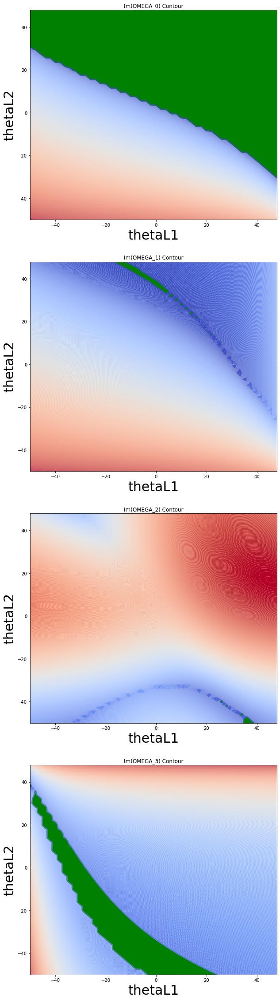

In [45]:
# plot the map of growth rate vs thetaL1 and thetaL2
if len(thetaL1)>1 and len(thetaL2)>1:
    pivot_omega_IM_Iter = np.ndarray(shape=(N_mode,len(thetaL1),len(thetaL2)),dtype=float)
    for imode in range(N_mode):
        for theta1 in range(len(thetaL1)):
            for theta2 in range(len(thetaL2)):
                pivot_omega_IM_Iter[imode][theta1][theta2] = delta_omega_Im_Iter[imode][theta1*len(thetaL2)+theta2]    
    damp = 1/t_rad_long*1
    
    fig1,axes1 = plt.subplots(N_mode,1)
    for i_mode in range(N_mode):
        if N_mode==1:
            CS = axes1.contourf(thetaL1,thetaL2,pivot_omega_IM_Iter[i_mode]-damp,antialiased=True, levels=100,alpha=1,cmap=cm.coolwarm )
            lvs = np.array(CS.levels )
            axes1.set_ylabel('thetaL2',fontsize=30)
            axes1.set_xlabel('thetaL1',fontsize=30)
            axes1.set_title("Im(OMEGA_"+str(i_mode)+" Contour")
            print(lvs)
            print(zeroline)
            if len(zeroline[0])>0:
                for i in range(zeroline[0][0]):
                    CS.collections[i].set_linewidth(5)           
                    CS.collections[i].set_color('g')
                    CS.collections[i].set_linestyle('-')
        if N_mode>1:
            CS = axes1[i_mode].contourf(thetaL1,thetaL2,pivot_omega_IM_Iter[i_mode]-damp,antialiased=True, levels=800,alpha=1,cmap=cm.coolwarm )
            lvs = np.array(CS.levels )
            #print(lvs)
            axes1[i_mode].set_ylabel('thetaL2',fontsize=30)
            axes1[i_mode].set_xlabel('thetaL1',fontsize=30)
            axes1[i_mode].set_title("Im(OMEGA_"+str(i_mode)+") Contour")
            #axes1[i_mode].clabel(CS, lvs, inline=True, fontsize=10)
            zeroline = np.where(lvs<=0)
            print(zeroline[0])
            if len(zeroline[0])>0:
                for i in zeroline[0]:
                    #print(i)
                    CS.collections[i].set_linewidth(5)           
                    CS.collections[i].set_color('g')
                    CS.collections[i].set_linestyle('-')
    fig1.set_figheight(10*N_mode)
    fig1.set_figwidth(10)
    fn_stab = os.path.join(cwd,'stability_map_thetaL_X_mu_gain='+str(gain[0])+'_RoQ_'+str(RoQ[0])+'_Mode_'+str(i_mode)+'_iter.jpg')
    plt.savefig(fn_stab,bbox_inches='tight')
    plt.show()

In [92]:
df1

array([-4250.84500733, -4377.62762837, -4494.94327789, -4604.07041316,
       -4706.07755277, -4801.86546181, -4892.19962111, -4977.73550137,
       -5059.03844311, -5136.59944685, -5210.84783031, -5282.16146291,
       -5350.87511062, -5417.28729551, -5481.66597952, -5544.25331184,
       -5605.2696269 , -5664.91683977, -5723.38135625, -5780.83659125,
       -5837.44517176, -5893.36088686, -5948.7304368 , -6003.69502505,
       -6058.39183136, -6112.955399  , -6167.51896664, -6222.21577294,
       -6277.1803612 , -6332.54991114, -6388.46562624, -6445.07420675,
       -6502.52944175, -6560.99395823, -6620.6411711 , -6681.65748616,
       -6744.24481848, -6808.62350248, -6875.03568738, -6943.74933509,
       -7015.06296769, -7089.31135115, -7166.87235489, -7248.17529663,
       -7333.71117689, -7424.04533619, -7519.83324523, -7621.84038484,
       -7730.96752011, -7848.28316963])

In [93]:
df2

array([7975.06579067, 7848.28316963, 7730.96752011, 7621.84038484,
       7519.83324523, 7424.04533619, 7333.71117689, 7248.17529663,
       7166.87235489, 7089.31135115, 7015.06296769, 6943.74933509,
       6875.03568738, 6808.62350248, 6744.24481848, 6681.65748616,
       6620.6411711 , 6560.99395823, 6502.52944175, 6445.07420675,
       6388.46562624, 6332.54991114, 6277.1803612 , 6222.21577294,
       6167.51896664, 6112.955399  , 6058.39183136, 6003.69502505,
       5948.7304368 , 5893.36088686, 5837.44517176, 5780.83659125,
       5723.38135625, 5664.91683977, 5605.2696269 , 5544.25331184,
       5481.66597952, 5417.28729551, 5350.87511062, 5282.16146291,
       5210.84783031, 5136.59944685, 5059.03844311, 4977.73550137,
       4892.19962111, 4801.86546181, 4706.07755277, 4604.07041316,
       4494.94327789, 4377.62762837])

In [99]:
delta_omega_Im_Iter[imode]

array([431.79378699, 382.81238383, 337.08390982, ..., 457.85185081,
       458.14140828, 458.4099545 ])

[0 1]
[0 1]
[0 1]
[0 1]


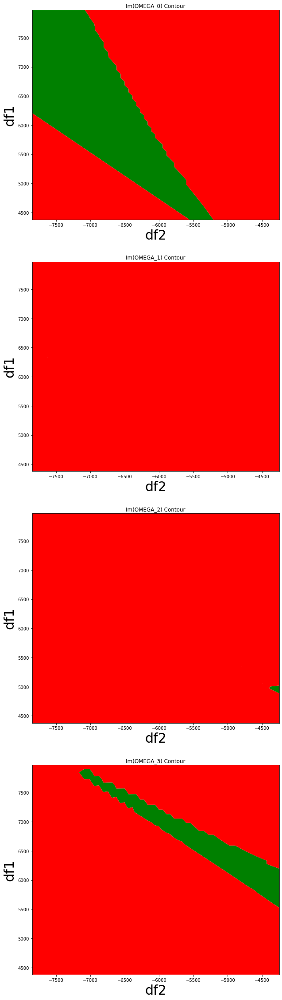

In [102]:
# plot the map of growth rate vs df1 and df2
if len(thetaL1)>1 and len(thetaL2)>1:
    pivot_omega_IM_Iter = np.ndarray(shape=(N_mode,len(thetaL1),len(thetaL2)),dtype=float)
    for imode in range(N_mode):
        for theta1 in range(len(thetaL1)):
            for theta2 in range(len(thetaL2)):
                pivot_omega_IM_Iter[imode][theta1][theta2] = delta_omega_Im_Iter[imode][theta1*len(thetaL2)+theta2]    
        pivot_omega_IM_Iter[imode] = pivot_omega_IM_Iter[imode].T
    damp = 1/t_rad_long*0
    
    fig1,axes1 = plt.subplots(N_mode,1)
    for i_mode in range(N_mode):
        if N_mode==1:
            CS = axes1.contourf(df1,df2,pivot_omega_IM_Iter[i_mode]-damp,antialiased=True, levels=100,alpha=1,cmap=cm.coolwarm )
            lvs = np.array(CS.levels )
            axes1.set_ylabel('thetaL2',fontsize=30)
            axes1.set_xlabel('thetaL1',fontsize=30)
            axes1.set_title("Im(OMEGA_"+str(i_mode)+" Contour")
            print(lvs)
            print(zeroline)
            if len(zeroline[0])>0:
                for i in range(zeroline[0][0]):
                    CS.collections[i].set_linewidth(5)           
                    CS.collections[i].set_color('g')
                    CS.collections[i].set_linestyle('-')
        if N_mode>1:
            CS = axes1[i_mode].contourf(df1,df2,pivot_omega_IM_Iter[i_mode]-damp,levels=[-1e10,0,1e10],colors=['g','r'],antialiased=True, alpha=1 )
            lvs = np.array(CS.levels )
            #print(lvs)
            axes1[i_mode].set_ylabel('df1',fontsize=30)
            axes1[i_mode].set_xlabel('df2',fontsize=30)
            axes1[i_mode].set_title("Im(OMEGA_"+str(i_mode)+") Contour")
            #axes1[i_mode].clabel(CS, lvs, inline=True, fontsize=10)
            zeroline = np.where(lvs<=0)
            print(zeroline[0])
            if 0 and len(zeroline[0])>0:
                for i in zeroline[0]:
                    #print(i)
                    CS.collections[i].set_linewidth(5)           
                    CS.collections[i].set_color('g')
                    CS.collections[i].set_linestyle('-')
    fig1.set_figheight(10*N_mode)
    fig1.set_figwidth(10)
    fn_stab = os.path.join(cwd,'stability_map_thetaL_X_mu_gain='+str(gain[0])+'_RoQ_'+str(RoQ[0])+'_Mode_'+str(i_mode)+'_iter_df.jpg')
    plt.savefig(fn_stab,bbox_inches='tight')
    plt.show()

NameError: name 'delta_omega_Im_Iter' is not defined

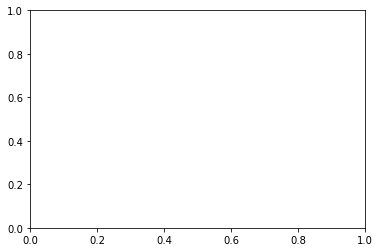

In [29]:
# plot the map of growth rate vs thetaL and mode number
damp = 1/t_rad_long*1
fig1,axes1 = plt.subplots(1,1)

lvs = np.array([np.min(delta_omega_Im_Iter)+2*i for i in range(int((np.max(delta_omega_Im_Iter)+2-np.min(delta_omega_Im_Iter))/2))],dtype='int')
CS = axes1.contourf(thetaL1,mus,delta_omega_Im_Iter-damp,levels = lvs,antialiased=True, alpha=1,cmap=cm.coolwarm )

# Recast levels to new class
lvs = np.array(CS.levels )
print(lvs)
zeroline = np.where(lvs==0)
print(zeroline)
if len(zeroline[0])>0:
    for i in range(zeroline[0][0]):
        CS.collections[i].set_linewidth(5)           
        CS.collections[i].set_color('g')
        CS.collections[i].set_linestyle('-')

axes1.set_ylabel('Mode index',fontsize=30)
axes1.set_xlabel('thetaL',fontsize=30)
axes1.set_title("Im(OMEGA) Contour")

fig1.set_figheight(10)
fig1.set_figwidth(10)
fn_stab = os.path.join(cwd,'stability_map_thetaL_X_mu_gain='+str(gain[0])+'_RoQ_'+str(RoQ[0])+'.jpg')
plt.savefig(fn_stab,bbox_inches='tight')
plt.show()

NameError: name 'thetaL' is not defined

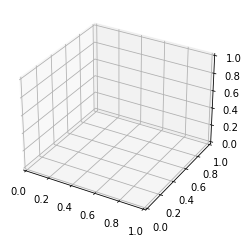

In [30]:
# plot the map of growth rate vs thetaL and mode number
damp = 1/t_rad_long*1
fig1,axes1 = plt.subplots(1,1)

axes1 = plt.axes(projection="3d")
x, y = np.meshgrid(thetaL, mus)
axes1.plot_surface(x,y,delta_omega_Im_Iter-damp,cmap=cm.coolwarm,linewidth=0, antialiased=True)
axes1.set_ylabel('Mode index',fontsize=30)
axes1.set_xlabel('thetaL',fontsize=30)
axes1.set_title("Im(OMEGA)")

#axes1[1].contourf(thetaL,mus,delta_omega_Im_Iter-damp,levels=[-1e10,0,1e10],colors=['g','r'],antialiased=True, alpha=0.6)

fig1.set_figheight(10)
fig1.set_figwidth(10)
fn_stab = os.path.join(cwd,'stability_map_thetaL_X_mu_sur.jpg')
plt.savefig(fn_stab,bbox_inches='tight')
plt.show()

In [31]:
# plot the growth rate vs thetaL
os.chdir(home1)
cwd = os.getcwd()
rng1 = 0
rng2 = len(thetaL)
step = 1#int(np.sqrt(len(thetaL)))
fig1,axes1 = plt.subplots(N_mode+1,1)
fig1.set_figheight(15*N_mode)
fig1.set_figwidth(30)
legend = np.array([str(thetaL[i*step]) for i in range(rng2)])
for mu in mus:
    for i in range(rng2):
        axes1[mu].plot(thetaL[:step],delta_omega_Im_Iter[mu][(i+rng1)*step:(i+rng1+1)*step]-1/t_rad_long,'.-', ms = 20)
        
        #axes1[0].set_ylim([-10,2.5e4])
        axes1[mu].set_title('Growth Rate (Q_IM)',fontsize=30)
        axes1[mu].set_ylabel('Im(Q)_'+str(mu),fontsize=30)
        axes1[mu].set_xlabel('ThetaL2 [degree]',fontsize=30)        
        axes1[mu].legend(legend,prop={'size': 10})
        axes1[mu].tick_params(labelsize=30)
        y_labels = axes1[mu].get_yticks()
        axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.3e'))
axes1[0].axhline(y=0)
fn_growth_rate = os.path.join(cwd,'growth_rate_iter_vs_thetaL.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()

NameError: name 'thetaL' is not defined

In [32]:
#from Mike
df_mike = np.array([1e3,500,200,150,100,0,-100,-500,-1000])-62

Qs_im_Mike = np.array([8.380303530419759E-003,4.904988025679834E-003,1.270828384461267E-003,-1.350914374513282E-005,-1.564092604978454E-003,-1.543205030896789E-003,-1.522677031621000E-003,-1.443970071172335E-003,-1.352754010995370E-003])
Omegas_im_Mike = Qs_im_Mike*f0*2*pi
Qs_re_Mike = np.array([0,0,0,0,1.805427472237517E-003,3.818720761623957E-003,5.080606373820799E-003, 8.355908859887805E-003,1.108401160068463E-002])
Omegas_re_Mike = Qs_re_Mike*f0*2*pi

In [ ]:
ddf

In [ ]:
# plot the growth rate vs df
os.chdir(home1)
cwd = os.getcwd()
rng1 = 0
rng2 = len(ddf)
fig1,axes1 = plt.subplots(N_mode+1,1)
fig1.set_figheight(15*N_mode)
fig1.set_figwidth(30)
for mu in mus:
    #axes1[mu].plot(ddf[rng1:rng2],delta_omega_Im[mu][rng1:rng2]-1/t_rad_long,'rx', ms = 20)
    axes1[mu].plot(ddf[rng1:rng2],delta_omega_Im_Iter[mu][rng1:rng2]-1/t_rad_long,'b*', ms = 20)
    axes1[0].plot(df_mike,Omegas_im_Mike,'r.', ms = 20)
    #axes1[mu].plot(ddf[rng1:rng2],qs[mu][rng1:rng2]/T0,'g.', ms = 20)
    axes1[mu].axhline(y=0)
    #axes1[0].set_ylim([-10,2.5e4])
    axes1[mu].set_title('Growth Rate',fontsize=30)
    axes1[mu].set_ylabel('Im(OMEGA)_'+str(mu)+'[Hz]',fontsize=30)
    axes1[mu].set_xlabel('df (from opt. detune)[Hz]',fontsize=30)
    #axes1[mu].legend(["Iterative_Solver_TX","Iterative_Solver_MMB","Fitted from simulation"],prop={'size': 30})
    axes1[mu].legend(["Iterative_Solver_TX","Fitted from simulation"],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.3f'))

fn_growth_rate = os.path.join(cwd,'growth_rate_fit_analy_iter_vs_thetaL.jpg')
plt.savefig(fn_growth_rate,bbox_inches= 'tight')
plt.show()

In [ ]:
# plot the growth rate vs thetaL
os.chdir(home1)
cwd = os.getcwd()
rng1 = 0
rng2 = len(thetaL)
fig1,axes1 = plt.subplots(N_mode+1,1)
fig1.set_figheight(30*N_mode)
fig1.set_figwidth(30)
for mu in mus:
    #axes1[mu].plot(thetaL[rng1:rng2],delta_omega_Im[mu][rng1:rng2]-1/t_rad_long,'rx', ms = 20)
    axes1[mu].plot(thetaL[rng1:rng2],delta_omega_Im_Iter[mu][rng1:rng2]-1/t_rad_long,'b*', ms = 20)
    axes1[mu].plot(thetaL[rng1:rng2],qs[mu][rng1:rng2]/T0,'g.', ms = 20)
    axes1[mu].axhline(y=0)
    #axes1[0].set_ylim([-10,2.5e4])
    axes1[mu].set_title('Growth Rate (Q_IM)',fontsize=30)
    axes1[mu].set_ylabel('Im(Q)_'+str(mu),fontsize=30)
    axes1[mu].set_xlabel('ThetaL [degree]',fontsize=30)
    #axes1[mu].legend(["Analytical(Chao)", "Iterative_Solver","Fitted from simulation"],prop={'size': 30})
    axes1[mu].legend(["Iterative_Solver","Fitted from simulation"],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.3e'))

fn_growth_rate = os.path.join(cwd,'growth_rate_fit_analy_iter_vs_thetaL.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()

In [ ]:
# plot the growth rate vs gain,exclude t_rad_long
os.chdir(home1)
cwd = os.getcwd()
rng1 = 0
rng2 = 10#N_samp_disp#len(gain)
fig1,axes1 = plt.subplots(N_mode+1,1)
fig1.set_figheight(15*(N_mode))
fig1.set_figwidth(30)
for mu in mus:
    axes1[mu].plot(gain[rng1:rng2],delta_omega_Im[mu][rng1:rng2],'rx', ms = 20)
    axes1[mu].plot(gain[rng1:rng2],delta_omega_Im_Iter[mu][rng1:rng2],'b*', ms = 20)
    axes1[mu].plot(gain[rng1:rng2],qs[mu][rng1:rng2]/T0+1/t_rad_long,'g.', ms = 20)
    #axes1[0].set_ylim([-10,10])
    #axes1[mu].axhline(y = 0)
    axes1[mu].axhline(y = 1/t_rad_long)
    axes1[mu].set_title('Growth Rate ($\Omega_{IM}$)',fontsize=30)
    axes1[mu].set_ylabel(r'Im($\Omega$)_'+str(mu),fontsize=30)
    axes1[mu].set_xlabel('Gain',fontsize=30)
    axes1[mu].legend(["Analytical(Chao)", "Iterative_Solver","Fitted from simulation",r'$|\frac{1}{t_{rad_long}}|$'],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.3e'))
print(cwd)
fn_growth_rate = os.path.join(cwd,'growth_rate_fit_analy_iter_vs_gain.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()

In [ ]:
# plot the growth Time vs thetaL
os.chdir(home1)
cwd = os.getcwd()
rng1 = 0
rng2 = len(thetaL)
fig1,axes1 = plt.subplots(N_mode+1,1)
fig1.set_figheight(30)
fig1.set_figwidth(30)
for mu in mus:
    #axes1[mu].plot(thetaL[rng1:rng2],1/(delta_omega_Im[mu][rng1:rng2]-1/t_rad_long),'rx', ms = 20)
    #axes1[mu].plot(thetaL[rng1:rng2],1/(delta_omega_Im_Iter[mu][rng1:rng2]-1/t_rad_long),'b*', ms = 20)
    axes1[mu].plot(thetaL[rng1:rng2],1/(delta_omega_Im_Iter[mu][rng1:rng2]),'b*', ms = 20)
    axes1[mu].plot(thetaL[rng1:rng2],1/(qs[mu][rng1:rng2]/T0),'g.', ms = 20)
    axes1[mu].axhline(y=t_rad_long,color='g')
    axes1[mu].axhline(y=0,color='r')
    #axes1[0].set_ylim([-4e-4,4e-4])
    axes1[mu].set_title('Growth time (include effect of t_rad_long)',fontsize=30)
    axes1[mu].set_ylabel('tau [s]_'+str(mu),fontsize=30)
    axes1[mu].set_xlabel('ThetaL [degree]',fontsize=30)
    #axes1[mu].legend(["Analytical(Chao)", "Iterative_Solver","Fitted from simulation"],prop={'size': 30})
    axes1[mu].legend(["Iterative_Solver","Fitted from simulation"],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.3e'))

fn_growth_rate = os.path.join(cwd,'growth_Time_fit_analy_iter_vs_thetaL.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()

In [ ]:
# plot the growth rate vs Ib
os.chdir(home1)
cwd = os.getcwd()
fig1,axes1 = plt.subplots(N_mode+1,1)
fig1.set_figheight(30)
fig1.set_figwidth(30)
rng1 = 0
rng2 = 50
for mu in mus:
    axes1[mu].plot(current[rng1:rng2],delta_omega_Im[mu][rng1:rng2]-1/t_rad_long,'rx-')
    axes1[mu].plot(current[rng1:rng2],delta_omega_Im_Iter[mu][rng1:rng2]-1/t_rad_long,'b*-')
    axes1[mu].plot(current[rng1:rng2],qs[mu][rng1:rng2]/T0,'g.-', ms = 20)
    
    #axes1[0].set_ylim([-100,10])
    axes1[mu].axhline(y=0)

    axes1[mu].set_title('Growth rate.',fontsize=30)
    axes1[mu].set_ylabel('Im(Q)_'+str(mu),fontsize=30)
    axes1[mu].set_xlabel('IbDC [A]',fontsize=30)
    axes1[mu].legend(["Analytical(Chao)", "Iterative_Solver","Fitted from simulation"],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    #axes1.set_ylim([-0.001,0.001])
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.5f'))

fn_growth_rate = os.path.join(cwd,'growth_rate.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()

In [ ]:
# plot the growth Time vs Ib
os.chdir(home1)
cwd = os.getcwd()
#current = [float(folder[21:25]) for folder in folders]
fig1,axes1 = plt.subplots(N_mode+1,1)
fig1.set_figheight(30)
fig1.set_figwidth(30)
rng1 = 0
rng2 = 50
for mu in mus:
    axes1[mu].plot(current[rng1:rng2],1/(delta_omega_Im[mu][rng1:rng2]),'rx', ms = 20)
    axes1[mu].plot(current[rng1:rng2],1/(delta_omega_Im_Iter[mu][rng1:rng2]),'b*', ms = 20)
    axes1[mu].plot(current[rng1:rng2],1/(qs[mu][rng1:rng2]/T0+1/t_rad_long),'g.', ms = 20)
    axes1[mu].axhline(y=0)
    #axes1[0].set_ylim([0,0.006])
    axes1[mu].set_title('Growth time.',fontsize=30)
    axes1[mu].set_ylabel('tau_'+str(mu),fontsize=30)
    axes1[mu].set_xlabel('IbDC [A]',fontsize=30)
    axes1[mu].legend(["Analytical(Chao)","Fitted from simulation", "Iterative_Solver"],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    #axes1.set_ylim([-0.001,0.001])
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.5e'))

fn_growth_rate = os.path.join(cwd,'growth_time.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()
os.chdir(home0)

In [ ]:
# plot the growth rate vs gain
os.chdir(home1)
cwd = os.getcwd()
fig1,axes1 = plt.subplots(N_mode+1,1)
fig1.set_figheight(30)
fig1.set_figwidth(30)
rng1 = 0
rng2 = 50
for mu in mus:
    axes1[mu].plot(gain[rng1:rng2],delta_omega_Im[mu][rng1:rng2]-1/t_rad_long,'rx-')
    axes1[mu].plot(gain[rng1:rng2],delta_omega_Im_Iter[mu][rng1:rng2]-1/t_rad_long,'b*-')
    axes1[mu].plot(gain[rng1:rng2],qs[mu][rng1:rng2]/T0,'g.-', ms = 20)
    #axes1[0].set_ylim([-100,10])
    axes1[mu].axhline(y=0)

    axes1[mu].set_title('Growth rate.',fontsize=30)
    axes1[mu].set_ylabel('Im(Q)_'+str(mu),fontsize=30)
    axes1[mu].set_xlabel('Gain',fontsize=30)
    axes1[mu].legend(["Analytical(Chao)","Fitted from simulation", "Iterative_Solver"],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    #axes1.set_ylim([-0.001,0.001])
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.5e'))

fn_growth_rate = os.path.join(cwd,'growth_rate_vs_gain.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()

In [ ]:
# Plot Centroids, cm
centroids = [(i*fill_step+0.5)*Trf[mainRF] for i in range(nBunch)]

inputfn = 'input.txt'
for folder in new_folders[:]:
    print(folder)
    os.chdir(os.path.join(home1,folder))
    cwd = os.getcwd()
    inputfile = os.path.join(cwd,inputfn)
    tempinput = {}
    with open(inputfile) as inputfile:
        for line in inputfile:
            if len(line.split())>1:
                tempinput[line.split()[0]] = line.split()[1:]
    for i in tempinput:
        for j in range(len(tempinput[i])):
            tempinput[i][j] = float(tempinput[i][j])
   
    nTurns = int(tempinput['n_turns'][0])
    
    nBunch = int(tempinput['n_bunches'][0])
    
    M1_all = array('d')
    M1_fn = 'M1_all.bin'
    datafile = os.path.join(cwd,M1_fn)    
    with open(datafile, mode='rb') as file: # b is important -> binary
        M1_all.fromfile(file,2*nTurns*nBeam*nBunch)
    M1_1 = []
    M1_2 = []
    for i in range(nTurns):
        for j in range(nBunch):
            M1_1.append(M1_all[i*nBunch*2+j])
            M1_2.append(M1_all[i*nBunch*2+nBunch+j]-Gamma0)
    turns = np.array([i for i in range(nTurns*nBeam*nBunch)])
    
    fig1,axes1 = plt.subplots(1,1)
    fig1.set_figheight(10)
    fig1.set_figwidth(30)
    
    turns = 510
    rng1 = turns*nBunch
    rng2 = rng1+nBunch*1
    
    axes1.plot(((np.array(M1_1[rng1:rng2]))-centroids)*clight*100,'rx-')
    axes1_2 = axes1.twinx()
    axes1_2.plot((np.array(M1_1[rng1:rng2])-centroids)*h[0]*f0*360,'r.')
    axes1_2.set_ylabel('phase [degree]',fontsize=30)
    
    axes1.set_ylabel('centroid (cm)',fontsize=30)
    axes1.set_xlabel('Bunch #',fontsize=30)
    axes1.tick_params(labelsize=30)
    axes1_2.tick_params(labelsize=30)
    fn_after = os.path.join(cwd,'Centroids_cm_'+str(turns)+'_'+str((rng2-rng1)/nBunch)+'.jpg')
    plt.savefig(fn_after,bbox_inches='tight')
    plt.show()
os.chdir(home0)

In [ ]:
# Plot Centroids, ps
centroids = [(i*fill_step+0.5)*Trf[mainRF] for i in range(nBunch)]

inputfn = 'input.txt'
for folder in new_folders[:]:
    print(folder)
    os.chdir(os.path.join(home1,folder))
    cwd = os.getcwd()
    inputfile = os.path.join(cwd,inputfn)
    tempinput = {}
    with open(inputfile) as inputfile:
        for line in inputfile:
            if len(line.split())>1:
                tempinput[line.split()[0]] = line.split()[1:]
    for i in tempinput:
        for j in range(len(tempinput[i])):
            tempinput[i][j] = float(tempinput[i][j])
   
    nTurns = int(tempinput['n_turns'][0])
    
    nBunch = int(tempinput['n_bunches'][0])
    
    M1_all = array('d')
    M1_fn = 'M1_all.bin'
    datafile = os.path.join(cwd,M1_fn)    
    with open(datafile, mode='rb') as file: # b is important -> binary
        M1_all.fromfile(file,2*nTurns*nBeam*nBunch)
    M1_1 = []
    M1_2 = []
    for i in range(nTurns):
        for j in range(nBunch):
            M1_1.append(M1_all[i*nBunch*2+j])
            M1_2.append(M1_all[i*nBunch*2+nBunch+j]-Gamma0)
    turns = np.array([i for i in range(nTurns*nBeam*nBunch)])
    
    fig1,axes1 = plt.subplots(1,1)
    fig1.set_figheight(10)
    fig1.set_figwidth(30)
    
    turns = 450
    rng1 = turns*nBunch
    rng2 = rng1+nBunch*1
    
    axes1.plot(((np.array(M1_1[rng1:rng2]))-centroids)*1e12,'rx-')
    axes1_2 = axes1.twinx()
    axes1_2.plot((np.array(M1_1[rng1:rng2])-centroids)*h[0]*f0*360,'r.')
    axes1_2.set_ylabel('phase [degree]',fontsize=30)
    
    axes1.set_ylabel('centroid (ps)',fontsize=30)
    axes1.set_xlabel('Bunch #',fontsize=30)
    axes1.tick_params(labelsize=30)
    axes1_2.tick_params(labelsize=30)
    fn_after = os.path.join(cwd,'Centroids_ps_'+str(turns)+'_'+str((rng2-rng1)/nBunch)+'.jpg')
    plt.savefig(fn_after,bbox_inches='tight')
    plt.show()
os.chdir(home0)

In [ ]:
nTurns = int(tempinput['n_turns'][0])
nBunch = int(tempinput['n_bunches'][0])

M1_2_all = np.ndarray([len(new_folders),nBunch*nTurns])
ifold = 0
for folder in new_folders[:]:
    print(folder)
    os.chdir(os.path.join(home1,folder))
    cwd = os.getcwd()
    inputfile = os.path.join(cwd,inputfn)
    tempinput = {}
    with open(inputfile) as inputfile:
        for line in inputfile:
            if len(line.split())>1:
                tempinput[line.split()[0]] = line.split()[1:]
    for i in tempinput:
        for j in range(len(tempinput[i])):
            tempinput[i][j] = float(tempinput[i][j])
   
    nTurns = int(tempinput['n_turns'][0])
    nBunch = int(tempinput['n_bunches'][0])
    
    M1_all = array('d')
    M1_fn = 'M1_all.bin'
    datafile = os.path.join(cwd,M1_fn)    
    with open(datafile, mode='rb') as file: # b is important -> binary
        M1_all.fromfile(file,2*nTurns*nBeam*nBunch)
    M1_2 = []
    for i in range(nTurns):
        for j in range(nBunch):
            M1_2.append(M1_all[i*nBunch*2+nBunch+j]-Gamma0)
    print(len(M1_2))
    M1_2_all[ifold] = M1_2
    ifold+=1
os.chdir(home0)

In [ ]:
# Plot Centroids d_gamma
def find_idx(data,nBunch,threshold):
    print(np.max(data))
    idx = np.array(np.where(np.abs(data)>threshold)[0])
    
    if len(idx)>0:
        
        return int(idx[0]/nBunch)
    else:
        return int(len(data)/nBunch)
fs = omegas/2/pi
ifold = 0
for folder in new_folders[ifold:]:
    print(folder)
    rng1 = nDynamic*nBunch
    nturn = find_idx(M1_2_all[ifold],nBunch,10)
    print(nturn)
    rng2 = nturn*nBunch
    rng2 = rng1+10000000
    fig1,axes1 = plt.subplots(1,1)
    fig1.set_figheight(10)
    fig1.set_figwidth(30)
    
    
    axes1.plot(M1_2_all[ifold][rng1:rng2],'rx-')
    
    axes1.tick_params(labelsize=30)
    plt.show()
    ifold += 1
os.chdir(home0)

In [ ]:
def smooth(data,n):
    data_temp = np.zeros(len(data))*1j
    step = int(n/2)
    data_temp[:step+1] = data[:step+1]
    for i in range(n):
        data_temp[step:len(data)-step] += data[i:len(data)-n+i+1]
    return data_temp/n

# Plot fft Centroids mode mu=0 d_gamma
df_real_fit_0 = []
fs = omegas/2/pi
ifold = 0
mu=0
expo0 = np.array([np.exp(1j*i*2*pi*mu/(nBunch+nGap)) for i in range(nBunch)])
for folder in new_folders[:]:
    print(folder)
    start_t = 4000
    rng1 = start_t*nBunch
    end_t = find_idx(M1_2_all[ifold],nBunch,100)
    print("end_t= ",end_t)
    rng2 = end_t*nBunch
    A0 = np.zeros(end_t-start_t)
    
    for i in range(start_t,end_t):
        A0[i-start_t] = np.sum(M1_2_all[ifold][i*nBunch:(i+1)*nBunch]*expo0)/nBunch
    
    a = np.fft.fft(A0-np.mean(A0))
    c = smooth((a),1)

    n = len(a)
    print(n)
    stepsize =T0#1/630.0
    b = np.fft.fftfreq(n,d=stepsize)
    f_step = 1/n/stepsize
    print("Frequency Step = ",f_step)
    fig1,axes1 = plt.subplots(2,1)
    fig1.set_figheight(20)
    fig1.set_figwidth(30)
    
    rg1 = int(0*fs/f_step)
    rg2 = int(5*fs/f_step)
    rg3 = int(0.5*fs/f_step)
    peaks, _ = find_peaks(np.abs(c[rg1:rg3]))
    
    print("frequency of peak ",b[peaks+rg1])
    if len(peaks)==0:
        df_real_fit_0.append(b[0+rg1]-omegas/2/pi)
    else:
        df_real_fit_0.append(b[peaks[-1]+rg1]-omegas/2/pi)
    #axes1.plot(b[rg1:rg2]/fs,(np.abs(a[rg1:rg2])),'rx-')
    #axes1.plot(b[rg1:rg2]/fs,np.log10(c[rg1:rg2]),'g.-')
    axes1[0].plot(np.real(A0[:]))
    axes1[1].plot(b[rg1:rg2]/fs,np.abs((c[rg1:rg2])),'g.-')
    #axes1[1].plot(b[rg1:rg2]/fs,c[rg1:rg2],'g.-')
    axes1[1].plot(b[rg1+peaks]/fs,np.abs((c[rg1+peaks])),'bx',ms=30)
    for ifx in range(1):
        axes1[1].axvline(x = 1+ifx*0.5,color='g')
    axes1[1].set_xlabel(r'$\frac{f}{fs}$',fontsize = 30)
    #axes1[1].set_title("df = "+"{0:0.2f}".format(df_real_fit[-1])+" [Hz] vs fs= {0:0.2f} [Hz]".format(omegas/2/pi),fontsize=30)
    #axes1.set_ylim([0,4])
    axes1[0].tick_params(labelsize=30)
    axes1[1].tick_params(labelsize=30)
    
    fn_after = os.path.join(cwd,'FFT'+folder+'.jpg')
    plt.savefig(fn_after,bbox_inches='tight')
    
    plt.show()
    ifold += 1
os.chdir(home0)

In [ ]:
df_real_fit_0

In [ ]:
def smooth(data,n):
    data_temp = np.zeros(len(data))
    step = int(n/2)
    data_temp[:step+1] = data[:step+1]
    for i in range(n):
        data_temp[step:len(data)-step] += data[i:len(data)-n+i+1]
    return data_temp/n

# Plot fft Centroids mode mu=1 d_gamma
df_real_fit_1 = []
fs = omegas/2/pi
ifold = 0
mu=1
expo0 = np.array([np.exp(1j*i*2*pi*mu/(nBunch+nGap)) for i in range(nBunch)])
for folder in new_folders[ifold:]:
    print(folder)
    start_t = 4000
    rng1 = start_t*nBunch
    end_t = find_idx(M1_2_all[ifold],nBunch,40)
    rng2 = end_t*nBunch
    A0 = np.zeros(end_t-start_t)
    
    for i in range(start_t,end_t):
        A0[i-start_t] = np.sum(M1_2_all[ifold][i*nBunch:(i+1)*nBunch]*expo0)/nBunch
    
    a = np.fft.fft(A0)
    c = smooth(np.abs(a),1)

    n = len(a)
    print(n)
    stepsize =T0#1/630.0
    b = np.fft.fftfreq(n,d=stepsize)
    f_step = 1/n/stepsize
    print("Frequency Step = ",f_step)
    fig1,axes1 = plt.subplots(2,1)
    fig1.set_figheight(20)
    fig1.set_figwidth(30)
    
    rg1 = int(0*fs/f_step)
    rg2 = int(5*fs/f_step)
    rg3 = int(1.5*fs/f_step)
    peaks, _ = find_peaks(c[rg1:rg3], height=800,distance=300)
    
    print("frequency of peak ",b[peaks+rg1])
    if len(peaks)==0:
        df_real_fit_1.append(b[0+rg1]-omegas/2/pi)
    else:
        df_real_fit_1.append(b[peaks[-1]+rg1]-omegas/2/pi)
    #axes1.plot(b[rg1:rg2]/fs,(np.abs(a[rg1:rg2])),'rx-')
    #axes1.plot(b[rg1:rg2]/fs,np.log10(c[rg1:rg2]),'g.-')
    axes1[0].plot(np.real(A0[:]))
    axes1[1].plot(b[rg1:rg2]/fs,np.log10(c[rg1:rg2]),'g.-')
    axes1[1].plot(b[rg1+peaks]/fs,np.log10(c[rg1+peaks]),'bx',ms=30)
    for ifx in range(1):
        axes1[1].axvline(x = 1+ifx*0.5,color='g')
    axes1[1].set_xlabel(r'$\frac{f}{fs}$',fontsize = 30)
    #axes1[1].set_title("df = "+"{0:0.2f}".format(df_real_fit[-1])+" [Hz] vs fs= {0:0.2f} [Hz]".format(omegas/2/pi),fontsize=30)
    #axes1.set_ylim([0,4])
    
    axes1[0].tick_params(labelsize=30)
    
    axes1[1].tick_params(labelsize=30)
    
    fn_after = os.path.join(cwd,'FFT'+folder+'.jpg')
    plt.savefig(fn_after,bbox_inches='tight')
    
    plt.show()
    ifold += 1
os.chdir(home0)

In [ ]:
df_real_fit_1

In [ ]:
def smooth(data,n):
    data_temp = np.zeros(len(data))
    step = int(n/2)
    data_temp[:step+1] = data[:step+1]
    for i in range(n):
        data_temp[step:len(data)-step] += data[i:len(data)-n+i+1]
    return data_temp/n

# Plot fft Centroids d_gamma
df_real_fit = []
fs = omegas/2/pi
ifold = 0
for folder in new_folders[ifold:]:
    print(folder)
    rng1 = 4000*nBunch
    nturn = find_idx(M1_2_all[ifold],nBunch,250)
    rng2 = nturn*nBunch
    a = np.fft.fft((M1_2_all[ifold][rng1:rng2]-1*np.mean(M1_2_all[ifold][rng1:rng2])))
    c = smooth(np.abs(a),1)

    n = len(a)
    stepsize =12*Trf[0]#1/630.0
    b = np.fft.fftfreq(n,d=stepsize)
    f_step = 1/n/stepsize
    print("Frequency Step = ",f_step)
    fig1,axes1 = plt.subplots(1,1)
    fig1.set_figheight(10)
    fig1.set_figwidth(30)
    
    rg1 = int(0*fs/f_step)
    rg2 = int(5*fs/f_step)
    rg3 = int(2*fs/f_step)
    peaks, _ = find_peaks(c[rg1:rg3], height=20,distance=10)
    
    print(b[peaks+rg1])
    if len(peaks)==0:
        df_real_fit.append(b[0+rg1]-omegas/2/pi)
    else:
        #df_real_fit.append(b[peaks[-1]+rg1]-omegas/2/pi)
        df_real_fit.append(b[peaks[np.argmax(c[peaks])]+rg1]-omegas/2/pi)
        
    print(c[peaks])
    print(peaks[np.argmax(c[peaks])])
    #axes1.plot(b[rg1:rg2]/fs,(np.abs(a[rg1:rg2])),'rx-')
    #axes1.plot(b[rg1:rg2]/fs,np.log10(c[rg1:rg2]),'g.-')
    axes1.plot(b[rg1:rg2]/fs,(c[rg1:rg2]),'g.-')

    #axes1.plot(b[rg1+peaks]/fs,np.log10(c[rg1+peaks]),'bx',ms=30)
    axes1.plot(b[rg1+peaks]/fs,(c[rg1+peaks]),'bx',ms=30)
    
    for ifx in range(1):
        axes1.axvline(x = 1+ifx*0.5,color='g')
    axes1.set_xlabel(r'$\frac{f}{fs}$',fontsize = 30)
    axes1.set_title("df = "+"{0:0.2f}".format(df_real_fit[-1])+" [Hz] vs fs= {0:0.2f} [Hz]".format(omegas/2/pi),fontsize=30)
    #axes1.set_ylim([0,4])
    
    axes1.tick_params(labelsize=30)
    fn_after = os.path.join(cwd,'FFT'+folder+'.jpg')
    plt.savefig(fn_after,bbox_inches='tight')
    plt.show()
    ifold += 1
os.chdir(home0)

In [ ]:
df_real_fit

In [ ]:
delta_omega_Re/2/pi

In [ ]:
(delta_omega_Re_Iter-omegas)/2/pi

In [ ]:
# plot the frequency shift vs Ib
os.chdir(home1)
cwd = os.getcwd()
rng1 = 0
rng2 = len(current)
fig1,axes1 = plt.subplots(N_mode,1)
fig1.set_figheight(30)
fig1.set_figwidth(30)
for mu in mus:
    axes1[mu].plot(current[rng1:rng2],(delta_omega_Re[mu][rng1:rng2])/omegas,'rx', ms = 20)
    axes1[mu].plot(current[rng1:rng2],(delta_omega_Re_Iter[mu][rng1:rng2]-omegas)/omegas,'b*', ms = 20)
    axes1[0].plot(current[rng1:rng2],df_real_fit_0[rng1:rng2]/omegas*2*pi,'g.', ms = 20)
    axes1[1].plot(current[rng1:rng2],df_real_fit_1[rng1:rng2]/omegas*2*pi,'g.', ms = 20)
    axes1[mu].axhline(y=-1)
    #axes1[0].set_ylim([-10,2.5e4])
    #axes1[mu].set_title('Re(OMEGA/2pi)',fontsize=30)
    axes1[mu].set_ylabel(r'$\frac{df}{f_s}$',fontsize=50)
    axes1[mu].set_xlabel('IbDC [A]',fontsize=30)
    axes1[mu].legend([ "Iterative_Solver","Fitted from simulation"],prop={'size': 30})
    #axes1[mu].legend(["Linear Approx.", "Iterative_Solver","Fitted from simulation"],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.2f'))

fn_growth_rate = os.path.join(cwd,'f_shift_fit_analy_iter_vs_thetaL.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()

In [ ]:
# Plot first d_gamma
fs = omegas/2/pi
ifold = 0
for folder in new_folders[ifold:]:
    print(folder)
    rng1 = 3000*nBunch+1
    nturn = 20
    rng2 = rng1+nturn*nBunch
    
    fig1,axes1 = plt.subplots(1,1)
    fig1.set_figheight(10)
    fig1.set_figwidth(30)
    
    
    axes1.plot(M1_2_all[ifold][rng1:rng2:nBunch],'rx-')
    
    axes1.tick_params(labelsize=30)
    plt.show()
    ifold += 1
os.chdir(home0)

In [ ]:
# Plot fft of first d_gamma
df_real_fit = []
fs = omegas/2/pi
ifold = 0
for folder in new_folders[ifold:]:
    print(folder)
    rng1 = 3000*nBunch
    nturn = 200
    rng2 = rng1+nturn*nBunch
    a = np.fft.fft((M1_2_all[ifold][rng1:rng2:nBunch]-1*np.mean(M1_2_all[ifold][rng1:rng2:nBunch])))
    c = smooth(np.abs(a),1)

    n = len(a)
    stepsize =12*Trf[0]*nBunch#1/630.0
    b = np.fft.fftfreq(n,d=stepsize)
    f_step = 1/n/stepsize
    print("Frequency Step = ",f_step)
    fig1,axes1 = plt.subplots(1,1)
    fig1.set_figheight(10)
    fig1.set_figwidth(30)
    
    rg1 = 0
    rg2 = int(5*fs/f_step)
    rg3 = int(2*fs/f_step)
    peaks, _ = find_peaks(c[rg1:rg3], height=50,distance=300)
    
    print(b[peaks+rg1])
    if len(peaks)==0:
        df_real_fit.append(b[0+rg1]-omegas/2/pi)
    else:
        df_real_fit.append(b[peaks[-1]+rg1]-omegas/2/pi)

    #axes1.plot(b[rg1:rg2]/fs,(np.abs(a[rg1:rg2])),'rx-')
    axes1.plot(b[rg1:rg2]/fs,(c[rg1:rg2]),'g.-')
    axes1.plot(b[rg1+peaks]/fs,(c[rg1+peaks]),'bx',ms=30)
    
    for ifx in range(1):
        axes1.axvline(x = 1+ifx*0.5,color='g')
    axes1.set_xlabel(r'$\frac{f}{fs}$',fontsize = 30)
    axes1.set_title("df = "+"{0:0.2f}".format(df_real_fit[-1])+" [Hz] vs fs= {0:0.2f} [Hz]".format(omegas/2/pi),fontsize=30)
    #axes1.set_ylim([0,4])
    
    axes1.tick_params(labelsize=30)
    fn_after = os.path.join(cwd,'FFT_first'+folder+'.jpg')
    plt.savefig(fn_after,bbox_inches='tight')
    plt.show()
    ifold += 1
os.chdir(home0)

In [ ]:
df_mike

In [ ]:
Omegas_re_Mike

In [ ]:
# plot the frequency shift vs df
os.chdir(home1)
cwd = os.getcwd()
rng1 = 0
rng2 = len(ddf)
fig1,axes1 = plt.subplots(N_mode,1)
fig1.set_figheight(30)
fig1.set_figwidth(30)
for mu in mus:
    #axes1[mu].plot(ddf[rng1:rng2],(delta_omega_Re[mu][rng1:rng2])/omegas,'rx', ms = 20)
    axes1[mu].plot(ddf[rng1:rng2],(delta_omega_Re_Iter[mu][rng1:rng2]-omegas)/omegas,'b*', ms = 20)
    axes1[0].plot(df_mike,(Omegas_re_Mike-omegas)/omegas,'r.', ms = 20)
    
    axes1[0].plot(ddf[rng1:rng2],df_real_fit_0[rng1:rng2]/omegas*2*pi,'g.', ms = 20)
    
    axes1[1].plot(ddf[rng1:rng2],df_real_fit_1[rng1:rng2]/omegas*2*pi,'g.', ms = 20)
    
    #axes1[mu].axhline(y=0)
    #axes1[0].set_ylim([-10,2.5e4])
    #axes1[mu].set_title('Re(OMEGA/2pi)',fontsize=30)
    axes1[mu].set_ylabel(r'$\frac{df}{fs}$',fontsize=50)
    axes1[mu].set_xlabel('Detune (from opt. detune)[Hz]',fontsize=30)
    axes1[mu].legend(["Iterative_Solver_TX","Iterative_Solver_MMB","Fitted from simulation"],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.1f'))

fn_growth_rate = os.path.join(cwd,'f_shift_fit_analy_iter_vs_thetaL.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()

In [ ]:
fs

In [ ]:
# plot the frequency shift vs thetaL
os.chdir(home1)
cwd = os.getcwd()
rng1 = 0
rng2 = len(thetaL)
fig1,axes1 = plt.subplots(N_mode,1)
fig1.set_figheight(30)
fig1.set_figwidth(30)
for mu in mus:
    #axes1[mu].plot(thetaL[rng1:rng2],(delta_omega_Re[mu][rng1:rng2])/2/pi,'rx', ms = 20)
    axes1[mu].plot(thetaL[rng1:rng2],(delta_omega_Re_Iter[mu][rng1:rng2]-omegas)/2/pi,'b*', ms = 20)
    axes1[mu].plot(thetaL[rng1:rng2],df_real_fit_0[rng1:rng2],'g.', ms = 20)
    #axes1[mu].axhline(y=0)
    #axes1[0].set_ylim([-10,2.5e4])
    axes1[mu].set_title('Growth Rate (Q_IM)',fontsize=30)
    axes1[mu].set_ylabel('Im(Q)_'+str(mu),fontsize=30)
    axes1[mu].set_xlabel('ThetaL [degree]',fontsize=30)
    axes1[mu].legend(["Analytical(Chao)", "Iterative_Solver","Fitted from simulation"],prop={'size': 30})
    axes1[mu].tick_params(labelsize=30)
    y_labels = axes1[mu].get_yticks()
    axes1[mu].yaxis.set_major_formatter(ticker.FormatStrFormatter('%0.3e'))

fn_growth_rate = os.path.join(cwd,'f_shift_fit_analy_iter_vs_thetaL.jpg')
plt.savefig(fn_growth_rate,bbox_inches='tight')
plt.show()

In [ ]:
nModes = 2
fig,axi = plt.subplots(nModes+1,1)
fig.set_figheight(10*nModes)
fig.set_figwidth(30)
tot_turn = np.array([i for i in range(nTurns)])
amp_1 = np.ndarray((nModes,nTurns))
for mu in range(nModes):
    for turn in range(nTurns):
        test = np.zeros(nBunch)
        test[:nBunch] = M1_2[turn*nBunch:(turn+1)*nBunch]
        test = np.fft.fft(test)/nBunch*2
        amp_1[mu][turn] = np.abs(test[-mu])
    rng1 = 3000
    rng2 = rng1+250
    axi[mu].plot(tot_turn[rng1:rng2],np.abs(amp_1[mu][rng1:rng2]),'gx-')
    axi[mu].plot(tot_turn[rng1:rng2],np.abs(c[mu][rng1:rng2]),'rx-')
    
    axi[mu].set_ylabel('mode'+str(mu))
plt.show()

In [ ]:
# 1RF analytical case
RoQ = 500
NC = 1
harm = 5040
f0 = 78e3
f = harm*f0
eta = 0.00133198
Ek = 10e9
Pbeam = 10e6
IbDC = 2.5
Ib = IbDC*2
Qs_need = 0.05

Vs = Pbeam/IbDC
Vq = Qs_need**2*2*pi*Ek/(harm*eta)
Vc = np.sqrt(Vs**2+Vq**2)
QL = (Vs**2+Vq**2)/(RoQ*2*Pbeam)

R = RoQ*NC*QL
I0 = Vc/R
cosPhis = Vs/np.sqrt(Vs**2+Vq**2)
sinPhis = Vq/np.sqrt(Vs**2+Vq**2)
df = IbDC*RoQ*sinPhis*f/Vc
Y_load = Ib/I0
print("Vq = ",Vq/1e6,"[MV]")
print("Vs = ",Vs/1e6,"[MV]")
print("df = ",df)
print("QL = ",QL)
print("Qs_need = ",Qs_need)
print("Vc = ", Vc/1e6,"[MV]")
print("R = ",R/1e6,"MOhm")
print("IbDC = ",IbDC)
print("I0 = ",I0)
print("Y = ",Y_load)

In [ ]:
RoQ


In [ ]:
NC

In [ ]:
IbDC

In [ ]:
eta

In [ ]:
# 1RF analytical case

RoQ_temp = RoQ[0]
NC = 1
harm = h[0]
f0 = f0
f = harm*f0
eta = eta
Ek = Ek
Pbeam = 16.5e6
IbDC = 0.46
Ib = IbDC*2
Qs_need = 0.028

Vs = Pbeam/IbDC
Vq = Qs_need**2*2*pi*Ek/(harm*eta)
Vc = np.sqrt(Vs**2+Vq**2)
QL = (Vs**2+Vq**2)/(RoQ_temp*2*Pbeam)

R = RoQ_temp*NC*QL
I0 = Vc/R
cosPhis = Vs/np.sqrt(Vs**2+Vq**2)
sinPhis = Vq/np.sqrt(Vs**2+Vq**2)
df = IbDC*RoQ_temp*sinPhis*f/Vc
Y_load = Ib/I0
print("Vq = ",Vq/1e6,"[MV]")
print("Vs = ",Vs/1e6,"[MV]")
print("df = ",df)
print("QL = ",QL)
print("Qs_need = ",Qs_need)
print("Vc = ", Vc/1e6,"[MV]")
print("R = ",R/1e6,"MOhm")
print("IbDC = ",IbDC)
print("I0 = ",I0)
print("Y = ",Y_load)

In [ ]:
n_samp = 100000
phi_start = -1
phi_end = -89.0
Phi_detune = np.array([phi_start+(phi_end-phi_start)/n_samp*i for i in range(n_samp)])
df_detune = np.tan(Phi_detune/180*pi)*f/QL/2
Y = -2/np.sin(2*Phi_detune/180*pi)
Y_opt = -np.tan(Phi_detune/180*pi)/sinPhis
fig1,axes1 = plt.subplots(1,1)
fig1.set_figheight(10)
fig1.set_figwidth(10)

axes1.plot(df_detune,Y,'r')
axes1.fill_between(df_detune,Y,5,color='r',alpha=0.2)
axes1.fill_between(df_detune,0,Y,color='g',alpha=0.2)

axes1.plot(df_detune,Y_opt,'b')
axes1.set_xlabel("df [Hz]")
axes1.set_ylabel("Y")
axes1.axhline(y=2,color='y',ls='--',linewidth=5)
axes1.axhline(y=Y_load)
axes1.axvline(x = -df)
axes1.set_ylim([0,5])
axes1.set_xlim([-25000,100])
plt.savefig("Robinson.png",bbox_inches='tight')
plt.show()

In [ ]:
n_samp = 1000
phi_start = -2
phi_end = -88
Phi_detune = np.array([phi_start+(phi_end-phi_start)/n_samp*i for i in range(n_samp)])
df_detune = np.tan(Phi_detune/180*pi)*f/QL/2
Y = -2/np.sin(2*Phi_detune/180*pi)
Y_opt = -np.tan(Phi_detune/180*pi)/sinPhis
fig1,axes1 = plt.subplots(1,1)
fig1.set_figheight(10)
fig1.set_figwidth(10)

axes1.plot(Phi_detune,Y)
axes1.plot(Phi_detune,Y_opt)
#axes1.axhline(y=2)
axes1.axhline(y=Y_load)
#axes1.axvline(x = -df)
axes1.set_ylim([0,10])

axes1.set_ylabel(r'$Y = \frac{I_b}{I_0}$',fontsize=30)
axes1.set_xlabel('$\Psi$ ($\degree$)',fontsize=30)
plt.show()

In [ ]:
# 2RF case
def Tan_phi_tot(Vbr1,Vbr2,phi1,phi2):
    return (-Vbr1*np.cos(phi1)*np.sin(phi1)-Vbr2*np.cos(phi2)*np.sin(phi2))/(-Vbr1*np.cos(phi1)**2-Vbr2*np.cos(phi2)**2)
def Eff_df(thetaLIn1, thetaLIn2,eff1,output):
    RoQ = np.array([37,37])
    NC = np.array([12,6])
    harm = np.array([7560,7560])
    f0 = 78e3
    f = harm*f0
    eta = 0.00133198
    Ek = 10e9
    Pbeam = 9.72e6
    IbDC = 2.5
    Ib = IbDC*2
    Qs_need = 0.069#harm[0]*1.2e-2*eta/2#0.05

    # these are the combined values from two RF
    Vs_need = Pbeam/IbDC
    Vq_need = Qs_need**2*2*pi*Ek/(harm[0]*eta)
    Vc_need = np.sqrt(Vs_need**2+Vq_need**2)
    QL = 3e4#Vc_need**2/(RoQ*2*Pbeam)
    psi_need = 0

    # these are the individual values for each type
    Vs = np.array([0,0])
    Vq = np.array([0,0])
    Vc = np.array([0,0])
    thetaL = np.array([thetaLIn1,thetaLIn2])/180*pi
    QL = np.array([0,0])
    Phis = np.array([0,0])
    psi = np.array([0,0])

    # The values of these two cavities need to satisfy two conditions:
    # 1. the beam power need to be replenished 
    # 2. the bucket height need to be held.
    # Vs1+Vs2 = Vs_need
    # Vq1+Vq2 = Vq_need
    # we can add symetric requirement (maybe not necessary)
    # Vs1/N1 = Vs2/N2
    # Vq1/N1 = -Vq2/N2

    Vs[0] = NC[0]/(NC[0]+NC[1])*Vs_need
    Vq[0] = NC[0]/(NC[0]-NC[1])*Vq_need
    Vs[1] = Vs[0]*NC[1]/NC[0]
    Vq[1] = -Vq[0]*NC[1]/NC[0]
    Vc = np.sqrt(Vs**2+Vq**2)

    Phis = np.arcsin(Vq/Vc) # synchronous phase

    # RoQ is effectively reduced by more stored energy
    RoQ_eff = np.sum(RoQ*NC)/(np.sum((Vs**2+Vq**2))/(Vs_need**2+Vq_need**2))
    # QL is increased because of the increased stored energy
    QL = (Vc/NC)**2/(2*RoQ*Pbeam/np.sum(NC))

    R = RoQ*QL*NC # impedance of each type of cavity

    Vbr = Ib*R

    Vgr = Vc/np.cos(thetaL)*(1+Vbr/Vc*np.cos(Phis))
    
    psi = np.arctan(-(Vbr*np.sin(Phis)/Vc+Vgr/Vc*np.sin(thetaL))) # detune

    Vbs = -Vbr*np.cos(psi)*np.cos(psi)
    Vbq = -Vbr*np.cos(psi)*np.sin(psi)

    Vgs = Vgr*np.cos(psi)*np.cos(Phis+thetaL+psi)
    Vgq = Vgr*np.cos(psi)*np.sin(Phis+thetaL+psi)

    R_eff = RoQ_eff*QL[0]
    I0_eff = Vc_need/R_eff
    df = np.tan(psi)*f/2/QL#-IbDC*RoQ*NC*np.sin(Phis)*f/Vc
    df_eff = -IbDC*RoQ_eff*Vq_need/Vc_need*f[0]/Vc_need

    df_eff2 = Tan_phi_tot(Vbr[0],Vbr[1],psi[0],psi[1])*f[0]/(2*QL[0])
    Y_load = Ib/I0_eff
    if output == 1:
        print("Vb:  ",Vbs,',',Vbq)
        print("Vg:  ",Vgs,',',Vgq)
        print("Vc:  ",Vs,',',Vq)
        print("Error of combination : ",Vbs+Vgs-Vs, ',',Vbq+Vgq-Vq)
        print("Vq_need = ",Vq_need/1e6,"[MV]")
        print("Vs_need = ",Vs_need/1e6,"[MV]")
        print("Vc_need = ", Vc_need/1e6,"[MV]")

        print("Vq = ",Vq/1e6,"[MV]")
        print("Vs = ",Vs/1e6,"[MV]")
        print("Phis = ",Phis/pi*180)
        print("psi = ",psi/pi*180)
        print("df = ",df)
        print("df_eff = ",df_eff)
        print("df_eff2 = ",df_eff2)

        print("QL = ",QL)
        print("Qs_need = ",Qs_need)

        print("RoQ_eff = ",RoQ_eff, "[Ohm]")
        print("R_eff = ",R_eff/1e6,"[MOhm]")
        print("IbDC = ",IbDC)
        print("I0_eff = ",I0_eff)
        print("Y = ",Y_load)
    if eff1==1:
        return df_eff
    else:
        return df_eff2
    

In [ ]:
thetaLMin = -89
thetaLMax = 89
n_thetaL = 300
dthetaL = (thetaLMax-thetaLMin)/n_thetaL

thetaL = np.array([thetaLMin+dthetaL*i for i in range(n_thetaL)])

df_eff = np.ndarray((n_thetaL,n_thetaL))
df_eff1 = Eff_df(thetaLMin+dthetaL*i,thetaLMin+dthetaL*j,1,0)

for i in range(n_thetaL):
    for j in range(n_thetaL):
        df_eff[i][j] = Eff_df(thetaLMin+dthetaL*i,thetaLMin+dthetaL*j,0,0)


In [ ]:
fig1,axes1 = plt.subplots(1,1)
fig1.set_figheight(10)
fig1.set_figwidth(10)
rng1 = 0
rng2 = 150
idx = np.array([i for i in range(n_thetaL)])
for i in idx[rng1:rng2]:
    axes1.plot(thetaL,df_eff[i])
axes1.axhline(y=df_eff1)
axes1.set_ylim([df_eff1-1000,df_eff1+1000])
axes1.set_xlim([-90,-75])
print("Ploting thetaL1 range : ",thetaLMin+rng1*dthetaL,'->',thetaLMin+rng2*dthetaL)
plt.show()

In [ ]:
Eff_df(-89,89,0,1)

In [ ]:
59.413966 /12

In [ ]:
n_samp = 1000
phi_start = -2
phi_end = -88
Phi_detune = np.array([phi_start+(phi_end-phi_start)/n_samp*i for i in range(n_samp)])
df_detune = np.tan(Phi_detune/180*pi)*f[0]/QL[0]/2
Y = -2/np.sin(2*Phi_detune/180*pi)

fig1,axes1 = plt.subplots(1,1)
fig1.set_figheight(10)
fig1.set_figwidth(10)

axes1.plot(df_detune,Y)
axes1.axhline(y=2)
axes1.axhline(y=Y_load)
axes1.axvline(x = df_eff, color = 'g')

axes1.axvline(x = df_eff2,color='r')
plt.show()

In [ ]:
df = np.array([-(i+1)*0.01 for i in range(100)])
f0 = 100000
f = f0*(1+df)
mus = 20
T = 1/f0/mus
f1 = (2*pi*f*T)**2-(2*pi*f0*T)**2
f2 = 2*np.cos(2*pi*f0*T)-2*np.cos(2*pi*f*T)

In [ ]:
fig,axi = plt.subplots(1,1)
fig.set_figheight(10)
fig.set_figwidth(20)
axi.tick_params(labelsize=30)
axi.set_xlabel("Relative frequency shift",fontsize=30)
axi.set_ylabel("Relative error",fontsize=30)
axi.set_title("Relative error between (wT)**2-(w0T)**2 and 2cos(w0T)-2cos(wT), nus=1/"+str(mus),fontsize=20)
axi.plot(df,(f1-f2)/f2)
plt.show()

In [ ]:
new_folders[7:8]

In [ ]:
# Dump Centroids d_gamma to ascii file
import csv

inputfn = 'input.txt'
for folder in new_folders[7:8]:
    print(folder)
    os.chdir(os.path.join(home1,folder))
    cwd = os.getcwd()
    inputfile = os.path.join(cwd,inputfn)
    tempinput = {}
    with open(inputfile) as inputfile:
        for line in inputfile:
            if len(line.split())>1:
                tempinput[line.split()[0]] = line.split()[1:]
    for i in tempinput:
        for j in range(len(tempinput[i])):
            tempinput[i][j] = float(tempinput[i][j])
   
    nTurns = int(tempinput['n_turns'][0])
    
    nBunch = int(tempinput['n_bunches'][0])
    
    M1_all = array('d')
    M1_fn = 'M1_all.bin'
    datafile = os.path.join(cwd,M1_fn)    
    with open(datafile, mode='rb') as file: # b is important -> binary
        M1_all.fromfile(file,2*nTurns*nBeam*nBunch)
    M1_2 = []
    
    for i in range(nTurns):
        for j in range(nBunch):
            M1_2.append(M1_all[i*nBunch*2+nBunch+j]-Gamma0)
    turns = np.array([i for i in range(nTurns*nBeam*nBunch)])
    
    turn_truncate = np.where(np.abs(M1_2)>200)[0][0]
    fn = 'M1_2.txt'
    with open(fn, mode='w') as fn_file:
        fn_writer = csv.writer(fn_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
        fn_writer.writerow(["# of Turn","# of Bunch","dGamma"])
        for i in range(3000*nBunch,int(turn_truncate/nBunch)*nBunch):
            fn_writer.writerow([int(i/nBunch),i%nBunch,M1_2[i]])
        fn_file.close()
    fig1,axes1 = plt.subplots(1,1)
    fig1.set_figheight(10)
    fig1.set_figwidth(30)
    
    turns = 2999
    rng1 = turns*nBunch
    rng2 = turn_truncate#rng1+nBunch*2000
    
    axes1.plot((np.array(M1_2[rng1:rng2])),'r.')
    #axes1.axvline(x = nfill*nBunch)
    #axes1.axvline(x = (nfill+n_q_ramp)*nBunch)
    
    axes1.set_ylabel('centroid (d_gamma)',fontsize=30)
    axes1.set_xlabel('Bunch # x Turn #',fontsize=30)
    axes1.tick_params(labelsize=30)
    fn_after = os.path.join(cwd,'Centroids_gamma_'+str(turns)+'_'+str((rng2-rng1)/nBunch)+'.jpg')
    plt.savefig(fn_after,bbox_inches='tight')
    plt.show()
os.chdir(home0)

In [ ]:
I = np.array([1.9,2.5,0.27])
nBunch = 630
f0 = 78e3
h = 7560
nMacro = I/nBunch/f0/1.6e-19
Prad = np.array([2.5e6,9.2e6,10e6])
Pgamma = Prad/nMacro/nBunch/1.6e-19
E = np.array([5e9,10e9,18e9])
alphaE = Pgamma/E
tauE = 1/alphaE

sigEoE_10 = 5.5e-4
gamma10 = 10e9/0.5e6
factor = sigEoE_10**2/gamma10**2

E = np.array([5e9,10e9,18e9])
gamma = E/0.5e6
sigEoE = np.sqrt(factor*gamma**2)
sigGamma = gamma*sigEoE
Qs = np.array([0.053,0.054,0.047])
gammaT = np.array([27.14,27.14,38.96])
eta = 1/gammaT**2
thetaHat = sigEoE/Qs*eta
sig_t = thetaHat/2/pi/f0
sig_z = sig_t*clight
print("gamma = ",gamma)
print("sig_gamma = ",sigGamma)


In [ ]:
# Plot lengthes
centroids = [(i*fill_step+0.5)*Trf[mainRF] for i in range(nBunch)]

for folder in new_folders[:1]:
    print(folder)
    os.chdir(os.path.join(home1,folder))
    cwd = os.getcwd()
    inputfile = os.path.join(cwd,inputfn)
    tempinput = {}
    with open(inputfile) as inputfile:
        for line in inputfile:
            if len(line.split())>1:
                tempinput[line.split()[0]] = line.split()[1:]
    for i in tempinput:
        for j in range(len(tempinput[i])):
            tempinput[i][j] = float(tempinput[i][j])
    
    nTurns = int(tempinput['n_turns'][0])
    
    nBunch = int(tempinput['n_bunches'][0])
    
    M2_all = array('d')
    M2_fn = 'M2_all.bin'
    datafile = os.path.join(cwd,M2_fn)    
    print("Tot data ",3*nTurns*nBeam*nBunch)
    with open(datafile, mode='rb') as file: # b is important -> binary
        M2_all.fromfile(file,3*nTurns*nBeam*nBunch)
    M2_1 = []
    M2_2 = []
    M2_3 = []
    for i in range(nTurns):
        for j in range(nBunch):
            M2_1.append(M2_all[i*nBunch*3+j])
            M2_2.append(M2_all[i*nBunch*3+nBunch+j])
            M2_3.append(M2_all[i*nBunch*3+nBunch*2+j])
    Emittance = np.sqrt(np.array(M2_1)*np.array(M2_2)-np.array(M2_3)**2)/Gamma0*Ek
    M2_1 = np.sqrt(np.array(M2_1))
    M2_2 = np.sqrt(np.array(M2_2))
    M2_3 = np.array(M2_3)
    
    turns = np.array([i for i in range(nTurns*nBeam*nBunch)])
    
    fig1,axes1 = plt.subplots(1,1)
    fig1.set_figheight(10)
    fig1.set_figwidth(30)
    
    turns = 59999
    rng1 = turns*nBunch
    rng2 = rng1+nBunch*1
    
    idx_stop = np.where(np.array(M2_1[:])*clight*1000>100)
    #print("first bad idx : ",idx_stop)
    if len(idx_stop[0])>0:
        rng2 = nBunch*int(idx_stop[0][0]/nBunch)
        print("rng2: ",rng2)
    else:
        print("2")
        #rng2 = rng1+nBunch*2000
        rng2 = rng1+nBunch*1
    rng2 = rng1+nBunch*1
    axes1.plot(np.array(M2_1[rng1:rng2])*clight*1000,'r.')
    #axes1[0].set_title("Plot at turn # "+str(turns),fontsize=30)
    axes1.set_ylabel('sig_length [mm]',fontsize=30)
    #axes1[0].set_xlabel('Bunch # x Turn #',fontsize=30)
    axes1.set_xlabel('Bunch # ',fontsize=30)
    axes1.tick_params(labelsize=30)
    
    
    fn_after = os.path.join(cwd,'Logitudinal_'+str(turns)+'_'+str((rng2-rng1)/nBunch)+'.jpg')
    plt.savefig(fn_after,bbox_inches='tight')
    plt.show()
os.chdir(home0)

In [ ]:
import numba
from numba import jit

In [ ]:
@jit(nopython=True)
def go_fast(a): # Function is compiled to machine code when called the first time
    trace = 0.0
    # assuming square input matrix
    for i in range(a.shape[0]):   # Numba likes loops
        trace += np.tanh(a[i, i]) # Numba likes NumPy functions
    return a + trace              # Numba likes NumPy broadcasting

In [ ]:
x = np.arange(100).reshape(10, 10)
go_fast(x)

In [ ]:
%timeit go_fast(x)

In [ ]:
np.testing.assert_array_equal(go_fast(x), go_fast.py_func(x))


In [ ]:
%timeit go_fast.py_func(x)


In [ ]:
def go_numpy(a):
    return a + np.tanh(np.diagonal(a)).sum()

In [ ]:
np.testing.assert_array_equal(go_numpy(x), go_fast(x))


In [ ]:
%timeit go_numpy(x)


In [ ]:
0.10783907/T0

In [ ]:
0.02529789/T0

In [ ]:
0.01818481/T0